In [1]:
# https://discuss.pytorch.org/t/i-have-3-gpu-why-torch-cuda-device-count-only-return-1/7245/4
import torch
import sys
print('__Python VERSION:', sys.version)
print('__pyTorch VERSION:', torch.__version__)
print('__CUDA VERSION')
from subprocess import call
# call(["nvcc", "--version"]) does not work
! nvcc --version
print('__CUDNN VERSION:', torch.backends.cudnn.version())
print('__Number CUDA Devices:', torch.cuda.device_count())
print('__Devices')
call(["nvidia-smi", "--format=csv", "--query-gpu=index,name,driver_version,memory.total,memory.used,memory.free"])
print('Active CUDA Device: GPU', torch.cuda.current_device())

print ('Available devices ', torch.cuda.device_count())
print ('Current cuda device ', torch.cuda.current_device())

__Python VERSION: 3.8.3 (default, May 19 2020, 18:47:26) 
[GCC 7.3.0]
__pyTorch VERSION: 1.7.0
__CUDA VERSION
/usr/bin/sh: 1: nvcc: not found
__CUDNN VERSION: 8003
__Number CUDA Devices: 2
__Devices
Active CUDA Device: GPU 0
Available devices  2
Current cuda device  0


In [2]:
%load_ext autoreload
%autoreload 2

import os
import json
import main
from tqdm import tqdm
from argparse import ArgumentDefaultsHelpFormatter, ArgumentParser

wandb: Currently logged in as: chucooleg (use `wandb login --relogin` to force relogin)


In [3]:
# arguments
parser = ArgumentParser(formatter_class=ArgumentDefaultsHelpFormatter)
args = parser.parse_args('')

args.data_path = '../Raw_Datasets/SET/4Attr-3Vals-2NestDepth-2CardsPerQ-Full-6561Train-6561Val.json'
# d_model 3
args.config_path = 'checkpoints/ContrastiveLearning-cardgame-Scaling-SET-FirstPass/20210302-162645-SET;attr4-val3-nest2;contrastive;lookupTable;d_model80;dot-product;params531.36K/config.json'

args.generate_full_matrix = True
args.checkpoint_dir = 'checkpoints'
args.mode = 'test_full'
args.gpu = 1
args.approve_before_training = False
args.runID = '2xan95by'
args.project_name = "ContrastiveLearning-cardgame-Scaling-SecondPass"
args.ckpt_name = 'last.ckpt'

Global seed set to 42


---------data----------
num_attributes : 4
num_attr_vals : 3
num_cards_per_query : 2
nest_depth_int : 2
key_support_size : 81
query_support_size : 6561
hold_out : False
train_datapoints length : 6561
val_datapoints length : 6561
train_tokens length : 6561
val_tokens length : 6561
sparsity_estimate : 0.012345679012345678
vocab_size : 19
( : 12
) : 13
NULL : 14
SEP : 15
SOS : 16
EOS : 17
PAD : 18
-----------------------
----------hparams----------
seed : 42
batch_size : 512
max_epochs : 1000
d_model : 80
embed_dropout : 0.0
model : contrastive
embedding_by_property : False
encoder : lookup
decoder : lookup
d_ff : 1024
num_heads : 1
N_enc : 2
N_dec : 2
attn_wt_tying_scheme : untie_QKVO_zero_O
attn_wt_dropout : 0.0
heads_dropout : 0.0
pff_dropout : 0.0
representation_pos : 0
dotproduct_bottleneck : True
normalize_dotproduct : True
contrastive_use_infoNCE : True
loss_temperature_const : 1.0
loss_smoothing_const : 0.1
nonlinear_classifier_scale_down_factor : [2, 1]
adam_lr : 0.001
adam_beta1

GPU available: True, used: False
TPU available: None, using: 0 TPU cores
/home/user/miniconda/lib/python3.8/site-packages/pytorch_lightning/utilities/distributed.py:50: UserWarning: GPU available but not used. Set the --gpus flag when calling the script.
  warnings.warn(*args, **kwargs)


Testing:  38%|███▊      | 5/13 [00:00<00:00, 49.58it/s]

/home/user/miniconda/lib/python3.8/site-packages/pytorch_lightning/utilities/distributed.py:50: UserWarning: The dataloader, test dataloader 0, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 16 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
  warnings.warn(*args, **kwargs)


Testing: 100%|██████████| 13/13 [00:00<00:00, 52.23it/s]
--------------------------------------------------------------------------------
DATALOADER:0 TEST RESULTS
{'avg_test_accuracy_by_Query': 1.0,
 'avg_test_accuracy_by_QueryKey': 1.0,
 'avg_test_argmax_accuracy': 1.0,
 'avg_test_f1_by_Query': 1.0,
 'avg_test_f1_by_QueryKey': 1.0,
 'avg_test_precision_by_Query': 1.0,
 'avg_test_precision_by_QueryKey': 1.0,
 'avg_test_recall_by_Query': 1.0,
 'avg_test_recall_by_QueryKey': 1.0,
 'test_accuracy_by_Query': 1.0,
 'test_accuracy_by_QueryKey': 1.0,
 'test_argmax_accuracy': 1.0,
 'test_f1_by_Query': 1.0,
 'test_f1_by_QueryKey': 1.0,
 'test_precision_by_Query': 1.0,
 'test_precision_by_QueryKey': 1.0,
 'test_recall_by_Query': 1.0,
 'test_recall_by_QueryKey': 1.0}
--------------------------------------------------------------------------------
SELF GT MI tensor(4.3944, dtype=torch.float64)
xy_hat_rank: 81
xy_div_xyind_hat_rank: 81
mi_hat: tensor(0.0123, dtype=torch.float64)
mi_gt: tensor(4.39

/home/user/miniconda/lib/python3.8/site-packages/pytorch_lightning/utilities/distributed.py:50: UserWarning: The testing_epoch_end should not return anything as of 9.1. To log, use self.log(...) or self.write(...) directly in the LightningModule
  warnings.warn(*args, **kwargs)
/home/user/miniconda/lib/python3.8/site-packages/torch/nn/functional.py:2398: UserWarning: reduction: 'mean' divides the total loss by both the batch size and the support size.'batchmean' divides only by the batch size, and aligns with the KL div math definition.'mean' will be changed to behave the same as 'batchmean' in the next major release.
  warnings.warn("reduction: 'mean' divides the total loss by both the batch size and the support size."


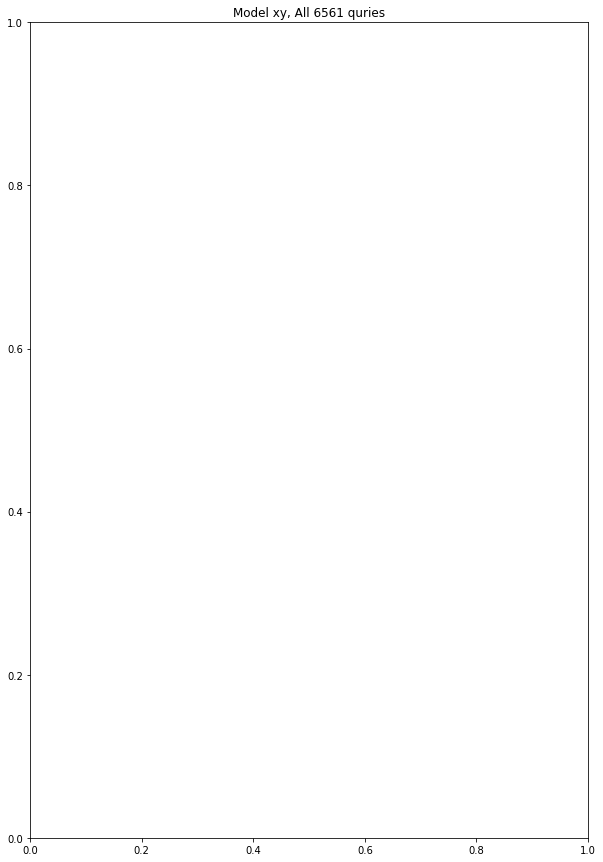

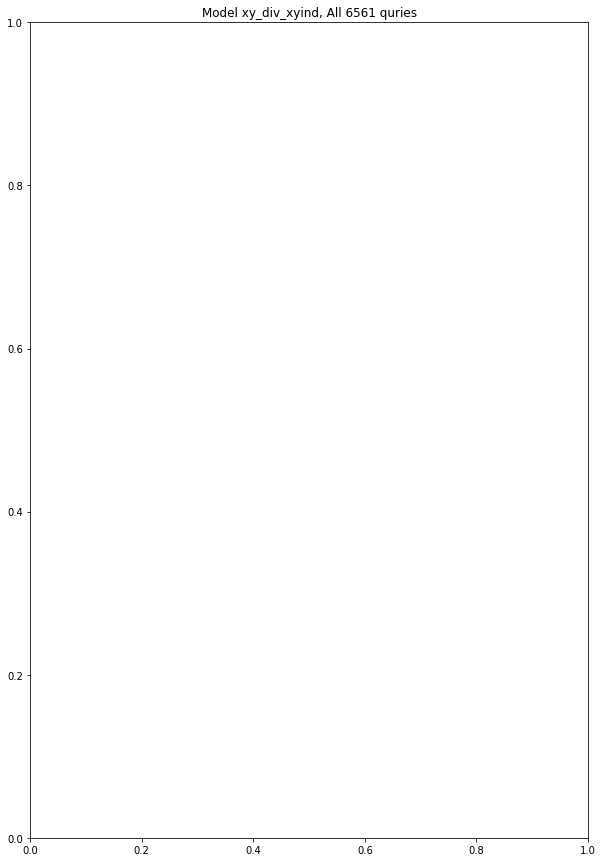

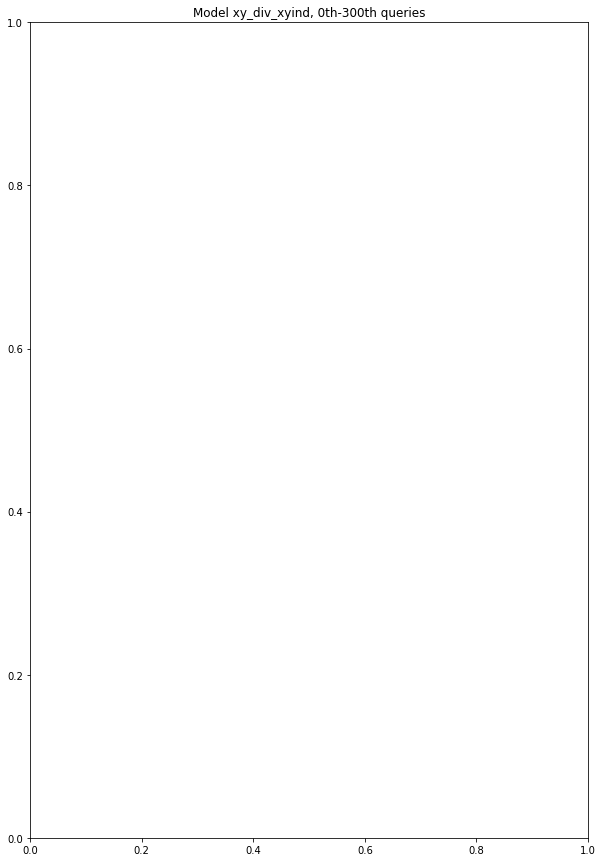

<Figure size 720x1080 with 0 Axes>

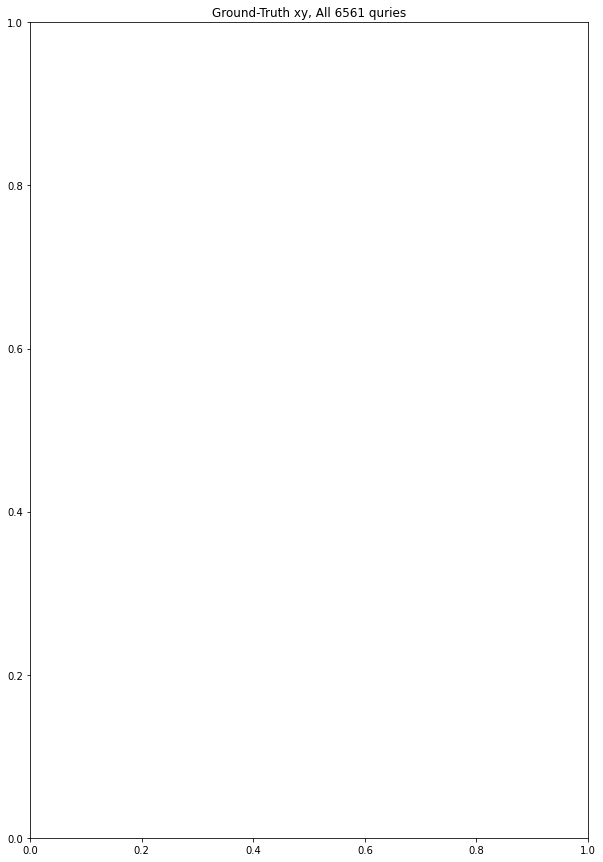

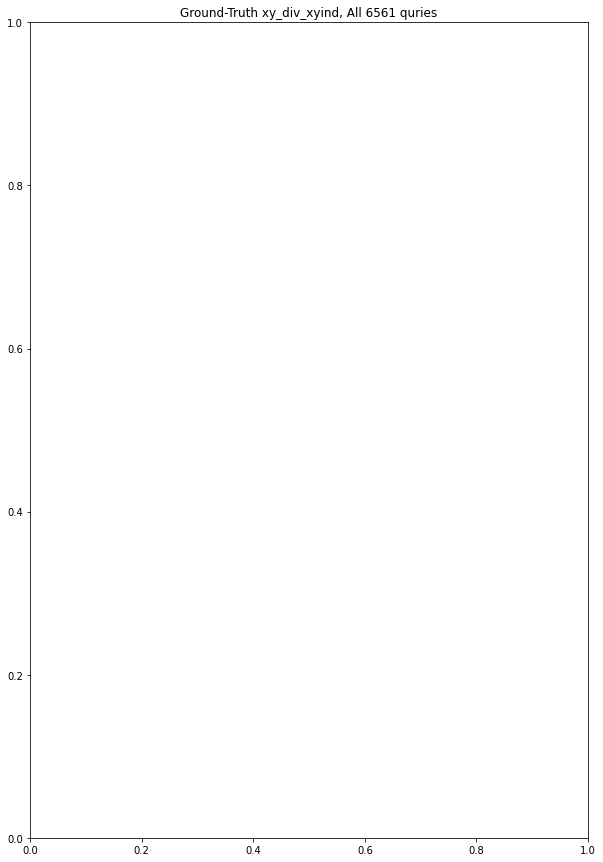

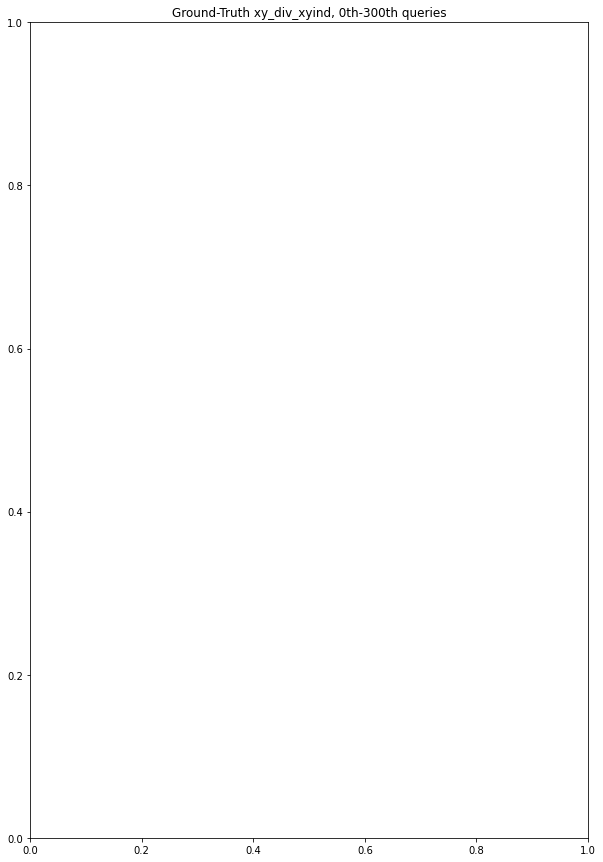

<Figure size 720x1080 with 0 Axes>

In [4]:
trainmodule, game_datamodule = main.main(args)

Sum of model logits matrix
 tensor(-0.0351)
Number of model logits with zero value
 tensor(0)
Variance of model logits
 tensor(0.0125)
SELF GT MI tensor(4.3944, dtype=torch.float64)


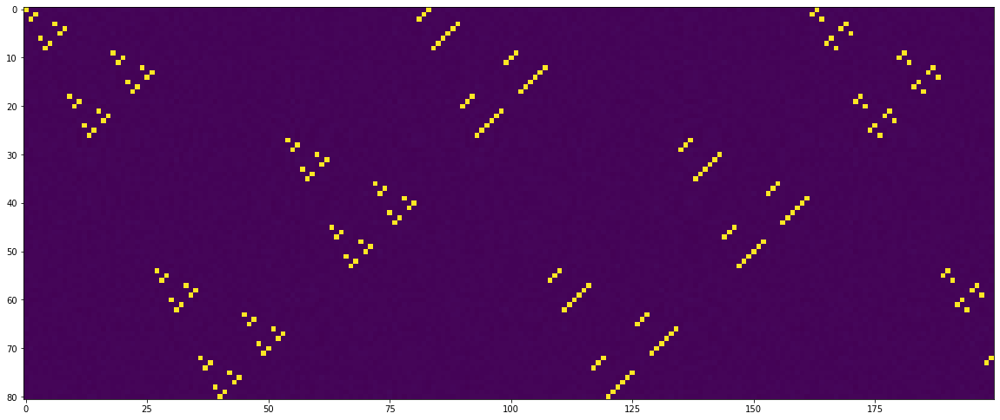

In [5]:
import matplotlib.pyplot as plt
pulled_distribution_results = trainmodule.pull_model_distribution()
xy_hat = pulled_distribution_results['xy_hat']
plt.figure(figsize=(20,10))
plt.imshow(pulled_distribution_results['xy_hat'][:,:200])

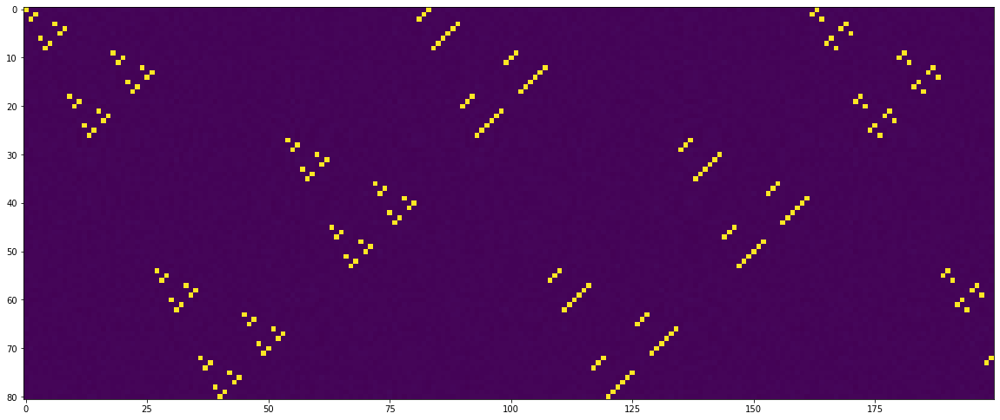

In [7]:
plt.figure(figsize=(20,10))
plt.imshow(pulled_distribution_results['xy_div_xyind_hat'][:,:200])

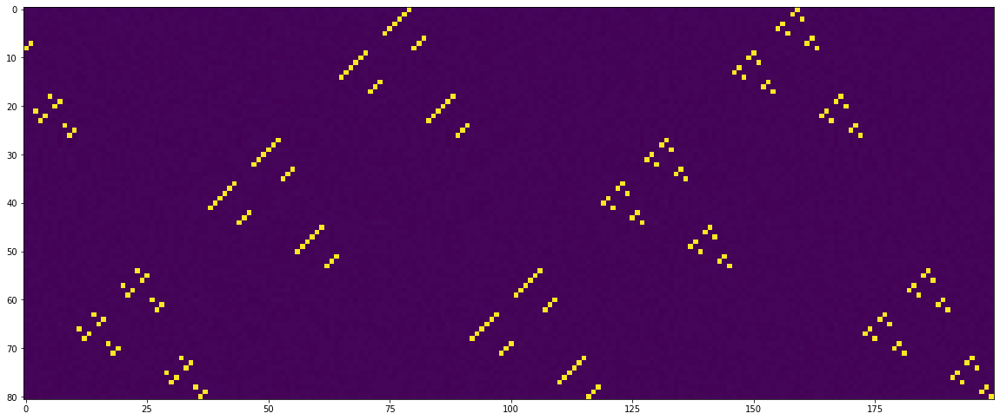

In [8]:
plt.figure(figsize=(20,10))
plt.imshow(pulled_distribution_results['xy_div_xyind_hat'][:,-200:])

In [9]:
import numpy as np
y_hat = np.sum(xy_hat, axis=0)
y_hat.shape

(6561,)

In [18]:
argmaxes = np.argmax(xy_hat, axis=0)

In [19]:
xy_argmax = np.zeros(xy_hat.shape)
for i, argmax in enumerate(argmaxes):
    try:
        xy_argmax[argmax, i] += 1
    except:
        import pdb; pdb.set_trace()

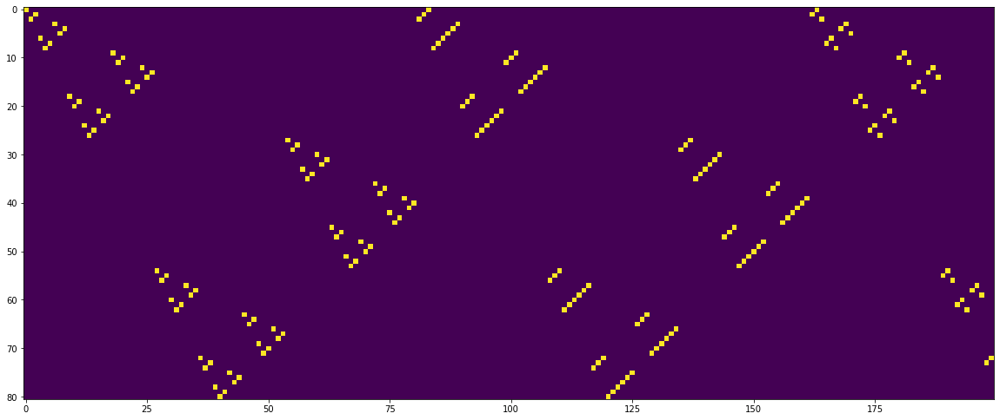

In [20]:
plt.figure(figsize=(20,10))
plt.imshow(xy_argmax[:,:200])

In [13]:
xy_hat = pulled_distribution_results['xy_hat']

In [14]:
pulled_distribution_results.keys()

dict_keys(['xy_hat', 'xy_div_xyind_hat', 'xy_hat_rank', 'xy_div_xyind_hat_rank', 'mi_gt', 'mi_hat', 'kl_div'])

In [15]:
pred = ((xy_hat / np.sum(xy_hat, axis=0)) > 1/81).astype(float)

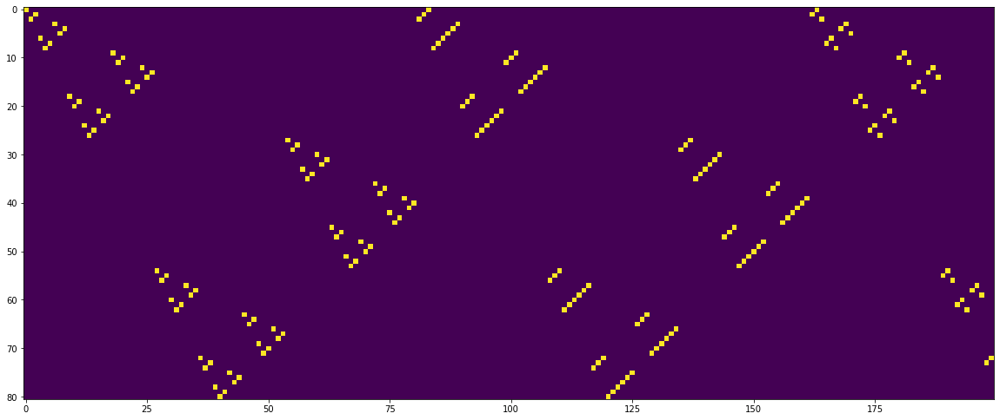

In [16]:
plt.figure(figsize=(20,10))
plt.imshow(pred[:,:200])

In [17]:
torch.softmax(trainmodule.model_logits_matrix, dim=0)

tensor([[0.0333, 0.0121, 0.0121,  ..., 0.0121, 0.0120, 0.0120],
        [0.0121, 0.0121, 0.0332,  ..., 0.0121, 0.0121, 0.0121],
        [0.0121, 0.0333, 0.0121,  ..., 0.0121, 0.0121, 0.0121],
        ...,
        [0.0120, 0.0121, 0.0121,  ..., 0.0121, 0.0333, 0.0121],
        [0.0121, 0.0121, 0.0121,  ..., 0.0333, 0.0121, 0.0120],
        [0.0120, 0.0121, 0.0121,  ..., 0.0120, 0.0121, 0.0332]])

In [19]:
1/81

0.012345679012345678

## Embedding Analysis

In [4]:
%load_ext autoreload
%autoreload 2

from dataset import PropertyBatchFetcher
from metrics import find_nn, analogy, find_cos, find_dotproduct, find_euclidean
from dataraw_sampling import decode_key_idx, encode_key_idx, decode_query_idx_to_key_properties

import matplotlib.pyplot as plt

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [5]:
game_data = main.load_data(args.data_path)
batch_fecther = PropertyBatchFetcher(
    raw_data = game_data,
    embedding_by_property = False)

---------data----------
num_attributes : 3
num_attr_vals : 4
key_support_size : 65
query_support_size : 4096
train_datapoints length : 47872
val_datapoints length : 1024
sparsity_estimate : 0.17980795755722673
num_cards_per_query : 2
vocab_size : 17
NULL : 12
SEP : 13
SOS : 14
EOS : 15
PAD : 16
-----------------------


In [6]:
# queries = [[[2,1,0], [1,1,0]], [[1,1,1], [2,2,2]], [[1,0,1], [2,0,2]]]
num_attrs = game_data['num_attributes']
num_attr_vals = game_data['num_attr_vals']
queries = [decode_query_idx_to_key_properties(num_attrs, num_attr_vals, idx) for idx in range(game_data['query_support_size'])]
keys = [decode_key_idx(num_attrs, num_attr_vals, idx) for idx in range(game_data['key_support_size'])]

X_queryId, X_keyId, X_query, X_key, X_keys = batch_fecther.make_batch_from_propertylist(queries, keys)

In [7]:
query_repr = trainmodule.model.encode_query(X_query)
query_repr.shape

torch.Size([4096, 65])

In [8]:
key_repr = trainmodule.model.encode_key(X_key)
key_repr.shape

torch.Size([65, 65])

In [9]:
# inspect closest key for each key
for i in range(game_data['key_support_size']):
    print('key:' ,decode_key_idx(game_data['num_attributes'], game_data['num_attr_vals'], i))
    print(('NNs:'))
    nns, distances = find_nn(v=key_repr[i], Wv=key_repr, similarity_fn=find_dotproduct)
    for nni, dist in zip(nns, distances):
        print(decode_key_idx(game_data['num_attributes'], game_data['num_attr_vals'], nni.item()), 'similarity=',dist.item())
    print('---------------------------')

key: [0 0 0]
NNs:
torch.Size([65])
[0 0 0] similarity= 31.869644165039062
[3 0 0] similarity= 17.340187072753906
[0 1 0] similarity= 17.169597625732422
[0 0 1] similarity= 17.058712005615234
[0 0 3] similarity= 16.363971710205078
[1 0 0] similarity= 16.011030197143555
[0 2 0] similarity= 15.851333618164062
[0 3 0] similarity= 15.664031982421875
[2 0 0] similarity= 15.364022254943848
[0 0 2] similarity= 15.083136558532715
[3 1 0] similarity= 6.519719123840332
[3 2 0] similarity= 5.971938133239746
[0 3 2] similarity= 5.789680480957031
[0 1 3] similarity= 5.759291648864746
[3 0 1] similarity= 5.550642967224121
[2 2 0] similarity= 5.431148529052734
[3 0 3] similarity= 5.3861541748046875
[1 1 0] similarity= 5.374930381774902
[1 2 0] similarity= 5.006429672241211
[0 2 1] similarity= 4.917023658752441
[0 1 1] similarity= 4.860417366027832
[0 3 1] similarity= 4.830888271331787
[0 2 3] similarity= 4.685426235198975
[2 0 1] similarity= 4.6649088859558105
[2 3 0] similarity= 4.532363414764404
[1 

[2 0 0] similarity= -1.3601899147033691
[1 3 2] similarity= -1.4448556900024414
[2 3 3] similarity= -1.5802013874053955
[2 3 2] similarity= -1.598374843597412
[3 0 3] similarity= -1.6488218307495117
[1 1 0] similarity= -1.661317229270935
[1 1 2] similarity= -1.7817119359970093
[1 0 0] similarity= -1.8416917324066162
[1 3 3] similarity= -1.9022140502929688
[2 1 0] similarity= -2.0042686462402344
[3 3 0] similarity= -2.2045061588287354
[3 1 2] similarity= -2.246978998184204
[3 1 3] similarity= -2.2494897842407227
[1 3 0] similarity= -2.519347667694092
[2 0 2] similarity= -2.6093363761901855
[1 0 2] similarity= -2.708606004714966
[2 1 3] similarity= -2.740727186203003
[3 3 2] similarity= -2.772313356399536
[2 1 2] similarity= -2.773303508758545
[3 0 2] similarity= -3.8457846641540527
[3 3 3] similarity= -4.17133092880249
[] similarity= -13.10045051574707
---------------------------
key: [0 2 2]
NNs:
torch.Size([65])
[0 2 2] similarity= 31.840471267700195
[2 2 2] similarity= 17.37890625
[0

[2 1 2] similarity= 1.0022802352905273
[2 2 1] similarity= 0.6448890566825867
[0 1 2] similarity= 0.5193004012107849
[0 1 1] similarity= 0.31262534856796265
[2 1 1] similarity= -0.31029993295669556
[3 1 1] similarity= -0.44873347878456116
[0 2 1] similarity= -0.5508999824523926
[3 3 2] similarity= -0.564468502998352
[2 1 0] similarity= -1.2105731964111328
[3 1 2] similarity= -1.352442979812622
[3 3 0] similarity= -1.3752946853637695
[2 3 0] similarity= -1.4171757698059082
[2 3 2] similarity= -1.6101787090301514
[0 1 0] similarity= -1.7422373294830322
[3 3 1] similarity= -1.8200079202651978
[2 2 2] similarity= -1.9713630676269531
[2 2 0] similarity= -2.1803085803985596
[0 2 0] similarity= -2.344435214996338
[0 3 0] similarity= -2.3502438068389893
[0 2 2] similarity= -2.6935853958129883
[3 2 0] similarity= -2.8615124225616455
[0 3 1] similarity= -3.191439628601074
[2 3 1] similarity= -3.280994415283203
[0 3 2] similarity= -3.446164131164551
[3 1 0] similarity= -3.5673227310180664
[] simi

[1 2 2] similarity= 5.475124359130859
[1 0 2] similarity= 5.120661735534668
[2 3 2] similarity= 5.039315700531006
[1 1 0] similarity= 4.981472492218018
[1 1 2] similarity= 4.950475692749023
[2 3 0] similarity= 4.939009189605713
[0 3 2] similarity= 4.696495532989502
[3 0 1] similarity= 4.308501243591309
[2 0 1] similarity= 4.2847113609313965
[3 3 0] similarity= 4.029111862182617
[3 3 2] similarity= 3.9567174911499023
[2 3 3] similarity= 3.864243984222412
[0 0 1] similarity= 3.7976326942443848
[3 3 3] similarity= 3.7849018573760986
[2 1 1] similarity= 3.7173001766204834
[1 1 3] similarity= 3.5858137607574463
[1 0 3] similarity= 2.8092308044433594
[3 1 2] similarity= 0.27894437313079834
[0 2 3] similarity= 0.06719470024108887
[3 0 2] similarity= -0.35489869117736816
[2 0 2] similarity= -0.42820000648498535
[2 2 2] similarity= -0.5759710073471069
[0 1 0] similarity= -0.6427980661392212
[2 2 0] similarity= -0.7005412578582764
[3 1 3] similarity= -0.7484105825424194
[2 2 3] similarity= -0.88

[3 1 0] similarity= 5.80207633972168
[3 0 3] similarity= 5.683771133422852
[2 3 1] similarity= 5.55417013168335
[1 1 2] similarity= 5.553643703460693
[2 0 0] similarity= 5.43215274810791
[1 1 1] similarity= 5.221269130706787
[0 1 1] similarity= 5.03802490234375
[1 3 3] similarity= 4.907129287719727
[3 1 2] similarity= 4.848753452301025
[0 3 3] similarity= 4.799087047576904
[3 1 1] similarity= 4.646190166473389
[2 2 1] similarity= 4.406339168548584
[0 2 3] similarity= 4.3872480392456055
[3 2 3] similarity= 3.951180934906006
[0 1 0] similarity= 3.016510248184204
[2 2 0] similarity= 2.8751354217529297
[0 0 2] similarity= 0.6841784715652466
[3 3 0] similarity= 0.6616724729537964
[1 0 1] similarity= 0.20102792978286743
[1 0 2] similarity= 0.16523486375808716
[0 2 2] similarity= 0.11248552799224854
[1 2 2] similarity= -0.07612895965576172
[1 0 0] similarity= -0.28595638275146484
[1 2 1] similarity= -0.4413471817970276
[3 3 1] similarity= -0.4469590187072754
[3 0 2] similarity= -0.74978160858

[0 3 2] similarity= -0.7676952481269836
[2 3 1] similarity= -0.8048644065856934
[2 3 3] similarity= -1.0446054935455322
[2 3 2] similarity= -1.1759154796600342
[2 1 3] similarity= -1.2631988525390625
[0 2 3] similarity= -1.3913260698318481
[0 1 3] similarity= -1.4187675714492798
[1 1 1] similarity= -1.590163230895996
[0 3 1] similarity= -1.6116081476211548
[0 1 1] similarity= -1.7037469148635864
[1 1 2] similarity= -1.79269278049469
[1 3 2] similarity= -1.806260108947754
[0 3 3] similarity= -1.889034628868103
[2 2 3] similarity= -2.0700395107269287
[2 1 2] similarity= -2.0733141899108887
[1 2 3] similarity= -2.122279644012451
[2 1 1] similarity= -2.1773769855499268
[1 2 2] similarity= -2.2567787170410156
[0 1 2] similarity= -2.290736198425293
[1 1 3] similarity= -2.2944891452789307
[0 2 2] similarity= -2.358140230178833
[1 2 1] similarity= -2.55063796043396
[1 3 1] similarity= -2.6416192054748535
[1 3 3] similarity= -2.7806620597839355
[2 2 1] similarity= -3.0925893783569336
[2 2 2] si

[3 2 0] similarity= 15.63850212097168
[3 1 2] similarity= 14.548859596252441
[0 2 2] similarity= 14.429425239562988
[1 2 3] similarity= 7.6987690925598145
[1 3 2] similarity= 7.3862690925598145
[2 2 3] similarity= 7.377547740936279
[2 0 2] similarity= 7.311610698699951
[2 3 2] similarity= 7.142234802246094
[1 0 2] similarity= 7.093880653381348
[3 0 3] similarity= 6.588713645935059
[2 2 0] similarity= 6.470160484313965
[2 1 2] similarity= 6.15897274017334
[2 2 1] similarity= 5.936728477478027
[3 3 3] similarity= 5.8290019035339355
[3 3 0] similarity= 5.776512622833252
[3 0 1] similarity= 5.718360900878906
[1 2 1] similarity= 5.354197978973389
[3 1 3] similarity= 5.315206050872803
[1 1 2] similarity= 5.153372764587402
[3 3 1] similarity= 4.762318134307861
[0 3 2] similarity= 4.5305495262146
[0 0 2] similarity= 4.4664201736450195
[0 1 2] similarity= 4.3674211502075195
[0 2 1] similarity= 4.202137470245361
[1 2 0] similarity= 4.004817008972168
[0 2 3] similarity= 3.333066701889038
[3 0 0] 

In [10]:
# inspect closest query for each query
# TODO

# for i in range(game_data['query_support_size']):
for i in range(1):
    print(i,'query:' ,decode_query_idx_to_key_properties(game_data['num_attributes'], game_data['num_attr_vals'], i))
    print(('NNs:\n'))
    nns, distances = find_nn(v=query_repr[i], Wv=query_repr, similarity_fn=find_dotproduct, k=10)
    for nni, dist in zip(nns, distances):
        print(decode_query_idx_to_key_properties(game_data['num_attributes'], game_data['num_attr_vals'], nni.item()), 'similarity=', dist.item())
    print('---------------------------')

0 query: [array([0, 0, 0]), array([0, 0, 0])]
NNs:

torch.Size([65])
[array([0, 0, 0]), array([0, 0, 0])] similarity= 2.3265464305877686
[array([0, 0, 2]), array([0, 0, 3])] similarity= 2.070268154144287
[array([0, 0, 0]), array([0, 0, 1])] similarity= 2.062685012817383
[array([0, 0, 0]), array([0, 0, 3])] similarity= 2.06072735786438
[array([0, 0, 1]), array([0, 0, 0])] similarity= 2.0600197315216064
[array([0, 0, 3]), array([0, 0, 2])] similarity= 2.0536763668060303
[array([0, 0, 3]), array([0, 0, 1])] similarity= 2.052751064300537
[array([0, 0, 2]), array([0, 0, 1])] similarity= 2.0526273250579834
[array([0, 0, 1]), array([0, 0, 2])] similarity= 2.0511274337768555
[array([0, 0, 3]), array([0, 0, 0])] similarity= 2.0468151569366455
---------------------------


In [11]:
# inspect closest query for each query
# TODO

# for i in range(game_data['query_support_size']):
for i in range(1):
    print(i,'query:' ,decode_query_idx_to_key_properties(game_data['num_attributes'], game_data['num_attr_vals'], i))
    print(('NNs:\n'))
    nns, distances = find_nn(v=query_repr[i], Wv=query_repr, similarity_fn=find_cos, k=10)
    for nni, dist in zip(nns, distances):
        print(decode_query_idx_to_key_properties(game_data['num_attributes'], game_data['num_attr_vals'], nni.item()), 'similarity=', dist.item())
    print('---------------------------')

0 query: [array([0, 0, 0]), array([0, 0, 0])]
NNs:

torch.Size([65])
[array([0, 0, 0]), array([0, 0, 0])] similarity= 1.0
[array([3, 0, 0]), array([0, 0, 0])] similarity= 0.7779287695884705
[array([0, 0, 0]), array([1, 0, 0])] similarity= 0.7768367528915405
[array([0, 0, 0]), array([2, 0, 0])] similarity= 0.7763843536376953
[array([2, 0, 0]), array([3, 0, 0])] similarity= 0.7758592367172241
[array([3, 0, 0]), array([2, 0, 0])] similarity= 0.7756960988044739
[array([2, 0, 0]), array([1, 0, 0])] similarity= 0.7755680084228516
[array([1, 0, 0]), array([0, 0, 0])] similarity= 0.7749804854393005
[array([1, 0, 0]), array([3, 0, 0])] similarity= 0.7735940217971802
[array([3, 0, 0]), array([1, 0, 0])] similarity= 0.7725977301597595
---------------------------


In [26]:
[0, 0, 0],([0, 0, 0]) similarity= 2.3265464305877686
[0, 0, 2],([0, 0, 3]) similarity= 2.070268154144287
[0, 0, 0],([0, 0, 1]) similarity= 2.062685012817383
[0, 0, 0],([0, 0, 3]) similarity= 2.06072735786438
[0, 0, 1],([0, 0, 0]) similarity= 2.0600197315216064
[0, 0, 3],([0, 0, 2]) similarity= 2.0536763668060303
[0, 0, 3],([0, 0, 1]) similarity= 2.052751064300537
[0, 0, 2],([0, 0, 1]) similarity= 2.0526273250579834
[0, 0, 1],([0, 0, 2]) similarity= 2.0511274337768555
[0, 0, 3],([0, 0, 0]) similarity= 2.0468151569366455

tensor([-0.2923, -0.0436, -0.3571, -0.2661,  0.1040,  0.0608, -0.0712, -0.2176,
         0.1951,  0.2713], grad_fn=<SelectBackward>)

## 1. linear analogy

In [53]:
# linear analogy for keys

# find vA 
# find vB
# find vC
# find vD

num_attrs = game_data['num_attributes']
num_attr_vals = game_data['num_attr_vals']

propertiesA = [2,2,1]
propertiesB = []
propertiesC = [0,1,3]

keyidxA = encode_key_idx(num_attrs, num_attr_vals, propertiesA)
keyidxB = encode_key_idx(num_attrs, num_attr_vals, propertiesB)
keyidxC = encode_key_idx(num_attrs, num_attr_vals, propertiesC)

print(keyidxA, keyidxB, keyidxC)

vA = key_repr[keyidxA]
vB = key_repr[keyidxB]
vC = key_repr[keyidxC]

nns_idx, nns_distances = analogy(vA, vB, vC, key_repr, similarity_fn=find_cos, k=None)
decode_key_idx(num_attrs, num_attr_vals, nns_idx[0])

41 64 7
torch.Size([65])


array([], dtype=float64)

In [16]:
# closest query for each key
found_idxs = []

for i in tqdm(range(game_data['key_support_size'])):
    key_prop = tuple(decode_key_idx(game_data['num_attributes'], game_data['num_attr_vals'], i))
    print('key:' , key_prop)
    print(('NNs:\n'))
    nns, distances = find_nn(v=key_repr[i], Wv=query_repr, similarity_fn=find_dotproduct, k=None)
    for j, (nni, dist) in enumerate(zip(nns, distances)):
        query_prop = decode_query_idx_to_key_properties(game_data['num_attributes'], game_data['num_attr_vals'], nni.item())
        query_prop = (tuple(query_prop[0]),tuple(query_prop[1]))
        if tuple(set(query_prop)) == (key_prop,):
            found_idx = j
            found_qkdist = (key_prop, query_prop, dist)
        print(f'{j} \t', query_prop, 
              dist.item())
    print(found_idx)
    found_idxs.append((found_idx, found_qkdist))
    print('---------------------------')

  0%|          | 0/65 [00:00<?, ?it/s]

key: (0, 0, 0)
NNs:

torch.Size([65])
0 	 ((3, 0, 0), (2, 0, 2)) 3.775639057159424
1 	 ((1, 2, 0), (2, 3, 0)) 3.77449893951416
2 	 ((3, 0, 3), (1, 0, 0)) 3.772352695465088
3 	 ((1, 0, 2), (0, 0, 1)) 3.7662980556488037
4 	 ((1, 0, 0), (0, 0, 1)) 3.765744924545288
5 	 ((2, 0, 1), (3, 0, 2)) 3.765381097793579
6 	 ((2, 0, 1), (0, 0, 3)) 3.7635436058044434
7 	 ((2, 0, 1), (3, 0, 0)) 3.763543128967285
8 	 ((2, 0, 0), (1, 0, 1)) 3.760666608810425
9 	 ((3, 0, 0), (0, 2, 0)) 3.7580995559692383
10 	 ((3, 3, 0), (0, 1, 0)) 3.757047653198242
11 	 ((0, 0, 2), (0, 2, 3)) 3.7566821575164795
12 	 ((3, 0, 1), (2, 0, 0)) 3.7565503120422363
13 	 ((3, 0, 3), (1, 0, 2)) 3.7562220096588135
14 	 ((3, 1, 0), (0, 2, 0)) 3.754926919937134
15 	 ((3, 3, 0), (1, 0, 0)) 3.7537543773651123
16 	 ((1, 0, 3), (0, 0, 2)) 3.7521274089813232
17 	 ((0, 3, 1), (0, 0, 0)) 3.751108407974243
18 	 ((3, 1, 0), (0, 3, 0)) 3.7508413791656494
19 	 ((0, 1, 2), (0, 3, 1)) 3.7490129470825195
20 	 ((1, 0, 0), (3, 2, 0)) 3.7488961219787

992 	 ((3, 2, 3), (1, 2, 3)) -0.6630894541740417
993 	 ((2, 2, 1), (2, 1, 1)) -0.6641103029251099
994 	 ((2, 2, 3), (0, 2, 3)) -0.6654154062271118
995 	 ((3, 2, 3), (2, 2, 3)) -0.6657264828681946
996 	 ((0, 2, 3), (3, 2, 3)) -0.6666317582130432
997 	 ((2, 2, 3), (1, 2, 3)) -0.6690823435783386
998 	 ((2, 3, 2), (2, 3, 2)) -0.6692830324172974
999 	 ((1, 2, 3), (3, 2, 3)) -0.6730003356933594
1000 	 ((1, 3, 2), (1, 3, 1)) -0.6732650399208069
1001 	 ((1, 2, 3), (2, 2, 3)) -0.6831998229026794
1002 	 ((2, 1, 1), (2, 2, 1)) -0.6873351335525513
1003 	 ((1, 3, 2), (1, 3, 3)) -0.689071774482727
1004 	 ((1, 3, 3), (1, 3, 0)) -0.6897143721580505
1005 	 ((2, 1, 1), (2, 3, 1)) -0.6917981505393982
1006 	 ((1, 3, 1), (1, 3, 0)) -0.6954021453857422
1007 	 ((2, 2, 1), (2, 3, 1)) -0.7013014554977417
1008 	 ((1, 3, 3), (1, 3, 1)) -0.7029870748519897
1009 	 ((1, 3, 0), (1, 3, 2)) -0.706688404083252
1010 	 ((2, 3, 1), (2, 1, 1)) -0.7071549892425537
1011 	 ((1, 3, 0), (1, 3, 3)) -0.7091103792190552
1012 	 ((2

2028 	 ((3, 1, 0), (2, 1, 2)) -1.4541749954223633
2029 	 ((3, 0, 2), (1, 1, 1)) -1.4541761875152588
2030 	 ((1, 3, 2), (3, 2, 0)) -1.4542155265808105
2031 	 ((0, 1, 2), (1, 1, 3)) -1.4544671773910522
2032 	 ((1, 0, 1), (2, 3, 2)) -1.4545328617095947
2033 	 ((2, 2, 3), (1, 1, 2)) -1.4546234607696533
2034 	 ((3, 1, 3), (2, 1, 0)) -1.4547195434570312
2035 	 ((3, 1, 1), (0, 1, 3)) -1.4547982215881348
2036 	 ((0, 1, 2), (2, 3, 1)) -1.4548580646514893
2037 	 ((1, 3, 3), (3, 2, 3)) -1.4549133777618408
2038 	 ((1, 2, 3), (2, 3, 1)) -1.4549649953842163
2039 	 ((2, 2, 0), (1, 1, 3)) -1.4550278186798096
2040 	 ((3, 2, 2), (0, 2, 1)) -1.4550836086273193
2041 	 ((0, 0, 3), (1, 3, 3)) -1.455179214477539
2042 	 ((1, 3, 0), (3, 1, 2)) -1.455277442932129
2043 	 ((0, 1, 2), (1, 2, 0)) -1.45530104637146
2044 	 ((1, 0, 3), (0, 2, 1)) -1.455330729484558
2045 	 ((3, 2, 0), (0, 0, 2)) -1.4553806781768799
2046 	 ((0, 3, 2), (2, 0, 1)) -1.455443263053894
2047 	 ((2, 1, 3), (0, 2, 2)) -1.4554684162139893
2048 	

3057 	 ((3, 2, 1), (0, 0, 0)) -1.516333818435669
3058 	 ((3, 2, 2), (2, 3, 3)) -1.516345739364624
3059 	 ((2, 2, 0), (3, 3, 3)) -1.5167170763015747
3060 	 ((3, 1, 2), (2, 2, 3)) -1.5168002843856812
3061 	 ((2, 3, 2), (1, 1, 3)) -1.5168101787567139
3062 	 ((2, 2, 3), (3, 0, 0)) -1.5168468952178955
3063 	 ((1, 3, 0), (3, 0, 1)) -1.5169280767440796
3064 	 ((3, 1, 3), (2, 1, 2)) -1.5169610977172852
3065 	 ((2, 1, 3), (1, 0, 0)) -1.517179012298584
3066 	 ((3, 0, 2), (0, 3, 1)) -1.5172317028045654
3067 	 ((1, 2, 1), (2, 2, 2)) -1.5174341201782227
3068 	 ((0, 1, 3), (2, 3, 0)) -1.5174884796142578
3069 	 ((2, 3, 2), (3, 1, 1)) -1.5175299644470215
3070 	 ((3, 3, 2), (0, 2, 1)) -1.5175327062606812
3071 	 ((0, 2, 2), (2, 0, 1)) -1.517538070678711
3072 	 ((2, 3, 3), (0, 0, 2)) -1.5175408124923706
3073 	 ((1, 1, 0), (2, 3, 1)) -1.517545461654663
3074 	 ((3, 2, 1), (1, 2, 0)) -1.5175888538360596
3075 	 ((2, 1, 3), (1, 3, 0)) -1.5176243782043457
3076 	 ((3, 2, 1), (2, 2, 0)) -1.5177443027496338
3077 

  2%|▏         | 1/65 [00:00<00:51,  1.23it/s]

 -1.9475510120391846
4051 	 ((2, 3, 1), (2, 0, 0)) -1.9479821920394897
4052 	 ((2, 0, 2), (2, 1, 1)) -1.9488080739974976
4053 	 ((2, 1, 3), (2, 2, 1)) -1.9489448070526123
4054 	 ((2, 2, 3), (2, 3, 1)) -1.9493041038513184
4055 	 ((2, 3, 2), (2, 2, 1)) -1.9496062994003296
4056 	 ((2, 2, 2), (2, 1, 1)) -1.9496605396270752
4057 	 ((2, 0, 2), (2, 2, 3)) -1.9512457847595215
4058 	 ((2, 1, 3), (2, 0, 2)) -1.951250433921814
4059 	 ((2, 3, 0), (2, 2, 2)) -1.9521304368972778
4060 	 ((2, 2, 0), (2, 0, 1)) -1.9568486213684082
4061 	 ((2, 1, 3), (2, 3, 2)) -1.9579684734344482
4062 	 ((2, 1, 3), (2, 3, 0)) -1.960119605064392
4063 	 ((2, 1, 1), (2, 3, 2)) -1.9621503353118896
4064 	 ((2, 1, 3), (2, 3, 1)) -1.964086890220642
4065 	 ((2, 3, 1), (2, 2, 0)) -1.9646445512771606
4066 	 ((2, 1, 1), (2, 2, 3)) -1.9656448364257812
4067 	 ((2, 2, 3), (2, 0, 0)) -1.9658759832382202
4068 	 ((2, 3, 0), (2, 2, 1)) -1.9692646265029907
4069 	 ((2, 3, 1), (2, 2, 2)) -1.9700340032577515
4070 	 ((2, 0, 2), (2, 1, 3)) -1

1013 	 ((3, 2, 3), (3, 2, 2)) -0.9689998626708984
1014 	 ((1, 0, 3), (1, 1, 3)) -0.971388041973114
1015 	 ((2, 2, 2), (3, 2, 2)) -0.9817481637001038
1016 	 ((3, 2, 2), (1, 2, 2)) -0.9831967353820801
1017 	 ((1, 2, 2), (2, 2, 2)) -0.9847612380981445
1018 	 ((1, 2, 3), (1, 0, 3)) -0.9854120016098022
1019 	 ((1, 3, 3), (1, 1, 3)) -0.9892593026161194
1020 	 ((1, 1, 3), (1, 0, 3)) -0.9902811050415039
1021 	 ((3, 2, 2), (2, 2, 2)) -1.0017828941345215
1022 	 ((1, 1, 3), (1, 3, 3)) -1.0039772987365723
1023 	 ((3, 2, 0), (3, 2, 2)) -1.0046688318252563
1024 	 ((3, 2, 2), (3, 2, 1)) -1.0073636770248413
1025 	 ((3, 2, 2), (0, 2, 2)) -1.0122137069702148
1026 	 ((1, 0, 3), (1, 3, 3)) -1.0166032314300537
1027 	 ((3, 2, 1), (3, 2, 2)) -1.0238375663757324
1028 	 ((0, 2, 2), (2, 2, 2)) -1.0251575708389282
1029 	 ((2, 2, 2), (0, 2, 2)) -1.0278000831604004
1030 	 ((1, 2, 3), (1, 3, 3)) -1.0280647277832031
1031 	 ((3, 2, 2), (3, 2, 3)) -1.0281893014907837
1032 	 ((0, 2, 2), (1, 2, 2)) -1.0314151048660278
1

1752 	 ((0, 1, 1), (3, 0, 3)) -1.5174882411956787
1753 	 ((2, 1, 1), (3, 0, 0)) -1.517843246459961
1754 	 ((0, 1, 2), (2, 3, 2)) -1.5184972286224365
1755 	 ((0, 0, 1), (2, 1, 0)) -1.5187549591064453
1756 	 ((2, 0, 2), (3, 2, 2)) -1.5190086364746094
1757 	 ((1, 0, 1), (0, 3, 2)) -1.519374966621399
1758 	 ((3, 1, 2), (3, 2, 3)) -1.5200707912445068
1759 	 ((3, 1, 1), (0, 2, 2)) -1.520151138305664
1760 	 ((1, 0, 3), (2, 1, 2)) -1.5203211307525635
1761 	 ((3, 3, 1), (3, 2, 0)) -1.5203475952148438
1762 	 ((2, 0, 2), (1, 3, 2)) -1.5204166173934937
1763 	 ((3, 0, 2), (3, 2, 1)) -1.5204468965530396
1764 	 ((0, 3, 0), (3, 2, 2)) -1.5206801891326904
1765 	 ((3, 2, 2), (1, 3, 2)) -1.5207914113998413
1766 	 ((0, 3, 2), (3, 0, 2)) -1.5210962295532227
1767 	 ((3, 3, 0), (2, 1, 0)) -1.5211129188537598
1768 	 ((2, 2, 3), (3, 1, 2)) -1.5212371349334717
1769 	 ((3, 1, 1), (0, 2, 0)) -1.5215789079666138
1770 	 ((1, 0, 2), (3, 3, 1)) -1.521925687789917
1771 	 ((3, 0, 3), (2, 3, 0)) -1.521955966949463
1772 

2852 	 ((2, 3, 2), (3, 1, 3)) -1.6353962421417236
2853 	 ((2, 2, 0), (3, 0, 3)) -1.635479211807251
2854 	 ((3, 2, 3), (2, 0, 0)) -1.6354947090148926
2855 	 ((0, 1, 0), (3, 0, 2)) -1.6355037689208984
2856 	 ((2, 0, 2), (0, 1, 1)) -1.635539174079895
2857 	 ((2, 0, 1), (3, 1, 0)) -1.635561227798462
2858 	 ((2, 2, 1), (2, 3, 3)) -1.6356092691421509
2859 	 ((1, 1, 0), (0, 2, 2)) -1.6356403827667236
2860 	 ((0, 1, 2), (2, 3, 0)) -1.635660171508789
2861 	 ((0, 0, 3), (2, 2, 2)) -1.6356829404830933
2862 	 ((3, 2, 1), (0, 1, 3)) -1.6357312202453613
2863 	 ((2, 2, 0), (0, 1, 2)) -1.635794997215271
2864 	 ((1, 3, 3), (2, 0, 1)) -1.6358064413070679
2865 	 ((2, 0, 0), (2, 3, 1)) -1.6358860731124878
2866 	 ((0, 3, 1), (3, 1, 0)) -1.6358978748321533
2867 	 ((0, 1, 3), (2, 2, 2)) -1.6359021663665771
2868 	 ((2, 2, 1), (0, 0, 2)) -1.6359281539916992
2869 	 ((2, 3, 3), (2, 1, 0)) -1.6359291076660156
2870 	 ((1, 1, 1), (2, 3, 2)) -1.6361517906188965
2871 	 ((0, 3, 1), (3, 1, 3)) -1.636245608329773
2872 	

  3%|▎         | 2/65 [00:01<00:51,  1.22it/s]

 ((0, 3, 3), (2, 2, 3)) -1.9001379013061523
3876 	 ((1, 2, 3), (3, 1, 3)) -1.9005595445632935
3877 	 ((1, 3, 3), (0, 2, 3)) -1.9011902809143066
3878 	 ((1, 2, 3), (3, 3, 3)) -1.9016540050506592
3879 	 ((0, 3, 3), (3, 2, 3)) -1.9020702838897705
3880 	 ((3, 3, 0), (2, 3, 0)) -1.9021626710891724
3881 	 ((1, 1, 3), (3, 2, 3)) -1.9031373262405396
3882 	 ((1, 3, 3), (3, 0, 3)) -1.9035563468933105
3883 	 ((3, 1, 3), (0, 0, 3)) -1.9042611122131348
3884 	 ((2, 1, 3), (1, 2, 3)) -1.9062446355819702
3885 	 ((2, 3, 0), (1, 3, 0)) -1.9072084426879883
3886 	 ((3, 0, 3), (2, 1, 3)) -1.907425880432129
3887 	 ((0, 1, 3), (1, 2, 3)) -1.9085994958877563
3888 	 ((2, 3, 3), (0, 1, 3)) -1.9088505506515503
3889 	 ((2, 2, 3), (0, 1, 3)) -1.909332275390625
3890 	 ((1, 3, 3), (2, 1, 3)) -1.9102928638458252
3891 	 ((1, 1, 3), (2, 0, 3)) -1.9111398458480835
3892 	 ((1, 2, 3), (2, 1, 3)) -1.9112324714660645
3893 	 ((0, 1, 3), (1, 0, 3)) -1.9116791486740112
3894 	 ((1, 1, 3), (0, 3, 3)) -1.911709189414978
3895 	 ((

809 	 ((2, 1, 0), (2, 1, 3)) 0.03002209961414337
810 	 ((2, 1, 1), (2, 1, 0)) 0.02981536090373993
811 	 ((2, 1, 1), (2, 1, 3)) 0.027730122208595276
812 	 ((2, 2, 1), (3, 2, 1)) 0.027162007987499237
813 	 ((3, 2, 1), (0, 2, 1)) 0.023683607578277588
814 	 ((2, 1, 3), (2, 1, 1)) 0.022476285696029663
815 	 ((2, 1, 0), (2, 1, 1)) 0.02156698703765869
816 	 ((1, 2, 1), (2, 2, 1)) 0.013486996293067932
817 	 ((2, 1, 3), (2, 1, 2)) 0.0058222562074661255
818 	 ((2, 1, 2), (2, 1, 1)) -0.0018907487392425537
819 	 ((2, 1, 2), (2, 1, 3)) -0.0036583542823791504
820 	 ((0, 2, 1), (2, 2, 1)) -0.009574532508850098
821 	 ((2, 1, 2), (2, 1, 0)) -0.01231183111667633
822 	 ((2, 1, 3), (2, 1, 0)) -0.016595035791397095
823 	 ((2, 2, 1), (1, 2, 1)) -0.01921975612640381
824 	 ((2, 1, 0), (2, 1, 2)) -0.020025521516799927
825 	 ((3, 2, 0), (3, 2, 2)) -0.02041412889957428
826 	 ((0, 2, 1), (1, 2, 1)) -0.024056807160377502
827 	 ((3, 2, 3), (3, 2, 2)) -0.025431320071220398
828 	 ((3, 2, 2), (3, 2, 1)) -0.02896282076

1877 	 ((1, 0, 3), (2, 3, 3)) -1.4778027534484863
1878 	 ((1, 2, 3), (3, 0, 3)) -1.478468894958496
1879 	 ((1, 3, 2), (1, 1, 3)) -1.478508710861206
1880 	 ((1, 0, 3), (1, 1, 2)) -1.47858464717865
1881 	 ((0, 0, 3), (3, 2, 3)) -1.4786577224731445
1882 	 ((1, 0, 1), (1, 3, 0)) -1.4787124395370483
1883 	 ((3, 3, 3), (2, 1, 3)) -1.4788365364074707
1884 	 ((2, 2, 3), (0, 1, 3)) -1.4789636135101318
1885 	 ((1, 0, 3), (1, 3, 1)) -1.47898530960083
1886 	 ((1, 2, 3), (0, 0, 3)) -1.47902512550354
1887 	 ((1, 3, 2), (1, 0, 3)) -1.4793217182159424
1888 	 ((3, 2, 3), (1, 0, 3)) -1.4794378280639648
1889 	 ((0, 0, 3), (3, 1, 3)) -1.4800974130630493
1890 	 ((3, 1, 3), (0, 2, 3)) -1.4802372455596924
1891 	 ((0, 3, 3), (3, 1, 3)) -1.4804431200027466
1892 	 ((1, 0, 1), (1, 2, 3)) -1.4809211492538452
1893 	 ((2, 3, 3), (0, 2, 3)) -1.4811328649520874
1894 	 ((1, 2, 3), (2, 3, 3)) -1.4813343286514282
1895 	 ((2, 0, 3), (1, 3, 3)) -1.481865644454956
1896 	 ((1, 2, 1), (1, 3, 3)) -1.4820382595062256
1897 	 ((

  5%|▍         | 3/65 [00:02<00:49,  1.24it/s]

 ((3, 2, 2), (1, 3, 1)) -2.0638930797576904
2936 	 ((0, 2, 1), (3, 0, 0)) -2.063936471939087
2937 	 ((3, 3, 3), (0, 1, 2)) -2.0639376640319824
2938 	 ((0, 1, 1), (1, 2, 2)) -2.0641098022460938
2939 	 ((0, 2, 0), (3, 0, 1)) -2.0641703605651855
2940 	 ((1, 3, 2), (2, 1, 3)) -2.0642826557159424
2941 	 ((0, 0, 1), (2, 1, 2)) -2.0643444061279297
2942 	 ((3, 3, 3), (0, 0, 1)) -2.064357280731201
2943 	 ((0, 3, 2), (3, 1, 3)) -2.0644495487213135
2944 	 ((2, 0, 1), (3, 3, 3)) -2.064547538757324
2945 	 ((3, 1, 1), (1, 2, 3)) -2.0645525455474854
2946 	 ((2, 1, 2), (3, 0, 1)) -2.0647573471069336
2947 	 ((0, 3, 2), (1, 0, 3)) -2.064786672592163
2948 	 ((2, 3, 0), (1, 0, 3)) -2.0649633407592773
2949 	 ((0, 1, 2), (3, 0, 1)) -2.065258502960205
2950 	 ((0, 1, 3), (3, 3, 1)) -2.0652740001678467
2951 	 ((1, 1, 3), (2, 3, 2)) -2.0652763843536377
2952 	 ((0, 1, 1), (2, 2, 0)) -2.0653743743896484
2953 	 ((0, 1, 3), (1, 0, 1)) -2.065439462661743
2954 	 ((1, 0, 1), (3, 1, 3)) -2.065497636795044
2955 	 ((1, 0

0 	 ((0, 2, 1), (0, 1, 3)) 3.802752733230591
1 	 ((0, 2, 3), (0, 0, 1)) 3.7857909202575684
2 	 ((0, 0, 2), (0, 3, 3)) 3.783026933670044
3 	 ((0, 0, 2), (0, 2, 3)) 3.781498432159424
4 	 ((0, 2, 2), (0, 0, 0)) 3.7779674530029297
5 	 ((1, 0, 0), (2, 0, 3)) 3.776756763458252
6 	 ((0, 0, 3), (0, 3, 1)) 3.7719624042510986
7 	 ((0, 3, 1), (0, 0, 0)) 3.771714687347412
8 	 ((0, 2, 1), (0, 0, 0)) 3.7675766944885254
9 	 ((0, 1, 0), (0, 3, 2)) 3.7659120559692383
10 	 ((0, 1, 1), (0, 2, 0)) 3.765270948410034
11 	 ((0, 0, 2), (0, 3, 0)) 3.7609782218933105
12 	 ((0, 2, 0), (0, 3, 1)) 3.7604684829711914
13 	 ((0, 0, 2), (0, 2, 0)) 3.7602405548095703
14 	 ((0, 3, 3), (0, 1, 0)) 3.7601723670959473
15 	 ((0, 3, 2), (0, 0, 1)) 3.7600979804992676
16 	 ((0, 3, 1), (0, 0, 3)) 3.7594361305236816
17 	 ((0, 1, 3), (2, 0, 3)) 3.756092071533203
18 	 ((0, 3, 3), (1, 1, 3)) 3.7551937103271484
19 	 ((0, 2, 3), (0, 3, 2)) 3.754818916320801
20 	 ((0, 2, 3), (0, 0, 0)) 3.7519278526306152
21 	 ((0, 1, 1), (0, 2, 2)) 3.7

1030 	 ((2, 3, 3), (2, 3, 1)) -1.054170846939087
1031 	 ((2, 3, 1), (2, 3, 2)) -1.0578144788742065
1032 	 ((2, 3, 0), (2, 3, 3)) -1.058269739151001
1033 	 ((2, 3, 2), (2, 3, 3)) -1.065558910369873
1034 	 ((2, 3, 2), (2, 0, 2)) -1.070324420928955
1035 	 ((2, 1, 2), (2, 3, 2)) -1.0733808279037476
1036 	 ((2, 0, 2), (2, 3, 2)) -1.07981538772583
1037 	 ((2, 3, 2), (2, 1, 2)) -1.0824904441833496
1038 	 ((2, 2, 2), (2, 1, 2)) -1.084594964981079
1039 	 ((2, 1, 2), (2, 2, 2)) -1.0852465629577637
1040 	 ((2, 3, 0), (2, 3, 1)) -1.0886590480804443
1041 	 ((2, 1, 2), (2, 0, 2)) -1.0937480926513672
1042 	 ((2, 3, 2), (2, 3, 0)) -1.0959577560424805
1043 	 ((3, 2, 1), (0, 2, 2)) -1.0992226600646973
1044 	 ((1, 2, 1), (2, 2, 3)) -1.10184645652771
1045 	 ((2, 3, 3), (2, 3, 0)) -1.103317141532898
1046 	 ((3, 2, 2), (0, 2, 0)) -1.1037474870681763
1047 	 ((2, 3, 3), (2, 3, 2)) -1.1117753982543945
1048 	 ((2, 2, 2), (2, 3, 2)) -1.1179659366607666
1049 	 ((0, 2, 0), (2, 2, 3)) -1.1212730407714844
1050 	 ((3

2052 	 ((1, 0, 2), (2, 3, 2)) -1.7095750570297241
2053 	 ((2, 0, 2), (1, 2, 2)) -1.70987868309021
2054 	 ((0, 0, 2), (2, 3, 2)) -1.7099504470825195
2055 	 ((2, 2, 2), (3, 3, 2)) -1.7100976705551147
2056 	 ((1, 3, 0), (3, 2, 2)) -1.7103476524353027
2057 	 ((3, 0, 2), (0, 2, 2)) -1.7107336521148682
2058 	 ((0, 2, 1), (1, 3, 3)) -1.7109404802322388
2059 	 ((0, 0, 1), (2, 1, 0)) -1.7112672328948975
2060 	 ((2, 2, 0), (2, 1, 2)) -1.712066888809204
2061 	 ((3, 0, 2), (2, 1, 1)) -1.7128628492355347
2062 	 ((3, 0, 2), (2, 1, 2)) -1.7131435871124268
2063 	 ((0, 2, 0), (1, 0, 3)) -1.7133800983428955
2064 	 ((2, 0, 3), (2, 2, 0)) -1.7134218215942383
2065 	 ((0, 0, 3), (1, 2, 2)) -1.7136040925979614
2066 	 ((2, 3, 2), (0, 0, 2)) -1.7138841152191162
2067 	 ((3, 2, 2), (0, 3, 2)) -1.7139639854431152
2068 	 ((1, 1, 0), (3, 0, 2)) -1.7143357992172241
2069 	 ((3, 3, 2), (1, 1, 2)) -1.7144250869750977
2070 	 ((2, 2, 0), (0, 1, 3)) -1.7144641876220703
2071 	 ((1, 0, 2), (0, 1, 2)) -1.7145390510559082
207

  6%|▌         | 4/65 [00:03<00:49,  1.24it/s]

-1.832979440689087
3183 	 ((3, 3, 2), (2, 2, 1)) -1.8329929113388062
3184 	 ((2, 0, 2), (1, 2, 1)) -1.8329998254776
3185 	 ((1, 2, 0), (3, 1, 2)) -1.8330638408660889
3186 	 ((2, 2, 0), (0, 0, 1)) -1.833174467086792
3187 	 ((2, 2, 2), (3, 3, 0)) -1.8333113193511963
3188 	 ((0, 0, 1), (3, 3, 2)) -1.8333568572998047
3189 	 ((2, 3, 3), (3, 0, 0)) -1.8333756923675537
3190 	 ((0, 0, 1), (1, 1, 3)) -1.833478331565857
3191 	 ((1, 2, 0), (0, 3, 3)) -1.833508014678955
3192 	 ((1, 3, 3), (2, 0, 0)) -1.8336747884750366
3193 	 ((3, 2, 0), (0, 1, 1)) -1.8337535858154297
3194 	 ((3, 0, 3), (2, 3, 2)) -1.8337610960006714
3195 	 ((3, 3, 2), (1, 2, 3)) -1.8337773084640503
3196 	 ((3, 1, 2), (0, 2, 1)) -1.833851933479309
3197 	 ((2, 1, 2), (2, 3, 1)) -1.83395254611969
3198 	 ((2, 3, 2), (3, 0, 1)) -1.8341373205184937
3199 	 ((2, 1, 3), (3, 0, 0)) -1.8343451023101807
3200 	 ((0, 3, 2), (2, 2, 3)) -1.8343662023544312
3201 	 ((3, 1, 2), (1, 2, 1)) -1.8344552516937256
3202 	 ((2, 1, 2), (3, 2, 0)) -1.8344907

165 	 ((2, 1, 0), (3, 1, 1)) 3.7194995880126953
166 	 ((0, 1, 3), (2, 1, 0)) 3.7191808223724365
167 	 ((0, 1, 0), (0, 3, 1)) 3.7191474437713623
168 	 ((1, 1, 2), (3, 1, 1)) 3.71876859664917
169 	 ((3, 1, 2), (0, 1, 3)) 3.7186663150787354
170 	 ((3, 1, 0), (0, 2, 0)) 3.7186505794525146
171 	 ((0, 1, 0), (1, 1, 2)) 3.718585729598999
172 	 ((2, 0, 0), (3, 1, 0)) 3.7178704738616943
173 	 ((2, 1, 3), (3, 1, 1)) 3.7177393436431885
174 	 ((0, 2, 2), (0, 0, 3)) 3.7175426483154297
175 	 ((2, 1, 1), (0, 1, 0)) 3.7174370288848877
176 	 ((3, 3, 0), (2, 0, 0)) 3.717165946960449
177 	 ((0, 0, 2), (0, 1, 3)) 3.716859817504883
178 	 ((0, 1, 0), (0, 2, 3)) 3.716768503189087
179 	 ((0, 2, 1), (0, 1, 0)) 3.7164652347564697
180 	 ((2, 2, 0), (1, 3, 0)) 3.7163896560668945
181 	 ((0, 1, 1), (0, 0, 3)) 3.716160297393799
182 	 ((1, 2, 0), (3, 0, 0)) 3.7161009311676025
183 	 ((0, 3, 0), (0, 2, 3)) 3.715165376663208
184 	 ((0, 2, 1), (0, 3, 0)) 3.714813709259033
185 	 ((0, 2, 0), (0, 3, 1)) 3.7147819995880127
1

1053 	 ((3, 1, 1), (2, 2, 0)) -1.1308984756469727
1054 	 ((3, 2, 3), (0, 3, 1)) -1.1317154169082642
1055 	 ((0, 3, 2), (1, 2, 0)) -1.1349204778671265
1056 	 ((1, 3, 2), (2, 2, 0)) -1.1350611448287964
1057 	 ((0, 0, 2), (2, 1, 0)) -1.1383836269378662
1058 	 ((2, 3, 3), (3, 0, 1)) -1.1419440507888794
1059 	 ((1, 3, 1), (3, 2, 2)) -1.1428301334381104
1060 	 ((1, 0, 3), (2, 2, 0)) -1.1439621448516846
1061 	 ((3, 0, 2), (1, 2, 3)) -1.1481558084487915
1062 	 ((0, 1, 2), (3, 0, 3)) -1.1512839794158936
1063 	 ((3, 1, 3), (1, 2, 1)) -1.1553637981414795
1064 	 ((3, 1, 3), (0, 0, 2)) -1.158389687538147
1065 	 ((2, 1, 3), (0, 0, 2)) -1.1597621440887451
1066 	 ((3, 2, 0), (2, 3, 1)) -1.1602002382278442
1067 	 ((0, 1, 0), (1, 3, 2)) -1.16185462474823
1068 	 ((1, 0, 3), (2, 2, 1)) -1.1619726419448853
1069 	 ((2, 2, 1), (0, 0, 0)) -1.162549614906311
1070 	 ((1, 0, 3), (3, 2, 1)) -1.163295865058899
1071 	 ((2, 3, 0), (1, 0, 1)) -1.1633838415145874
1072 	 ((2, 3, 0), (3, 2, 2)) -1.1644536256790161
1073 

2016 	 ((3, 0, 3), (0, 2, 0)) -1.264864444732666
2017 	 ((2, 3, 0), (1, 1, 1)) -1.264898419380188
2018 	 ((2, 0, 2), (0, 3, 3)) -1.2649332284927368
2019 	 ((3, 3, 0), (0, 1, 1)) -1.264958381652832
2020 	 ((2, 2, 3), (0, 3, 2)) -1.26506507396698
2021 	 ((0, 2, 1), (1, 3, 2)) -1.2652225494384766
2022 	 ((0, 0, 0), (2, 1, 2)) -1.2652852535247803
2023 	 ((0, 3, 0), (3, 0, 1)) -1.2653253078460693
2024 	 ((0, 2, 0), (3, 0, 2)) -1.265393614768982
2025 	 ((3, 0, 2), (1, 1, 3)) -1.26541268825531
2026 	 ((1, 0, 2), (0, 2, 0)) -1.2654236555099487
2027 	 ((3, 0, 2), (2, 2, 1)) -1.265424370765686
2028 	 ((2, 3, 3), (0, 2, 2)) -1.2654521465301514
2029 	 ((3, 0, 0), (2, 1, 2)) -1.2655551433563232
2030 	 ((3, 2, 2), (0, 3, 3)) -1.265564203262329
2031 	 ((0, 0, 3), (3, 2, 2)) -1.265668272972107
2032 	 ((1, 1, 1), (3, 3, 2)) -1.265706181526184
2033 	 ((2, 2, 1), (1, 3, 0)) -1.265710473060608
2034 	 ((2, 0, 2), (3, 3, 3)) -1.2657142877578735
2035 	 ((1, 0, 0), (0, 3, 2)) -1.2657203674316406
2036 	 ((3, 2

3004 	 ((0, 3, 1), (2, 3, 0)) -1.3869670629501343
3005 	 ((2, 3, 3), (1, 3, 2)) -1.3870736360549927
3006 	 ((1, 3, 1), (3, 2, 1)) -1.3870943784713745
3007 	 ((3, 3, 1), (1, 3, 0)) -1.3876005411148071
3008 	 ((1, 3, 2), (0, 3, 0)) -1.387868881225586
3009 	 ((0, 3, 0), (2, 3, 1)) -1.3881417512893677
3010 	 ((3, 2, 1), (3, 3, 2)) -1.388243317604065
3011 	 ((3, 3, 3), (1, 3, 1)) -1.3884167671203613
3012 	 ((3, 3, 2), (0, 3, 1)) -1.3895565271377563
3013 	 ((1, 3, 2), (2, 3, 0)) -1.3902299404144287
3014 	 ((2, 3, 2), (0, 3, 1)) -1.3909461498260498
3015 	 ((3, 3, 3), (0, 3, 2)) -1.3909621238708496
3016 	 ((3, 3, 2), (3, 1, 0)) -1.3920490741729736
3017 	 ((1, 3, 1), (3, 3, 0)) -1.392228603363037
3018 	 ((3, 1, 1), (1, 3, 1)) -1.3923791646957397
3019 	 ((1, 1, 1), (3, 2, 1)) -1.3930089473724365
3020 	 ((2, 3, 2), (0, 3, 3)) -1.3932901620864868
3021 	 ((1, 3, 2), (3, 3, 3)) -1.3938477039337158
3022 	 ((0, 1, 1), (1, 0, 1)) -1.3941926956176758
3023 	 ((2, 3, 3), (0, 3, 1)) -1.3943181037902832
302

  8%|▊         | 5/65 [00:04<00:49,  1.21it/s]

3953 	 ((1, 1, 1), (1, 2, 2)) -1.8637346029281616
3954 	 ((2, 0, 1), (2, 1, 3)) -1.8637419939041138
3955 	 ((2, 2, 2), (2, 1, 3)) -1.8642255067825317
3956 	 ((2, 1, 1), (2, 2, 2)) -1.8644938468933105
3957 	 ((1, 3, 1), (1, 1, 3)) -1.866012692451477
3958 	 ((1, 2, 2), (1, 0, 1)) -1.868642807006836
3959 	 ((2, 0, 1), (2, 2, 2)) -1.86882483959198
3960 	 ((2, 1, 2), (2, 2, 1)) -1.8705312013626099
3961 	 ((2, 1, 2), (2, 2, 3)) -1.8708605766296387
3962 	 ((1, 3, 3), (1, 1, 1)) -1.8725477457046509
3963 	 ((2, 1, 2), (2, 0, 3)) -1.8728070259094238
3964 	 ((2, 3, 1), (2, 0, 3)) -1.8733470439910889
3965 	 ((2, 3, 0), (2, 1, 3)) -1.8739657402038574
3966 	 ((1, 2, 1), (1, 3, 0)) -1.8741109371185303
3967 	 ((2, 0, 2), (2, 1, 0)) -1.8743410110473633
3968 	 ((1, 3, 2), (1, 0, 0)) -1.8759841918945312
3969 	 ((1, 1, 3), (1, 0, 2)) -1.8762259483337402
3970 	 ((1, 1, 3), (1, 3, 2)) -1.8768417835235596
3971 	 ((2, 0, 3), (2, 1, 0)) -1.877121090888977
3972 	 ((1, 3, 2), (1, 2, 0)) -1.877521276473999
3973 	

896 	 ((3, 3, 1), (3, 3, 2)) -0.4871174693107605
897 	 ((3, 3, 1), (3, 3, 3)) -0.49081671237945557
898 	 ((1, 1, 3), (1, 2, 3)) -0.49183744192123413
899 	 ((2, 3, 3), (1, 3, 3)) -0.4960424304008484
900 	 ((1, 3, 3), (1, 3, 0)) -0.49914586544036865
901 	 ((1, 3, 3), (1, 2, 3)) -0.5001125335693359
902 	 ((3, 3, 0), (3, 2, 0)) -0.506320595741272
903 	 ((1, 1, 3), (1, 3, 3)) -0.506751298904419
904 	 ((3, 2, 0), (3, 1, 0)) -0.5072962045669556
905 	 ((1, 3, 3), (1, 0, 3)) -0.507779598236084
906 	 ((3, 0, 0), (3, 1, 0)) -0.509692907333374
907 	 ((0, 3, 3), (1, 3, 3)) -0.5124657154083252
908 	 ((3, 3, 0), (3, 1, 0)) -0.5130126476287842
909 	 ((3, 3, 2), (3, 3, 0)) -0.5161627531051636
910 	 ((1, 3, 3), (1, 3, 1)) -0.5161776542663574
911 	 ((1, 3, 1), (1, 3, 0)) -0.5169252157211304
912 	 ((3, 1, 0), (3, 0, 0)) -0.5188108682632446
913 	 ((3, 2, 2), (1, 2, 2)) -0.5225481986999512
914 	 ((3, 2, 0), (3, 3, 0)) -0.5228061676025391
915 	 ((3, 2, 0), (3, 0, 0)) -0.5231009721755981
916 	 ((1, 2, 2), (3,

1803 	 ((3, 2, 1), (2, 3, 2)) -1.5177371501922607
1804 	 ((3, 0, 0), (0, 2, 1)) -1.5178213119506836
1805 	 ((2, 3, 0), (3, 1, 0)) -1.5179898738861084
1806 	 ((2, 2, 0), (1, 3, 2)) -1.5180271863937378
1807 	 ((3, 2, 2), (0, 2, 3)) -1.5180840492248535
1808 	 ((2, 3, 1), (0, 1, 0)) -1.5182706117630005
1809 	 ((3, 2, 3), (2, 1, 2)) -1.5185842514038086
1810 	 ((2, 0, 3), (3, 2, 2)) -1.518734335899353
1811 	 ((2, 1, 1), (3, 0, 0)) -1.518770456314087
1812 	 ((2, 3, 1), (1, 1, 2)) -1.5189979076385498
1813 	 ((1, 3, 2), (3, 1, 1)) -1.5190107822418213
1814 	 ((1, 0, 3), (0, 2, 1)) -1.519086480140686
1815 	 ((1, 3, 2), (3, 2, 0)) -1.5191835165023804
1816 	 ((0, 0, 1), (2, 3, 0)) -1.5192012786865234
1817 	 ((3, 2, 0), (1, 3, 0)) -1.5193290710449219
1818 	 ((2, 2, 0), (0, 1, 1)) -1.5196653604507446
1819 	 ((1, 3, 3), (2, 0, 2)) -1.5198761224746704
1820 	 ((1, 0, 0), (0, 2, 2)) -1.520058512687683
1821 	 ((0, 2, 0), (2, 1, 0)) -1.5205718278884888
1822 	 ((2, 3, 0), (3, 2, 1)) -1.520819902420044
1823 

2823 	 ((1, 3, 3), (0, 1, 0)) -1.6025241613388062
2824 	 ((1, 2, 2), (2, 1, 0)) -1.6025609970092773
2825 	 ((3, 2, 0), (1, 1, 1)) -1.6026082038879395
2826 	 ((1, 3, 1), (1, 2, 0)) -1.6026315689086914
2827 	 ((2, 1, 0), (0, 3, 0)) -1.6027287244796753
2828 	 ((1, 3, 1), (3, 2, 0)) -1.6027318239212036
2829 	 ((2, 2, 3), (0, 3, 2)) -1.6027851104736328
2830 	 ((1, 1, 3), (2, 0, 2)) -1.6027896404266357
2831 	 ((1, 2, 0), (2, 1, 2)) -1.6028703451156616
2832 	 ((0, 0, 2), (1, 3, 0)) -1.6029173135757446
2833 	 ((1, 3, 3), (1, 1, 0)) -1.6029406785964966
2834 	 ((1, 3, 1), (0, 1, 3)) -1.603001594543457
2835 	 ((1, 3, 3), (1, 2, 1)) -1.6030094623565674
2836 	 ((3, 1, 0), (1, 2, 2)) -1.603014349937439
2837 	 ((2, 2, 0), (3, 1, 3)) -1.60316801071167
2838 	 ((1, 2, 3), (1, 1, 1)) -1.6031787395477295
2839 	 ((3, 1, 3), (1, 3, 2)) -1.6031838655471802
2840 	 ((1, 2, 0), (0, 3, 3)) -1.6031931638717651
2841 	 ((0, 1, 0), (2, 2, 3)) -1.6032249927520752
2842 	 ((3, 0, 1), (2, 2, 3)) -1.603306531906128
2843 

  9%|▉         | 6/65 [00:04<00:49,  1.20it/s]

 -1.7406325340270996
3777 	 ((1, 2, 3), (2, 1, 3)) -1.7408095598220825
3778 	 ((3, 1, 2), (3, 0, 1)) -1.7410954236984253
3779 	 ((3, 0, 1), (3, 3, 0)) -1.741142988204956
3780 	 ((3, 0, 0), (3, 2, 2)) -1.7413309812545776
3781 	 ((3, 2, 2), (3, 1, 0)) -1.7413361072540283
3782 	 ((3, 2, 2), (3, 1, 1)) -1.7413697242736816
3783 	 ((3, 3, 3), (3, 2, 2)) -1.7423707246780396
3784 	 ((2, 0, 3), (3, 1, 3)) -1.7436197996139526
3785 	 ((0, 2, 3), (2, 0, 3)) -1.7440708875656128
3786 	 ((3, 3, 0), (3, 2, 2)) -1.744174838066101
3787 	 ((3, 1, 3), (0, 2, 3)) -1.744317650794983
3788 	 ((1, 0, 3), (3, 3, 3)) -1.7447088956832886
3789 	 ((3, 1, 1), (3, 0, 0)) -1.7452436685562134
3790 	 ((3, 0, 3), (0, 1, 3)) -1.7453752756118774
3791 	 ((2, 1, 3), (1, 0, 3)) -1.745556354522705
3792 	 ((2, 2, 3), (1, 3, 3)) -1.745808720588684
3793 	 ((3, 3, 2), (3, 0, 1)) -1.7466596364974976
3794 	 ((3, 0, 1), (3, 2, 0)) -1.7470791339874268
3795 	 ((3, 0, 2), (3, 1, 0)) -1.747619867324829
3796 	 ((3, 2, 3), (0, 0, 3)) -1.74

564 	 ((2, 3, 2), (1, 3, 2)) 3.034752130508423
565 	 ((1, 1, 2), (1, 1, 2)) 3.034597396850586
566 	 ((0, 3, 1), (0, 3, 2)) 3.0315778255462646
567 	 ((2, 1, 0), (0, 1, 0)) 3.030521869659424
568 	 ((3, 2, 2), (3, 3, 2)) 3.03031849861145
569 	 ((2, 1, 0), (2, 1, 1)) 3.0303170680999756
570 	 ((1, 2, 2), (2, 2, 2)) 3.02972412109375
571 	 ((0, 3, 3), (0, 2, 3)) 3.0288093090057373
572 	 ((3, 3, 2), (2, 3, 2)) 3.0235228538513184
573 	 ((3, 2, 2), (3, 1, 2)) 3.023380756378174
574 	 ((0, 3, 2), (0, 3, 3)) 3.023207187652588
575 	 ((3, 1, 1), (2, 1, 1)) 3.0221221446990967
576 	 ((3, 1, 3), (3, 1, 1)) 3.022017478942871
577 	 ((1, 3, 2), (3, 3, 2)) 3.0216434001922607
578 	 ((1, 3, 2), (0, 3, 2)) 3.0215373039245605
579 	 ((0, 0, 3), (0, 1, 3)) 3.0209028720855713
580 	 ((2, 1, 1), (2, 1, 0)) 3.018810749053955
581 	 ((2, 0, 2), (1, 0, 2)) 3.0187995433807373
582 	 ((0, 0, 1), (0, 3, 1)) 3.0164833068847656
583 	 ((2, 1, 1), (0, 1, 1)) 3.0140838623046875
584 	 ((1, 1, 1), (0, 1, 1)) 3.013335943222046
585 

1638 	 ((3, 0, 0), (1, 0, 2)) -1.4600486755371094
1639 	 ((1, 3, 0), (1, 2, 3)) -1.4613838195800781
1640 	 ((2, 1, 2), (2, 0, 3)) -1.4619910717010498
1641 	 ((0, 0, 1), (1, 0, 0)) -1.4620988368988037
1642 	 ((1, 2, 2), (1, 3, 3)) -1.4629946947097778
1643 	 ((1, 0, 1), (1, 2, 3)) -1.463675856590271
1644 	 ((2, 1, 3), (2, 2, 0)) -1.4647830724716187
1645 	 ((1, 1, 0), (1, 3, 1)) -1.4649467468261719
1646 	 ((1, 3, 3), (1, 0, 0)) -1.465090036392212
1647 	 ((1, 2, 1), (1, 1, 2)) -1.4657161235809326
1648 	 ((1, 3, 2), (1, 0, 0)) -1.465896725654602
1649 	 ((1, 0, 0), (1, 3, 1)) -1.4659982919692993
1650 	 ((3, 0, 2), (1, 0, 0)) -1.466044306755066
1651 	 ((1, 0, 2), (3, 0, 0)) -1.4663162231445312
1652 	 ((3, 0, 3), (1, 0, 1)) -1.4665675163269043
1653 	 ((2, 0, 0), (3, 0, 3)) -1.4676094055175781
1654 	 ((1, 0, 1), (0, 0, 0)) -1.467895269393921
1655 	 ((2, 0, 1), (1, 0, 2)) -1.4685641527175903
1656 	 ((2, 0, 3), (3, 0, 2)) -1.4689159393310547
1657 	 ((2, 3, 2), (2, 2, 1)) -1.4692937135696411
1658 

2644 	 ((3, 0, 0), (2, 2, 0)) -1.8412704467773438
2645 	 ((2, 1, 3), (0, 2, 0)) -1.841330647468567
2646 	 ((0, 2, 2), (2, 0, 1)) -1.8413887023925781
2647 	 ((3, 2, 3), (2, 1, 1)) -1.8415058851242065
2648 	 ((2, 2, 0), (0, 0, 0)) -1.8415095806121826
2649 	 ((3, 0, 0), (2, 1, 1)) -1.8415157794952393
2650 	 ((2, 2, 0), (1, 3, 2)) -1.841615915298462
2651 	 ((2, 1, 0), (3, 0, 3)) -1.8416393995285034
2652 	 ((3, 2, 0), (0, 1, 1)) -1.8416749238967896
2653 	 ((3, 3, 3), (1, 3, 1)) -1.8416937589645386
2654 	 ((3, 0, 0), (0, 3, 3)) -1.8418910503387451
2655 	 ((2, 0, 3), (0, 1, 1)) -1.8420335054397583
2656 	 ((0, 0, 1), (3, 3, 0)) -1.8420416116714478
2657 	 ((0, 2, 0), (3, 3, 0)) -1.8420934677124023
2658 	 ((3, 1, 1), (1, 2, 0)) -1.8421480655670166
2659 	 ((0, 2, 2), (3, 1, 0)) -1.8421740531921387
2660 	 ((0, 3, 2), (3, 1, 3)) -1.8421937227249146
2661 	 ((2, 2, 1), (0, 1, 0)) -1.8424997329711914
2662 	 ((1, 2, 2), (0, 1, 3)) -1.8426095247268677
2663 	 ((3, 3, 2), (2, 3, 1)) -1.8427413702011108
26

 11%|█         | 7/65 [00:05<00:48,  1.20it/s]

3634 	 ((0, 2, 0), (2, 3, 2)) -1.9165880680084229
3635 	 ((0, 3, 3), (3, 3, 2)) -1.9166982173919678
3636 	 ((0, 3, 3), (1, 1, 0)) -1.916761875152588
3637 	 ((3, 0, 0), (0, 3, 2)) -1.91691255569458
3638 	 ((0, 3, 3), (3, 2, 0)) -1.9169740676879883
3639 	 ((1, 1, 0), (2, 2, 1)) -1.9171061515808105
3640 	 ((1, 0, 1), (3, 3, 0)) -1.9171310663223267
3641 	 ((2, 2, 2), (1, 1, 3)) -1.917186975479126
3642 	 ((3, 3, 0), (0, 1, 0)) -1.917703628540039
3643 	 ((3, 0, 1), (2, 2, 3)) -1.9178709983825684
3644 	 ((1, 2, 0), (2, 0, 0)) -1.9179452657699585
3645 	 ((3, 2, 0), (2, 0, 0)) -1.9181441068649292
3646 	 ((2, 0, 2), (0, 1, 1)) -1.9185817241668701
3647 	 ((2, 1, 0), (1, 2, 3)) -1.9186359643936157
3648 	 ((1, 2, 0), (0, 3, 0)) -1.9188297986984253
3649 	 ((1, 1, 3), (2, 0, 2)) -1.9188790321350098
3650 	 ((0, 0, 1), (3, 2, 0)) -1.9189149141311646
3651 	 ((3, 0, 1), (0, 3, 0)) -1.9189701080322266
3652 	 ((2, 2, 2), (0, 1, 3)) -1.9190118312835693
3653 	 ((2, 0, 2), (3, 3, 1)) -1.9190394878387451
3654 

504 	 ((2, 0, 3), (2, 1, 3)) 3.0938901901245117
505 	 ((3, 3, 3), (1, 3, 3)) 3.091515302658081
506 	 ((2, 1, 3), (2, 3, 3)) 3.091217517852783
507 	 ((2, 1, 3), (2, 0, 3)) 3.0903098583221436
508 	 ((2, 3, 3), (1, 3, 3)) 3.088027000427246
509 	 ((3, 3, 3), (2, 3, 3)) 3.086609363555908
510 	 ((2, 2, 3), (2, 1, 3)) 3.0857906341552734
511 	 ((3, 1, 1), (2, 1, 1)) 3.084937334060669
512 	 ((0, 2, 1), (0, 0, 1)) 3.0842373371124268
513 	 ((3, 1, 2), (3, 1, 3)) 3.0836334228515625
514 	 ((3, 1, 3), (3, 1, 1)) 3.083526849746704
515 	 ((3, 1, 0), (3, 1, 3)) 3.083442211151123
516 	 ((0, 1, 0), (0, 1, 0)) 3.0833897590637207
517 	 ((3, 1, 1), (3, 1, 2)) 3.083099126815796
518 	 ((0, 3, 3), (3, 3, 3)) 3.083015203475952
519 	 ((3, 1, 0), (3, 1, 1)) 3.0813214778900146
520 	 ((3, 1, 1), (0, 1, 1)) 3.080587387084961
521 	 ((0, 0, 1), (0, 3, 1)) 3.0799784660339355
522 	 ((2, 1, 3), (2, 2, 3)) 3.0794241428375244
523 	 ((0, 0, 1), (0, 2, 1)) 3.07746958732605
524 	 ((0, 3, 3), (0, 3, 1)) 3.0772225856781006
525 

1423 	 ((3, 2, 2), (0, 2, 0)) -1.4451818466186523
1424 	 ((3, 0, 2), (3, 2, 3)) -1.4458777904510498
1425 	 ((3, 0, 0), (3, 2, 2)) -1.4459202289581299
1426 	 ((3, 0, 1), (3, 1, 3)) -1.4462130069732666
1427 	 ((3, 1, 0), (3, 0, 2)) -1.4465092420578003
1428 	 ((0, 2, 1), (1, 2, 0)) -1.446973443031311
1429 	 ((1, 2, 0), (2, 2, 3)) -1.447178602218628
1430 	 ((0, 0, 1), (2, 1, 0)) -1.447330355644226
1431 	 ((0, 3, 2), (1, 2, 0)) -1.4475586414337158
1432 	 ((3, 1, 1), (2, 2, 0)) -1.447795033454895
1433 	 ((2, 2, 2), (1, 2, 1)) -1.4480538368225098
1434 	 ((3, 3, 0), (3, 2, 3)) -1.4480783939361572
1435 	 ((3, 3, 2), (2, 1, 1)) -1.4480997323989868
1436 	 ((0, 2, 0), (3, 2, 2)) -1.448217749595642
1437 	 ((1, 1, 1), (0, 0, 3)) -1.4485024213790894
1438 	 ((3, 3, 3), (3, 1, 0)) -1.4487593173980713
1439 	 ((0, 1, 3), (2, 3, 2)) -1.449129581451416
1440 	 ((0, 1, 1), (1, 0, 0)) -1.4492788314819336
1441 	 ((1, 2, 0), (2, 2, 2)) -1.4492993354797363
1442 	 ((3, 1, 3), (3, 0, 0)) -1.4500339031219482
1443 	

2389 	 ((2, 2, 2), (0, 3, 3)) -1.5530967712402344
2390 	 ((0, 2, 0), (1, 2, 3)) -1.5531444549560547
2391 	 ((2, 3, 3), (0, 0, 0)) -1.5531768798828125
2392 	 ((3, 0, 1), (2, 1, 0)) -1.553323745727539
2393 	 ((0, 3, 2), (1, 0, 3)) -1.5533920526504517
2394 	 ((3, 2, 1), (2, 0, 0)) -1.5535593032836914
2395 	 ((1, 1, 2), (2, 0, 1)) -1.55389404296875
2396 	 ((2, 2, 0), (3, 1, 3)) -1.5539631843566895
2397 	 ((0, 1, 3), (1, 2, 2)) -1.5539815425872803
2398 	 ((0, 0, 0), (2, 1, 3)) -1.5540642738342285
2399 	 ((3, 2, 0), (0, 0, 1)) -1.5540801286697388
2400 	 ((0, 1, 3), (1, 2, 0)) -1.5541237592697144
2401 	 ((3, 1, 2), (0, 2, 1)) -1.554186463356018
2402 	 ((1, 0, 3), (2, 3, 2)) -1.5542075634002686
2403 	 ((0, 3, 0), (1, 1, 1)) -1.5542188882827759
2404 	 ((0, 1, 2), (1, 2, 1)) -1.554223895072937
2405 	 ((1, 1, 0), (2, 2, 2)) -1.5543065071105957
2406 	 ((1, 0, 0), (0, 3, 2)) -1.5543237924575806
2407 	 ((1, 3, 0), (0, 1, 2)) -1.5543442964553833
2408 	 ((3, 1, 1), (0, 3, 3)) -1.5543874502182007
2409 

 12%|█▏        | 8/65 [00:06<00:48,  1.18it/s]

-1.6763269901275635
3383 	 ((2, 0, 0), (2, 3, 3)) -1.6765327453613281
3384 	 ((2, 2, 0), (1, 0, 0)) -1.6768310070037842
3385 	 ((1, 1, 0), (1, 3, 1)) -1.6773666143417358
3386 	 ((1, 0, 0), (1, 1, 3)) -1.6773794889450073
3387 	 ((2, 1, 0), (1, 0, 3)) -1.6775950193405151
3388 	 ((1, 0, 0), (1, 3, 2)) -1.67935311794281
3389 	 ((1, 3, 0), (1, 0, 1)) -1.6799434423446655
3390 	 ((1, 3, 3), (1, 0, 1)) -1.6800782680511475
3391 	 ((1, 0, 1), (0, 3, 0)) -1.6810576915740967
3392 	 ((1, 2, 0), (2, 3, 0)) -1.6811068058013916
3393 	 ((1, 0, 0), (1, 3, 3)) -1.681444525718689
3394 	 ((1, 2, 1), (1, 0, 0)) -1.6818556785583496
3395 	 ((1, 3, 2), (1, 0, 3)) -1.6820964813232422
3396 	 ((0, 2, 0), (2, 3, 0)) -1.6827130317687988
3397 	 ((1, 3, 2), (1, 1, 1)) -1.6843688488006592
3398 	 ((1, 1, 1), (1, 0, 2)) -1.684545636177063
3399 	 ((0, 2, 0), (1, 3, 0)) -1.6852964162826538
3400 	 ((2, 1, 0), (1, 0, 0)) -1.6867601871490479
3401 	 ((1, 1, 3), (1, 2, 2)) -1.6869040727615356
3402 	 ((3, 3, 0), (0, 1, 0)) -1.6

0 	 ((2, 2, 1), (1, 2, 0)) 3.790184259414673
1 	 ((0, 2, 0), (2, 2, 1)) 3.7890055179595947
2 	 ((1, 2, 2), (0, 2, 0)) 3.7845890522003174
3 	 ((2, 2, 1), (0, 2, 2)) 3.7808024883270264
4 	 ((0, 1, 3), (0, 2, 1)) 3.7739484310150146
5 	 ((1, 2, 1), (2, 2, 3)) 3.7700178623199463
6 	 ((0, 3, 3), (0, 1, 1)) 3.767505645751953
7 	 ((3, 2, 0), (1, 2, 2)) 3.767254590988159
8 	 ((2, 2, 0), (3, 2, 1)) 3.765782356262207
9 	 ((2, 2, 0), (3, 2, 3)) 3.7633283138275146
10 	 ((0, 1, 3), (0, 3, 2)) 3.7627553939819336
11 	 ((3, 2, 0), (1, 2, 1)) 3.761477470397949
12 	 ((0, 3, 3), (0, 0, 1)) 3.761094093322754
13 	 ((1, 2, 2), (2, 2, 3)) 3.7590396404266357
14 	 ((3, 2, 1), (0, 2, 2)) 3.7561233043670654
15 	 ((0, 2, 3), (3, 2, 1)) 3.7553343772888184
16 	 ((2, 2, 3), (0, 2, 0)) 3.7534947395324707
17 	 ((1, 2, 2), (3, 2, 1)) 3.752903461456299
18 	 ((0, 2, 0), (0, 3, 3)) 3.7528092861175537
19 	 ((0, 3, 0), (0, 0, 2)) 3.75249981880188
20 	 ((0, 1, 2), (0, 0, 3)) 3.7522072792053223
21 	 ((1, 2, 0), (2, 2, 3)) 3.75

1116 	 ((0, 0, 1), (3, 3, 1)) -0.9718855023384094
1117 	 ((0, 3, 1), (3, 0, 1)) -0.9738974571228027
1118 	 ((3, 2, 1), (2, 3, 1)) -0.9742871522903442
1119 	 ((1, 1, 1), (2, 3, 1)) -0.9761204123497009
1120 	 ((3, 1, 3), (2, 1, 3)) -0.9768801927566528
1121 	 ((1, 2, 1), (2, 3, 1)) -0.9783655405044556
1122 	 ((2, 0, 1), (1, 2, 1)) -0.9785170555114746
1123 	 ((0, 3, 1), (1, 1, 1)) -0.9794225692749023
1124 	 ((1, 0, 1), (3, 3, 1)) -0.9794670343399048
1125 	 ((3, 2, 1), (2, 0, 1)) -0.9804683327674866
1126 	 ((3, 3, 1), (2, 0, 1)) -0.980705738067627
1127 	 ((1, 0, 1), (3, 1, 1)) -0.9810653924942017
1128 	 ((0, 3, 1), (3, 1, 1)) -0.9815133810043335
1129 	 ((2, 1, 1), (0, 2, 1)) -0.9817490577697754
1130 	 ((2, 2, 1), (1, 3, 1)) -0.9817824959754944
1131 	 ((0, 1, 1), (2, 2, 1)) -0.9826351404190063
1132 	 ((0, 1, 1), (1, 0, 1)) -0.9828262329101562
1133 	 ((2, 2, 1), (0, 1, 1)) -0.9832184314727783
1134 	 ((3, 2, 1), (0, 3, 1)) -0.9837523698806763
1135 	 ((0, 2, 1), (2, 0, 1)) -0.9839127659797668
1

2016 	 ((0, 1, 0), (1, 1, 2)) -1.5525329113006592
2017 	 ((1, 1, 2), (1, 2, 0)) -1.5526466369628906
2018 	 ((1, 2, 3), (1, 0, 2)) -1.552794337272644
2019 	 ((1, 3, 3), (1, 2, 2)) -1.5527961254119873
2020 	 ((2, 1, 1), (1, 1, 3)) -1.5528407096862793
2021 	 ((1, 1, 2), (2, 1, 1)) -1.5529910326004028
2022 	 ((1, 3, 3), (1, 0, 1)) -1.5531152486801147
2023 	 ((2, 2, 2), (1, 3, 2)) -1.5533726215362549
2024 	 ((1, 3, 2), (1, 2, 3)) -1.5535261631011963
2025 	 ((2, 1, 0), (0, 1, 2)) -1.5537397861480713
2026 	 ((3, 2, 2), (0, 0, 2)) -1.5538018941879272
2027 	 ((2, 1, 1), (2, 2, 0)) -1.5541645288467407
2028 	 ((1, 1, 2), (3, 3, 2)) -1.5543303489685059
2029 	 ((2, 1, 2), (2, 3, 0)) -1.5544390678405762
2030 	 ((3, 1, 3), (1, 1, 1)) -1.5546624660491943
2031 	 ((2, 3, 0), (2, 2, 2)) -1.5547378063201904
2032 	 ((3, 1, 2), (0, 1, 3)) -1.554739236831665
2033 	 ((1, 1, 0), (3, 1, 1)) -1.554762840270996
2034 	 ((2, 3, 2), (3, 0, 2)) -1.5551598072052002
2035 	 ((1, 2, 3), (1, 1, 0)) -1.555329442024231
2036

2892 	 ((0, 2, 1), (3, 0, 0)) -1.845152735710144
2893 	 ((3, 3, 0), (0, 0, 3)) -1.8452367782592773
2894 	 ((0, 1, 3), (3, 0, 0)) -1.8452627658843994
2895 	 ((1, 0, 0), (2, 3, 3)) -1.8453267812728882
2896 	 ((1, 3, 2), (2, 2, 3)) -1.845353603363037
2897 	 ((1, 3, 3), (3, 0, 0)) -1.8454972505569458
2898 	 ((2, 3, 1), (1, 2, 0)) -1.8455547094345093
2899 	 ((0, 0, 2), (2, 1, 1)) -1.8456699848175049
2900 	 ((0, 0, 2), (2, 3, 1)) -1.8458104133605957
2901 	 ((3, 2, 3), (2, 0, 2)) -1.8458633422851562
2902 	 ((3, 1, 0), (0, 3, 3)) -1.8459258079528809
2903 	 ((2, 2, 0), (1, 1, 3)) -1.845942497253418
2904 	 ((3, 1, 1), (1, 0, 3)) -1.84619140625
2905 	 ((0, 3, 0), (3, 1, 3)) -1.846553087234497
2906 	 ((1, 3, 2), (0, 0, 0)) -1.8466172218322754
2907 	 ((1, 0, 1), (2, 3, 2)) -1.8466497659683228
2908 	 ((0, 2, 1), (1, 3, 2)) -1.846752643585205
2909 	 ((0, 0, 0), (2, 3, 3)) -1.846804141998291
2910 	 ((1, 2, 1), (3, 0, 3)) -1.84710693359375
2911 	 ((0, 1, 2), (2, 3, 1)) -1.8474314212799072
2912 	 ((0, 0

 14%|█▍        | 9/65 [00:07<00:49,  1.13it/s]

3830 	 ((3, 2, 3), (0, 0, 1)) -1.9400867223739624
3831 	 ((2, 2, 2), (0, 0, 0)) -1.9400932788848877
3832 	 ((3, 0, 0), (1, 3, 2)) -1.9405019283294678
3833 	 ((3, 3, 3), (1, 2, 2)) -1.940516471862793
3834 	 ((2, 2, 3), (0, 3, 0)) -1.9405498504638672
3835 	 ((1, 0, 1), (2, 2, 2)) -1.9405834674835205
3836 	 ((0, 2, 3), (3, 3, 0)) -1.9407968521118164
3837 	 ((2, 0, 3), (0, 2, 2)) -1.9408254623413086
3838 	 ((3, 3, 3), (2, 0, 1)) -1.941025733947754
3839 	 ((2, 0, 0), (0, 2, 3)) -1.941080093383789
3840 	 ((3, 3, 2), (2, 2, 1)) -1.941104769706726
3841 	 ((1, 3, 2), (2, 2, 1)) -1.9412329196929932
3842 	 ((2, 3, 2), (1, 1, 1)) -1.9413399696350098
3843 	 ((2, 2, 2), (3, 3, 3)) -1.9414277076721191
3844 	 ((2, 0, 2), (3, 2, 3)) -1.941603183746338
3845 	 ((0, 3, 2), (3, 2, 1)) -1.9417014122009277
3846 	 ((0, 1, 3), (2, 0, 2)) -1.9417225122451782
3847 	 ((2, 2, 2), (0, 1, 3)) -1.942116379737854
3848 	 ((0, 3, 1), (2, 2, 3)) -1.9423679113388062
3849 	 ((1, 2, 1), (0, 3, 3)) -1.9424560070037842
3850 	

577 	 ((0, 1, 0), (0, 1, 2)) 3.0385262966156006
578 	 ((3, 2, 1), (3, 1, 1)) 3.0381276607513428
579 	 ((3, 2, 0), (1, 2, 0)) 3.038017749786377
580 	 ((0, 0, 0), (0, 2, 0)) 3.0376014709472656
581 	 ((3, 0, 1), (2, 0, 1)) 3.03727126121521
582 	 ((1, 3, 1), (3, 3, 1)) 3.0360774993896484
583 	 ((1, 2, 1), (1, 2, 3)) 3.0359582901000977
584 	 ((3, 3, 1), (1, 3, 1)) 3.0355677604675293
585 	 ((1, 2, 0), (1, 2, 3)) 3.035156726837158
586 	 ((3, 1, 1), (3, 0, 1)) 3.0347862243652344
587 	 ((0, 0, 3), (0, 1, 3)) 3.034625768661499
588 	 ((0, 0, 1), (2, 0, 1)) 3.033450126647949
589 	 ((0, 3, 1), (1, 3, 1)) 3.032665967941284
590 	 ((0, 1, 2), (0, 1, 3)) 3.032447576522827
591 	 ((0, 3, 1), (2, 3, 1)) 3.0316944122314453
592 	 ((2, 1, 1), (2, 3, 1)) 3.0310161113739014
593 	 ((0, 3, 2), (0, 2, 2)) 3.0308334827423096
594 	 ((2, 3, 1), (1, 3, 1)) 3.029132127761841
595 	 ((1, 3, 1), (0, 3, 1)) 3.0286760330200195
596 	 ((0, 0, 2), (0, 1, 2)) 3.027301788330078
597 	 ((1, 2, 2), (1, 2, 0)) 3.02718186378479
598 

1571 	 ((0, 2, 0), (1, 0, 0)) -1.410623550415039
1572 	 ((1, 2, 0), (1, 3, 3)) -1.411068081855774
1573 	 ((0, 0, 2), (1, 0, 1)) -1.4113385677337646
1574 	 ((3, 0, 3), (2, 0, 2)) -1.4114917516708374
1575 	 ((3, 3, 2), (3, 2, 3)) -1.411508321762085
1576 	 ((3, 1, 0), (3, 2, 1)) -1.411679983139038
1577 	 ((2, 0, 3), (0, 0, 0)) -1.4121683835983276
1578 	 ((0, 0, 3), (3, 0, 1)) -1.4132331609725952
1579 	 ((3, 2, 0), (1, 0, 0)) -1.4135568141937256
1580 	 ((1, 0, 3), (0, 0, 1)) -1.4135830402374268
1581 	 ((0, 0, 0), (2, 0, 2)) -1.4142510890960693
1582 	 ((3, 1, 0), (1, 0, 0)) -1.4143149852752686
1583 	 ((1, 2, 3), (1, 3, 2)) -1.4143482446670532
1584 	 ((0, 1, 0), (1, 3, 0)) -1.4144256114959717
1585 	 ((1, 0, 3), (0, 0, 2)) -1.4144647121429443
1586 	 ((1, 1, 0), (1, 3, 3)) -1.414562463760376
1587 	 ((1, 1, 0), (2, 2, 0)) -1.4147701263427734
1588 	 ((1, 1, 0), (3, 0, 0)) -1.4148874282836914
1589 	 ((3, 3, 0), (1, 1, 0)) -1.4149529933929443
1590 	 ((0, 0, 0), (1, 3, 0)) -1.4153772592544556
1591 

2556 	 ((3, 0, 0), (2, 3, 3)) -1.9565064907073975
2557 	 ((2, 2, 2), (3, 1, 0)) -1.9572861194610596
2558 	 ((1, 3, 3), (3, 2, 0)) -1.9572913646697998
2559 	 ((2, 1, 0), (1, 3, 1)) -1.9573062658309937
2560 	 ((2, 3, 2), (0, 1, 1)) -1.957456111907959
2561 	 ((1, 0, 2), (2, 2, 0)) -1.9578607082366943
2562 	 ((0, 3, 1), (2, 0, 2)) -1.9579399824142456
2563 	 ((2, 1, 1), (3, 3, 2)) -1.9579659700393677
2564 	 ((1, 3, 3), (0, 0, 2)) -1.9582781791687012
2565 	 ((1, 1, 0), (3, 0, 2)) -1.9583792686462402
2566 	 ((0, 3, 3), (3, 1, 0)) -1.958848476409912
2567 	 ((3, 1, 3), (1, 2, 1)) -1.9588932991027832
2568 	 ((3, 1, 1), (0, 2, 2)) -1.958936333656311
2569 	 ((3, 3, 2), (0, 1, 3)) -1.9592169523239136
2570 	 ((1, 2, 2), (0, 3, 0)) -1.9597078561782837
2571 	 ((0, 1, 1), (3, 0, 3)) -1.959720253944397
2572 	 ((2, 1, 3), (0, 3, 0)) -1.9598267078399658
2573 	 ((2, 0, 1), (3, 2, 0)) -1.9599047899246216
2574 	 ((1, 2, 1), (3, 1, 2)) -1.9600191116333008
2575 	 ((3, 3, 1), (2, 0, 0)) -1.960115671157837
2576 

 15%|█▌        | 10/65 [00:08<00:48,  1.14it/s]

3630 	 ((0, 3, 3), (1, 2, 1)) -2.0984420776367188
3631 	 ((0, 3, 0), (2, 2, 2)) -2.0985233783721924
3632 	 ((2, 2, 2), (0, 0, 3)) -2.0986995697021484
3633 	 ((1, 0, 0), (2, 3, 2)) -2.0990138053894043
3634 	 ((2, 2, 1), (1, 0, 0)) -2.0990583896636963
3635 	 ((3, 1, 0), (1, 2, 1)) -2.09908390045166
3636 	 ((0, 1, 2), (1, 0, 1)) -2.099165916442871
3637 	 ((2, 0, 2), (3, 2, 3)) -2.099174976348877
3638 	 ((0, 1, 1), (3, 2, 3)) -2.099367618560791
3639 	 ((0, 1, 1), (1, 2, 3)) -2.099493980407715
3640 	 ((3, 1, 0), (0, 3, 2)) -2.099546194076538
3641 	 ((3, 3, 2), (0, 2, 0)) -2.0998904705047607
3642 	 ((3, 0, 1), (0, 2, 0)) -2.100076198577881
3643 	 ((2, 0, 0), (3, 3, 2)) -2.100188732147217
3644 	 ((2, 0, 0), (0, 1, 1)) -2.100217819213867
3645 	 ((2, 0, 3), (0, 3, 2)) -2.100290298461914
3646 	 ((2, 3, 0), (3, 0, 3)) -2.100438117980957
3647 	 ((3, 3, 0), (0, 1, 3)) -2.100447416305542
3648 	 ((2, 0, 1), (3, 1, 0)) -2.1005189418792725
3649 	 ((1, 1, 1), (2, 2, 0)) -2.10054874420166
3650 	 ((3, 3, 

388 	 ((0, 2, 1), (0, 0, 3)) 3.662339687347412
389 	 ((2, 2, 2), (3, 2, 1)) 3.6607441902160645
390 	 ((0, 1, 1), (0, 2, 0)) 3.6596529483795166
391 	 ((0, 1, 3), (0, 3, 2)) 3.659186840057373
392 	 ((3, 2, 1), (0, 2, 3)) 3.658834457397461
393 	 ((0, 1, 1), (0, 2, 3)) 3.656986713409424
394 	 ((0, 2, 0), (0, 1, 2)) 3.6562416553497314
395 	 ((0, 2, 2), (0, 0, 3)) 3.655003547668457
396 	 ((0, 1, 2), (0, 0, 1)) 3.6549346446990967
397 	 ((0, 0, 2), (0, 1, 1)) 3.6538212299346924
398 	 ((0, 1, 2), (2, 3, 2)) 3.6528563499450684
399 	 ((2, 2, 2), (0, 0, 2)) 3.652656078338623
400 	 ((3, 1, 2), (1, 3, 2)) 3.6517698764801025
401 	 ((0, 1, 3), (0, 3, 0)) 3.6500964164733887
402 	 ((3, 2, 1), (0, 2, 0)) 3.6495416164398193
403 	 ((2, 2, 3), (1, 2, 2)) 3.6489481925964355
404 	 ((3, 2, 1), (1, 2, 2)) 3.6481993198394775
405 	 ((2, 1, 2), (1, 0, 2)) 3.6477150917053223
406 	 ((1, 2, 0), (3, 2, 1)) 3.646298408508301
407 	 ((0, 2, 2), (0, 0, 0)) 3.645582914352417
408 	 ((0, 0, 3), (0, 2, 1)) 3.644862651824951
4

1451 	 ((1, 3, 2), (1, 1, 3)) -1.2265616655349731
1452 	 ((2, 1, 1), (1, 1, 0)) -1.2271473407745361
1453 	 ((1, 2, 0), (1, 1, 3)) -1.2272937297821045
1454 	 ((2, 1, 0), (2, 2, 2)) -1.2295328378677368
1455 	 ((1, 0, 2), (1, 3, 0)) -1.2298157215118408
1456 	 ((2, 3, 0), (2, 2, 3)) -1.2299699783325195
1457 	 ((1, 0, 1), (1, 2, 3)) -1.230067491531372
1458 	 ((3, 1, 3), (0, 1, 0)) -1.2301383018493652
1459 	 ((2, 2, 0), (2, 1, 1)) -1.230219841003418
1460 	 ((1, 1, 0), (1, 2, 1)) -1.230647325515747
1461 	 ((1, 0, 2), (1, 1, 0)) -1.2306814193725586
1462 	 ((1, 1, 3), (1, 2, 0)) -1.2307496070861816
1463 	 ((1, 1, 1), (1, 2, 0)) -1.230755090713501
1464 	 ((1, 3, 3), (1, 0, 2)) -1.2309181690216064
1465 	 ((0, 1, 3), (1, 1, 0)) -1.2312190532684326
1466 	 ((1, 1, 0), (3, 1, 1)) -1.231450080871582
1467 	 ((1, 3, 0), (1, 0, 3)) -1.2318661212921143
1468 	 ((2, 3, 0), (2, 1, 3)) -1.2319912910461426
1469 	 ((1, 3, 1), (1, 2, 2)) -1.232912540435791
1470 	 ((2, 1, 3), (3, 1, 2)) -1.2337005138397217
1471 	

2396 	 ((3, 0, 1), (1, 2, 3)) -2.038201332092285
2397 	 ((2, 2, 0), (0, 1, 3)) -2.0402519702911377
2398 	 ((2, 3, 3), (0, 2, 0)) -2.0402936935424805
2399 	 ((2, 1, 3), (0, 0, 2)) -2.0426199436187744
2400 	 ((1, 0, 3), (2, 2, 2)) -2.042865514755249
2401 	 ((3, 2, 0), (0, 3, 2)) -2.04422664642334
2402 	 ((2, 1, 0), (0, 2, 1)) -2.0451700687408447
2403 	 ((0, 3, 3), (1, 2, 2)) -2.045654058456421
2404 	 ((0, 1, 1), (1, 3, 2)) -2.0464441776275635
2405 	 ((0, 2, 0), (1, 0, 3)) -2.0465152263641357
2406 	 ((0, 1, 0), (1, 2, 3)) -2.048553705215454
2407 	 ((1, 1, 1), (0, 0, 3)) -2.049057960510254
2408 	 ((2, 0, 2), (1, 2, 3)) -2.049072504043579
2409 	 ((3, 2, 1), (0, 3, 0)) -2.04939866065979
2410 	 ((1, 0, 3), (2, 2, 0)) -2.049489974975586
2411 	 ((0, 1, 1), (1, 0, 0)) -2.0513229370117188
2412 	 ((1, 2, 3), (3, 3, 0)) -2.0523600578308105
2413 	 ((3, 1, 2), (0, 2, 0)) -2.0544562339782715
2414 	 ((0, 0, 0), (2, 2, 1)) -2.0551161766052246
2415 	 ((1, 3, 2), (3, 1, 1)) -2.0556023120880127
2416 	 ((3,

 17%|█▋        | 11/65 [00:09<00:47,  1.14it/s]

3301 	 ((1, 1, 2), (2, 2, 1)) -2.2372734546661377
3302 	 ((1, 3, 0), (0, 2, 3)) -2.237457275390625
3303 	 ((0, 3, 1), (2, 2, 2)) -2.237478494644165
3304 	 ((3, 1, 3), (0, 3, 0)) -2.23775315284729
3305 	 ((3, 1, 2), (2, 0, 0)) -2.2378642559051514
3306 	 ((1, 1, 0), (3, 2, 2)) -2.238060712814331
3307 	 ((0, 3, 2), (3, 1, 1)) -2.238107919692993
3308 	 ((3, 0, 3), (1, 2, 2)) -2.238300323486328
3309 	 ((1, 0, 3), (3, 1, 2)) -2.23838210105896
3310 	 ((1, 0, 1), (0, 2, 0)) -2.2384305000305176
3311 	 ((1, 1, 3), (3, 2, 1)) -2.2385966777801514
3312 	 ((1, 2, 2), (2, 3, 1)) -2.238675355911255
3313 	 ((0, 3, 2), (2, 1, 3)) -2.2388219833374023
3314 	 ((2, 0, 0), (1, 1, 3)) -2.2388482093811035
3315 	 ((1, 3, 2), (0, 0, 1)) -2.2392258644104004
3316 	 ((1, 2, 3), (3, 1, 1)) -2.239321708679199
3317 	 ((2, 0, 1), (1, 3, 0)) -2.239332437515259
3318 	 ((2, 3, 2), (1, 1, 3)) -2.23982834815979
3319 	 ((3, 2, 2), (0, 0, 3)) -2.2398366928100586
3320 	 ((2, 0, 0), (3, 3, 2)) -2.2398645877838135
3321 	 ((1, 2,

4 	 ((0, 0, 2), (0, 3, 3)) 3.7985897064208984
5 	 ((3, 3, 3), (2, 2, 3)) 3.792515993118286
6 	 ((3, 2, 3), (1, 0, 3)) 3.7894763946533203
7 	 ((0, 3, 3), (1, 1, 3)) 3.7893171310424805
8 	 ((2, 2, 3), (3, 2, 2)) 3.788811683654785
9 	 ((0, 0, 3), (2, 2, 3)) 3.787971258163452
10 	 ((0, 2, 3), (3, 3, 3)) 3.786190986633301
11 	 ((2, 2, 1), (0, 2, 2)) 3.785078287124634
12 	 ((1, 2, 2), (2, 2, 3)) 3.784939765930176
13 	 ((1, 3, 3), (2, 2, 3)) 3.7847506999969482
14 	 ((3, 2, 0), (2, 2, 2)) 3.7839150428771973
15 	 ((0, 1, 0), (0, 3, 2)) 3.783723831176758
16 	 ((2, 2, 3), (3, 0, 3)) 3.782888650894165
17 	 ((3, 1, 3), (0, 2, 3)) 3.7791404724121094
18 	 ((0, 2, 1), (2, 2, 2)) 3.7774624824523926
19 	 ((0, 3, 2), (0, 0, 1)) 3.7766294479370117
20 	 ((3, 2, 1), (1, 2, 3)) 3.7755484580993652
21 	 ((0, 0, 1), (0, 2, 2)) 3.7734551429748535
22 	 ((0, 2, 1), (2, 2, 3)) 3.772789478302002
23 	 ((0, 1, 3), (2, 0, 3)) 3.7720346450805664
24 	 ((2, 2, 1), (1, 2, 2)) 3.7690584659576416
25 	 ((3, 2, 0), (1, 2, 1)) 

1107 	 ((3, 2, 1), (0, 3, 1)) -0.9978000521659851
1108 	 ((2, 1, 1), (3, 2, 1)) -0.9979528188705444
1109 	 ((0, 2, 1), (2, 3, 1)) -0.998100757598877
1110 	 ((2, 2, 1), (1, 1, 1)) -0.9983086585998535
1111 	 ((1, 2, 1), (2, 1, 1)) -0.9985936880111694
1112 	 ((0, 0, 1), (3, 2, 1)) -0.9987000823020935
1113 	 ((1, 2, 1), (3, 0, 1)) -1.0005683898925781
1114 	 ((2, 1, 1), (1, 2, 1)) -1.0018328428268433
1115 	 ((2, 0, 1), (3, 3, 1)) -1.0023434162139893
1116 	 ((0, 0, 1), (3, 3, 1)) -1.0027297735214233
1117 	 ((3, 0, 1), (0, 3, 1)) -1.0031383037567139
1118 	 ((1, 2, 1), (2, 0, 1)) -1.0039920806884766
1119 	 ((1, 3, 1), (2, 0, 1)) -1.0041252374649048
1120 	 ((2, 2, 1), (0, 0, 1)) -1.0058367252349854
1121 	 ((1, 2, 1), (3, 1, 1)) -1.0059056282043457
1122 	 ((0, 3, 1), (1, 1, 1)) -1.006479263305664
1123 	 ((0, 1, 1), (2, 3, 1)) -1.006649136543274
1124 	 ((0, 0, 1), (1, 2, 1)) -1.0068461894989014
1125 	 ((3, 0, 1), (2, 1, 1)) -1.0069466829299927
1126 	 ((2, 3, 1), (3, 1, 1)) -1.009190559387207
1127

2040 	 ((2, 3, 3), (3, 3, 1)) -1.4128061532974243
2041 	 ((3, 3, 1), (1, 3, 3)) -1.4131935834884644
2042 	 ((0, 0, 2), (2, 0, 1)) -1.4133816957473755
2043 	 ((3, 3, 2), (2, 3, 1)) -1.4147464036941528
2044 	 ((2, 3, 3), (0, 3, 0)) -1.4150171279907227
2045 	 ((3, 0, 2), (0, 0, 3)) -1.4150227308273315
2046 	 ((3, 1, 0), (0, 0, 0)) -1.4150307178497314
2047 	 ((0, 3, 0), (1, 3, 2)) -1.4153205156326294
2048 	 ((2, 3, 2), (1, 3, 3)) -1.4155910015106201
2049 	 ((0, 3, 3), (3, 3, 2)) -1.4159765243530273
2050 	 ((1, 3, 2), (3, 3, 3)) -1.4161474704742432
2051 	 ((2, 0, 2), (2, 1, 3)) -1.4161746501922607
2052 	 ((2, 3, 0), (3, 3, 3)) -1.416189432144165
2053 	 ((1, 0, 0), (0, 0, 1)) -1.416410207748413
2054 	 ((1, 0, 0), (0, 3, 0)) -1.417180061340332
2055 	 ((2, 1, 0), (3, 0, 0)) -1.4177312850952148
2056 	 ((1, 3, 0), (0, 3, 1)) -1.4184024333953857
2057 	 ((0, 3, 3), (2, 3, 1)) -1.4185869693756104
2058 	 ((0, 2, 0), (3, 3, 0)) -1.4190146923065186
2059 	 ((1, 2, 0), (3, 3, 0)) -1.4192805290222168
206

 18%|█▊        | 12/65 [00:10<00:45,  1.17it/s]

3089 	 ((2, 3, 2), (0, 2, 0)) -2.2005934715270996
3090 	 ((1, 1, 0), (3, 0, 3)) -2.200652837753296
3091 	 ((0, 1, 1), (1, 2, 0)) -2.200666904449463
3092 	 ((1, 1, 3), (2, 0, 2)) -2.200827121734619
3093 	 ((3, 1, 3), (2, 0, 1)) -2.2008469104766846
3094 	 ((1, 0, 1), (3, 3, 0)) -2.200867176055908
3095 	 ((0, 1, 1), (1, 3, 3)) -2.20092511177063
3096 	 ((3, 3, 2), (0, 2, 1)) -2.201087236404419
3097 	 ((0, 0, 2), (2, 3, 0)) -2.201087474822998
3098 	 ((3, 1, 0), (2, 3, 2)) -2.2014145851135254
3099 	 ((3, 2, 1), (2, 3, 3)) -2.201486587524414
3100 	 ((2, 2, 1), (0, 0, 2)) -2.2015206813812256
3101 	 ((0, 0, 1), (3, 1, 2)) -2.2016353607177734
3102 	 ((1, 2, 0), (3, 1, 2)) -2.2020368576049805
3103 	 ((0, 1, 3), (1, 2, 1)) -2.2020699977874756
3104 	 ((3, 0, 0), (2, 1, 3)) -2.2020761966705322
3105 	 ((0, 1, 2), (2, 3, 1)) -2.202322483062744
3106 	 ((0, 2, 0), (1, 0, 1)) -2.202328681945801
3107 	 ((0, 2, 2), (1, 0, 3)) -2.2025017738342285
3108 	 ((1, 3, 2), (2, 1, 1)) -2.202571392059326
3109 	 ((1, 

0 	 ((0, 2, 0), (0, 3, 2)) 3.796663522720337
1 	 ((0, 2, 2), (0, 1, 0)) 3.7939624786376953
2 	 ((0, 0, 2), (0, 1, 3)) 3.7891435623168945
3 	 ((3, 0, 0), (1, 3, 0)) 3.7869958877563477
4 	 ((0, 1, 3), (0, 0, 0)) 3.781174421310425
5 	 ((0, 1, 0), (0, 2, 1)) 3.780866861343384
6 	 ((0, 3, 3), (0, 1, 1)) 3.774590492248535
7 	 ((0, 0, 2), (0, 2, 3)) 3.7744250297546387
8 	 ((0, 0, 2), (0, 1, 1)) 3.7728888988494873
9 	 ((0, 1, 1), (0, 0, 3)) 3.7709455490112305
10 	 ((0, 0, 0), (0, 2, 2)) 3.7704861164093018
11 	 ((3, 1, 0), (0, 2, 0)) 3.7699801921844482
12 	 ((0, 2, 3), (0, 1, 2)) 3.769782066345215
13 	 ((0, 2, 0), (0, 1, 2)) 3.7661783695220947
14 	 ((0, 1, 0), (0, 0, 3)) 3.76576566696167
15 	 ((0, 1, 3), (0, 3, 2)) 3.765072822570801
16 	 ((0, 2, 2), (0, 3, 3)) 3.763453960418701
17 	 ((0, 0, 3), (0, 2, 1)) 3.762434959411621
18 	 ((0, 0, 2), (0, 1, 0)) 3.7609801292419434
19 	 ((0, 3, 2), (0, 2, 3)) 3.7603983879089355
20 	 ((0, 2, 3), (0, 3, 2)) 3.7599947452545166
21 	 ((0, 3, 1), (0, 1, 3)) 3.759

1112 	 ((1, 0, 1), (2, 3, 1)) -1.2814490795135498
1113 	 ((0, 0, 1), (3, 2, 1)) -1.2815837860107422
1114 	 ((2, 1, 1), (1, 0, 1)) -1.282144546508789
1115 	 ((3, 0, 3), (3, 1, 3)) -1.2828326225280762
1116 	 ((3, 3, 1), (1, 0, 1)) -1.2835477590560913
1117 	 ((1, 2, 1), (2, 1, 1)) -1.2838915586471558
1118 	 ((1, 0, 1), (0, 2, 1)) -1.2855846881866455
1119 	 ((1, 3, 1), (3, 2, 1)) -1.2862792015075684
1120 	 ((1, 2, 1), (0, 1, 1)) -1.2865545749664307
1121 	 ((2, 2, 1), (1, 0, 1)) -1.2874759435653687
1122 	 ((3, 0, 1), (2, 2, 1)) -1.2881312370300293
1123 	 ((0, 2, 1), (3, 0, 1)) -1.2885948419570923
1124 	 ((1, 0, 1), (0, 1, 1)) -1.2899985313415527
1125 	 ((3, 0, 1), (0, 3, 1)) -1.290421724319458
1126 	 ((1, 3, 1), (2, 0, 1)) -1.2904958724975586
1127 	 ((0, 2, 1), (2, 3, 1)) -1.2905770540237427
1128 	 ((1, 0, 1), (2, 1, 1)) -1.290781855583191
1129 	 ((2, 3, 1), (0, 0, 1)) -1.2910476922988892
1130 	 ((0, 3, 1), (1, 2, 1)) -1.2933151721954346
1131 	 ((3, 3, 3), (3, 2, 3)) -1.2941347360610962
113

2202 	 ((1, 3, 0), (2, 1, 3)) -1.4618253707885742
2203 	 ((2, 0, 0), (0, 2, 2)) -1.4619876146316528
2204 	 ((3, 0, 0), (0, 2, 3)) -1.4620561599731445
2205 	 ((2, 2, 0), (3, 0, 1)) -1.4620798826217651
2206 	 ((3, 0, 1), (0, 1, 2)) -1.462134838104248
2207 	 ((3, 1, 0), (0, 2, 3)) -1.462299108505249
2208 	 ((3, 0, 3), (2, 1, 2)) -1.462322473526001
2209 	 ((0, 0, 1), (2, 3, 0)) -1.4623967409133911
2210 	 ((3, 1, 2), (1, 2, 2)) -1.462432622909546
2211 	 ((0, 0, 0), (3, 2, 1)) -1.4624563455581665
2212 	 ((3, 2, 2), (2, 0, 3)) -1.4626449346542358
2213 	 ((2, 2, 2), (1, 3, 0)) -1.4626924991607666
2214 	 ((1, 2, 0), (2, 1, 3)) -1.4627103805541992
2215 	 ((3, 3, 0), (0, 1, 1)) -1.4627315998077393
2216 	 ((3, 0, 1), (2, 1, 0)) -1.4627747535705566
2217 	 ((0, 3, 3), (2, 1, 1)) -1.462874174118042
2218 	 ((1, 0, 1), (3, 3, 0)) -1.4629108905792236
2219 	 ((2, 0, 2), (1, 3, 1)) -1.463003396987915
2220 	 ((2, 0, 1), (2, 3, 3)) -1.4630167484283447
2221 	 ((1, 0, 0), (2, 0, 3)) -1.463069200515747
2222 	 

 20%|██        | 13/65 [00:10<00:43,  1.19it/s]

3260 	 ((0, 0, 0), (3, 3, 2)) -1.519007921218872
3261 	 ((3, 3, 2), (2, 2, 1)) -1.5192910432815552
3262 	 ((2, 2, 2), (3, 0, 1)) -1.5193190574645996
3263 	 ((3, 2, 0), (2, 0, 3)) -1.5193355083465576
3264 	 ((1, 2, 3), (2, 2, 2)) -1.5193465948104858
3265 	 ((1, 2, 2), (2, 2, 3)) -1.5193572044372559
3266 	 ((1, 0, 2), (0, 3, 1)) -1.519362449645996
3267 	 ((3, 2, 1), (0, 1, 3)) -1.5193824768066406
3268 	 ((3, 1, 0), (0, 3, 1)) -1.5194157361984253
3269 	 ((3, 1, 0), (1, 3, 1)) -1.5194441080093384
3270 	 ((2, 0, 2), (2, 3, 3)) -1.5194659233093262
3271 	 ((1, 0, 3), (0, 1, 2)) -1.5196359157562256
3272 	 ((2, 0, 1), (1, 1, 2)) -1.5198074579238892
3273 	 ((3, 3, 2), (0, 2, 1)) -1.519820213317871
3274 	 ((0, 3, 3), (3, 1, 2)) -1.5198216438293457
3275 	 ((0, 3, 2), (3, 0, 0)) -1.5198633670806885
3276 	 ((0, 0, 2), (3, 3, 3)) -1.520010232925415
3277 	 ((1, 1, 1), (3, 0, 2)) -1.520183801651001
3278 	 ((3, 0, 2), (1, 1, 3)) -1.5202524662017822
3279 	 ((2, 2, 0), (3, 3, 3)) -1.5202597379684448
3280 

43 	 ((0, 1, 3), (0, 2, 0)) 3.7434396743774414
44 	 ((1, 3, 2), (0, 3, 1)) 3.7432212829589844
45 	 ((0, 2, 0), (0, 0, 1)) 3.743161678314209
46 	 ((2, 2, 1), (3, 3, 1)) 3.7411770820617676
47 	 ((2, 0, 1), (1, 2, 1)) 3.7409000396728516
48 	 ((2, 3, 3), (3, 3, 1)) 3.740692138671875
49 	 ((0, 0, 1), (3, 2, 1)) 3.7405648231506348
50 	 ((3, 3, 1), (2, 0, 1)) 3.7402477264404297
51 	 ((2, 2, 1), (3, 1, 1)) 3.740203380584717
52 	 ((2, 0, 1), (1, 1, 1)) 3.7397141456604004
53 	 ((1, 3, 2), (0, 3, 3)) 3.739086389541626
54 	 ((0, 1, 2), (0, 0, 1)) 3.7384674549102783
55 	 ((2, 3, 1), (1, 1, 1)) 3.737457752227783
56 	 ((1, 3, 1), (2, 0, 1)) 3.7372279167175293
57 	 ((3, 2, 1), (1, 3, 1)) 3.736802577972412
58 	 ((1, 3, 1), (0, 2, 1)) 3.7362780570983887
59 	 ((0, 3, 0), (3, 3, 1)) 3.7358999252319336
60 	 ((2, 1, 1), (1, 0, 1)) 3.735738754272461
61 	 ((3, 3, 2), (1, 3, 3)) 3.735269546508789
62 	 ((3, 2, 1), (2, 0, 1)) 3.735069751739502
63 	 ((0, 3, 1), (2, 3, 3)) 3.734823226928711
64 	 ((3, 3, 0), (1, 3,

1050 	 ((3, 0, 2), (3, 0, 3)) -0.9359143972396851
1051 	 ((1, 3, 0), (0, 1, 0)) -0.9366264939308167
1052 	 ((0, 1, 0), (1, 0, 0)) -0.9386681318283081
1053 	 ((1, 3, 0), (3, 2, 0)) -0.9412646293640137
1054 	 ((1, 0, 0), (0, 2, 0)) -0.9420786499977112
1055 	 ((2, 0, 0), (3, 1, 0)) -0.945709228515625
1056 	 ((3, 1, 0), (2, 3, 0)) -0.9460328817367554
1057 	 ((3, 3, 0), (2, 0, 0)) -0.9472893476486206
1058 	 ((0, 0, 0), (3, 3, 0)) -0.9487147927284241
1059 	 ((0, 0, 0), (2, 1, 0)) -0.949305534362793
1060 	 ((3, 0, 2), (3, 0, 0)) -0.9496757984161377
1061 	 ((3, 1, 0), (1, 0, 0)) -0.952688992023468
1062 	 ((3, 0, 1), (3, 0, 3)) -0.9555619955062866
1063 	 ((2, 2, 0), (3, 0, 0)) -0.9566717743873596
1064 	 ((3, 1, 0), (2, 0, 0)) -0.9568297863006592
1065 	 ((1, 1, 0), (3, 3, 0)) -0.9584885835647583
1066 	 ((3, 2, 0), (0, 1, 0)) -0.9590351581573486
1067 	 ((3, 0, 0), (2, 3, 0)) -0.9597225189208984
1068 	 ((3, 2, 0), (1, 1, 0)) -0.9601176977157593
1069 	 ((0, 3, 0), (3, 1, 0)) -0.9602590799331665
107

2149 	 ((3, 2, 0), (3, 1, 1)) -1.6917449235916138
2150 	 ((3, 3, 2), (3, 0, 1)) -1.6925666332244873
2151 	 ((3, 0, 1), (3, 2, 3)) -1.6932597160339355
2152 	 ((3, 0, 1), (3, 3, 3)) -1.6932729482650757
2153 	 ((3, 0, 3), (3, 1, 1)) -1.6938087940216064
2154 	 ((3, 0, 3), (3, 1, 2)) -1.6949800252914429
2155 	 ((3, 3, 2), (3, 1, 0)) -1.6953489780426025
2156 	 ((0, 1, 2), (2, 0, 2)) -1.6953665018081665
2157 	 ((3, 3, 1), (3, 2, 2)) -1.6957594156265259
2158 	 ((3, 0, 1), (3, 3, 0)) -1.6958390474319458
2159 	 ((3, 2, 0), (3, 3, 2)) -1.6963722705841064
2160 	 ((3, 3, 2), (3, 2, 3)) -1.6973700523376465
2161 	 ((3, 0, 3), (0, 3, 3)) -1.6974084377288818
2162 	 ((3, 2, 0), (3, 3, 3)) -1.697711706161499
2163 	 ((3, 0, 0), (3, 2, 1)) -1.6977163553237915
2164 	 ((1, 1, 3), (3, 0, 3)) -1.6978538036346436
2165 	 ((0, 3, 3), (1, 2, 3)) -1.698143482208252
2166 	 ((3, 2, 3), (3, 0, 2)) -1.6983102560043335
2167 	 ((3, 1, 0), (3, 2, 3)) -1.6997720003128052
2168 	 ((3, 1, 3), (3, 2, 0)) -1.7002580165863037
21

 22%|██▏       | 14/65 [00:11<00:42,  1.21it/s]

3192 	 ((0, 2, 0), (2, 3, 2)) -1.9331806898117065
3193 	 ((3, 0, 2), (0, 2, 3)) -1.9331837892532349
3194 	 ((1, 0, 0), (0, 1, 3)) -1.933356523513794
3195 	 ((0, 1, 0), (2, 3, 3)) -1.9335294961929321
3196 	 ((2, 2, 2), (0, 0, 3)) -1.9335418939590454
3197 	 ((2, 1, 3), (1, 0, 0)) -1.9336128234863281
3198 	 ((3, 0, 2), (2, 2, 1)) -1.933625340461731
3199 	 ((0, 3, 2), (2, 1, 3)) -1.9336271286010742
3200 	 ((1, 2, 2), (2, 3, 1)) -1.9336638450622559
3201 	 ((0, 0, 1), (2, 3, 0)) -1.9341015815734863
3202 	 ((0, 3, 2), (1, 1, 3)) -1.9341554641723633
3203 	 ((1, 1, 0), (2, 2, 1)) -1.9341621398925781
3204 	 ((2, 1, 1), (1, 2, 0)) -1.9342273473739624
3205 	 ((2, 3, 3), (0, 1, 2)) -1.934290885925293
3206 	 ((2, 1, 3), (3, 0, 0)) -1.9343469142913818
3207 	 ((0, 3, 0), (2, 0, 3)) -1.9345835447311401
3208 	 ((0, 2, 0), (2, 3, 3)) -1.9346258640289307
3209 	 ((2, 2, 0), (0, 1, 2)) -1.9346370697021484
3210 	 ((0, 2, 2), (1, 1, 1)) -1.9347234964370728
3211 	 ((2, 1, 0), (3, 2, 1)) -1.934874176979065
3212

77 	 ((0, 3, 2), (0, 1, 3)) 3.730710506439209
78 	 ((0, 2, 2), (3, 1, 2)) 3.7305192947387695
79 	 ((0, 2, 2), (0, 0, 1)) 3.730360746383667
80 	 ((0, 3, 3), (2, 3, 2)) 3.730344533920288
81 	 ((2, 3, 2), (1, 2, 2)) 3.7302842140197754
82 	 ((0, 2, 0), (0, 1, 3)) 3.7302098274230957
83 	 ((0, 1, 2), (0, 0, 0)) 3.7301459312438965
84 	 ((0, 3, 2), (0, 2, 0)) 3.73006534576416
85 	 ((0, 3, 2), (0, 1, 0)) 3.7300496101379395
86 	 ((2, 3, 3), (0, 3, 1)) 3.7297792434692383
87 	 ((3, 3, 1), (1, 3, 0)) 3.7291507720947266
88 	 ((0, 3, 2), (2, 2, 2)) 3.728550672531128
89 	 ((0, 1, 1), (0, 0, 3)) 3.728256940841675
90 	 ((1, 1, 2), (3, 2, 2)) 3.7281837463378906
91 	 ((0, 0, 2), (0, 2, 3)) 3.727982521057129
92 	 ((3, 3, 2), (0, 1, 2)) 3.7278382778167725
93 	 ((0, 3, 0), (3, 3, 2)) 3.727837562561035
94 	 ((0, 1, 2), (0, 2, 1)) 3.727778911590576
95 	 ((1, 3, 2), (0, 3, 0)) 3.7264809608459473
96 	 ((0, 3, 2), (3, 3, 3)) 3.7263784408569336
97 	 ((0, 3, 0), (3, 3, 3)) 3.7262682914733887
98 	 ((0, 2, 0), (0, 1,

1215 	 ((3, 3, 2), (3, 1, 0)) -1.057757019996643
1216 	 ((0, 2, 0), (1, 1, 0)) -1.0579649209976196
1217 	 ((3, 0, 2), (3, 1, 1)) -1.0647684335708618
1218 	 ((3, 0, 3), (3, 3, 2)) -1.0669007301330566
1219 	 ((0, 2, 0), (2, 0, 0)) -1.0686461925506592
1220 	 ((2, 3, 0), (1, 0, 0)) -1.0755038261413574
1221 	 ((3, 0, 3), (3, 1, 1)) -1.0826389789581299
1222 	 ((3, 0, 3), (3, 3, 0)) -1.0835052728652954
1223 	 ((3, 3, 3), (3, 2, 1)) -1.08518648147583
1224 	 ((3, 2, 3), (3, 0, 1)) -1.0861244201660156
1225 	 ((3, 3, 2), (3, 2, 1)) -1.0865918397903442
1226 	 ((3, 2, 3), (3, 3, 1)) -1.0873494148254395
1227 	 ((3, 0, 1), (3, 3, 3)) -1.0909092426300049
1228 	 ((3, 3, 1), (3, 1, 2)) -1.0945526361465454
1229 	 ((3, 3, 0), (3, 1, 1)) -1.0945953130722046
1230 	 ((3, 1, 1), (3, 3, 2)) -1.097845435142517
1231 	 ((3, 0, 1), (3, 1, 3)) -1.1023337841033936
1232 	 ((3, 1, 3), (3, 0, 0)) -1.1023578643798828
1233 	 ((3, 2, 0), (3, 3, 2)) -1.1057456731796265
1234 	 ((3, 1, 2), (3, 2, 3)) -1.1059688329696655
1235

2280 	 ((2, 3, 3), (3, 0, 3)) -1.5192744731903076
2281 	 ((1, 3, 3), (3, 2, 3)) -1.5196083784103394
2282 	 ((2, 1, 0), (2, 2, 1)) -1.520782232284546
2283 	 ((2, 0, 0), (2, 1, 3)) -1.5212100744247437
2284 	 ((2, 1, 3), (3, 3, 3)) -1.521256685256958
2285 	 ((2, 2, 2), (2, 0, 1)) -1.5216443538665771
2286 	 ((2, 2, 2), (2, 1, 3)) -1.5218685865402222
2287 	 ((0, 3, 1), (3, 0, 1)) -1.522301435470581
2288 	 ((1, 3, 3), (3, 1, 3)) -1.5228526592254639
2289 	 ((2, 1, 1), (2, 0, 0)) -1.5233203172683716
2290 	 ((0, 0, 1), (2, 1, 1)) -1.5238416194915771
2291 	 ((2, 1, 0), (2, 0, 1)) -1.52445650100708
2292 	 ((2, 3, 1), (2, 1, 3)) -1.524620771408081
2293 	 ((2, 3, 3), (0, 2, 3)) -1.52472984790802
2294 	 ((2, 0, 3), (2, 2, 0)) -1.5249372720718384
2295 	 ((1, 2, 3), (0, 1, 3)) -1.525137186050415
2296 	 ((3, 3, 3), (2, 0, 3)) -1.5259053707122803
2297 	 ((0, 0, 3), (1, 2, 3)) -1.5263382196426392
2298 	 ((1, 3, 3), (3, 0, 3)) -1.5263597965240479
2299 	 ((3, 1, 3), (2, 3, 3)) -1.5278098583221436
2300 	 ((

 23%|██▎       | 15/65 [00:12<00:40,  1.22it/s]

3285 	 ((0, 3, 2), (3, 1, 1)) -2.1444151401519775
3286 	 ((2, 2, 3), (1, 1, 0)) -2.144461154937744
3287 	 ((3, 1, 1), (2, 3, 0)) -2.1444854736328125
3288 	 ((2, 0, 0), (3, 3, 2)) -2.14453125
3289 	 ((1, 3, 1), (0, 2, 2)) -2.1445465087890625
3290 	 ((2, 1, 0), (3, 3, 3)) -2.1448466777801514
3291 	 ((0, 2, 3), (1, 3, 2)) -2.1450281143188477
3292 	 ((3, 3, 3), (1, 1, 2)) -2.1450345516204834
3293 	 ((2, 0, 1), (3, 2, 2)) -2.1450722217559814
3294 	 ((3, 1, 2), (1, 2, 3)) -2.1452643871307373
3295 	 ((1, 3, 0), (3, 1, 1)) -2.145364761352539
3296 	 ((1, 2, 2), (0, 3, 1)) -2.1456305980682373
3297 	 ((1, 1, 2), (0, 3, 0)) -2.1457033157348633
3298 	 ((3, 0, 1), (0, 3, 3)) -2.1457390785217285
3299 	 ((2, 0, 3), (3, 2, 0)) -2.145781993865967
3300 	 ((1, 1, 1), (3, 0, 2)) -2.145967721939087
3301 	 ((1, 1, 0), (0, 3, 3)) -2.146077871322632
3302 	 ((0, 2, 2), (3, 1, 3)) -2.146394729614258
3303 	 ((1, 1, 0), (3, 3, 3)) -2.146597385406494
3304 	 ((0, 1, 3), (3, 3, 2)) -2.1469297409057617
3305 	 ((3, 2, 

155 	 ((2, 3, 2), (3, 3, 0)) 3.722461700439453
156 	 ((0, 0, 3), (2, 2, 3)) 3.7223966121673584
157 	 ((3, 3, 1), (2, 3, 3)) 3.722142219543457
158 	 ((1, 1, 3), (0, 0, 3)) 3.7220888137817383
159 	 ((0, 3, 1), (2, 3, 2)) 3.721867084503174
160 	 ((0, 2, 0), (0, 1, 1)) 3.7213549613952637
161 	 ((0, 0, 1), (0, 1, 3)) 3.7210075855255127
162 	 ((3, 2, 3), (1, 0, 3)) 3.7208592891693115
163 	 ((0, 3, 3), (1, 3, 0)) 3.7206099033355713
164 	 ((1, 3, 1), (3, 3, 2)) 3.7205705642700195
165 	 ((1, 3, 3), (0, 1, 3)) 3.7202978134155273
166 	 ((0, 0, 3), (0, 1, 2)) 3.7199151515960693
167 	 ((3, 3, 2), (1, 3, 1)) 3.7197606563568115
168 	 ((2, 3, 3), (0, 1, 3)) 3.7196362018585205
169 	 ((0, 1, 2), (0, 3, 0)) 3.7195088863372803
170 	 ((2, 0, 3), (0, 3, 3)) 3.719472646713257
171 	 ((2, 1, 3), (1, 0, 3)) 3.7193875312805176
172 	 ((0, 0, 3), (2, 3, 3)) 3.7193145751953125
173 	 ((2, 3, 0), (3, 3, 1)) 3.719092607498169
174 	 ((0, 1, 0), (0, 0, 1)) 3.7188587188720703
175 	 ((3, 3, 2), (2, 3, 3)) 3.71873211860656

748 	 ((1, 1, 2), (1, 1, 2)) 0.37021756172180176
749 	 ((0, 2, 1), (1, 2, 1)) 0.34558483958244324
750 	 ((3, 2, 1), (0, 2, 1)) 0.34053248167037964
751 	 ((0, 2, 1), (2, 2, 1)) 0.33137640357017517
752 	 ((2, 2, 1), (1, 2, 1)) 0.3286632001399994
753 	 ((3, 2, 1), (2, 2, 1)) 0.328363299369812
754 	 ((2, 2, 1), (0, 2, 1)) 0.32616567611694336
755 	 ((3, 2, 2), (1, 2, 2)) 0.32386207580566406
756 	 ((2, 2, 2), (0, 2, 2)) 0.323718786239624
757 	 ((3, 0, 0), (3, 0, 0)) 0.3218596279621124
758 	 ((2, 2, 1), (3, 2, 1)) 0.32180461287498474
759 	 ((1, 2, 1), (2, 2, 1)) 0.3207710087299347
760 	 ((1, 2, 2), (0, 2, 2)) 0.3154580593109131
761 	 ((1, 1, 1), (1, 1, 1)) 0.30705374479293823
762 	 ((0, 2, 2), (1, 2, 2)) 0.3068370819091797
763 	 ((0, 2, 1), (3, 2, 1)) 0.30167901515960693
764 	 ((3, 0, 2), (3, 2, 2)) 0.3011755049228668
765 	 ((1, 2, 1), (0, 2, 1)) 0.29993757605552673
766 	 ((0, 2, 2), (3, 2, 2)) 0.2955508232116699
767 	 ((2, 2, 2), (1, 2, 2)) 0.2953152060508728
768 	 ((1, 2, 2), (2, 2, 2)) 0.2

1801 	 ((2, 0, 3), (3, 0, 1)) -1.2513118982315063
1802 	 ((2, 0, 2), (0, 0, 3)) -1.2514011859893799
1803 	 ((3, 1, 3), (0, 1, 1)) -1.2519233226776123
1804 	 ((3, 1, 0), (0, 1, 1)) -1.2530725002288818
1805 	 ((1, 0, 2), (0, 0, 3)) -1.254080057144165
1806 	 ((0, 0, 3), (1, 0, 0)) -1.2546271085739136
1807 	 ((3, 1, 1), (2, 1, 3)) -1.2548342943191528
1808 	 ((2, 0, 0), (3, 0, 3)) -1.2570781707763672
1809 	 ((1, 1, 0), (2, 1, 3)) -1.2579785585403442
1810 	 ((3, 1, 0), (1, 1, 1)) -1.258434772491455
1811 	 ((3, 1, 2), (2, 1, 0)) -1.258841633796692
1812 	 ((1, 2, 2), (3, 3, 2)) -1.2588610649108887
1813 	 ((3, 1, 2), (2, 1, 1)) -1.2599231004714966
1814 	 ((2, 1, 1), (3, 1, 3)) -1.2602378129959106
1815 	 ((3, 1, 1), (2, 1, 2)) -1.2603118419647217
1816 	 ((1, 1, 1), (0, 1, 3)) -1.2604233026504517
1817 	 ((1, 1, 0), (0, 1, 1)) -1.261828064918518
1818 	 ((3, 0, 3), (1, 0, 2)) -1.2621445655822754
1819 	 ((0, 1, 1), (2, 1, 0)) -1.2623835802078247
1820 	 ((2, 0, 2), (3, 1, 2)) -1.2631034851074219
1821

2831 	 ((1, 1, 2), (3, 0, 3)) -2.1373298168182373
2832 	 ((0, 1, 2), (3, 2, 1)) -2.137521982192993
2833 	 ((2, 0, 0), (1, 1, 1)) -2.1375222206115723
2834 	 ((1, 3, 3), (0, 2, 1)) -2.1376852989196777
2835 	 ((1, 1, 2), (3, 2, 1)) -2.1379494667053223
2836 	 ((3, 3, 3), (0, 1, 1)) -2.1386797428131104
2837 	 ((1, 0, 3), (0, 2, 2)) -2.138826370239258
2838 	 ((1, 1, 1), (3, 2, 2)) -2.1392130851745605
2839 	 ((2, 2, 3), (3, 3, 1)) -2.1396379470825195
2840 	 ((1, 0, 2), (0, 1, 3)) -2.139655351638794
2841 	 ((1, 1, 1), (0, 0, 0)) -2.1396901607513428
2842 	 ((2, 3, 1), (1, 0, 3)) -2.139692544937134
2843 	 ((1, 2, 1), (3, 1, 3)) -2.1397104263305664
2844 	 ((3, 3, 2), (0, 0, 3)) -2.139791250228882
2845 	 ((1, 2, 2), (3, 1, 1)) -2.139984369277954
2846 	 ((0, 0, 2), (1, 2, 1)) -2.1402089595794678
2847 	 ((3, 0, 3), (2, 1, 2)) -2.140223979949951
2848 	 ((1, 3, 3), (2, 2, 0)) -2.1404919624328613
2849 	 ((3, 0, 1), (1, 2, 0)) -2.1404950618743896
2850 	 ((1, 0, 3), (0, 3, 0)) -2.140531301498413
2851 	 (

 25%|██▍       | 16/65 [00:13<00:41,  1.19it/s]

3860 	 ((1, 1, 3), (2, 2, 2)) -2.2712740898132324
3861 	 ((2, 2, 0), (3, 3, 1)) -2.27144455909729
3862 	 ((2, 0, 0), (3, 3, 1)) -2.271543264389038
3863 	 ((0, 1, 2), (2, 0, 0)) -2.2715890407562256
3864 	 ((0, 1, 1), (3, 0, 2)) -2.271800994873047
3865 	 ((2, 2, 2), (3, 0, 1)) -2.2719106674194336
3866 	 ((3, 1, 1), (1, 3, 2)) -2.27192759513855
3867 	 ((3, 1, 3), (2, 3, 1)) -2.2721076011657715
3868 	 ((1, 0, 0), (3, 2, 1)) -2.272590398788452
3869 	 ((0, 1, 2), (3, 2, 3)) -2.2727127075195312
3870 	 ((1, 3, 3), (0, 0, 1)) -2.2727293968200684
3871 	 ((3, 3, 1), (2, 0, 3)) -2.272914171218872
3872 	 ((3, 3, 2), (0, 2, 0)) -2.2729275226593018
3873 	 ((1, 1, 3), (3, 0, 0)) -2.2732269763946533
3874 	 ((0, 3, 2), (3, 2, 1)) -2.273308038711548
3875 	 ((0, 3, 1), (2, 2, 0)) -2.2734267711639404
3876 	 ((1, 1, 1), (2, 3, 3)) -2.2735378742218018
3877 	 ((2, 0, 1), (0, 1, 3)) -2.2737178802490234
3878 	 ((1, 2, 3), (0, 0, 0)) -2.2738497257232666
3879 	 ((2, 3, 3), (1, 1, 0)) -2.274031162261963
3880 	 ((2

937 	 ((2, 2, 2), (2, 2, 0)) -0.26274147629737854
938 	 ((2, 3, 2), (2, 1, 2)) -0.2643694281578064
939 	 ((3, 3, 3), (3, 3, 2)) -0.2655460238456726
940 	 ((2, 2, 2), (2, 3, 2)) -0.2672001123428345
941 	 ((2, 3, 2), (2, 2, 2)) -0.2741168737411499
942 	 ((2, 2, 0), (2, 2, 1)) -0.27441173791885376
943 	 ((3, 3, 3), (3, 3, 1)) -0.27452147006988525
944 	 ((2, 2, 2), (2, 0, 2)) -0.27899885177612305
945 	 ((2, 1, 2), (2, 2, 2)) -0.29092204570770264
946 	 ((2, 2, 2), (2, 1, 2)) -0.29216521978378296
947 	 ((2, 0, 2), (2, 2, 2)) -0.29524996876716614
948 	 ((3, 3, 0), (3, 3, 2)) -0.2955470085144043
949 	 ((3, 3, 1), (3, 3, 3)) -0.2969820499420166
950 	 ((0, 3, 2), (0, 0, 2)) -0.29854297637939453
951 	 ((2, 0, 2), (2, 1, 2)) -0.29857298731803894
952 	 ((0, 1, 2), (0, 2, 2)) -0.3061765730381012
953 	 ((0, 0, 2), (0, 2, 2)) -0.30827391147613525
954 	 ((0, 0, 2), (0, 3, 2)) -0.3110896050930023
955 	 ((2, 0, 2), (2, 3, 2)) -0.31454843282699585
956 	 ((3, 1, 0), (3, 1, 3)) -0.3226293623447418
957 	 ((0

1942 	 ((0, 2, 1), (0, 3, 2)) -1.4724961519241333
1943 	 ((0, 3, 1), (0, 2, 2)) -1.4725358486175537
1944 	 ((0, 2, 3), (1, 2, 2)) -1.4725573062896729
1945 	 ((2, 2, 3), (1, 2, 0)) -1.4727411270141602
1946 	 ((1, 0, 1), (3, 2, 2)) -1.4728409051895142
1947 	 ((3, 0, 3), (0, 1, 0)) -1.4728875160217285
1948 	 ((1, 3, 3), (2, 1, 0)) -1.4729362726211548
1949 	 ((0, 0, 1), (1, 2, 0)) -1.4732234477996826
1950 	 ((1, 2, 0), (2, 2, 2)) -1.4732933044433594
1951 	 ((1, 3, 0), (2, 0, 2)) -1.4734973907470703
1952 	 ((1, 2, 0), (0, 2, 2)) -1.4735114574432373
1953 	 ((0, 2, 0), (3, 3, 1)) -1.4736396074295044
1954 	 ((3, 2, 2), (1, 2, 1)) -1.4736485481262207
1955 	 ((0, 1, 0), (0, 3, 2)) -1.4737427234649658
1956 	 ((2, 2, 1), (0, 2, 3)) -1.4739073514938354
1957 	 ((1, 0, 2), (2, 2, 1)) -1.473928689956665
1958 	 ((0, 1, 0), (3, 1, 1)) -1.4740577936172485
1959 	 ((0, 2, 0), (0, 1, 3)) -1.474107027053833
1960 	 ((0, 2, 0), (2, 2, 2)) -1.4741148948669434
1961 	 ((0, 0, 0), (0, 3, 1)) -1.474167823791504
196

3099 	 ((3, 1, 0), (0, 3, 2)) -1.5703054666519165
3100 	 ((3, 1, 1), (2, 2, 3)) -1.5707776546478271
3101 	 ((3, 1, 2), (0, 2, 1)) -1.570804238319397
3102 	 ((3, 3, 2), (2, 2, 0)) -1.5708627700805664
3103 	 ((3, 3, 2), (2, 1, 0)) -1.570898175239563
3104 	 ((2, 2, 2), (1, 3, 1)) -1.570905327796936
3105 	 ((0, 3, 3), (1, 1, 2)) -1.5709660053253174
3106 	 ((1, 1, 1), (3, 0, 2)) -1.5709707736968994
3107 	 ((1, 0, 1), (2, 3, 3)) -1.5710455179214478
3108 	 ((0, 2, 1), (1, 1, 2)) -1.5711420774459839
3109 	 ((1, 2, 1), (3, 1, 3)) -1.5711861848831177
3110 	 ((0, 1, 1), (1, 2, 2)) -1.5713348388671875
3111 	 ((1, 3, 2), (2, 0, 1)) -1.5713557004928589
3112 	 ((3, 0, 2), (0, 1, 0)) -1.5716583728790283
3113 	 ((1, 0, 1), (2, 2, 3)) -1.571768045425415
3114 	 ((1, 2, 0), (2, 1, 1)) -1.5718350410461426
3115 	 ((0, 3, 1), (1, 0, 0)) -1.571873426437378
3116 	 ((2, 0, 2), (1, 2, 0)) -1.57200288772583
3117 	 ((3, 3, 2), (2, 0, 0)) -1.5721639394760132
3118 	 ((1, 0, 3), (0, 2, 1)) -1.572174310684204
3119 	 (

 26%|██▌       | 17/65 [00:14<00:39,  1.22it/s]


---------------------------
key: (1, 0, 1)
NNs:

torch.Size([65])
0 	 ((1, 0, 0), (3, 0, 1)) 3.810537099838257
1 	 ((1, 0, 1), (3, 0, 3)) 3.7991275787353516
2 	 ((3, 0, 1), (1, 0, 2)) 3.784726142883301
3 	 ((0, 0, 2), (3, 0, 3)) 3.779467821121216
4 	 ((2, 0, 1), (3, 0, 2)) 3.7776196002960205
5 	 ((1, 3, 0), (1, 0, 1)) 3.77517032623291
6 	 ((1, 0, 1), (0, 0, 2)) 3.7732114791870117
7 	 ((2, 0, 3), (1, 0, 1)) 3.7718019485473633
8 	 ((2, 0, 1), (1, 0, 0)) 3.7685604095458984
9 	 ((1, 0, 0), (0, 0, 3)) 3.768094062805176
10 	 ((1, 1, 3), (1, 3, 0)) 3.7655153274536133
11 	 ((1, 2, 2), (1, 3, 1)) 3.764979124069214
12 	 ((1, 0, 1), (2, 0, 3)) 3.7646725177764893
13 	 ((0, 0, 0), (3, 0, 3)) 3.7645010948181152
14 	 ((3, 0, 2), (2, 0, 1)) 3.7636334896087646
15 	 ((1, 0, 1), (3, 0, 2)) 3.7628390789031982
16 	 ((1, 1, 2), (1, 0, 0)) 3.7622194290161133
17 	 ((1, 1, 1), (1, 0, 3)) 3.7620654106140137
18 	 ((1, 0, 3), (2, 0, 2)) 3.7604944705963135
19 	 ((1, 1, 3), (1, 2, 0)) 3.759906530380249
20 	 ((2, 0

1012 	 ((0, 0, 3), (0, 1, 3)) -0.7976399660110474
1013 	 ((0, 1, 1), (0, 1, 2)) -0.8031741976737976
1014 	 ((0, 3, 3), (0, 0, 3)) -0.8046957850456238
1015 	 ((2, 3, 0), (2, 3, 3)) -0.8141642808914185
1016 	 ((0, 1, 3), (0, 2, 3)) -0.8172045946121216
1017 	 ((2, 3, 3), (2, 3, 0)) -0.8180798292160034
1018 	 ((2, 3, 1), (2, 3, 0)) -0.820568859577179
1019 	 ((0, 2, 3), (0, 3, 3)) -0.82145756483078
1020 	 ((0, 2, 3), (0, 0, 3)) -0.8222174644470215
1021 	 ((0, 1, 2), (0, 1, 1)) -0.8229955434799194
1022 	 ((0, 1, 3), (0, 1, 1)) -0.8253200054168701
1023 	 ((0, 1, 0), (0, 1, 2)) -0.8271291255950928
1024 	 ((0, 2, 3), (0, 1, 3)) -0.8285183906555176
1025 	 ((0, 0, 3), (0, 2, 3)) -0.8333590030670166
1026 	 ((0, 1, 0), (0, 1, 3)) -0.8342431783676147
1027 	 ((0, 3, 3), (0, 1, 3)) -0.8371075391769409
1028 	 ((0, 1, 1), (0, 1, 0)) -0.8376845121383667
1029 	 ((0, 1, 2), (0, 1, 0)) -0.847791850566864
1030 	 ((0, 1, 0), (0, 1, 1)) -0.8560198545455933
1031 	 ((0, 1, 3), (0, 1, 0)) -0.863793134689331
1032 

2094 	 ((1, 2, 3), (0, 3, 2)) -1.4670665264129639
2095 	 ((1, 0, 1), (3, 1, 0)) -1.4671677350997925
2096 	 ((1, 1, 2), (2, 2, 1)) -1.4674822092056274
2097 	 ((0, 3, 0), (1, 1, 1)) -1.4675562381744385
2098 	 ((2, 3, 0), (2, 2, 2)) -1.4676032066345215
2099 	 ((0, 0, 0), (3, 2, 1)) -1.467607021331787
2100 	 ((2, 1, 2), (2, 3, 1)) -1.4676095247268677
2101 	 ((0, 3, 3), (1, 2, 1)) -1.4676339626312256
2102 	 ((3, 1, 1), (1, 1, 0)) -1.4677929878234863
2103 	 ((0, 2, 3), (2, 0, 0)) -1.467800498008728
2104 	 ((1, 1, 2), (2, 1, 3)) -1.4679113626480103
2105 	 ((1, 2, 1), (3, 1, 2)) -1.4679611921310425
2106 	 ((1, 3, 2), (3, 2, 0)) -1.46809983253479
2107 	 ((2, 3, 0), (3, 2, 2)) -1.4681698083877563
2108 	 ((3, 3, 3), (1, 2, 2)) -1.4682737588882446
2109 	 ((0, 3, 2), (2, 0, 1)) -1.468293309211731
2110 	 ((0, 1, 1), (3, 2, 3)) -1.4682948589324951
2111 	 ((1, 1, 3), (2, 3, 2)) -1.4684257507324219
2112 	 ((2, 2, 0), (0, 1, 1)) -1.468488097190857
2113 	 ((0, 3, 0), (2, 0, 2)) -1.4684932231903076
2114 	

 28%|██▊       | 18/65 [00:15<00:38,  1.23it/s]

((1, 1, 1), (2, 1, 0)) -1.538760781288147
3145 	 ((1, 3, 3), (3, 2, 2)) -1.5389355421066284
3146 	 ((3, 0, 0), (1, 2, 2)) -1.539046287536621
3147 	 ((2, 3, 3), (1, 0, 1)) -1.53922438621521
3148 	 ((2, 3, 2), (3, 1, 1)) -1.5394623279571533
3149 	 ((3, 3, 3), (1, 2, 0)) -1.5394785404205322
3150 	 ((1, 0, 3), (0, 2, 0)) -1.539480447769165
3151 	 ((1, 1, 3), (3, 2, 1)) -1.5395153760910034
3152 	 ((2, 1, 2), (1, 3, 1)) -1.5395216941833496
3153 	 ((3, 3, 1), (1, 2, 3)) -1.5395781993865967
3154 	 ((1, 1, 0), (2, 1, 1)) -1.5396751165390015
3155 	 ((0, 0, 1), (3, 2, 0)) -1.5397305488586426
3156 	 ((1, 0, 0), (2, 3, 2)) -1.5398973226547241
3157 	 ((2, 3, 3), (0, 1, 0)) -1.5400593280792236
3158 	 ((1, 0, 1), (2, 2, 3)) -1.5400711297988892
3159 	 ((0, 0, 0), (2, 1, 1)) -1.5400747060775757
3160 	 ((2, 3, 1), (3, 1, 2)) -1.5401864051818848
3161 	 ((1, 3, 0), (0, 2, 2)) -1.5403684377670288
3162 	 ((2, 2, 1), (3, 3, 2)) -1.5408508777618408
3163 	 ((3, 0, 0), (0, 3, 1)) -1.5409611463546753
3164 	 ((2, 

11 	 ((1, 2, 1), (1, 1, 0)) 3.7530577182769775
12 	 ((3, 0, 3), (2, 0, 0)) 3.752843141555786
13 	 ((3, 0, 2), (0, 0, 3)) 3.7522706985473633
14 	 ((1, 3, 2), (3, 2, 2)) 3.751647710800171
15 	 ((1, 0, 1), (3, 0, 0)) 3.749691963195801
16 	 ((1, 3, 3), (1, 0, 1)) 3.749629020690918
17 	 ((1, 0, 3), (0, 0, 0)) 3.7495760917663574
18 	 ((0, 0, 0), (3, 0, 3)) 3.748349666595459
19 	 ((0, 0, 1), (1, 0, 2)) 3.7481439113616943
20 	 ((0, 0, 1), (3, 0, 3)) 3.74705171585083
21 	 ((3, 0, 3), (1, 0, 1)) 3.7468152046203613
22 	 ((0, 1, 2), (2, 3, 2)) 3.7467167377471924
23 	 ((1, 3, 1), (1, 2, 0)) 3.746260643005371
24 	 ((1, 1, 0), (1, 0, 2)) 3.7460410594940186
25 	 ((1, 0, 0), (2, 0, 2)) 3.7459161281585693
26 	 ((0, 0, 0), (1, 0, 3)) 3.74554181098938
27 	 ((0, 0, 3), (3, 0, 0)) 3.743885040283203
28 	 ((1, 2, 3), (1, 3, 1)) 3.743602752685547
29 	 ((2, 0, 3), (0, 0, 2)) 3.742936134338379
30 	 ((2, 0, 2), (3, 0, 3)) 3.742072105407715
31 	 ((1, 1, 2), (1, 2, 1)) 3.741391658782959
32 	 ((2, 3, 2), (3, 0, 2)) 

861 	 ((0, 1, 1), (1, 1, 1)) 0.11348950862884521
862 	 ((2, 3, 0), (2, 3, 0)) 0.10232102870941162
863 	 ((0, 3, 3), (1, 3, 3)) 0.09995466470718384
864 	 ((3, 3, 1), (0, 3, 1)) 0.05482904613018036
865 	 ((1, 3, 1), (3, 3, 1)) 0.03457283228635788
866 	 ((2, 2, 0), (2, 1, 0)) 0.033689528703689575
867 	 ((3, 3, 1), (1, 3, 1)) 0.026068568229675293
868 	 ((1, 3, 1), (2, 3, 1)) 0.02392195165157318
869 	 ((2, 1, 0), (2, 2, 0)) 0.023087352514266968
870 	 ((2, 1, 0), (2, 0, 0)) 0.021560758352279663
871 	 ((1, 3, 1), (0, 3, 1)) 0.01460537314414978
872 	 ((2, 3, 1), (3, 3, 1)) 0.014600485563278198
873 	 ((0, 3, 1), (1, 3, 1)) 0.014041155576705933
874 	 ((2, 3, 1), (0, 3, 1)) 0.013445079326629639
875 	 ((2, 3, 0), (2, 0, 0)) 0.004501312971115112
876 	 ((0, 3, 1), (3, 3, 1)) 0.004353664815425873
877 	 ((2, 3, 1), (1, 3, 1)) 0.004112213850021362
878 	 ((2, 0, 0), (2, 3, 0)) -0.0004888772964477539
879 	 ((2, 3, 0), (2, 2, 0)) -0.002809673547744751
880 	 ((0, 3, 1), (2, 3, 1)) -0.006310030817985535
881

2197 	 ((1, 0, 2), (0, 2, 0)) -1.6770210266113281
2198 	 ((2, 1, 3), (0, 0, 1)) -1.6771142482757568
2199 	 ((0, 0, 3), (2, 1, 2)) -1.6771678924560547
2200 	 ((1, 0, 2), (2, 2, 0)) -1.6771819591522217
2201 	 ((2, 1, 1), (3, 3, 2)) -1.6773178577423096
2202 	 ((2, 0, 3), (0, 1, 0)) -1.6775703430175781
2203 	 ((3, 0, 1), (0, 3, 2)) -1.6775715351104736
2204 	 ((0, 1, 3), (1, 3, 2)) -1.6775940656661987
2205 	 ((2, 0, 3), (3, 2, 1)) -1.677842617034912
2206 	 ((0, 2, 3), (2, 0, 2)) -1.6785004138946533
2207 	 ((1, 0, 0), (0, 3, 1)) -1.6786203384399414
2208 	 ((3, 3, 0), (2, 1, 1)) -1.6786425113677979
2209 	 ((2, 2, 0), (3, 0, 1)) -1.6787981986999512
2210 	 ((3, 1, 3), (0, 0, 0)) -1.6788138151168823
2211 	 ((3, 2, 1), (0, 1, 0)) -1.678907036781311
2212 	 ((1, 3, 3), (0, 1, 1)) -1.6790105104446411
2213 	 ((2, 0, 2), (0, 2, 3)) -1.6790205240249634
2214 	 ((2, 2, 0), (0, 3, 3)) -1.6790318489074707
2215 	 ((3, 3, 3), (2, 3, 2)) -1.6795375347137451
2216 	 ((3, 2, 3), (2, 1, 2)) -1.6797065734863281
22

 29%|██▉       | 19/65 [00:15<00:37,  1.24it/s]

3277 	 ((0, 0, 2), (3, 3, 1)) -1.7759346961975098
3278 	 ((2, 0, 0), (1, 3, 2)) -1.7759804725646973
3279 	 ((0, 3, 2), (1, 1, 3)) -1.7760045528411865
3280 	 ((2, 0, 1), (1, 3, 0)) -1.7760136127471924
3281 	 ((2, 2, 0), (0, 3, 1)) -1.7762179374694824
3282 	 ((1, 2, 2), (3, 0, 1)) -1.776252269744873
3283 	 ((1, 1, 3), (0, 0, 1)) -1.7763381004333496
3284 	 ((0, 1, 2), (3, 2, 3)) -1.776610255241394
3285 	 ((0, 1, 2), (1, 0, 1)) -1.7768852710723877
3286 	 ((3, 0, 2), (0, 3, 1)) -1.7769362926483154
3287 	 ((3, 3, 1), (2, 1, 3)) -1.776949405670166
3288 	 ((3, 3, 1), (0, 0, 2)) -1.7769798040390015
3289 	 ((0, 1, 0), (2, 0, 1)) -1.777044415473938
3290 	 ((3, 3, 3), (1, 1, 0)) -1.7771580219268799
3291 	 ((3, 0, 0), (1, 1, 2)) -1.7772216796875
3292 	 ((3, 2, 2), (2, 1, 0)) -1.777320146560669
3293 	 ((3, 2, 3), (2, 3, 0)) -1.7775357961654663
3294 	 ((1, 1, 1), (0, 3, 2)) -1.7775819301605225
3295 	 ((2, 0, 3), (3, 1, 0)) -1.7776110172271729
3296 	 ((0, 3, 0), (3, 0, 3)) -1.7777389287948608
3297 	 (

103 	 ((1, 1, 2), (1, 3, 1)) 3.7285268306732178
104 	 ((0, 0, 0), (2, 0, 3)) 3.728105306625366
105 	 ((2, 0, 3), (1, 2, 3)) 3.727719306945801
106 	 ((1, 3, 2), (1, 0, 3)) 3.7274715900421143
107 	 ((0, 0, 1), (1, 0, 0)) 3.7262420654296875
108 	 ((1, 3, 3), (3, 0, 3)) 3.7256031036376953
109 	 ((0, 0, 3), (3, 2, 3)) 3.7255358695983887
110 	 ((3, 0, 3), (2, 3, 3)) 3.725027561187744
111 	 ((1, 3, 3), (1, 2, 2)) 3.724764347076416
112 	 ((1, 3, 0), (1, 1, 3)) 3.7247514724731445
113 	 ((0, 0, 3), (2, 3, 3)) 3.7245283126831055
114 	 ((0, 0, 3), (1, 2, 3)) 3.724416732788086
115 	 ((3, 0, 0), (1, 0, 1)) 3.7241854667663574
116 	 ((1, 1, 1), (1, 3, 0)) 3.7236008644104004
117 	 ((1, 2, 0), (1, 1, 3)) 3.7233524322509766
118 	 ((1, 0, 1), (0, 0, 0)) 3.7233409881591797
119 	 ((1, 1, 0), (1, 2, 2)) 3.7228870391845703
120 	 ((1, 2, 1), (1, 1, 3)) 3.722005844116211
121 	 ((2, 3, 3), (3, 0, 3)) 3.7219669818878174
122 	 ((3, 0, 2), (1, 0, 0)) 3.7219595909118652
123 	 ((1, 2, 0), (1, 3, 2)) 3.721942663192749

1200 	 ((1, 2, 0), (2, 2, 2)) -1.152785062789917
1201 	 ((3, 2, 1), (2, 1, 1)) -1.1529200077056885
1202 	 ((1, 2, 0), (0, 2, 2)) -1.1533331871032715
1203 	 ((3, 1, 1), (2, 3, 1)) -1.1535882949829102
1204 	 ((3, 3, 1), (0, 2, 1)) -1.1538574695587158
1205 	 ((1, 2, 1), (2, 1, 1)) -1.1540403366088867
1206 	 ((3, 2, 1), (1, 1, 1)) -1.154130458831787
1207 	 ((1, 0, 1), (2, 1, 1)) -1.1558270454406738
1208 	 ((1, 2, 1), (3, 2, 2)) -1.1561532020568848
1209 	 ((2, 2, 3), (0, 2, 2)) -1.1561787128448486
1210 	 ((3, 0, 1), (2, 2, 1)) -1.1566429138183594
1211 	 ((0, 2, 0), (1, 2, 2)) -1.156766414642334
1212 	 ((0, 3, 1), (1, 1, 1)) -1.1570806503295898
1213 	 ((1, 2, 1), (3, 2, 3)) -1.1573286056518555
1214 	 ((3, 1, 1), (0, 3, 1)) -1.1575934886932373
1215 	 ((2, 0, 1), (0, 2, 1)) -1.1576176881790161
1216 	 ((2, 2, 2), (0, 2, 1)) -1.1577470302581787
1217 	 ((1, 2, 3), (3, 2, 1)) -1.1577610969543457
1218 	 ((0, 2, 2), (3, 2, 3)) -1.158174753189087
1219 	 ((2, 1, 1), (1, 0, 1)) -1.1584062576293945
1220

2194 	 ((0, 0, 0), (2, 1, 3)) -1.644316554069519
2195 	 ((2, 1, 1), (3, 3, 0)) -1.6445658206939697
2196 	 ((2, 3, 0), (3, 0, 1)) -1.644607663154602
2197 	 ((2, 3, 2), (1, 2, 0)) -1.6446406841278076
2198 	 ((0, 1, 2), (1, 2, 0)) -1.6448845863342285
2199 	 ((2, 1, 1), (3, 3, 2)) -1.644911527633667
2200 	 ((2, 0, 2), (0, 3, 3)) -1.644985556602478
2201 	 ((0, 3, 3), (2, 1, 0)) -1.6450105905532837
2202 	 ((3, 1, 3), (2, 0, 0)) -1.6450984477996826
2203 	 ((3, 3, 2), (1, 1, 1)) -1.6451493501663208
2204 	 ((2, 0, 2), (0, 2, 3)) -1.6451568603515625
2205 	 ((0, 3, 2), (2, 0, 3)) -1.6453988552093506
2206 	 ((1, 0, 3), (0, 3, 2)) -1.645484209060669
2207 	 ((3, 1, 2), (0, 2, 3)) -1.645508885383606
2208 	 ((3, 3, 2), (1, 1, 3)) -1.6455105543136597
2209 	 ((2, 1, 2), (3, 0, 1)) -1.6455589532852173
2210 	 ((2, 0, 1), (0, 3, 2)) -1.6459672451019287
2211 	 ((2, 1, 0), (1, 0, 2)) -1.6460747718811035
2212 	 ((0, 1, 1), (3, 2, 0)) -1.646180510520935
2213 	 ((0, 1, 2), (2, 3, 1)) -1.646433711051941
2214 	 (

 31%|███       | 20/65 [00:16<00:36,  1.24it/s]

 ((3, 1, 0), (0, 3, 1)) -1.7364228963851929
3188 	 ((2, 2, 2), (1, 0, 1)) -1.7364578247070312
3189 	 ((0, 2, 1), (1, 1, 2)) -1.7364766597747803
3190 	 ((3, 0, 0), (2, 3, 2)) -1.736724853515625
3191 	 ((0, 0, 1), (3, 1, 3)) -1.7367351055145264
3192 	 ((1, 2, 2), (0, 1, 1)) -1.7370234727859497
3193 	 ((2, 3, 0), (1, 2, 2)) -1.7370407581329346
3194 	 ((1, 2, 1), (0, 3, 0)) -1.7371530532836914
3195 	 ((2, 0, 2), (1, 3, 0)) -1.7371973991394043
3196 	 ((3, 2, 0), (0, 3, 3)) -1.7372602224349976
3197 	 ((0, 0, 2), (3, 3, 3)) -1.7373621463775635
3198 	 ((1, 3, 2), (2, 0, 3)) -1.737371563911438
3199 	 ((1, 2, 2), (3, 3, 3)) -1.7375166416168213
3200 	 ((3, 1, 1), (2, 0, 3)) -1.7375861406326294
3201 	 ((2, 3, 3), (0, 0, 1)) -1.7376114130020142
3202 	 ((0, 3, 1), (1, 0, 0)) -1.7376240491867065
3203 	 ((1, 3, 0), (0, 2, 3)) -1.7376928329467773
3204 	 ((1, 1, 0), (3, 2, 3)) -1.7377738952636719
3205 	 ((2, 0, 0), (0, 3, 1)) -1.7378696203231812
3206 	 ((3, 0, 3), (1, 2, 2)) -1.7378714084625244
3207 	 (

99 	 ((1, 1, 2), (1, 2, 1)) 3.7197868824005127
100 	 ((0, 1, 1), (3, 1, 3)) 3.7192070484161377
101 	 ((1, 1, 2), (1, 3, 3)) 3.7188639640808105
102 	 ((1, 1, 1), (1, 0, 0)) 3.718191146850586
103 	 ((0, 1, 2), (1, 1, 3)) 3.7178969383239746
104 	 ((1, 3, 2), (1, 1, 1)) 3.7178382873535156
105 	 ((2, 1, 0), (0, 2, 0)) 3.717778444290161
106 	 ((0, 1, 2), (3, 1, 0)) 3.7175114154815674
107 	 ((2, 3, 0), (0, 1, 0)) 3.7172327041625977
108 	 ((1, 1, 0), (3, 1, 3)) 3.716402769088745
109 	 ((2, 1, 3), (3, 1, 1)) 3.7160003185272217
110 	 ((3, 1, 2), (1, 1, 0)) 3.7159323692321777
111 	 ((1, 1, 1), (2, 1, 0)) 3.7159178256988525
112 	 ((3, 1, 0), (2, 1, 3)) 3.715580463409424
113 	 ((1, 2, 3), (1, 3, 2)) 3.715212106704712
114 	 ((1, 0, 0), (1, 3, 2)) 3.715056896209717
115 	 ((3, 1, 3), (1, 1, 0)) 3.7145743370056152
116 	 ((1, 1, 2), (0, 1, 3)) 3.7145004272460938
117 	 ((3, 2, 0), (1, 3, 0)) 3.714437484741211
118 	 ((2, 1, 0), (0, 3, 0)) 3.7142622470855713
119 	 ((1, 0, 0), (3, 1, 0)) 3.7141873836517334


1175 	 ((0, 0, 1), (1, 1, 2)) -1.1097952127456665
1176 	 ((1, 2, 0), (2, 0, 3)) -1.1099272966384888
1177 	 ((0, 0, 2), (1, 1, 1)) -1.1100164651870728
1178 	 ((1, 3, 2), (3, 1, 0)) -1.1111000776290894
1179 	 ((1, 0, 3), (0, 2, 2)) -1.1113085746765137
1180 	 ((0, 3, 2), (2, 0, 3)) -1.1119087934494019
1181 	 ((0, 0, 3), (3, 2, 0)) -1.1121770143508911
1182 	 ((2, 1, 3), (0, 3, 0)) -1.112228274345398
1183 	 ((3, 0, 3), (2, 2, 2)) -1.1122316122055054
1184 	 ((1, 0, 0), (0, 2, 2)) -1.11239755153656
1185 	 ((3, 0, 3), (1, 2, 1)) -1.1124637126922607
1186 	 ((3, 0, 3), (2, 3, 0)) -1.1125277280807495
1187 	 ((0, 3, 2), (1, 1, 0)) -1.1125277280807495
1188 	 ((2, 3, 3), (3, 0, 1)) -1.1126039028167725
1189 	 ((2, 3, 0), (1, 0, 1)) -1.1128734350204468
1190 	 ((1, 3, 0), (3, 0, 2)) -1.1129496097564697
1191 	 ((2, 1, 1), (1, 3, 3)) -1.1129952669143677
1192 	 ((1, 1, 2), (0, 2, 1)) -1.1131311655044556
1193 	 ((2, 2, 2), (1, 3, 3)) -1.1132869720458984
1194 	 ((0, 0, 1), (2, 2, 0)) -1.1134016513824463
119

2009 	 ((1, 3, 3), (0, 0, 0)) -1.1858832836151123
2010 	 ((0, 0, 2), (1, 1, 0)) -1.1859549283981323
2011 	 ((0, 1, 0), (2, 3, 2)) -1.1859627962112427
2012 	 ((3, 3, 0), (1, 0, 1)) -1.1859991550445557
2013 	 ((2, 3, 1), (3, 2, 0)) -1.1860495805740356
2014 	 ((2, 1, 2), (0, 3, 3)) -1.186153769493103
2015 	 ((3, 1, 0), (0, 3, 3)) -1.186203956604004
2016 	 ((3, 1, 2), (2, 0, 1)) -1.1862260103225708
2017 	 ((3, 1, 1), (1, 3, 0)) -1.186276912689209
2018 	 ((2, 1, 0), (1, 0, 1)) -1.1864759922027588
2019 	 ((3, 3, 2), (1, 0, 0)) -1.1864937543869019
2020 	 ((3, 3, 2), (2, 1, 0)) -1.1865341663360596
2021 	 ((3, 0, 1), (1, 1, 3)) -1.1865487098693848
2022 	 ((0, 3, 0), (1, 0, 3)) -1.1866569519042969
2023 	 ((0, 1, 3), (3, 3, 1)) -1.1866650581359863
2024 	 ((3, 3, 1), (2, 2, 1)) -1.186704158782959
2025 	 ((2, 3, 2), (1, 0, 3)) -1.186728835105896
2026 	 ((3, 2, 1), (1, 0, 3)) -1.1867642402648926
2027 	 ((3, 0, 0), (0, 1, 2)) -1.1868982315063477
2028 	 ((3, 3, 2), (2, 2, 0)) -1.1869800090789795
2029 

2948 	 ((0, 1, 3), (1, 2, 3)) -1.2931098937988281
2949 	 ((0, 3, 2), (1, 1, 1)) -1.2936251163482666
2950 	 ((1, 0, 3), (2, 1, 3)) -1.2940587997436523
2951 	 ((0, 3, 2), (2, 2, 1)) -1.2949997186660767
2952 	 ((2, 2, 3), (2, 1, 2)) -1.2950166463851929
2953 	 ((2, 0, 2), (2, 1, 0)) -1.2966573238372803
2954 	 ((0, 2, 3), (2, 0, 3)) -1.2967174053192139
2955 	 ((0, 2, 3), (2, 3, 3)) -1.296773910522461
2956 	 ((2, 3, 2), (2, 1, 1)) -1.2970926761627197
2957 	 ((2, 0, 3), (3, 2, 3)) -1.2972609996795654
2958 	 ((3, 3, 3), (1, 0, 3)) -1.2988128662109375
2959 	 ((1, 1, 3), (2, 3, 3)) -1.2990978956222534
2960 	 ((2, 0, 1), (2, 3, 0)) -1.2991210222244263
2961 	 ((2, 0, 0), (2, 3, 1)) -1.299630880355835
2962 	 ((1, 3, 1), (0, 1, 1)) -1.2998218536376953
2963 	 ((2, 1, 2), (2, 0, 1)) -1.299987554550171
2964 	 ((1, 3, 2), (2, 3, 3)) -1.3002556562423706
2965 	 ((3, 1, 3), (1, 2, 3)) -1.300693154335022
2966 	 ((2, 1, 2), (2, 2, 1)) -1.3010339736938477
2967 	 ((2, 3, 3), (2, 2, 0)) -1.3012213706970215
2968

 32%|███▏      | 21/65 [00:17<00:36,  1.19it/s]

 -1.6041438579559326
3812 	 ((2, 1, 2), (3, 3, 2)) -1.6048587560653687
3813 	 ((3, 3, 2), (1, 2, 2)) -1.6135191917419434
3814 	 ((2, 0, 2), (3, 2, 2)) -1.6145122051239014
3815 	 ((0, 3, 2), (3, 2, 2)) -1.615762710571289
3816 	 ((1, 0, 1), (2, 0, 0)) -1.6212806701660156
3817 	 ((1, 0, 2), (3, 1, 2)) -1.6212882995605469
3818 	 ((1, 0, 2), (2, 3, 2)) -1.6227678060531616
3819 	 ((2, 0, 2), (0, 1, 2)) -1.625335454940796
3820 	 ((0, 3, 2), (3, 0, 2)) -1.6270828247070312
3821 	 ((2, 2, 2), (1, 3, 2)) -1.627476692199707
3822 	 ((1, 3, 2), (3, 1, 2)) -1.629485845565796
3823 	 ((1, 3, 2), (3, 2, 2)) -1.631376028060913
3824 	 ((0, 1, 2), (1, 2, 2)) -1.6325938701629639
3825 	 ((2, 3, 2), (3, 0, 2)) -1.6325953006744385
3826 	 ((2, 0, 2), (0, 2, 2)) -1.6326394081115723
3827 	 ((1, 2, 2), (0, 0, 2)) -1.635628342628479
3828 	 ((2, 2, 2), (1, 1, 2)) -1.6369980573654175
3829 	 ((1, 2, 2), (3, 3, 2)) -1.637384057044983
3830 	 ((3, 0, 2), (0, 2, 2)) -1.63740873336792
3831 	 ((0, 3, 2), (1, 1, 2)) -1.63741

170 	 ((3, 1, 1), (2, 0, 1)) 3.7097604274749756
171 	 ((1, 2, 2), (1, 0, 3)) 3.7095518112182617
172 	 ((1, 2, 3), (1, 3, 2)) 3.7095489501953125
173 	 ((3, 1, 2), (2, 1, 3)) 3.709517240524292
174 	 ((1, 1, 2), (1, 0, 3)) 3.709138870239258
175 	 ((1, 2, 3), (1, 0, 2)) 3.7090988159179688
176 	 ((1, 1, 2), (2, 1, 0)) 3.708855390548706
177 	 ((1, 1, 2), (1, 0, 0)) 3.7085232734680176
178 	 ((0, 0, 1), (2, 2, 1)) 3.708479404449463
179 	 ((2, 3, 1), (0, 0, 1)) 3.7083795070648193
180 	 ((0, 0, 1), (1, 1, 1)) 3.7081093788146973
181 	 ((2, 1, 3), (0, 1, 2)) 3.7080609798431396
182 	 ((2, 1, 0), (1, 1, 2)) 3.7077252864837646
183 	 ((1, 3, 2), (1, 1, 1)) 3.7073662281036377
184 	 ((3, 1, 3), (1, 1, 1)) 3.7073354721069336
185 	 ((0, 1, 1), (2, 1, 2)) 3.7070868015289307
186 	 ((1, 1, 1), (0, 3, 1)) 3.7067370414733887
187 	 ((1, 2, 3), (1, 1, 1)) 3.7066619396209717
188 	 ((1, 1, 3), (2, 1, 0)) 3.706651449203491
189 	 ((1, 0, 3), (1, 2, 2)) 3.706416130065918
190 	 ((2, 2, 1), (1, 1, 1)) 3.706362962722778

1177 	 ((1, 0, 1), (3, 0, 0)) -1.2404389381408691
1178 	 ((3, 0, 0), (3, 2, 1)) -1.240439534187317
1179 	 ((0, 0, 2), (1, 0, 1)) -1.2416682243347168
1180 	 ((0, 3, 2), (2, 1, 2)) -1.241913914680481
1181 	 ((1, 0, 0), (3, 0, 3)) -1.242087960243225
1182 	 ((3, 2, 2), (3, 1, 0)) -1.2424352169036865
1183 	 ((3, 0, 1), (0, 0, 2)) -1.2432385683059692
1184 	 ((0, 3, 2), (1, 0, 2)) -1.243532419204712
1185 	 ((1, 0, 0), (2, 0, 1)) -1.243894100189209
1186 	 ((2, 0, 3), (3, 0, 2)) -1.2441208362579346
1187 	 ((2, 2, 2), (3, 1, 2)) -1.2442878484725952
1188 	 ((3, 2, 2), (0, 1, 2)) -1.2443510293960571
1189 	 ((3, 1, 2), (2, 3, 2)) -1.2444326877593994
1190 	 ((1, 0, 2), (2, 0, 3)) -1.2445597648620605
1191 	 ((1, 0, 3), (3, 0, 0)) -1.2446995973587036
1192 	 ((1, 0, 0), (3, 0, 2)) -1.2448846101760864
1193 	 ((2, 0, 3), (3, 0, 1)) -1.2451424598693848
1194 	 ((2, 0, 1), (0, 0, 3)) -1.2452713251113892
1195 	 ((3, 0, 2), (1, 2, 2)) -1.245707631111145
1196 	 ((1, 0, 1), (0, 0, 0)) -1.2458146810531616
1197 	

2272 	 ((0, 3, 0), (2, 2, 1)) -1.427738904953003
2273 	 ((1, 3, 1), (3, 2, 0)) -1.4277739524841309
2274 	 ((3, 3, 3), (1, 1, 2)) -1.4277784824371338
2275 	 ((2, 3, 1), (3, 1, 0)) -1.4277796745300293
2276 	 ((3, 0, 0), (2, 2, 3)) -1.427873134613037
2277 	 ((0, 1, 1), (3, 3, 3)) -1.4280441999435425
2278 	 ((0, 2, 3), (1, 0, 0)) -1.428045392036438
2279 	 ((1, 0, 2), (2, 3, 1)) -1.4282639026641846
2280 	 ((3, 0, 1), (1, 2, 2)) -1.4282795190811157
2281 	 ((2, 3, 0), (0, 2, 2)) -1.4284870624542236
2282 	 ((3, 0, 2), (0, 1, 0)) -1.428542137145996
2283 	 ((0, 3, 3), (3, 2, 1)) -1.428558349609375
2284 	 ((1, 3, 0), (2, 2, 2)) -1.4287691116333008
2285 	 ((2, 2, 2), (1, 0, 3)) -1.4290359020233154
2286 	 ((1, 0, 1), (3, 2, 2)) -1.429222583770752
2287 	 ((0, 3, 3), (1, 1, 2)) -1.4292738437652588
2288 	 ((1, 0, 3), (0, 2, 2)) -1.4292831420898438
2289 	 ((2, 2, 1), (1, 1, 3)) -1.4293460845947266
2290 	 ((2, 0, 2), (0, 3, 0)) -1.4294309616088867
2291 	 ((3, 3, 0), (0, 1, 1)) -1.4294623136520386
2292 	

 34%|███▍      | 22/65 [00:18<00:37,  1.16it/s]


3222 	 ((1, 3, 3), (2, 1, 1)) -1.5025378465652466
3223 	 ((3, 0, 2), (2, 2, 0)) -1.5026265382766724
3224 	 ((2, 1, 2), (1, 0, 1)) -1.5027412176132202
3225 	 ((2, 0, 0), (3, 1, 2)) -1.5027469396591187
3226 	 ((2, 2, 3), (0, 1, 0)) -1.5027610063552856
3227 	 ((0, 3, 2), (3, 0, 3)) -1.502761721611023
3228 	 ((1, 2, 2), (0, 3, 1)) -1.502863883972168
3229 	 ((3, 3, 1), (1, 1, 3)) -1.5028648376464844
3230 	 ((2, 0, 3), (2, 1, 1)) -1.5030027627944946
3231 	 ((3, 1, 0), (0, 2, 1)) -1.5030683279037476
3232 	 ((0, 3, 2), (3, 2, 0)) -1.5031976699829102
3233 	 ((2, 1, 0), (1, 0, 0)) -1.5034370422363281
3234 	 ((2, 3, 0), (1, 2, 2)) -1.503447413444519
3235 	 ((1, 1, 3), (2, 2, 3)) -1.5035139322280884
3236 	 ((2, 0, 0), (1, 3, 2)) -1.5035452842712402
3237 	 ((0, 0, 3), (2, 2, 2)) -1.503594994544983
3238 	 ((3, 1, 3), (1, 3, 3)) -1.5040044784545898
3239 	 ((2, 3, 2), (1, 2, 1)) -1.5040420293807983
3240 	 ((1, 3, 1), (0, 2, 3)) -1.5041227340698242
3241 	 ((3, 1, 3), (0, 2, 0)) -1.5041639804840088
324

0 	 ((1, 0, 1), (1, 3, 3)) 3.8033740520477295
1 	 ((1, 0, 0), (1, 2, 2)) 3.7931907176971436
2 	 ((1, 1, 1), (0, 1, 3)) 3.7871673107147217
3 	 ((1, 3, 2), (1, 0, 3)) 3.7864012718200684
4 	 ((1, 2, 3), (1, 3, 1)) 3.7833499908447266
5 	 ((0, 0, 2), (1, 2, 2)) 3.7791876792907715
6 	 ((1, 2, 3), (1, 1, 1)) 3.779134750366211
7 	 ((0, 1, 0), (3, 1, 2)) 3.7745754718780518
8 	 ((1, 1, 1), (1, 3, 0)) 3.7698915004730225
9 	 ((1, 2, 1), (1, 0, 0)) 3.7661049365997314
10 	 ((0, 1, 1), (1, 1, 3)) 3.765270233154297
11 	 ((0, 1, 2), (2, 1, 0)) 3.7650976181030273
12 	 ((0, 1, 3), (1, 1, 0)) 3.7647452354431152
13 	 ((1, 0, 2), (1, 3, 1)) 3.7642993927001953
14 	 ((1, 0, 0), (1, 2, 1)) 3.764226198196411
15 	 ((1, 3, 0), (1, 2, 1)) 3.762979030609131
16 	 ((3, 1, 1), (2, 1, 2)) 3.7625560760498047
17 	 ((1, 0, 3), (1, 2, 0)) 3.7611615657806396
18 	 ((1, 2, 2), (1, 1, 3)) 3.760830879211426
19 	 ((3, 1, 0), (0, 1, 3)) 3.7605299949645996
20 	 ((2, 0, 2), (0, 1, 2)) 3.7592475414276123
21 	 ((2, 1, 2), (3, 1, 3)) 

977 	 ((3, 0, 3), (3, 0, 2)) -0.5616024732589722
978 	 ((0, 1, 1), (0, 2, 1)) -0.5675361156463623
979 	 ((0, 3, 1), (0, 3, 0)) -0.5798697471618652
980 	 ((3, 2, 1), (3, 2, 3)) -0.5800329446792603
981 	 ((0, 3, 1), (0, 2, 1)) -0.5847984552383423
982 	 ((0, 1, 1), (0, 3, 1)) -0.586785078048706
983 	 ((0, 1, 1), (0, 0, 1)) -0.5872904658317566
984 	 ((0, 2, 1), (0, 1, 1)) -0.5943060517311096
985 	 ((0, 2, 3), (0, 2, 1)) -0.598055362701416
986 	 ((3, 2, 2), (3, 2, 1)) -0.5982504487037659
987 	 ((0, 3, 3), (0, 3, 2)) -0.5984804034233093
988 	 ((0, 2, 3), (0, 2, 2)) -0.6004918217658997
989 	 ((3, 2, 2), (3, 2, 3)) -0.6010138988494873
990 	 ((1, 2, 3), (2, 2, 3)) -0.6057989597320557
991 	 ((0, 3, 1), (0, 1, 1)) -0.6112322807312012
992 	 ((0, 3, 1), (0, 0, 1)) -0.6119736433029175
993 	 ((0, 3, 0), (0, 3, 3)) -0.6120670437812805
994 	 ((0, 3, 1), (0, 3, 2)) -0.6124290823936462
995 	 ((0, 3, 2), (0, 3, 3)) -0.6136365532875061
996 	 ((3, 2, 1), (3, 2, 2)) -0.6148877143859863
997 	 ((3, 2, 3), (2, 

2010 	 ((3, 1, 1), (1, 0, 2)) -1.4272229671478271
2011 	 ((2, 0, 1), (3, 3, 2)) -1.4272934198379517
2012 	 ((0, 3, 2), (1, 2, 0)) -1.4272994995117188
2013 	 ((3, 0, 1), (0, 2, 1)) -1.427370309829712
2014 	 ((0, 2, 2), (2, 0, 3)) -1.4280058145523071
2015 	 ((1, 1, 0), (2, 3, 2)) -1.4280474185943604
2016 	 ((1, 0, 1), (0, 1, 1)) -1.4281624555587769
2017 	 ((0, 0, 3), (3, 2, 2)) -1.4284199476242065
2018 	 ((3, 2, 1), (1, 1, 2)) -1.4284217357635498
2019 	 ((1, 0, 1), (3, 0, 2)) -1.4285461902618408
2020 	 ((0, 0, 3), (1, 0, 1)) -1.428604006767273
2021 	 ((2, 3, 1), (1, 0, 3)) -1.4288142919540405
2022 	 ((2, 1, 1), (3, 3, 2)) -1.4293627738952637
2023 	 ((1, 0, 0), (2, 2, 2)) -1.4294465780258179
2024 	 ((3, 0, 0), (3, 2, 1)) -1.4294962882995605
2025 	 ((3, 0, 3), (3, 1, 0)) -1.4296640157699585
2026 	 ((2, 3, 1), (3, 2, 1)) -1.4297564029693604
2027 	 ((2, 1, 0), (0, 0, 1)) -1.4300427436828613
2028 	 ((3, 0, 0), (3, 2, 2)) -1.4300557374954224
2029 	 ((3, 0, 2), (3, 2, 1)) -1.4304136037826538
20

3072 	 ((3, 2, 1), (1, 1, 3)) -1.5265836715698242
3073 	 ((1, 3, 0), (3, 2, 3)) -1.5266107320785522
3074 	 ((2, 0, 0), (0, 1, 1)) -1.5269708633422852
3075 	 ((2, 3, 2), (0, 0, 1)) -1.527085542678833
3076 	 ((2, 2, 1), (3, 3, 2)) -1.5271146297454834
3077 	 ((3, 1, 0), (0, 3, 1)) -1.5271222591400146
3078 	 ((3, 0, 1), (2, 3, 3)) -1.5271655321121216
3079 	 ((2, 0, 1), (1, 2, 3)) -1.5273324251174927
3080 	 ((3, 3, 3), (1, 0, 2)) -1.527436375617981
3081 	 ((3, 0, 3), (0, 2, 2)) -1.527472972869873
3082 	 ((3, 2, 2), (2, 1, 0)) -1.527484655380249
3083 	 ((1, 1, 1), (0, 2, 2)) -1.5274927616119385
3084 	 ((1, 2, 2), (3, 3, 3)) -1.5275274515151978
3085 	 ((0, 0, 2), (1, 3, 3)) -1.5276172161102295
3086 	 ((0, 3, 1), (3, 1, 2)) -1.5276603698730469
3087 	 ((3, 1, 0), (1, 0, 1)) -1.527672529220581
3088 	 ((1, 2, 1), (0, 0, 3)) -1.5276871919631958
3089 	 ((1, 0, 2), (2, 1, 3)) -1.5277068614959717
3090 	 ((0, 0, 3), (2, 2, 1)) -1.5277378559112549
3091 	 ((0, 1, 0), (2, 0, 3)) -1.5277875661849976
3092 

 35%|███▌      | 23/65 [00:19<00:36,  1.16it/s]

3957 	 ((3, 3, 0), (2, 3, 2)) -1.907523512840271
3958 	 ((2, 3, 2), (1, 3, 0)) -1.9119999408721924
3959 	 ((1, 3, 0), (0, 3, 1)) -1.9149575233459473
3960 	 ((3, 3, 1), (0, 3, 0)) -1.9248158931732178
3961 	 ((2, 3, 0), (1, 3, 2)) -1.9269064664840698
3962 	 ((3, 3, 1), (1, 3, 2)) -1.9319499731063843
3963 	 ((2, 3, 0), (3, 3, 1)) -1.932446837425232
3964 	 ((1, 3, 2), (2, 3, 3)) -1.934278964996338
3965 	 ((3, 3, 3), (0, 3, 1)) -1.9355530738830566
3966 	 ((1, 3, 2), (0, 3, 1)) -1.9357123374938965
3967 	 ((1, 3, 1), (0, 3, 2)) -1.9360487461090088
3968 	 ((0, 3, 1), (1, 3, 2)) -1.9381563663482666
3969 	 ((2, 3, 2), (0, 3, 0)) -1.9410101175308228
3970 	 ((0, 3, 3), (1, 3, 2)) -1.942653775215149
3971 	 ((1, 3, 3), (2, 3, 0)) -1.9426895380020142
3972 	 ((0, 3, 2), (1, 3, 3)) -1.943742036819458
3973 	 ((2, 3, 0), (1, 3, 3)) -1.9438549280166626
3974 	 ((1, 3, 0), (3, 3, 1)) -1.9439502954483032
3975 	 ((0, 3, 0), (1, 3, 3)) -1.9442058801651
3976 	 ((0, 3, 1), (3, 3, 0)) -1.9445244073867798
3977 	 (

735 	 ((0, 3, 0), (0, 3, 0)) 0.5491377115249634
736 	 ((2, 0, 3), (2, 0, 1)) 0.5376471281051636
737 	 ((3, 3, 1), (3, 3, 1)) 0.5361068248748779
738 	 ((3, 0, 0), (3, 0, 0)) 0.5277973413467407
739 	 ((2, 0, 3), (2, 0, 2)) 0.5252230763435364
740 	 ((2, 0, 2), (2, 0, 3)) 0.5175653100013733
741 	 ((2, 0, 2), (2, 0, 0)) 0.5154940485954285
742 	 ((2, 0, 2), (2, 0, 1)) 0.5012873411178589
743 	 ((3, 2, 1), (3, 2, 1)) 0.49734702706336975
744 	 ((2, 0, 1), (2, 0, 2)) 0.4950997829437256
745 	 ((0, 0, 0), (0, 0, 0)) 0.4905397891998291
746 	 ((0, 0, 2), (0, 0, 2)) 0.4852302372455597
747 	 ((2, 0, 0), (2, 0, 1)) 0.4832363724708557
748 	 ((2, 0, 0), (2, 0, 2)) 0.4533465504646301
749 	 ((0, 3, 2), (0, 3, 2)) 0.43268728256225586
750 	 ((3, 0, 2), (3, 1, 2)) 0.3904435932636261
751 	 ((3, 3, 2), (3, 1, 2)) 0.38967573642730713
752 	 ((3, 0, 2), (3, 2, 2)) 0.38511866331100464
753 	 ((3, 3, 2), (3, 0, 2)) 0.38459694385528564
754 	 ((3, 1, 2), (3, 0, 2)) 0.36941906809806824
755 	 ((3, 3, 2), (3, 2, 2)) 0.363

1582 	 ((0, 1, 1), (2, 0, 0)) -1.3473079204559326
1583 	 ((3, 2, 2), (2, 0, 0)) -1.3473269939422607
1584 	 ((0, 3, 0), (3, 0, 2)) -1.3474366664886475
1585 	 ((3, 1, 1), (1, 3, 3)) -1.3474396467208862
1586 	 ((3, 2, 1), (3, 3, 2)) -1.3474657535552979
1587 	 ((1, 3, 0), (2, 1, 3)) -1.3475210666656494
1588 	 ((3, 2, 0), (2, 0, 1)) -1.347655177116394
1589 	 ((0, 1, 3), (3, 0, 0)) -1.3476890325546265
1590 	 ((3, 3, 0), (3, 1, 1)) -1.3477178812026978
1591 	 ((3, 1, 0), (1, 2, 3)) -1.34791898727417
1592 	 ((2, 0, 0), (0, 2, 3)) -1.3479231595993042
1593 	 ((2, 0, 3), (3, 1, 0)) -1.3479630947113037
1594 	 ((1, 2, 1), (3, 1, 2)) -1.3481377363204956
1595 	 ((3, 3, 1), (3, 0, 0)) -1.3483021259307861
1596 	 ((3, 0, 1), (3, 2, 0)) -1.348314642906189
1597 	 ((3, 2, 1), (3, 0, 2)) -1.3483155965805054
1598 	 ((3, 0, 2), (1, 3, 0)) -1.348549723625183
1599 	 ((3, 1, 3), (2, 2, 0)) -1.3485758304595947
1600 	 ((0, 2, 2), (3, 0, 3)) -1.3486895561218262
1601 	 ((3, 0, 3), (1, 1, 1)) -1.3487149477005005
1602 

2577 	 ((1, 3, 2), (0, 1, 1)) -1.4090265035629272
2578 	 ((2, 3, 0), (3, 0, 3)) -1.4091049432754517
2579 	 ((2, 0, 2), (0, 3, 0)) -1.409152626991272
2580 	 ((0, 2, 2), (3, 0, 0)) -1.4092016220092773
2581 	 ((1, 3, 3), (0, 1, 0)) -1.4093369245529175
2582 	 ((2, 3, 1), (0, 0, 0)) -1.4093421697616577
2583 	 ((2, 2, 3), (3, 0, 0)) -1.409432291984558
2584 	 ((2, 2, 1), (3, 0, 2)) -1.4095110893249512
2585 	 ((2, 3, 3), (2, 2, 1)) -1.4096314907073975
2586 	 ((2, 2, 1), (1, 0, 0)) -1.4096360206604004
2587 	 ((3, 0, 3), (2, 1, 0)) -1.4097703695297241
2588 	 ((0, 0, 1), (2, 1, 2)) -1.4098166227340698
2589 	 ((2, 0, 2), (0, 3, 3)) -1.4100286960601807
2590 	 ((0, 2, 1), (3, 0, 3)) -1.4101125001907349
2591 	 ((1, 3, 0), (3, 1, 1)) -1.410119652748108
2592 	 ((3, 3, 0), (2, 1, 1)) -1.410122036933899
2593 	 ((1, 2, 0), (2, 3, 2)) -1.4101437330245972
2594 	 ((3, 3, 2), (1, 0, 1)) -1.4101461172103882
2595 	 ((3, 2, 3), (1, 0, 0)) -1.4102095365524292
2596 	 ((2, 0, 3), (0, 2, 0)) -1.4102193117141724
2597

 37%|███▋      | 24/65 [00:20<00:35,  1.16it/s]

 -1.5530459880828857
3591 	 ((3, 3, 2), (2, 2, 2)) -1.5530911684036255
3592 	 ((2, 0, 2), (3, 0, 0)) -1.5535857677459717
3593 	 ((1, 3, 2), (2, 1, 2)) -1.5548745393753052
3594 	 ((0, 2, 2), (2, 3, 2)) -1.5549201965332031
3595 	 ((1, 1, 2), (2, 0, 2)) -1.5549873113632202
3596 	 ((3, 1, 2), (0, 2, 2)) -1.556666612625122
3597 	 ((3, 3, 2), (0, 2, 2)) -1.5573954582214355
3598 	 ((2, 2, 2), (3, 3, 2)) -1.557511568069458
3599 	 ((2, 0, 2), (3, 0, 1)) -1.5576647520065308
3600 	 ((3, 1, 2), (2, 3, 2)) -1.5587735176086426
3601 	 ((3, 1, 2), (1, 0, 2)) -1.5589051246643066
3602 	 ((1, 0, 0), (2, 0, 1)) -1.5603325366973877
3603 	 ((0, 0, 1), (3, 0, 2)) -1.5611538887023926
3604 	 ((3, 2, 2), (1, 3, 2)) -1.5616767406463623
3605 	 ((0, 0, 2), (1, 1, 2)) -1.5617163181304932
3606 	 ((3, 0, 2), (2, 2, 2)) -1.5620918273925781
3607 	 ((1, 0, 2), (0, 0, 1)) -1.5629053115844727
3608 	 ((3, 0, 2), (2, 3, 2)) -1.5635368824005127
3609 	 ((0, 2, 2), (3, 1, 2)) -1.5642120838165283
3610 	 ((0, 1, 2), (3, 0, 2)) -

429 	 ((3, 2, 2), (1, 2, 3)) 3.619584560394287
430 	 ((1, 0, 2), (1, 2, 1)) 3.612727403640747
431 	 ((3, 0, 0), (2, 3, 0)) 3.6066975593566895
432 	 ((1, 3, 0), (1, 2, 0)) 3.396683692932129
433 	 ((1, 2, 0), (1, 3, 0)) 3.3844070434570312
434 	 ((1, 3, 0), (1, 1, 0)) 3.3732213973999023
435 	 ((1, 1, 0), (1, 3, 0)) 3.362222671508789
436 	 ((1, 1, 0), (1, 2, 0)) 3.3605995178222656
437 	 ((1, 0, 0), (1, 1, 0)) 3.354473829269409
438 	 ((1, 2, 0), (1, 0, 0)) 3.343780755996704
439 	 ((1, 0, 0), (1, 3, 0)) 3.33605694770813
440 	 ((2, 2, 0), (3, 2, 0)) 3.3341546058654785
441 	 ((1, 1, 0), (1, 0, 0)) 3.328915596008301
442 	 ((0, 2, 0), (1, 2, 0)) 3.3260245323181152
443 	 ((1, 3, 0), (1, 0, 0)) 3.325086832046509
444 	 ((1, 2, 0), (1, 1, 0)) 3.3102126121520996
445 	 ((3, 2, 0), (1, 2, 0)) 3.3052544593811035
446 	 ((1, 1, 0), (1, 1, 0)) 3.3028993606567383
447 	 ((1, 0, 0), (1, 2, 0)) 3.30045747756958
448 	 ((0, 2, 0), (2, 2, 0)) 3.2965776920318604
449 	 ((2, 2, 0), (1, 2, 0)) 3.296511173248291
450 	

1537 	 ((2, 1, 1), (1, 0, 1)) -1.220919132232666
1538 	 ((0, 0, 2), (0, 1, 3)) -1.2209868431091309
1539 	 ((2, 3, 1), (0, 0, 3)) -1.221078634262085
1540 	 ((0, 0, 1), (0, 2, 2)) -1.2212313413619995
1541 	 ((1, 3, 3), (2, 1, 0)) -1.221299409866333
1542 	 ((1, 3, 1), (2, 1, 2)) -1.2216951847076416
1543 	 ((1, 1, 0), (2, 3, 2)) -1.2217605113983154
1544 	 ((0, 2, 1), (0, 1, 2)) -1.2217695713043213
1545 	 ((3, 3, 1), (2, 0, 0)) -1.2219737768173218
1546 	 ((1, 0, 1), (3, 1, 1)) -1.221977949142456
1547 	 ((2, 3, 1), (3, 2, 3)) -1.2221821546554565
1548 	 ((3, 0, 3), (0, 3, 0)) -1.2224661111831665
1549 	 ((0, 2, 2), (2, 3, 0)) -1.2227783203125
1550 	 ((2, 0, 3), (1, 3, 3)) -1.2230851650238037
1551 	 ((1, 3, 2), (2, 2, 3)) -1.2233314514160156
1552 	 ((0, 1, 1), (0, 2, 2)) -1.2234532833099365
1553 	 ((0, 1, 3), (3, 0, 0)) -1.2236032485961914
1554 	 ((0, 2, 0), (0, 3, 1)) -1.2237414121627808
1555 	 ((3, 0, 3), (1, 2, 3)) -1.2237695455551147
1556 	 ((2, 0, 0), (0, 1, 2)) -1.2237908840179443
1557 	 

2518 	 ((0, 1, 0), (3, 2, 1)) -1.2937785387039185
2519 	 ((0, 1, 3), (2, 2, 2)) -1.2938188314437866
2520 	 ((2, 1, 1), (3, 0, 3)) -1.2938390970230103
2521 	 ((1, 3, 2), (0, 1, 3)) -1.2939050197601318
2522 	 ((0, 3, 3), (3, 1, 2)) -1.2940094470977783
2523 	 ((3, 0, 0), (1, 2, 2)) -1.2940154075622559
2524 	 ((3, 1, 1), (1, 3, 3)) -1.2940248250961304
2525 	 ((2, 3, 3), (0, 2, 2)) -1.2940700054168701
2526 	 ((0, 1, 1), (2, 2, 1)) -1.2941594123840332
2527 	 ((3, 1, 0), (0, 3, 2)) -1.294250249862671
2528 	 ((1, 1, 2), (3, 3, 1)) -1.294276237487793
2529 	 ((3, 2, 1), (1, 3, 3)) -1.2942849397659302
2530 	 ((3, 2, 3), (1, 1, 0)) -1.29429292678833
2531 	 ((1, 3, 1), (2, 0, 2)) -1.294339895248413
2532 	 ((2, 2, 0), (1, 1, 1)) -1.2945363521575928
2533 	 ((2, 0, 2), (0, 2, 0)) -1.2945420742034912
2534 	 ((2, 0, 0), (1, 1, 3)) -1.2945523262023926
2535 	 ((2, 1, 3), (0, 0, 1)) -1.2946559190750122
2536 	 ((3, 2, 3), (1, 3, 3)) -1.294893741607666
2537 	 ((3, 0, 3), (0, 2, 1)) -1.2950489521026611
2538 	

 38%|███▊      | 25/65 [00:21<00:34,  1.17it/s]

3542 	 ((3, 0, 2), (3, 1, 1)) -1.4806256294250488
3543 	 ((1, 1, 3), (3, 1, 1)) -1.480886697769165
3544 	 ((3, 3, 1), (3, 0, 3)) -1.4812653064727783
3545 	 ((0, 1, 0), (2, 1, 3)) -1.481275200843811
3546 	 ((3, 1, 2), (1, 1, 0)) -1.4828836917877197
3547 	 ((3, 2, 1), (3, 0, 0)) -1.483009696006775
3548 	 ((2, 1, 0), (3, 1, 2)) -1.4837239980697632
3549 	 ((0, 1, 1), (3, 1, 3)) -1.4839268922805786
3550 	 ((3, 1, 0), (3, 0, 2)) -1.4839987754821777
3551 	 ((3, 0, 1), (3, 3, 0)) -1.4844433069229126
3552 	 ((3, 0, 1), (3, 3, 3)) -1.4847625494003296
3553 	 ((3, 1, 3), (3, 3, 1)) -1.4849516153335571
3554 	 ((1, 1, 1), (3, 1, 2)) -1.4857697486877441
3555 	 ((3, 2, 2), (3, 1, 1)) -1.4869506359100342
3556 	 ((3, 0, 3), (3, 1, 2)) -1.4870022535324097
3557 	 ((3, 3, 0), (3, 0, 3)) -1.4875715970993042
3558 	 ((3, 0, 3), (3, 3, 0)) -1.4876954555511475
3559 	 ((0, 1, 0), (2, 1, 2)) -1.4879786968231201
3560 	 ((3, 0, 3), (3, 3, 2)) -1.4882075786590576
3561 	 ((3, 2, 3), (3, 0, 2)) -1.4894750118255615
356

281 	 ((0, 2, 1), (1, 2, 3)) 3.6884570121765137
282 	 ((3, 2, 2), (0, 2, 1)) 3.6882455348968506
283 	 ((2, 1, 1), (3, 2, 1)) 3.6876399517059326
284 	 ((1, 2, 2), (0, 2, 0)) 3.687458038330078
285 	 ((1, 1, 0), (1, 2, 2)) 3.6873323917388916
286 	 ((3, 2, 0), (2, 2, 2)) 3.6869423389434814
287 	 ((0, 2, 0), (2, 2, 1)) 3.686838150024414
288 	 ((1, 3, 1), (1, 2, 3)) 3.6868250370025635
289 	 ((1, 1, 1), (1, 0, 2)) 3.686490297317505
290 	 ((3, 0, 1), (2, 1, 1)) 3.686274290084839
291 	 ((3, 0, 1), (1, 3, 1)) 3.6857569217681885
292 	 ((1, 3, 1), (3, 0, 1)) 3.6855266094207764
293 	 ((1, 2, 1), (0, 0, 1)) 3.6855034828186035
294 	 ((1, 3, 1), (3, 1, 1)) 3.685380458831787
295 	 ((1, 1, 2), (1, 3, 0)) 3.6849186420440674
296 	 ((3, 2, 0), (1, 2, 1)) 3.6848196983337402
297 	 ((1, 3, 3), (1, 0, 2)) 3.6840779781341553
298 	 ((2, 3, 1), (3, 1, 1)) 3.684067726135254
299 	 ((1, 2, 3), (0, 2, 2)) 3.683922290802002
300 	 ((2, 3, 1), (3, 0, 1)) 3.683820962905884
301 	 ((1, 1, 1), (3, 2, 1)) 3.683565855026245
3

1231 	 ((2, 2, 1), (0, 0, 0)) -1.356658697128296
1232 	 ((2, 0, 3), (3, 2, 2)) -1.3567143678665161
1233 	 ((2, 0, 2), (3, 3, 2)) -1.356821894645691
1234 	 ((3, 2, 2), (0, 0, 2)) -1.3568934202194214
1235 	 ((3, 0, 3), (2, 2, 2)) -1.3569785356521606
1236 	 ((1, 3, 2), (2, 2, 3)) -1.3570016622543335
1237 	 ((2, 2, 3), (3, 1, 2)) -1.3571456670761108
1238 	 ((3, 2, 0), (0, 0, 3)) -1.357226014137268
1239 	 ((0, 2, 1), (2, 1, 0)) -1.357255458831787
1240 	 ((3, 1, 3), (0, 0, 1)) -1.3573334217071533
1241 	 ((0, 0, 3), (3, 3, 0)) -1.3574753999710083
1242 	 ((1, 1, 1), (3, 2, 3)) -1.357633352279663
1243 	 ((1, 0, 0), (2, 3, 1)) -1.3576427698135376
1244 	 ((3, 0, 2), (0, 2, 0)) -1.3578132390975952
1245 	 ((3, 0, 2), (0, 3, 2)) -1.3589694499969482
1246 	 ((2, 2, 2), (3, 1, 0)) -1.3592755794525146
1247 	 ((1, 0, 2), (3, 1, 0)) -1.3593015670776367
1248 	 ((1, 3, 2), (0, 2, 2)) -1.3595168590545654
1249 	 ((1, 0, 3), (2, 3, 0)) -1.3596556186676025
1250 	 ((2, 0, 0), (0, 1, 3)) -1.3597781658172607
1251 

2169 	 ((1, 1, 2), (3, 3, 3)) -1.4416924715042114
2170 	 ((1, 0, 3), (2, 1, 3)) -1.4417028427124023
2171 	 ((1, 0, 1), (0, 1, 3)) -1.4417439699172974
2172 	 ((3, 1, 0), (0, 2, 3)) -1.4417821168899536
2173 	 ((0, 2, 3), (3, 1, 1)) -1.4419504404067993
2174 	 ((1, 2, 1), (2, 3, 0)) -1.4419678449630737
2175 	 ((2, 2, 3), (1, 0, 0)) -1.4421610832214355
2176 	 ((1, 2, 0), (3, 3, 3)) -1.4422248601913452
2177 	 ((0, 0, 1), (1, 1, 3)) -1.442397952079773
2178 	 ((3, 1, 0), (1, 3, 2)) -1.4424140453338623
2179 	 ((1, 1, 2), (3, 3, 0)) -1.4424241781234741
2180 	 ((1, 2, 2), (0, 1, 1)) -1.4424301385879517
2181 	 ((2, 2, 0), (3, 0, 3)) -1.4424755573272705
2182 	 ((0, 3, 1), (1, 1, 3)) -1.442509412765503
2183 	 ((3, 2, 0), (2, 0, 3)) -1.4425389766693115
2184 	 ((0, 2, 0), (2, 1, 3)) -1.442540168762207
2185 	 ((1, 0, 2), (3, 1, 1)) -1.4425537586212158
2186 	 ((0, 0, 0), (2, 2, 3)) -1.4425970315933228
2187 	 ((2, 1, 1), (1, 3, 0)) -1.442667007446289
2188 	 ((3, 0, 2), (2, 2, 1)) -1.44267737865448
2189 	

3012 	 ((3, 1, 1), (1, 2, 2)) -1.5051101446151733
3013 	 ((2, 0, 0), (2, 3, 2)) -1.505112648010254
3014 	 ((3, 2, 1), (0, 3, 3)) -1.5051976442337036
3015 	 ((3, 1, 0), (0, 2, 1)) -1.5052542686462402
3016 	 ((1, 1, 2), (2, 1, 3)) -1.5052706003189087
3017 	 ((2, 1, 2), (0, 2, 1)) -1.505387544631958
3018 	 ((0, 1, 3), (3, 3, 3)) -1.505440592765808
3019 	 ((3, 0, 3), (2, 2, 3)) -1.5055583715438843
3020 	 ((1, 2, 2), (0, 3, 3)) -1.5057483911514282
3021 	 ((0, 0, 0), (3, 3, 1)) -1.5059614181518555
3022 	 ((2, 0, 0), (2, 2, 2)) -1.5059956312179565
3023 	 ((2, 0, 1), (2, 2, 2)) -1.5060409307479858
3024 	 ((2, 0, 0), (2, 3, 1)) -1.50608491897583
3025 	 ((2, 2, 3), (0, 0, 1)) -1.5062596797943115
3026 	 ((2, 1, 3), (1, 2, 1)) -1.5062896013259888
3027 	 ((3, 3, 0), (2, 1, 3)) -1.5064252614974976
3028 	 ((1, 1, 3), (0, 3, 2)) -1.5066916942596436
3029 	 ((0, 3, 0), (1, 1, 3)) -1.506706714630127
3030 	 ((0, 0, 3), (2, 3, 2)) -1.5068920850753784
3031 	 ((2, 1, 2), (1, 3, 0)) -1.5070258378982544
3032 	

 40%|████      | 26/65 [00:21<00:33,  1.16it/s]

 ((3, 1, 0), (1, 2, 0)) -1.9327638149261475
4073 	 ((3, 3, 3), (1, 3, 1)) -1.9329230785369873
4074 	 ((3, 3, 2), (1, 3, 0)) -1.9330050945281982
4075 	 ((1, 3, 0), (3, 3, 2)) -1.933668613433838
4076 	 ((3, 3, 2), (0, 3, 0)) -1.9352989196777344
4077 	 ((2, 3, 2), (3, 3, 3)) -1.935856819152832
4078 	 ((0, 3, 1), (2, 3, 0)) -1.9370360374450684
4079 	 ((0, 3, 3), (2, 3, 2)) -1.937085509300232
4080 	 ((3, 3, 2), (2, 3, 3)) -1.9374526739120483
4081 	 ((0, 3, 3), (1, 3, 2)) -1.9381074905395508
4082 	 ((0, 2, 0), (2, 3, 0)) -1.941199541091919
4083 	 ((0, 3, 1), (3, 3, 3)) -1.9416682720184326
4084 	 ((2, 3, 1), (3, 3, 0)) -1.9431736469268799
4085 	 ((3, 3, 1), (2, 3, 2)) -1.9433082342147827
4086 	 ((1, 3, 0), (2, 3, 3)) -1.9435460567474365
4087 	 ((0, 3, 1), (1, 3, 0)) -1.944384217262268
4088 	 ((2, 3, 0), (3, 2, 0)) -1.944715142250061
4089 	 ((3, 3, 1), (2, 3, 3)) -1.9482700824737549
4090 	 ((1, 3, 2), (2, 3, 0)) -1.9534246921539307
4091 	 ((0, 0, 0), (1, 1, 0)) -1.9552075862884521
4092 	 ((3, 

1001 	 ((0, 1, 1), (0, 2, 1)) -1.0025995969772339
1002 	 ((0, 1, 0), (0, 0, 0)) -1.009369969367981
1003 	 ((0, 3, 1), (0, 1, 1)) -1.011155366897583
1004 	 ((0, 1, 1), (0, 3, 1)) -1.0114262104034424
1005 	 ((2, 1, 0), (3, 1, 0)) -1.0132321119308472
1006 	 ((0, 0, 1), (0, 2, 1)) -1.018121600151062
1007 	 ((0, 2, 1), (0, 1, 1)) -1.0190736055374146
1008 	 ((0, 0, 1), (0, 1, 1)) -1.0195276737213135
1009 	 ((3, 1, 3), (0, 0, 3)) -1.0249627828598022
1010 	 ((0, 3, 1), (0, 0, 1)) -1.0282933712005615
1011 	 ((2, 1, 0), (1, 1, 0)) -1.0313735008239746
1012 	 ((0, 2, 1), (0, 0, 1)) -1.0332930088043213
1013 	 ((1, 2, 3), (3, 3, 3)) -1.0372834205627441
1014 	 ((3, 3, 3), (1, 0, 3)) -1.0433388948440552
1015 	 ((1, 1, 3), (2, 3, 3)) -1.0459449291229248
1016 	 ((1, 0, 3), (3, 1, 3)) -1.0540610551834106
1017 	 ((2, 1, 3), (1, 2, 3)) -1.0548800230026245
1018 	 ((1, 1, 3), (3, 3, 3)) -1.0601743459701538
1019 	 ((0, 2, 3), (3, 1, 3)) -1.0610758066177368
1020 	 ((1, 1, 3), (2, 2, 3)) -1.0614498853683472
102

2168 	 ((1, 3, 1), (0, 0, 0)) -1.3959300518035889
2169 	 ((1, 1, 1), (0, 0, 0)) -1.396092176437378
2170 	 ((0, 1, 3), (2, 2, 2)) -1.3961422443389893
2171 	 ((0, 3, 0), (2, 1, 2)) -1.3961747884750366
2172 	 ((2, 0, 0), (3, 3, 2)) -1.3961758613586426
2173 	 ((0, 0, 2), (3, 1, 0)) -1.396338701248169
2174 	 ((2, 0, 0), (0, 3, 2)) -1.3963719606399536
2175 	 ((0, 2, 2), (2, 3, 3)) -1.3964741230010986
2176 	 ((3, 1, 3), (3, 0, 2)) -1.3964937925338745
2177 	 ((3, 0, 0), (2, 3, 2)) -1.396510124206543
2178 	 ((1, 1, 3), (3, 3, 0)) -1.3966861963272095
2179 	 ((0, 0, 0), (1, 1, 1)) -1.3967324495315552
2180 	 ((0, 3, 3), (1, 0, 0)) -1.3967472314834595
2181 	 ((3, 3, 1), (1, 0, 3)) -1.3968770503997803
2182 	 ((0, 2, 0), (3, 3, 2)) -1.3969074487686157
2183 	 ((0, 2, 3), (3, 0, 1)) -1.3969721794128418
2184 	 ((1, 2, 1), (0, 3, 0)) -1.397004246711731
2185 	 ((3, 0, 3), (0, 1, 2)) -1.3970085382461548
2186 	 ((3, 3, 1), (3, 1, 2)) -1.3970844745635986
2187 	 ((0, 1, 1), (2, 3, 2)) -1.3970965147018433
2188

3120 	 ((2, 2, 0), (2, 1, 1)) -1.45308256149292
3121 	 ((3, 1, 0), (3, 3, 1)) -1.453096866607666
3122 	 ((2, 1, 1), (1, 3, 1)) -1.4531404972076416
3123 	 ((2, 0, 2), (3, 3, 0)) -1.4533833265304565
3124 	 ((2, 0, 1), (3, 3, 0)) -1.4534410238265991
3125 	 ((3, 0, 1), (0, 1, 0)) -1.453523874282837
3126 	 ((0, 2, 0), (2, 0, 3)) -1.4535253047943115
3127 	 ((3, 1, 0), (0, 0, 2)) -1.4535421133041382
3128 	 ((3, 2, 1), (2, 0, 1)) -1.453674077987671
3129 	 ((2, 1, 0), (0, 2, 2)) -1.4538013935089111
3130 	 ((2, 0, 3), (3, 3, 2)) -1.4539923667907715
3131 	 ((1, 0, 1), (0, 1, 1)) -1.4540361166000366
3132 	 ((0, 3, 1), (1, 1, 2)) -1.454094409942627
3133 	 ((2, 3, 3), (1, 1, 1)) -1.4541963338851929
3134 	 ((2, 0, 2), (2, 2, 1)) -1.4542852640151978
3135 	 ((2, 1, 3), (1, 2, 1)) -1.4543520212173462
3136 	 ((0, 2, 0), (3, 0, 3)) -1.4544188976287842
3137 	 ((3, 3, 0), (0, 2, 2)) -1.454456090927124
3138 	 ((1, 2, 3), (0, 1, 1)) -1.4545930624008179
3139 	 ((0, 2, 2), (2, 1, 0)) -1.454620361328125
3140 	 (

 42%|████▏     | 27/65 [00:22<00:32,  1.18it/s]

4095 	 ((2, 0, 0), (0, 2, 0)) -2.389002799987793
702
---------------------------
key: (1, 2, 3)
NNs:

torch.Size([65])
0 	 ((3, 2, 1), (0, 2, 2)) 3.7786707878112793
1 	 ((1, 3, 3), (1, 2, 1)) 3.7764742374420166
2 	 ((0, 2, 2), (3, 2, 0)) 3.771592855453491
3 	 ((1, 2, 2), (1, 0, 1)) 3.769425630569458
4 	 ((1, 3, 3), (3, 0, 3)) 3.7626538276672363
5 	 ((3, 2, 1), (2, 2, 3)) 3.761267900466919
6 	 ((2, 2, 3), (1, 2, 0)) 3.7585437297821045
7 	 ((3, 2, 2), (2, 2, 1)) 3.756744861602783
8 	 ((2, 2, 0), (1, 2, 3)) 3.756696939468384
9 	 ((1, 2, 1), (1, 3, 0)) 3.755371570587158
10 	 ((1, 3, 1), (1, 0, 0)) 3.7553398609161377
11 	 ((1, 0, 3), (1, 2, 1)) 3.7540225982666016
12 	 ((1, 0, 3), (3, 1, 3)) 3.7539925575256348
13 	 ((1, 3, 2), (1, 0, 0)) 3.753009080886841
14 	 ((3, 1, 3), (0, 0, 3)) 3.752453088760376
15 	 ((1, 2, 1), (3, 2, 0)) 3.751420021057129
16 	 ((1, 2, 1), (1, 3, 2)) 3.7513725757598877
17 	 ((2, 2, 3), (3, 2, 2)) 3.7512760162353516
18 	 ((2, 2, 3), (3, 2, 1)) 3.7505156993865967
19 	 ((

1028 	 ((1, 0, 0), (2, 0, 0)) -0.6543067097663879
1029 	 ((3, 0, 1), (0, 0, 1)) -0.6596392393112183
1030 	 ((1, 0, 1), (3, 0, 1)) -0.6606866121292114
1031 	 ((0, 0, 0), (3, 0, 0)) -0.6645303964614868
1032 	 ((3, 0, 0), (1, 0, 0)) -0.6652306318283081
1033 	 ((2, 0, 1), (0, 0, 1)) -0.6706498265266418
1034 	 ((1, 0, 1), (0, 0, 1)) -0.6744700074195862
1035 	 ((0, 0, 1), (2, 0, 1)) -0.6794891357421875
1036 	 ((3, 0, 2), (3, 0, 1)) -0.7167744636535645
1037 	 ((3, 0, 0), (3, 0, 1)) -0.7584959864616394
1038 	 ((3, 0, 3), (3, 0, 0)) -0.7759160399436951
1039 	 ((3, 0, 3), (3, 0, 1)) -0.7811210751533508
1040 	 ((3, 0, 1), (3, 0, 0)) -0.7828418016433716
1041 	 ((3, 0, 0), (3, 0, 3)) -0.7920756340026855
1042 	 ((3, 0, 3), (3, 0, 2)) -0.7971834540367126
1043 	 ((3, 0, 2), (3, 0, 3)) -0.8085727095603943
1044 	 ((3, 0, 1), (3, 0, 2)) -0.8093305826187134
1045 	 ((3, 0, 2), (3, 0, 0)) -0.8137252330780029
1046 	 ((3, 0, 1), (3, 0, 3)) -0.8273369669914246
1047 	 ((3, 0, 0), (3, 0, 2)) -0.8617889881134033


1815 	 ((0, 0, 2), (2, 2, 0)) -1.5383410453796387
1816 	 ((1, 2, 0), (3, 1, 1)) -1.538489818572998
1817 	 ((1, 2, 2), (2, 0, 3)) -1.538506031036377
1818 	 ((0, 3, 2), (1, 0, 0)) -1.5387529134750366
1819 	 ((3, 0, 3), (2, 2, 2)) -1.5388203859329224
1820 	 ((2, 0, 0), (1, 2, 3)) -1.538864016532898
1821 	 ((3, 3, 2), (1, 1, 1)) -1.5389899015426636
1822 	 ((1, 2, 1), (2, 3, 3)) -1.5390599966049194
1823 	 ((2, 3, 2), (1, 2, 3)) -1.5390969514846802
1824 	 ((3, 3, 3), (2, 0, 2)) -1.5391231775283813
1825 	 ((3, 2, 3), (1, 3, 0)) -1.5393189191818237
1826 	 ((0, 3, 3), (1, 0, 2)) -1.5393632650375366
1827 	 ((2, 2, 0), (2, 0, 2)) -1.5394620895385742
1828 	 ((3, 1, 3), (1, 0, 1)) -1.5396093130111694
1829 	 ((0, 2, 0), (1, 3, 3)) -1.5396734476089478
1830 	 ((3, 0, 0), (2, 2, 2)) -1.5397051572799683
1831 	 ((2, 3, 2), (3, 0, 0)) -1.5397056341171265
1832 	 ((2, 2, 1), (2, 1, 2)) -1.539803147315979
1833 	 ((0, 1, 1), (2, 2, 0)) -1.5399187803268433
1834 	 ((1, 2, 0), (2, 0, 3)) -1.540076494216919
1835 

2781 	 ((0, 2, 3), (1, 1, 1)) -1.6107498407363892
2782 	 ((2, 0, 0), (1, 3, 3)) -1.610904335975647
2783 	 ((3, 1, 0), (1, 2, 1)) -1.610933780670166
2784 	 ((1, 3, 0), (2, 1, 2)) -1.610996961593628
2785 	 ((1, 1, 0), (0, 0, 2)) -1.611130952835083
2786 	 ((1, 0, 0), (2, 1, 3)) -1.6111398935317993
2787 	 ((2, 1, 3), (1, 0, 2)) -1.6112176179885864
2788 	 ((3, 0, 1), (0, 1, 3)) -1.6114064455032349
2789 	 ((0, 1, 0), (2, 1, 3)) -1.6114362478256226
2790 	 ((3, 2, 2), (1, 0, 0)) -1.6116201877593994
2791 	 ((2, 2, 1), (1, 0, 0)) -1.6116647720336914
2792 	 ((1, 0, 0), (3, 2, 2)) -1.6117057800292969
2793 	 ((1, 3, 2), (3, 0, 0)) -1.6117514371871948
2794 	 ((0, 1, 0), (1, 1, 3)) -1.6117806434631348
2795 	 ((2, 1, 2), (3, 2, 3)) -1.61185884475708
2796 	 ((2, 0, 0), (1, 2, 1)) -1.6120127439498901
2797 	 ((0, 2, 2), (1, 1, 0)) -1.6120350360870361
2798 	 ((0, 0, 2), (1, 2, 0)) -1.6121207475662231
2799 	 ((2, 1, 1), (0, 3, 0)) -1.6121692657470703
2800 	 ((3, 3, 1), (2, 2, 0)) -1.6122007369995117
2801 	

 43%|████▎     | 28/65 [00:23<00:31,  1.16it/s]

 -1.8949604034423828
3879 	 ((2, 0, 0), (0, 3, 0)) -1.8952245712280273
3880 	 ((0, 0, 0), (1, 1, 0)) -1.895512580871582
3881 	 ((2, 1, 0), (0, 0, 0)) -1.8960835933685303
3882 	 ((3, 3, 0), (2, 2, 0)) -1.8960940837860107
3883 	 ((0, 0, 2), (0, 3, 3)) -1.8980309963226318
3884 	 ((1, 3, 0), (0, 0, 0)) -1.898287296295166
3885 	 ((2, 0, 0), (1, 2, 0)) -1.898542046546936
3886 	 ((3, 3, 0), (2, 1, 0)) -1.8991568088531494
3887 	 ((2, 0, 3), (0, 0, 2)) -1.8993877172470093
3888 	 ((0, 1, 1), (0, 0, 2)) -1.9005608558654785
3889 	 ((1, 0, 0), (2, 3, 0)) -1.9010100364685059
3890 	 ((0, 2, 0), (3, 3, 0)) -1.9011317491531372
3891 	 ((3, 1, 0), (1, 2, 0)) -1.902836799621582
3892 	 ((0, 3, 0), (1, 2, 0)) -1.9028515815734863
3893 	 ((2, 2, 0), (1, 1, 0)) -1.9035249948501587
3894 	 ((3, 2, 0), (1, 0, 0)) -1.9035598039627075
3895 	 ((1, 0, 0), (0, 1, 0)) -1.903925895690918
3896 	 ((1, 1, 0), (2, 3, 0)) -1.9050244092941284
3897 	 ((1, 2, 0), (0, 3, 0)) -1.9050750732421875
3898 	 ((1, 1, 0), (0, 0, 0)) -1.9

799 	 ((2, 2, 3), (2, 3, 3)) 0.29230690002441406
800 	 ((0, 3, 3), (0, 1, 3)) 0.2912776470184326
801 	 ((0, 2, 3), (0, 0, 3)) 0.2709539830684662
802 	 ((0, 1, 3), (0, 0, 3)) 0.2606707215309143
803 	 ((3, 1, 2), (3, 1, 2)) 0.25163742899894714
804 	 ((0, 3, 3), (0, 0, 3)) 0.24100124835968018
805 	 ((0, 0, 3), (0, 2, 3)) 0.238590806722641
806 	 ((0, 2, 3), (0, 1, 3)) 0.23848089575767517
807 	 ((0, 0, 3), (0, 1, 3)) 0.23344609141349792
808 	 ((0, 1, 3), (0, 3, 3)) 0.22746610641479492
809 	 ((0, 3, 3), (0, 2, 3)) 0.2177925407886505
810 	 ((0, 0, 3), (0, 3, 3)) 0.2173449993133545
811 	 ((2, 0, 2), (2, 0, 2)) 0.21269690990447998
812 	 ((3, 3, 2), (3, 0, 2)) 0.20752111077308655
813 	 ((0, 2, 3), (0, 3, 3)) 0.20177188515663147
814 	 ((3, 1, 2), (3, 2, 2)) 0.19330769777297974
815 	 ((3, 3, 2), (3, 1, 2)) 0.1888594627380371
816 	 ((3, 0, 2), (3, 1, 2)) 0.1883735954761505
817 	 ((3, 1, 3), (3, 1, 3)) 0.18474245071411133
818 	 ((3, 1, 2), (3, 3, 2)) 0.18010079860687256
819 	 ((3, 0, 2), (3, 3, 2)) 

1815 	 ((2, 1, 0), (3, 0, 1)) -1.0307685136795044
1816 	 ((2, 0, 2), (0, 1, 0)) -1.0307928323745728
1817 	 ((1, 2, 3), (3, 3, 1)) -1.0308510065078735
1818 	 ((0, 3, 2), (1, 2, 0)) -1.0309981107711792
1819 	 ((3, 2, 3), (0, 1, 0)) -1.0310883522033691
1820 	 ((2, 1, 0), (0, 0, 2)) -1.0311187505722046
1821 	 ((0, 2, 1), (2, 3, 3)) -1.0311280488967896
1822 	 ((1, 2, 0), (3, 1, 2)) -1.0311359167099
1823 	 ((3, 3, 3), (0, 1, 0)) -1.0311821699142456
1824 	 ((2, 0, 2), (3, 1, 0)) -1.0314419269561768
1825 	 ((2, 0, 0), (3, 3, 1)) -1.0316390991210938
1826 	 ((3, 3, 1), (2, 0, 3)) -1.0316435098648071
1827 	 ((3, 1, 2), (1, 0, 3)) -1.0316591262817383
1828 	 ((2, 0, 3), (0, 3, 0)) -1.0318902730941772
1829 	 ((3, 2, 3), (2, 3, 1)) -1.031967043876648
1830 	 ((1, 0, 0), (3, 3, 2)) -1.0320526361465454
1831 	 ((0, 2, 1), (1, 1, 2)) -1.0322023630142212
1832 	 ((2, 1, 0), (0, 0, 3)) -1.0322415828704834
1833 	 ((2, 2, 3), (0, 1, 2)) -1.0322952270507812
1834 	 ((1, 0, 2), (2, 3, 3)) -1.0327045917510986
1835

2900 	 ((0, 2, 1), (2, 0, 1)) -1.2742853164672852
2901 	 ((2, 0, 3), (0, 1, 3)) -1.2751314640045166
2902 	 ((3, 0, 3), (0, 1, 3)) -1.275816559791565
2903 	 ((0, 1, 1), (1, 0, 1)) -1.2767733335494995
2904 	 ((3, 3, 1), (2, 0, 1)) -1.2779831886291504
2905 	 ((0, 0, 1), (2, 3, 1)) -1.2783401012420654
2906 	 ((2, 3, 1), (1, 0, 1)) -1.2823759317398071
2907 	 ((0, 0, 1), (3, 3, 1)) -1.2824125289916992
2908 	 ((3, 1, 1), (1, 3, 1)) -1.2838822603225708
2909 	 ((0, 1, 1), (1, 2, 1)) -1.2839593887329102
2910 	 ((1, 2, 1), (3, 1, 1)) -1.2843021154403687
2911 	 ((0, 1, 1), (3, 0, 1)) -1.2870988845825195
2912 	 ((0, 0, 1), (2, 2, 1)) -1.2892861366271973
2913 	 ((3, 0, 1), (0, 2, 1)) -1.2902165651321411
2914 	 ((2, 0, 1), (3, 2, 1)) -1.2919487953186035
2915 	 ((2, 1, 1), (1, 3, 1)) -1.2949886322021484
2916 	 ((1, 2, 1), (2, 3, 1)) -1.2960858345031738
2917 	 ((1, 3, 1), (3, 1, 1)) -1.298689365386963
2918 	 ((3, 0, 1), (0, 1, 1)) -1.299406886100769
2919 	 ((1, 3, 1), (3, 2, 1)) -1.3001000881195068
292

 45%|████▍     | 29/65 [00:24<00:30,  1.19it/s]

 ((0, 0, 2), (0, 1, 0)) -1.9247421026229858
3922 	 ((0, 1, 0), (0, 0, 2)) -1.9247652292251587
3923 	 ((0, 3, 2), (0, 2, 1)) -1.9251081943511963
3924 	 ((0, 2, 0), (0, 0, 3)) -1.9252334833145142
3925 	 ((0, 3, 0), (0, 0, 3)) -1.9255573749542236
3926 	 ((0, 3, 2), (0, 1, 0)) -1.9260621070861816
3927 	 ((0, 1, 3), (0, 3, 0)) -1.9264423847198486
3928 	 ((0, 0, 0), (0, 2, 3)) -1.9273858070373535
3929 	 ((0, 0, 3), (0, 1, 1)) -1.9293992519378662
3930 	 ((0, 0, 1), (0, 2, 2)) -1.930006980895996
3931 	 ((0, 1, 3), (0, 2, 1)) -1.9310240745544434
3932 	 ((0, 2, 3), (0, 3, 0)) -1.9323793649673462
3933 	 ((0, 1, 1), (0, 0, 2)) -1.9324966669082642
3934 	 ((0, 1, 1), (0, 0, 0)) -1.9345849752426147
3935 	 ((0, 2, 3), (0, 1, 0)) -1.9351811408996582
3936 	 ((0, 3, 3), (0, 0, 2)) -1.9366248846054077
3937 	 ((0, 0, 3), (0, 3, 1)) -1.9366564750671387
3938 	 ((0, 3, 1), (0, 0, 3)) -1.93692147731781
3939 	 ((0, 0, 3), (0, 2, 2)) -1.9412834644317627
3940 	 ((2, 2, 2), (0, 0, 2)) -1.941406488418579
3941 	 ((0

828 	 ((3, 2, 1), (3, 2, 0)) 0.015572451055049896
829 	 ((2, 3, 3), (2, 0, 3)) 0.015500307083129883
830 	 ((2, 0, 3), (2, 2, 3)) 0.013058304786682129
831 	 ((2, 3, 0), (2, 1, 0)) 0.012851975858211517
832 	 ((0, 2, 0), (2, 2, 0)) 0.012241460382938385
833 	 ((2, 3, 3), (2, 2, 3)) 0.009257018566131592
834 	 ((2, 2, 3), (2, 0, 3)) 0.00432056188583374
835 	 ((3, 2, 0), (3, 2, 2)) 0.0016143731772899628
836 	 ((0, 2, 2), (0, 2, 3)) 0.00013947486877441406
837 	 ((0, 2, 2), (0, 2, 1)) -0.0013368725776672363
838 	 ((2, 1, 3), (2, 0, 3)) -0.005476117134094238
839 	 ((3, 2, 0), (0, 2, 0)) -0.005725204944610596
840 	 ((0, 2, 0), (0, 2, 1)) -0.0061879754066467285
841 	 ((1, 2, 0), (2, 2, 0)) -0.008203290402889252
842 	 ((3, 2, 0), (1, 2, 0)) -0.013515651226043701
843 	 ((2, 0, 3), (2, 3, 3)) -0.014266610145568848
844 	 ((3, 2, 3), (3, 2, 1)) -0.016472525894641876
845 	 ((2, 3, 0), (2, 0, 0)) -0.018988557159900665
846 	 ((0, 2, 1), (0, 2, 2)) -0.021538853645324707
847 	 ((0, 2, 3), (0, 2, 0)) -0.0224

1791 	 ((2, 0, 3), (1, 2, 1)) -1.4468350410461426
1792 	 ((2, 1, 2), (0, 2, 2)) -1.4468777179718018
1793 	 ((3, 2, 0), (1, 2, 1)) -1.4470267295837402
1794 	 ((2, 1, 2), (3, 3, 3)) -1.44709312915802
1795 	 ((3, 2, 1), (2, 3, 2)) -1.4473155736923218
1796 	 ((2, 2, 2), (0, 2, 0)) -1.4473501443862915
1797 	 ((1, 1, 1), (2, 0, 0)) -1.4474833011627197
1798 	 ((1, 0, 3), (3, 3, 0)) -1.4474966526031494
1799 	 ((1, 1, 2), (0, 0, 1)) -1.447507381439209
1800 	 ((1, 2, 1), (0, 1, 2)) -1.4476449489593506
1801 	 ((2, 2, 0), (3, 0, 1)) -1.4477472305297852
1802 	 ((3, 0, 2), (2, 1, 1)) -1.4481275081634521
1803 	 ((0, 2, 0), (3, 1, 2)) -1.4482457637786865
1804 	 ((2, 1, 1), (1, 2, 3)) -1.4485260248184204
1805 	 ((3, 2, 3), (2, 3, 1)) -1.4485522508621216
1806 	 ((3, 2, 3), (2, 0, 1)) -1.4487791061401367
1807 	 ((2, 3, 0), (3, 2, 1)) -1.4488074779510498
1808 	 ((0, 3, 0), (2, 2, 1)) -1.4489837884902954
1809 	 ((1, 2, 1), (0, 2, 0)) -1.4490880966186523
1810 	 ((0, 0, 3), (1, 1, 1)) -1.4491256475448608
181

2767 	 ((0, 3, 2), (2, 0, 0)) -1.536087989807129
2768 	 ((0, 2, 3), (1, 0, 1)) -1.5362462997436523
2769 	 ((1, 2, 2), (3, 3, 3)) -1.536303997039795
2770 	 ((0, 0, 0), (1, 1, 1)) -1.5363717079162598
2771 	 ((3, 3, 2), (0, 2, 0)) -1.5364406108856201
2772 	 ((2, 3, 1), (3, 1, 2)) -1.536524772644043
2773 	 ((1, 2, 1), (2, 1, 2)) -1.5366573333740234
2774 	 ((1, 1, 0), (3, 3, 2)) -1.5367677211761475
2775 	 ((3, 3, 1), (1, 0, 3)) -1.5368229150772095
2776 	 ((0, 0, 1), (2, 3, 0)) -1.536840796470642
2777 	 ((3, 1, 0), (2, 2, 3)) -1.536885380744934
2778 	 ((1, 1, 0), (3, 0, 2)) -1.5369588136672974
2779 	 ((0, 2, 0), (0, 1, 1)) -1.5369712114334106
2780 	 ((2, 3, 0), (0, 2, 1)) -1.5369796752929688
2781 	 ((2, 2, 0), (1, 1, 1)) -1.5370402336120605
2782 	 ((3, 3, 1), (0, 1, 3)) -1.5370765924453735
2783 	 ((0, 1, 1), (0, 0, 0)) -1.5370941162109375
2784 	 ((0, 1, 1), (2, 3, 3)) -1.537123441696167
2785 	 ((2, 2, 0), (0, 0, 1)) -1.5372190475463867
2786 	 ((3, 2, 2), (0, 3, 3)) -1.5372202396392822
2787 	

 46%|████▌     | 30/65 [00:25<00:29,  1.20it/s]


3865 	 ((3, 1, 3), (3, 2, 1)) -1.881355881690979
3866 	 ((3, 1, 2), (3, 2, 1)) -1.8815431594848633
3867 	 ((3, 1, 0), (3, 2, 3)) -1.8815819025039673
3868 	 ((0, 0, 3), (1, 3, 3)) -1.8820886611938477
3869 	 ((3, 0, 3), (3, 3, 1)) -1.8831628561019897
3870 	 ((0, 3, 3), (2, 0, 3)) -1.8832786083221436
3871 	 ((3, 1, 2), (3, 2, 3)) -1.883301854133606
3872 	 ((3, 1, 2), (3, 0, 1)) -1.88532292842865
3873 	 ((3, 3, 2), (3, 0, 3)) -1.8857171535491943
3874 	 ((1, 1, 3), (3, 0, 3)) -1.8860814571380615
3875 	 ((3, 1, 1), (3, 3, 3)) -1.886169672012329
3876 	 ((3, 0, 2), (3, 2, 1)) -1.8865922689437866
3877 	 ((3, 0, 3), (3, 2, 0)) -1.8880529403686523
3878 	 ((3, 2, 0), (3, 0, 3)) -1.8884518146514893
3879 	 ((3, 2, 0), (3, 1, 3)) -1.8894675970077515
3880 	 ((1, 0, 3), (2, 1, 3)) -1.8899673223495483
3881 	 ((3, 3, 3), (3, 0, 1)) -1.8902074098587036
3882 	 ((3, 0, 1), (3, 2, 2)) -1.8902618885040283
3883 	 ((0, 2, 3), (3, 3, 3)) -1.890262484550476
3884 	 ((3, 2, 3), (1, 0, 3)) -1.8903690576553345
3885 

721 	 ((2, 1, 3), (2, 1, 3)) 1.7705135345458984
722 	 ((0, 1, 3), (0, 1, 3)) 1.2589688301086426
723 	 ((2, 1, 2), (2, 1, 0)) 1.1721867322921753
724 	 ((3, 0, 1), (3, 0, 1)) 1.1507227420806885
725 	 ((2, 1, 1), (2, 1, 0)) 1.1411404609680176
726 	 ((2, 1, 0), (2, 1, 1)) 1.1398667097091675
727 	 ((2, 1, 0), (2, 1, 0)) 1.1378265619277954
728 	 ((2, 1, 2), (2, 1, 1)) 1.1373965740203857
729 	 ((2, 1, 3), (2, 1, 0)) 1.1365392208099365
730 	 ((2, 1, 0), (2, 1, 2)) 1.1343393325805664
731 	 ((2, 1, 2), (2, 1, 3)) 1.1299355030059814
732 	 ((2, 1, 3), (2, 1, 1)) 1.122519850730896
733 	 ((2, 1, 3), (2, 1, 2)) 1.1182301044464111
734 	 ((2, 1, 0), (2, 1, 3)) 1.1148127317428589
735 	 ((2, 1, 1), (2, 1, 3)) 1.1085026264190674
736 	 ((2, 1, 1), (2, 1, 2)) 1.1069267988204956
737 	 ((3, 2, 1), (3, 2, 1)) 0.9523736238479614
738 	 ((3, 2, 0), (3, 2, 0)) 0.9352657794952393
739 	 ((0, 1, 3), (2, 1, 3)) 0.9349527955055237
740 	 ((2, 1, 3), (1, 1, 3)) 0.9193602800369263
741 	 ((3, 1, 3), (1, 1, 3)) 0.9190357923

1951 	 ((0, 3, 1), (3, 2, 0)) -1.4355738162994385
1952 	 ((1, 3, 2), (3, 2, 3)) -1.4355882406234741
1953 	 ((3, 0, 0), (0, 2, 1)) -1.4357130527496338
1954 	 ((0, 1, 1), (3, 2, 1)) -1.4357374906539917
1955 	 ((2, 1, 2), (0, 0, 0)) -1.4358338117599487
1956 	 ((2, 1, 1), (3, 3, 0)) -1.4359166622161865
1957 	 ((3, 3, 0), (1, 1, 1)) -1.4359368085861206
1958 	 ((3, 1, 2), (3, 0, 0)) -1.4360393285751343
1959 	 ((3, 0, 1), (1, 2, 3)) -1.436039686203003
1960 	 ((3, 3, 0), (0, 0, 1)) -1.4362235069274902
1961 	 ((2, 0, 1), (1, 1, 3)) -1.4362581968307495
1962 	 ((1, 0, 3), (2, 1, 1)) -1.4363727569580078
1963 	 ((1, 1, 0), (0, 0, 3)) -1.43642258644104
1964 	 ((0, 2, 2), (2, 0, 3)) -1.436571478843689
1965 	 ((0, 0, 3), (3, 1, 0)) -1.436688780784607
1966 	 ((2, 3, 3), (3, 0, 2)) -1.4367012977600098
1967 	 ((3, 1, 3), (3, 3, 0)) -1.4368641376495361
1968 	 ((2, 3, 2), (3, 1, 3)) -1.4368896484375
1969 	 ((3, 1, 0), (3, 3, 2)) -1.4371163845062256
1970 	 ((3, 2, 1), (2, 3, 2)) -1.4371885061264038
1971 	 (

3022 	 ((2, 3, 1), (1, 2, 2)) -1.522818684577942
3023 	 ((1, 2, 0), (0, 0, 1)) -1.5228303670883179
3024 	 ((2, 2, 2), (0, 3, 0)) -1.5228391885757446
3025 	 ((3, 1, 2), (0, 3, 3)) -1.5229504108428955
3026 	 ((3, 0, 0), (1, 2, 1)) -1.5230273008346558
3027 	 ((1, 1, 1), (2, 3, 1)) -1.523151159286499
3028 	 ((2, 1, 1), (1, 3, 0)) -1.5231513977050781
3029 	 ((2, 2, 2), (3, 3, 3)) -1.5232152938842773
3030 	 ((0, 2, 3), (1, 3, 1)) -1.5232819318771362
3031 	 ((1, 1, 0), (2, 3, 1)) -1.523282527923584
3032 	 ((0, 3, 2), (1, 0, 3)) -1.5233955383300781
3033 	 ((1, 1, 1), (0, 3, 3)) -1.5234577655792236
3034 	 ((0, 1, 0), (2, 0, 1)) -1.5234744548797607
3035 	 ((2, 0, 0), (3, 1, 3)) -1.5234978199005127
3036 	 ((0, 3, 0), (1, 1, 1)) -1.5235326290130615
3037 	 ((1, 3, 2), (0, 2, 3)) -1.5236176252365112
3038 	 ((1, 3, 3), (0, 0, 1)) -1.523639440536499
3039 	 ((0, 2, 1), (3, 1, 2)) -1.5237287282943726
3040 	 ((2, 2, 1), (3, 3, 2)) -1.523738980293274
3041 	 ((3, 3, 2), (1, 2, 0)) -1.5237454175949097
3042 

 48%|████▊     | 31/65 [00:25<00:27,  1.23it/s]

4064 	 ((0, 0, 1), (0, 2, 0)) -2.1322014331817627
4065 	 ((0, 3, 0), (0, 2, 2)) -2.1325926780700684
4066 	 ((0, 2, 1), (0, 0, 0)) -2.1330790519714355
4067 	 ((0, 1, 0), (0, 3, 3)) -2.1332082748413086
4068 	 ((0, 1, 2), (0, 2, 0)) -2.1334104537963867
4069 	 ((0, 2, 3), (0, 3, 0)) -2.1335842609405518
4070 	 ((0, 1, 2), (0, 2, 3)) -2.135270833969116
4071 	 ((0, 1, 2), (0, 3, 1)) -2.1365857124328613
4072 	 ((0, 2, 3), (0, 1, 0)) -2.1374926567077637
4073 	 ((0, 0, 0), (0, 2, 2)) -2.1405904293060303
4074 	 ((0, 0, 3), (0, 3, 1)) -2.14100980758667
4075 	 ((0, 0, 1), (0, 3, 3)) -2.1412854194641113
4076 	 ((0, 3, 1), (0, 2, 2)) -2.1415035724639893
4077 	 ((0, 2, 0), (0, 0, 3)) -2.143301248550415
4078 	 ((0, 0, 3), (0, 1, 1)) -2.1438941955566406
4079 	 ((0, 3, 1), (0, 0, 3)) -2.14634108543396
4080 	 ((0, 1, 0), (0, 2, 2)) -2.150099277496338
4081 	 ((0, 0, 0), (0, 2, 3)) -2.150278329849243
4082 	 ((0, 3, 0), (0, 2, 3)) -2.1538891792297363
4083 	 ((0, 2, 0), (0, 0, 2)) -2.155050754547119
4084 	 ((

839 	 ((0, 3, 0), (0, 2, 0)) 0.04978817701339722
840 	 ((3, 2, 1), (3, 2, 0)) 0.045443326234817505
841 	 ((0, 2, 0), (0, 0, 0)) 0.045081764459609985
842 	 ((3, 2, 3), (3, 2, 1)) 0.041392579674720764
843 	 ((3, 2, 0), (3, 1, 0)) 0.03928235173225403
844 	 ((3, 2, 3), (3, 2, 2)) 0.034786656498909
845 	 ((3, 2, 2), (3, 2, 1)) 0.03200256824493408
846 	 ((3, 2, 3), (3, 2, 0)) 0.03157252073287964
847 	 ((0, 2, 1), (2, 2, 1)) 0.029823124408721924
848 	 ((0, 0, 0), (0, 3, 0)) 0.029104143381118774
849 	 ((0, 0, 0), (0, 1, 0)) 0.02712102234363556
850 	 ((3, 1, 0), (3, 3, 0)) 0.026091575622558594
851 	 ((3, 1, 0), (3, 0, 0)) 0.02360132336616516
852 	 ((3, 2, 2), (3, 2, 3)) 0.02255919575691223
853 	 ((3, 0, 0), (3, 3, 0)) 0.021656066179275513
854 	 ((0, 3, 0), (0, 1, 0)) 0.021519050002098083
855 	 ((0, 1, 0), (0, 1, 0)) 0.021383866667747498
856 	 ((1, 2, 1), (2, 2, 1)) 0.020641624927520752
857 	 ((3, 2, 0), (3, 0, 0)) 0.01973167061805725
858 	 ((0, 3, 0), (0, 0, 0)) 0.01790042221546173
859 	 ((3, 0

1924 	 ((1, 0, 3), (3, 2, 2)) -1.487362265586853
1925 	 ((2, 2, 3), (1, 0, 1)) -1.4873874187469482
1926 	 ((2, 3, 1), (0, 0, 3)) -1.4876508712768555
1927 	 ((1, 1, 0), (3, 0, 1)) -1.487668514251709
1928 	 ((3, 2, 3), (2, 3, 1)) -1.4878114461898804
1929 	 ((1, 1, 2), (3, 2, 0)) -1.4879957437515259
1930 	 ((3, 0, 3), (0, 1, 0)) -1.4880112409591675
1931 	 ((3, 3, 1), (2, 2, 2)) -1.4881267547607422
1932 	 ((2, 1, 1), (1, 2, 3)) -1.4882503747940063
1933 	 ((1, 3, 0), (2, 2, 2)) -1.4883453845977783
1934 	 ((3, 3, 3), (0, 2, 2)) -1.4883464574813843
1935 	 ((0, 1, 2), (2, 3, 1)) -1.4883623123168945
1936 	 ((1, 0, 2), (3, 3, 1)) -1.4885371923446655
1937 	 ((2, 3, 2), (3, 0, 0)) -1.48861563205719
1938 	 ((1, 1, 0), (0, 3, 1)) -1.4890778064727783
1939 	 ((1, 2, 2), (2, 0, 1)) -1.4891027212142944
1940 	 ((1, 2, 2), (2, 3, 3)) -1.48921537399292
1941 	 ((0, 3, 0), (3, 2, 2)) -1.489233374595642
1942 	 ((1, 3, 2), (3, 1, 1)) -1.4897761344909668
1943 	 ((1, 2, 1), (3, 1, 3)) -1.490049123764038
1944 	 (

2894 	 ((3, 1, 3), (2, 3, 2)) -1.582812786102295
2895 	 ((1, 1, 0), (2, 3, 3)) -1.582827091217041
2896 	 ((1, 1, 0), (3, 2, 3)) -1.5828477144241333
2897 	 ((1, 1, 3), (0, 1, 1)) -1.5828593969345093
2898 	 ((2, 0, 2), (3, 2, 1)) -1.5828731060028076
2899 	 ((3, 1, 0), (1, 1, 3)) -1.5829167366027832
2900 	 ((2, 2, 2), (3, 1, 1)) -1.5829412937164307
2901 	 ((3, 3, 2), (2, 2, 0)) -1.5829633474349976
2902 	 ((3, 2, 1), (1, 3, 2)) -1.5829745531082153
2903 	 ((3, 2, 1), (2, 0, 0)) -1.5829832553863525
2904 	 ((3, 3, 0), (2, 1, 1)) -1.5829973220825195
2905 	 ((1, 1, 2), (3, 1, 0)) -1.5830156803131104
2906 	 ((2, 0, 1), (3, 2, 2)) -1.5830198526382446
2907 	 ((3, 1, 2), (0, 3, 0)) -1.5830261707305908
2908 	 ((1, 0, 1), (0, 1, 2)) -1.583062767982483
2909 	 ((0, 0, 1), (1, 2, 3)) -1.583104133605957
2910 	 ((3, 2, 2), (0, 3, 0)) -1.583289384841919
2911 	 ((0, 1, 1), (3, 1, 3)) -1.5833078622817993
2912 	 ((2, 1, 2), (0, 0, 1)) -1.5833667516708374
2913 	 ((0, 3, 2), (3, 0, 3)) -1.5833702087402344
2914 

 49%|████▉     | 32/65 [00:26<00:27,  1.21it/s]

3919 	 ((1, 0, 3), (0, 0, 1)) -1.8620253801345825
3920 	 ((3, 0, 3), (2, 0, 0)) -1.86271333694458
3921 	 ((0, 0, 2), (3, 0, 3)) -1.8627784252166748
3922 	 ((2, 0, 0), (3, 0, 2)) -1.8634765148162842
3923 	 ((0, 0, 2), (2, 0, 0)) -1.863905429840088
3924 	 ((1, 0, 1), (2, 0, 2)) -1.8653875589370728
3925 	 ((3, 0, 0), (2, 0, 2)) -1.8661797046661377
3926 	 ((3, 0, 3), (2, 0, 1)) -1.8679951429367065
3927 	 ((2, 0, 1), (0, 0, 2)) -1.8691200017929077
3928 	 ((2, 0, 2), (1, 0, 0)) -1.8692612648010254
3929 	 ((1, 0, 1), (2, 0, 0)) -1.870802879333496
3930 	 ((0, 0, 3), (2, 0, 0)) -1.871107578277588
3931 	 ((2, 0, 2), (0, 0, 3)) -1.871565580368042
3932 	 ((0, 0, 1), (2, 0, 0)) -1.8720996379852295
3933 	 ((2, 0, 3), (0, 0, 0)) -1.8726484775543213
3934 	 ((2, 0, 2), (1, 0, 3)) -1.8753788471221924
3935 	 ((2, 0, 3), (0, 0, 2)) -1.875528335571289
3936 	 ((2, 0, 2), (3, 0, 1)) -1.880683183670044
3937 	 ((3, 0, 1), (1, 0, 3)) -1.8827385902404785
3938 	 ((2, 0, 2), (3, 0, 0)) -1.8842490911483765
3939 	 (

735 	 ((3, 0, 1), (3, 2, 1)) 0.7961333394050598
736 	 ((3, 1, 1), (3, 3, 1)) 0.7944844365119934
737 	 ((3, 2, 1), (3, 0, 1)) 0.7921395301818848
738 	 ((1, 2, 2), (1, 2, 2)) 0.78544020652771
739 	 ((3, 3, 2), (3, 3, 0)) 0.7847702503204346
740 	 ((3, 2, 1), (3, 1, 1)) 0.78044593334198
741 	 ((3, 1, 1), (3, 0, 1)) 0.7797578573226929
742 	 ((3, 2, 1), (3, 3, 1)) 0.7779834866523743
743 	 ((3, 3, 1), (3, 3, 3)) 0.7771021127700806
744 	 ((3, 0, 1), (3, 3, 1)) 0.7715194821357727
745 	 ((3, 0, 1), (3, 1, 1)) 0.7693047523498535
746 	 ((3, 3, 3), (3, 3, 1)) 0.7656375169754028
747 	 ((3, 3, 2), (3, 3, 1)) 0.7650659084320068
748 	 ((0, 1, 1), (0, 1, 1)) 0.7620598077774048
749 	 ((1, 1, 3), (1, 1, 3)) 0.7612784504890442
750 	 ((3, 3, 3), (3, 3, 2)) 0.7493416666984558
751 	 ((3, 3, 2), (3, 3, 3)) 0.7488070726394653
752 	 ((1, 2, 3), (1, 2, 3)) 0.7446970343589783
753 	 ((3, 3, 1), (3, 2, 1)) 0.7343562245368958
754 	 ((0, 1, 2), (0, 1, 2)) 0.6616986989974976
755 	 ((3, 1, 1), (3, 1, 1)) 0.6408379077911

1766 	 ((1, 2, 1), (1, 0, 3)) -1.45137619972229
1767 	 ((3, 0, 1), (3, 1, 3)) -1.4515814781188965
1768 	 ((3, 2, 0), (2, 3, 1)) -1.4523768424987793
1769 	 ((1, 1, 0), (1, 3, 2)) -1.4526222944259644
1770 	 ((3, 1, 3), (3, 2, 2)) -1.452810525894165
1771 	 ((3, 1, 1), (3, 3, 0)) -1.4557050466537476
1772 	 ((3, 1, 0), (3, 2, 3)) -1.4558250904083252
1773 	 ((1, 3, 2), (1, 0, 1)) -1.456130862236023
1774 	 ((3, 1, 1), (1, 1, 3)) -1.4562742710113525
1775 	 ((0, 1, 3), (1, 1, 2)) -1.4563984870910645
1776 	 ((1, 2, 2), (1, 0, 3)) -1.4580974578857422
1777 	 ((3, 0, 2), (3, 1, 1)) -1.4582418203353882
1778 	 ((3, 2, 3), (0, 3, 1)) -1.459107518196106
1779 	 ((3, 0, 0), (3, 1, 2)) -1.459389328956604
1780 	 ((3, 1, 3), (3, 0, 2)) -1.4594310522079468
1781 	 ((1, 1, 1), (3, 1, 0)) -1.4594688415527344
1782 	 ((2, 1, 1), (0, 1, 2)) -1.4595909118652344
1783 	 ((3, 3, 0), (3, 0, 2)) -1.4596422910690308
1784 	 ((3, 3, 3), (3, 2, 1)) -1.4601013660430908
1785 	 ((0, 1, 0), (2, 1, 2)) -1.4603421688079834
1786 	

2660 	 ((3, 1, 3), (1, 2, 0)) -1.6278674602508545
2661 	 ((2, 1, 2), (0, 3, 0)) -1.6280391216278076
2662 	 ((1, 1, 2), (3, 2, 1)) -1.6280832290649414
2663 	 ((0, 0, 0), (0, 1, 1)) -1.6282113790512085
2664 	 ((0, 1, 0), (1, 3, 3)) -1.628225564956665
2665 	 ((1, 2, 3), (3, 0, 2)) -1.6285126209259033
2666 	 ((0, 3, 1), (1, 1, 3)) -1.6286290884017944
2667 	 ((2, 1, 2), (3, 0, 1)) -1.6287189722061157
2668 	 ((2, 3, 1), (0, 0, 0)) -1.6287391185760498
2669 	 ((1, 0, 0), (3, 3, 1)) -1.6289650201797485
2670 	 ((3, 3, 2), (2, 0, 3)) -1.6289691925048828
2671 	 ((3, 2, 0), (2, 1, 3)) -1.629026174545288
2672 	 ((1, 0, 3), (0, 3, 1)) -1.629042387008667
2673 	 ((0, 2, 2), (3, 0, 3)) -1.6290624141693115
2674 	 ((0, 0, 2), (1, 2, 3)) -1.629102110862732
2675 	 ((3, 3, 3), (0, 1, 1)) -1.629164457321167
2676 	 ((0, 1, 0), (2, 2, 2)) -1.6292110681533813
2677 	 ((1, 3, 1), (3, 1, 3)) -1.629228115081787
2678 	 ((2, 3, 2), (1, 2, 3)) -1.6293818950653076
2679 	 ((3, 1, 1), (1, 3, 0)) -1.6294035911560059
2680 	

 51%|█████     | 33/65 [00:27<00:26,  1.20it/s]

 ((3, 3, 2), (1, 0, 0)) -1.702318787574768
3689 	 ((2, 1, 1), (0, 3, 0)) -1.7024095058441162
3690 	 ((0, 2, 0), (3, 3, 3)) -1.7025210857391357
3691 	 ((2, 1, 0), (1, 2, 2)) -1.702663779258728
3692 	 ((3, 0, 1), (0, 2, 2)) -1.7028453350067139
3693 	 ((1, 2, 0), (0, 2, 3)) -1.7030839920043945
3694 	 ((2, 1, 3), (1, 0, 2)) -1.7032802104949951
3695 	 ((1, 2, 1), (2, 2, 3)) -1.7034564018249512
3696 	 ((2, 1, 3), (0, 3, 2)) -1.7034920454025269
3697 	 ((3, 2, 3), (1, 0, 0)) -1.7035644054412842
3698 	 ((0, 2, 3), (1, 1, 1)) -1.703789234161377
3699 	 ((0, 2, 1), (3, 0, 2)) -1.7038495540618896
3700 	 ((1, 0, 1), (2, 2, 2)) -1.7041817903518677
3701 	 ((3, 0, 3), (2, 3, 1)) -1.7043509483337402
3702 	 ((2, 2, 2), (0, 3, 1)) -1.7046194076538086
3703 	 ((2, 0, 3), (0, 2, 1)) -1.7046881914138794
3704 	 ((0, 2, 2), (3, 0, 0)) -1.7047247886657715
3705 	 ((1, 2, 1), (0, 0, 0)) -1.7048585414886475
3706 	 ((3, 0, 3), (0, 2, 1)) -1.7048618793487549
3707 	 ((3, 1, 2), (1, 3, 3)) -1.7048938274383545
3708 	 ((

436 	 ((3, 0, 1), (2, 0, 1)) 3.3394904136657715
437 	 ((3, 0, 1), (0, 0, 1)) 3.336915969848633
438 	 ((2, 0, 1), (2, 0, 0)) 3.3344624042510986
439 	 ((2, 3, 1), (2, 1, 1)) 3.331045150756836
440 	 ((2, 0, 2), (2, 0, 0)) 3.329779624938965
441 	 ((0, 0, 1), (3, 0, 1)) 3.3277173042297363
442 	 ((3, 0, 1), (1, 0, 1)) 3.326314687728882
443 	 ((1, 0, 1), (3, 0, 1)) 3.3246588706970215
444 	 ((2, 0, 0), (2, 0, 2)) 3.320708751678467
445 	 ((0, 0, 1), (1, 0, 1)) 3.3192298412323
446 	 ((1, 0, 1), (0, 0, 1)) 3.318976640701294
447 	 ((2, 0, 1), (3, 0, 1)) 3.313577651977539
448 	 ((2, 0, 2), (2, 0, 3)) 3.3125157356262207
449 	 ((2, 0, 2), (2, 0, 1)) 3.310619592666626
450 	 ((1, 0, 1), (2, 0, 1)) 3.3085649013519287
451 	 ((2, 3, 1), (2, 0, 1)) 3.3056557178497314
452 	 ((2, 0, 1), (1, 0, 1)) 3.301098346710205
453 	 ((2, 1, 1), (2, 2, 1)) 3.2988603115081787
454 	 ((2, 0, 3), (2, 0, 2)) 3.2977283000946045
455 	 ((2, 2, 1), (2, 1, 1)) 3.297305107116699
456 	 ((0, 0, 1), (2, 0, 1)) 3.2933053970336914
457 	

1402 	 ((1, 2, 3), (3, 0, 3)) -1.3671079874038696
1403 	 ((1, 3, 3), (3, 0, 3)) -1.3676987886428833
1404 	 ((3, 2, 0), (1, 2, 3)) -1.3682727813720703
1405 	 ((2, 0, 3), (1, 2, 3)) -1.368276596069336
1406 	 ((2, 0, 3), (3, 3, 3)) -1.3691253662109375
1407 	 ((0, 1, 3), (1, 2, 3)) -1.3694665431976318
1408 	 ((1, 1, 3), (3, 2, 3)) -1.3700003623962402
1409 	 ((2, 0, 3), (1, 1, 3)) -1.3700779676437378
1410 	 ((3, 2, 3), (0, 3, 3)) -1.3715107440948486
1411 	 ((0, 2, 0), (3, 0, 0)) -1.3715345859527588
1412 	 ((2, 1, 0), (3, 3, 0)) -1.3718189001083374
1413 	 ((3, 2, 2), (0, 2, 0)) -1.3731223344802856
1414 	 ((1, 2, 3), (2, 1, 3)) -1.373207926750183
1415 	 ((2, 1, 3), (1, 3, 3)) -1.3736462593078613
1416 	 ((1, 0, 3), (3, 3, 3)) -1.373666763305664
1417 	 ((2, 1, 0), (1, 0, 0)) -1.3738343715667725
1418 	 ((0, 1, 3), (1, 0, 3)) -1.3746857643127441
1419 	 ((2, 3, 3), (3, 1, 3)) -1.3753232955932617
1420 	 ((2, 3, 0), (3, 1, 0)) -1.3756529092788696
1421 	 ((1, 3, 0), (3, 0, 0)) -1.375752568244934
1422

2512 	 ((2, 0, 1), (3, 3, 2)) -1.6552846431732178
2513 	 ((0, 0, 2), (2, 3, 1)) -1.655306100845337
2514 	 ((0, 0, 3), (3, 1, 1)) -1.6553696393966675
2515 	 ((1, 2, 1), (3, 1, 2)) -1.655575156211853
2516 	 ((2, 1, 3), (1, 3, 0)) -1.6558325290679932
2517 	 ((0, 1, 0), (2, 0, 3)) -1.6558468341827393
2518 	 ((2, 3, 2), (1, 2, 3)) -1.6559984683990479
2519 	 ((0, 0, 0), (1, 2, 3)) -1.6560020446777344
2520 	 ((3, 3, 3), (0, 1, 1)) -1.656084418296814
2521 	 ((1, 2, 1), (3, 3, 0)) -1.6561291217803955
2522 	 ((2, 1, 0), (1, 1, 3)) -1.6561311483383179
2523 	 ((3, 0, 3), (3, 2, 0)) -1.6561522483825684
2524 	 ((3, 3, 3), (3, 2, 0)) -1.6563360691070557
2525 	 ((0, 3, 3), (3, 0, 0)) -1.6564019918441772
2526 	 ((2, 0, 0), (1, 2, 3)) -1.656584620475769
2527 	 ((0, 3, 0), (2, 0, 3)) -1.6565989255905151
2528 	 ((1, 1, 0), (0, 2, 2)) -1.6566458940505981
2529 	 ((0, 2, 3), (3, 1, 1)) -1.6567362546920776
2530 	 ((1, 3, 3), (0, 2, 2)) -1.6568248271942139
2531 	 ((3, 0, 2), (3, 2, 1)) -1.6571612358093262
2532

 52%|█████▏    | 34/65 [00:28<00:25,  1.20it/s]

 ((2, 0, 0), (1, 2, 1)) -1.7299760580062866
3525 	 ((3, 1, 1), (2, 3, 0)) -1.7301228046417236
3526 	 ((0, 0, 0), (2, 1, 1)) -1.7303268909454346
3527 	 ((0, 0, 1), (3, 1, 3)) -1.730358362197876
3528 	 ((3, 3, 0), (2, 0, 3)) -1.730527400970459
3529 	 ((0, 1, 0), (1, 1, 1)) -1.7305734157562256
3530 	 ((2, 2, 0), (1, 0, 2)) -1.7305824756622314
3531 	 ((3, 1, 2), (2, 2, 3)) -1.7306203842163086
3532 	 ((1, 1, 1), (2, 1, 2)) -1.7307101488113403
3533 	 ((2, 3, 1), (0, 2, 2)) -1.7307277917861938
3534 	 ((3, 1, 3), (2, 1, 2)) -1.730751872062683
3535 	 ((3, 2, 0), (1, 3, 1)) -1.7308320999145508
3536 	 ((2, 0, 3), (0, 1, 1)) -1.730842113494873
3537 	 ((3, 1, 2), (0, 2, 1)) -1.730884075164795
3538 	 ((0, 2, 2), (2, 0, 0)) -1.7311241626739502
3539 	 ((3, 1, 2), (0, 1, 3)) -1.7311532497406006
3540 	 ((2, 0, 1), (0, 2, 3)) -1.731172800064087
3541 	 ((3, 3, 0), (0, 1, 3)) -1.7313201427459717
3542 	 ((0, 3, 3), (2, 0, 0)) -1.7313414812088013
3543 	 ((0, 0, 1), (3, 1, 2)) -1.7315642833709717
3544 	 ((1, 

405 	 ((0, 0, 2), (2, 2, 2)) 3.6454343795776367
406 	 ((2, 0, 0), (2, 2, 3)) 3.643634796142578
407 	 ((2, 1, 1), (2, 3, 0)) 3.6427505016326904
408 	 ((1, 3, 2), (0, 1, 2)) 3.642401695251465
409 	 ((2, 3, 1), (2, 0, 2)) 3.6409151554107666
410 	 ((3, 3, 2), (1, 1, 2)) 3.640638589859009
411 	 ((2, 1, 1), (2, 2, 3)) 3.6400227546691895
412 	 ((1, 0, 0), (3, 0, 1)) 3.639878273010254
413 	 ((2, 2, 1), (2, 1, 0)) 3.639305353164673
414 	 ((0, 0, 1), (1, 0, 0)) 3.638883113861084
415 	 ((2, 0, 2), (3, 1, 2)) 3.6367530822753906
416 	 ((2, 2, 2), (3, 0, 2)) 3.636488437652588
417 	 ((2, 2, 2), (2, 1, 1)) 3.6348752975463867
418 	 ((2, 3, 2), (0, 2, 2)) 3.634870767593384
419 	 ((2, 0, 2), (0, 1, 2)) 3.6306307315826416
420 	 ((2, 1, 1), (2, 2, 2)) 3.627376079559326
421 	 ((3, 3, 2), (0, 0, 2)) 3.626922369003296
422 	 ((0, 0, 2), (1, 2, 2)) 3.626115322113037
423 	 ((3, 2, 2), (0, 1, 2)) 3.6238274574279785
424 	 ((2, 0, 2), (2, 2, 1)) 3.620835065841675
425 	 ((2, 3, 2), (1, 2, 2)) 3.620673894882202
426 	

1188 	 ((2, 1, 0), (1, 1, 2)) -1.1989185810089111
1189 	 ((3, 1, 1), (2, 3, 1)) -1.1989365816116333
1190 	 ((2, 1, 2), (3, 1, 1)) -1.2002815008163452
1191 	 ((1, 1, 3), (3, 1, 0)) -1.2004716396331787
1192 	 ((1, 1, 3), (3, 1, 2)) -1.2011187076568604
1193 	 ((1, 1, 3), (0, 1, 2)) -1.2017905712127686
1194 	 ((0, 1, 2), (3, 1, 1)) -1.204648494720459
1195 	 ((3, 1, 2), (0, 1, 0)) -1.2069213390350342
1196 	 ((1, 1, 3), (3, 1, 1)) -1.2085654735565186
1197 	 ((0, 0, 3), (2, 1, 3)) -1.2111852169036865
1198 	 ((0, 1, 0), (1, 1, 3)) -1.2135138511657715
1199 	 ((2, 1, 0), (3, 1, 3)) -1.2178144454956055
1200 	 ((1, 1, 2), (0, 1, 0)) -1.2185680866241455
1201 	 ((0, 1, 0), (2, 1, 1)) -1.2217657566070557
1202 	 ((2, 1, 1), (0, 3, 1)) -1.2218031883239746
1203 	 ((3, 1, 0), (2, 1, 2)) -1.2228039503097534
1204 	 ((3, 1, 1), (1, 1, 2)) -1.2236014604568481
1205 	 ((2, 2, 1), (0, 3, 1)) -1.2236393690109253
1206 	 ((2, 1, 0), (0, 1, 3)) -1.2262247800827026
1207 	 ((1, 1, 2), (0, 1, 3)) -1.2276270389556885
1

2045 	 ((2, 2, 0), (3, 2, 3)) -1.6248257160186768
2046 	 ((0, 1, 3), (3, 0, 1)) -1.6248493194580078
2047 	 ((2, 1, 3), (1, 2, 2)) -1.6251857280731201
2048 	 ((2, 1, 2), (0, 2, 3)) -1.625248908996582
2049 	 ((3, 2, 2), (0, 2, 1)) -1.6254907846450806
2050 	 ((2, 2, 1), (3, 2, 0)) -1.6257383823394775
2051 	 ((1, 2, 0), (3, 0, 1)) -1.6257647275924683
2052 	 ((2, 0, 2), (1, 1, 0)) -1.6260511875152588
2053 	 ((2, 3, 0), (1, 0, 1)) -1.6264777183532715
2054 	 ((0, 0, 3), (1, 2, 2)) -1.626482367515564
2055 	 ((2, 2, 3), (0, 2, 1)) -1.626572847366333
2056 	 ((0, 2, 1), (0, 1, 3)) -1.6266528367996216
2057 	 ((1, 2, 0), (2, 0, 3)) -1.626795768737793
2058 	 ((0, 2, 2), (0, 0, 1)) -1.6270503997802734
2059 	 ((0, 2, 1), (0, 0, 0)) -1.6270586252212524
2060 	 ((0, 1, 2), (0, 0, 3)) -1.6270811557769775
2061 	 ((0, 2, 0), (0, 1, 3)) -1.6274287700653076
2062 	 ((3, 3, 2), (0, 3, 3)) -1.627558946609497
2063 	 ((0, 3, 1), (2, 3, 0)) -1.6281585693359375
2064 	 ((0, 3, 3), (1, 2, 2)) -1.6281664371490479
2065 

 54%|█████▍    | 35/65 [00:29<00:25,  1.17it/s]

((2, 1, 3), (3, 0, 1)) -1.724261999130249
3079 	 ((2, 3, 0), (1, 2, 0)) -1.7245908975601196
3080 	 ((0, 1, 0), (2, 0, 1)) -1.724592924118042
3081 	 ((0, 3, 1), (3, 1, 2)) -1.72476327419281
3082 	 ((0, 3, 2), (2, 2, 0)) -1.7248215675354004
3083 	 ((2, 0, 3), (1, 1, 1)) -1.724899411201477
3084 	 ((2, 2, 2), (0, 3, 3)) -1.7249581813812256
3085 	 ((0, 3, 1), (1, 2, 3)) -1.725132942199707
3086 	 ((1, 0, 0), (3, 2, 3)) -1.7251386642456055
3087 	 ((0, 3, 0), (1, 1, 0)) -1.725157618522644
3088 	 ((1, 0, 0), (3, 3, 2)) -1.725192904472351
3089 	 ((3, 2, 2), (2, 3, 1)) -1.7252686023712158
3090 	 ((2, 1, 0), (1, 3, 0)) -1.7252939939498901
3091 	 ((2, 3, 2), (1, 1, 1)) -1.7253282070159912
3092 	 ((0, 2, 3), (3, 3, 1)) -1.7253806591033936
3093 	 ((0, 0, 0), (1, 1, 3)) -1.7255538702011108
3094 	 ((0, 0, 0), (1, 2, 0)) -1.725592017173767
3095 	 ((3, 0, 1), (0, 2, 0)) -1.7256298065185547
3096 	 ((0, 1, 0), (2, 2, 1)) -1.7257407903671265
3097 	 ((3, 0, 0), (1, 3, 2)) -1.7257877588272095
3098 	 ((1, 1, 3

0 	 ((0, 0, 0), (2, 0, 3)) 3.8032238483428955
1 	 ((3, 0, 1), (1, 0, 2)) 3.7940335273742676
2 	 ((3, 0, 3), (2, 0, 0)) 3.782691240310669
3 	 ((2, 3, 1), (2, 0, 0)) 3.763720750808716
4 	 ((2, 1, 2), (2, 3, 3)) 3.7594916820526123
5 	 ((1, 0, 2), (2, 0, 1)) 3.7588002681732178
6 	 ((0, 0, 3), (1, 0, 1)) 3.7576568126678467
7 	 ((2, 2, 3), (2, 1, 0)) 3.7575862407684326
8 	 ((2, 0, 3), (3, 0, 0)) 3.7575578689575195
9 	 ((1, 0, 0), (2, 0, 3)) 3.757376194000244
10 	 ((3, 2, 3), (1, 1, 3)) 3.754826545715332
11 	 ((2, 0, 0), (3, 0, 3)) 3.754357099533081
12 	 ((0, 2, 3), (2, 0, 3)) 3.75287127494812
13 	 ((1, 0, 3), (2, 0, 1)) 3.751425266265869
14 	 ((2, 3, 1), (2, 1, 3)) 3.750138998031616
15 	 ((2, 0, 2), (1, 0, 1)) 3.7483341693878174
16 	 ((2, 1, 3), (2, 2, 0)) 3.74753475189209
17 	 ((2, 1, 1), (2, 0, 0)) 3.747407913208008
18 	 ((2, 0, 3), (3, 1, 3)) 3.7455642223358154
19 	 ((2, 2, 3), (1, 3, 3)) 3.7444281578063965
20 	 ((2, 3, 3), (1, 2, 3)) 3.7444169521331787
21 	 ((3, 0, 3), (0, 0, 1)) 3.74348

1051 	 ((1, 1, 0), (2, 2, 0)) -1.2945343255996704
1052 	 ((1, 3, 0), (0, 0, 0)) -1.303342580795288
1053 	 ((3, 0, 0), (2, 1, 0)) -1.3047423362731934
1054 	 ((0, 2, 0), (1, 3, 0)) -1.3065769672393799
1055 	 ((2, 0, 0), (0, 2, 0)) -1.3071203231811523
1056 	 ((1, 0, 0), (2, 2, 0)) -1.3096957206726074
1057 	 ((3, 2, 0), (2, 1, 0)) -1.3100863695144653
1058 	 ((1, 0, 0), (3, 2, 0)) -1.311629295349121
1059 	 ((2, 1, 0), (3, 2, 0)) -1.3119244575500488
1060 	 ((3, 1, 0), (2, 3, 0)) -1.3121541738510132
1061 	 ((3, 0, 0), (0, 2, 0)) -1.3129678964614868
1062 	 ((0, 3, 0), (2, 0, 0)) -1.313640832901001
1063 	 ((1, 0, 0), (0, 3, 0)) -1.3149869441986084
1064 	 ((1, 3, 0), (2, 0, 0)) -1.3226181268692017
1065 	 ((2, 3, 0), (3, 2, 0)) -1.323327660560608
1066 	 ((3, 2, 0), (0, 0, 0)) -1.32478666305542
1067 	 ((2, 0, 0), (0, 3, 0)) -1.325203776359558
1068 	 ((2, 0, 0), (3, 3, 0)) -1.3252630233764648
1069 	 ((3, 2, 0), (1, 0, 0)) -1.3253445625305176
1070 	 ((2, 3, 0), (1, 1, 0)) -1.3264944553375244
1071 	 

1856 	 ((1, 2, 0), (2, 2, 3)) -1.5828372240066528
1857 	 ((3, 1, 2), (2, 3, 2)) -1.5830955505371094
1858 	 ((2, 1, 1), (3, 0, 1)) -1.5834949016571045
1859 	 ((2, 2, 1), (0, 1, 1)) -1.583523154258728
1860 	 ((3, 2, 3), (1, 2, 2)) -1.5835613012313843
1861 	 ((2, 0, 2), (0, 3, 2)) -1.583737850189209
1862 	 ((2, 2, 2), (1, 2, 3)) -1.5839502811431885
1863 	 ((3, 1, 1), (0, 2, 1)) -1.5840353965759277
1864 	 ((0, 2, 2), (1, 1, 2)) -1.5840455293655396
1865 	 ((0, 3, 1), (1, 2, 1)) -1.5840494632720947
1866 	 ((1, 0, 1), (0, 3, 1)) -1.5841355323791504
1867 	 ((0, 2, 0), (1, 2, 1)) -1.584174394607544
1868 	 ((3, 3, 1), (2, 2, 1)) -1.5842989683151245
1869 	 ((0, 2, 2), (3, 3, 2)) -1.5847052335739136
1870 	 ((0, 2, 2), (3, 2, 1)) -1.5848442316055298
1871 	 ((3, 1, 2), (2, 2, 2)) -1.585236668586731
1872 	 ((3, 1, 1), (2, 1, 3)) -1.5854049921035767
1873 	 ((3, 2, 2), (0, 2, 1)) -1.585492730140686
1874 	 ((1, 0, 2), (0, 3, 2)) -1.5854952335357666
1875 	 ((1, 2, 3), (0, 2, 0)) -1.5856685638427734
1876 

 55%|█████▌    | 36/65 [00:30<00:24,  1.18it/s]

 -1.7262895107269287
2951 	 ((0, 3, 0), (2, 1, 2)) -1.7263368368148804
2952 	 ((2, 2, 3), (3, 1, 0)) -1.726349115371704
2953 	 ((3, 3, 2), (1, 2, 1)) -1.7264184951782227
2954 	 ((2, 1, 3), (3, 0, 0)) -1.7264418601989746
2955 	 ((2, 1, 2), (1, 2, 0)) -1.7265702486038208
2956 	 ((3, 1, 0), (2, 2, 1)) -1.7265872955322266
2957 	 ((2, 1, 0), (3, 0, 3)) -1.726749300956726
2958 	 ((3, 1, 2), (2, 3, 1)) -1.7267969846725464
2959 	 ((0, 3, 3), (2, 1, 1)) -1.72684907913208
2960 	 ((1, 3, 2), (3, 1, 3)) -1.726871132850647
2961 	 ((0, 3, 2), (3, 2, 3)) -1.7268799543380737
2962 	 ((1, 3, 1), (3, 2, 0)) -1.726943016052246
2963 	 ((3, 0, 2), (0, 1, 0)) -1.7269479036331177
2964 	 ((3, 3, 2), (2, 2, 0)) -1.7269834280014038
2965 	 ((2, 3, 1), (0, 3, 0)) -1.7269963026046753
2966 	 ((1, 3, 0), (0, 3, 2)) -1.727181077003479
2967 	 ((1, 3, 1), (3, 1, 3)) -1.7272166013717651
2968 	 ((3, 0, 0), (0, 1, 3)) -1.7274744510650635
2969 	 ((0, 2, 2), (3, 1, 3)) -1.7275354862213135
2970 	 ((1, 1, 3), (3, 2, 0)) -1.727

key: (2, 1, 0)
NNs:

torch.Size([65])
0 	 ((1, 3, 0), (3, 1, 0)) 3.818769693374634
1 	 ((1, 2, 0), (0, 1, 0)) 3.7889668941497803
2 	 ((2, 2, 0), (1, 1, 0)) 3.7824323177337646
3 	 ((1, 0, 0), (3, 3, 0)) 3.7821130752563477
4 	 ((1, 3, 0), (0, 2, 0)) 3.7790327072143555
5 	 ((2, 2, 0), (3, 0, 0)) 3.7755126953125
6 	 ((3, 2, 0), (0, 0, 0)) 3.774794340133667
7 	 ((2, 3, 3), (2, 1, 2)) 3.773533344268799
8 	 ((3, 1, 2), (0, 1, 1)) 3.772813320159912
9 	 ((3, 3, 0), (0, 2, 0)) 3.7701728343963623
10 	 ((2, 0, 0), (3, 2, 0)) 3.769730567932129
11 	 ((2, 2, 0), (1, 0, 0)) 3.7690682411193848
12 	 ((2, 0, 2), (2, 1, 0)) 3.765718698501587
13 	 ((2, 3, 2), (2, 0, 1)) 3.7652993202209473
14 	 ((0, 1, 0), (2, 0, 0)) 3.764492988586426
15 	 ((2, 1, 0), (3, 0, 0)) 3.7638649940490723
16 	 ((2, 1, 0), (0, 2, 0)) 3.763795852661133
17 	 ((2, 0, 1), (2, 3, 2)) 3.7624740600585938
18 	 ((3, 3, 0), (1, 1, 0)) 3.7597179412841797
19 	 ((3, 1, 0), (1, 0, 0)) 3.7594573497772217
20 	 ((1, 1, 0), (0, 2, 0)) 3.7592906951904

922 	 ((1, 0, 3), (0, 0, 3)) -0.34737926721572876
923 	 ((0, 3, 2), (3, 3, 2)) -0.3484637141227722
924 	 ((1, 0, 3), (2, 0, 3)) -0.3485206067562103
925 	 ((2, 0, 2), (1, 0, 2)) -0.3489569425582886
926 	 ((2, 3, 2), (0, 3, 2)) -0.34912821650505066
927 	 ((2, 2, 2), (1, 2, 2)) -0.35022327303886414
928 	 ((3, 0, 3), (2, 0, 3)) -0.3526926636695862
929 	 ((3, 3, 2), (0, 3, 2)) -0.3560776710510254
930 	 ((0, 0, 2), (1, 0, 2)) -0.35891979932785034
931 	 ((3, 2, 2), (0, 2, 2)) -0.35992515087127686
932 	 ((0, 2, 2), (3, 2, 2)) -0.35998186469078064
933 	 ((3, 2, 2), (2, 2, 2)) -0.36276495456695557
934 	 ((1, 0, 2), (3, 0, 2)) -0.36517205834388733
935 	 ((3, 0, 3), (0, 0, 3)) -0.3670579791069031
936 	 ((0, 0, 2), (2, 0, 2)) -0.3750019073486328
937 	 ((0, 0, 2), (3, 0, 2)) -0.3796292543411255
938 	 ((3, 0, 2), (2, 0, 2)) -0.3801327347755432
939 	 ((2, 2, 2), (0, 2, 2)) -0.38305824995040894
940 	 ((3, 2, 3), (3, 3, 3)) -0.3834041357040405
941 	 ((3, 2, 2), (1, 2, 2)) -0.3837827444076538
942 	 ((3, 

2090 	 ((2, 1, 2), (0, 0, 0)) -1.2656610012054443
2091 	 ((3, 0, 3), (1, 2, 1)) -1.2656958103179932
2092 	 ((1, 0, 2), (3, 3, 0)) -1.2657660245895386
2093 	 ((3, 0, 3), (0, 1, 3)) -1.265876293182373
2094 	 ((3, 0, 0), (0, 2, 3)) -1.2658798694610596
2095 	 ((1, 2, 1), (3, 1, 3)) -1.2658863067626953
2096 	 ((1, 1, 2), (3, 2, 1)) -1.2659112215042114
2097 	 ((1, 3, 2), (2, 1, 0)) -1.265993595123291
2098 	 ((3, 3, 3), (2, 1, 2)) -1.2660011053085327
2099 	 ((0, 0, 3), (2, 2, 0)) -1.2660757303237915
2100 	 ((2, 2, 3), (3, 1, 1)) -1.266135811805725
2101 	 ((3, 1, 1), (2, 3, 3)) -1.2661750316619873
2102 	 ((3, 2, 0), (0, 0, 1)) -1.2662259340286255
2103 	 ((0, 1, 3), (1, 3, 1)) -1.2662508487701416
2104 	 ((1, 2, 2), (2, 0, 0)) -1.2662789821624756
2105 	 ((0, 2, 3), (1, 0, 2)) -1.2663660049438477
2106 	 ((1, 1, 0), (3, 2, 1)) -1.2663989067077637
2107 	 ((2, 1, 0), (3, 2, 3)) -1.2664201259613037
2108 	 ((2, 0, 3), (3, 1, 0)) -1.2664614915847778
2109 	 ((0, 3, 1), (1, 0, 0)) -1.2665385007858276
211

 57%|█████▋    | 37/65 [00:31<00:23,  1.21it/s]

3130 	 ((3, 1, 3), (0, 2, 1)) -1.3330450057983398
3131 	 ((3, 3, 1), (0, 1, 1)) -1.3331092596054077
3132 	 ((1, 0, 2), (0, 2, 1)) -1.3331538438796997
3133 	 ((1, 3, 1), (2, 0, 3)) -1.3332407474517822
3134 	 ((2, 0, 1), (0, 2, 0)) -1.333308458328247
3135 	 ((1, 1, 3), (0, 3, 2)) -1.333404541015625
3136 	 ((1, 1, 3), (0, 2, 1)) -1.333564281463623
3137 	 ((2, 2, 0), (3, 3, 1)) -1.3336080312728882
3138 	 ((1, 1, 3), (3, 0, 2)) -1.3336660861968994
3139 	 ((0, 0, 0), (2, 2, 2)) -1.3337020874023438
3140 	 ((0, 1, 0), (1, 2, 2)) -1.3337278366088867
3141 	 ((1, 3, 3), (2, 2, 1)) -1.3337421417236328
3142 	 ((3, 3, 2), (3, 1, 0)) -1.3338489532470703
3143 	 ((1, 2, 1), (3, 0, 0)) -1.3340671062469482
3144 	 ((3, 3, 3), (3, 0, 2)) -1.334141731262207
3145 	 ((1, 0, 0), (2, 1, 1)) -1.3341518640518188
3146 	 ((2, 2, 1), (3, 0, 2)) -1.3342747688293457
3147 	 ((1, 2, 1), (2, 0, 1)) -1.3343019485473633
3148 	 ((1, 0, 2), (0, 3, 1)) -1.3343340158462524
3149 	 ((1, 0, 0), (3, 1, 1)) -1.334340214729309
3150 

6 	 ((2, 0, 3), (2, 1, 2)) 3.783515453338623
7 	 ((3, 3, 1), (1, 1, 1)) 3.7824819087982178
8 	 ((0, 1, 0), (2, 1, 2)) 3.782233238220215
9 	 ((2, 3, 1), (2, 1, 2)) 3.780756950378418
10 	 ((2, 1, 0), (2, 0, 1)) 3.7799675464630127
11 	 ((0, 2, 1), (1, 0, 1)) 3.777348041534424
12 	 ((2, 3, 2), (2, 1, 3)) 3.7770168781280518
13 	 ((3, 2, 1), (1, 3, 1)) 3.7760841846466064
14 	 ((0, 1, 0), (3, 1, 1)) 3.775318145751953
15 	 ((2, 3, 0), (2, 2, 2)) 3.7751030921936035
16 	 ((2, 2, 1), (3, 0, 1)) 3.773496627807617
17 	 ((2, 3, 0), (2, 1, 2)) 3.7728030681610107
18 	 ((2, 2, 1), (0, 3, 1)) 3.771864175796509
19 	 ((2, 2, 0), (2, 1, 2)) 3.770658493041992
20 	 ((0, 1, 0), (1, 1, 3)) 3.770132303237915
21 	 ((2, 2, 1), (2, 0, 0)) 3.7688863277435303
22 	 ((2, 2, 0), (2, 1, 3)) 3.768857002258301
23 	 ((1, 1, 1), (3, 0, 1)) 3.768819570541382
24 	 ((2, 3, 2), (2, 0, 3)) 3.768319606781006
25 	 ((2, 3, 1), (0, 0, 1)) 3.7667858600616455
26 	 ((2, 1, 1), (2, 3, 2)) 3.7661430835723877
27 	 ((0, 1, 1), (1, 0, 1)) 3

1054 	 ((1, 2, 1), (1, 2, 0)) -0.8919309377670288
1055 	 ((1, 2, 3), (1, 2, 0)) -0.8994547128677368
1056 	 ((1, 2, 0), (1, 2, 1)) -0.9090374112129211
1057 	 ((1, 2, 0), (1, 2, 3)) -0.9111601114273071
1058 	 ((3, 3, 2), (3, 3, 3)) -0.9450980424880981
1059 	 ((1, 2, 3), (1, 2, 1)) -0.9509220123291016
1060 	 ((0, 3, 2), (0, 3, 1)) -0.9815241098403931
1061 	 ((0, 3, 1), (0, 3, 3)) -0.9966996312141418
1062 	 ((0, 3, 0), (0, 3, 2)) -0.997982919216156
1063 	 ((0, 3, 3), (0, 3, 2)) -1.0317928791046143
1064 	 ((0, 3, 0), (0, 3, 3)) -1.0395159721374512
1065 	 ((0, 3, 1), (0, 3, 0)) -1.0548856258392334
1066 	 ((0, 3, 0), (0, 3, 1)) -1.0558159351348877
1067 	 ((0, 3, 3), (0, 3, 0)) -1.060625433921814
1068 	 ((0, 3, 2), (0, 3, 0)) -1.0659074783325195
1069 	 ((0, 3, 2), (0, 3, 3)) -1.067962646484375
1070 	 ((0, 3, 1), (0, 3, 2)) -1.068650484085083
1071 	 ((0, 3, 3), (0, 3, 1)) -1.088729977607727
1072 	 ((0, 0, 3), (3, 0, 0)) -1.1697628498077393
1073 	 ((1, 0, 0), (0, 0, 1)) -1.1710238456726074
1074 

2084 	 ((3, 1, 1), (2, 2, 0)) -1.4935352802276611
2085 	 ((1, 2, 3), (3, 1, 0)) -1.4936801195144653
2086 	 ((1, 0, 3), (3, 3, 0)) -1.493828296661377
2087 	 ((3, 0, 1), (2, 3, 0)) -1.4938969612121582
2088 	 ((3, 0, 3), (2, 1, 3)) -1.4941329956054688
2089 	 ((1, 0, 3), (2, 2, 2)) -1.494396686553955
2090 	 ((3, 3, 0), (0, 2, 3)) -1.4962213039398193
2091 	 ((1, 0, 3), (0, 2, 3)) -1.497196912765503
2092 	 ((2, 3, 0), (3, 2, 3)) -1.498016595840454
2093 	 ((2, 0, 3), (1, 1, 3)) -1.4993901252746582
2094 	 ((1, 1, 0), (0, 3, 1)) -1.4994196891784668
2095 	 ((1, 3, 3), (2, 1, 0)) -1.4994282722473145
2096 	 ((2, 2, 3), (3, 0, 3)) -1.4994654655456543
2097 	 ((2, 3, 3), (3, 0, 1)) -1.5001375675201416
2098 	 ((1, 1, 1), (1, 2, 0)) -1.5007628202438354
2099 	 ((0, 3, 3), (1, 1, 1)) -1.5012506246566772
2100 	 ((1, 2, 1), (2, 1, 0)) -1.5013084411621094
2101 	 ((3, 3, 0), (3, 1, 2)) -1.5013611316680908
2102 	 ((0, 2, 0), (1, 0, 3)) -1.5018904209136963
2103 	 ((1, 0, 2), (3, 2, 0)) -1.5025914907455444
2104

 58%|█████▊    | 38/65 [00:31<00:22,  1.21it/s]

 -1.6316490173339844
3118 	 ((1, 1, 0), (3, 3, 2)) -1.6317256689071655
3119 	 ((2, 2, 2), (0, 0, 3)) -1.6318258047103882
3120 	 ((2, 0, 3), (0, 2, 2)) -1.6319011449813843
3121 	 ((0, 0, 3), (2, 2, 0)) -1.6319036483764648
3122 	 ((0, 3, 3), (1, 1, 2)) -1.632033109664917
3123 	 ((1, 1, 2), (0, 2, 0)) -1.6320784091949463
3124 	 ((3, 0, 0), (3, 3, 3)) -1.632079005241394
3125 	 ((2, 1, 0), (3, 0, 2)) -1.632128357887268
3126 	 ((3, 0, 3), (1, 2, 0)) -1.63214111328125
3127 	 ((2, 3, 0), (0, 2, 2)) -1.6322455406188965
3128 	 ((3, 0, 0), (2, 1, 1)) -1.632295846939087
3129 	 ((1, 2, 2), (0, 1, 1)) -1.6323974132537842
3130 	 ((3, 3, 2), (2, 2, 3)) -1.632423758506775
3131 	 ((0, 0, 2), (2, 3, 0)) -1.6325452327728271
3132 	 ((1, 0, 1), (2, 3, 2)) -1.632788062095642
3133 	 ((2, 0, 0), (1, 1, 3)) -1.632880687713623
3134 	 ((2, 2, 2), (1, 0, 1)) -1.6328978538513184
3135 	 ((0, 3, 1), (2, 2, 3)) -1.6329594850540161
3136 	 ((3, 0, 1), (0, 2, 3)) -1.6332085132598877
3137 	 ((2, 2, 3), (0, 3, 0)) -1.63324

0 	 ((2, 3, 2), (2, 0, 1)) 3.7960188388824463
1 	 ((2, 0, 0), (2, 3, 1)) 3.7886040210723877
2 	 ((2, 0, 2), (1, 2, 2)) 3.7872562408447266
3 	 ((0, 1, 2), (1, 0, 2)) 3.7859575748443604
4 	 ((2, 0, 0), (2, 3, 2)) 3.7830512523651123
5 	 ((1, 3, 2), (2, 0, 2)) 3.782632350921631
6 	 ((2, 0, 2), (0, 2, 2)) 3.779033660888672
7 	 ((0, 2, 2), (2, 0, 2)) 3.776979684829712
8 	 ((1, 0, 2), (0, 2, 2)) 3.772890090942383
9 	 ((2, 1, 2), (1, 0, 2)) 3.767813205718994
10 	 ((2, 0, 2), (2, 1, 0)) 3.7652947902679443
11 	 ((2, 0, 2), (0, 3, 2)) 3.764885425567627
12 	 ((3, 1, 2), (1, 2, 2)) 3.7628445625305176
13 	 ((0, 1, 2), (1, 2, 2)) 3.760354995727539
14 	 ((2, 3, 0), (2, 0, 3)) 3.757842540740967
15 	 ((2, 0, 1), (2, 3, 3)) 3.757643461227417
16 	 ((2, 2, 2), (1, 1, 2)) 3.756521224975586
17 	 ((2, 3, 3), (2, 0, 2)) 3.756099224090576
18 	 ((1, 1, 3), (3, 1, 2)) 3.755415439605713
19 	 ((2, 3, 2), (1, 0, 2)) 3.7552170753479004
20 	 ((2, 1, 0), (2, 3, 2)) 3.7542848587036133
21 	 ((1, 1, 2), (0, 0, 2)) 3.75419

877 	 ((3, 2, 0), (3, 1, 0)) -0.21184703707695007
878 	 ((1, 0, 2), (1, 0, 0)) -0.21227821707725525
879 	 ((3, 1, 0), (3, 2, 0)) -0.21567407250404358
880 	 ((3, 1, 0), (3, 0, 0)) -0.21748021245002747
881 	 ((3, 2, 2), (3, 2, 3)) -0.21798494458198547
882 	 ((3, 2, 1), (3, 2, 0)) -0.2187674641609192
883 	 ((3, 0, 1), (1, 0, 1)) -0.22122822701931
884 	 ((3, 2, 3), (3, 2, 2)) -0.22143003344535828
885 	 ((0, 2, 0), (0, 2, 2)) -0.22546902298927307
886 	 ((3, 0, 1), (2, 0, 1)) -0.22551798820495605
887 	 ((3, 3, 0), (3, 1, 0)) -0.22885489463806152
888 	 ((3, 2, 0), (3, 2, 1)) -0.2293182611465454
889 	 ((3, 1, 0), (3, 3, 0)) -0.23308104276657104
890 	 ((1, 0, 1), (3, 0, 1)) -0.23440739512443542
891 	 ((1, 0, 3), (1, 0, 0)) -0.23492585122585297
892 	 ((3, 2, 1), (3, 2, 2)) -0.23537442088127136
893 	 ((0, 2, 3), (0, 2, 2)) -0.23614206910133362
894 	 ((0, 0, 1), (3, 0, 1)) -0.23876547813415527
895 	 ((0, 2, 1), (0, 2, 0)) -0.24298343062400818
896 	 ((3, 2, 0), (3, 2, 2)) -0.24311906099319458
897 	

1819 	 ((1, 2, 1), (2, 1, 0)) -1.4756938219070435
1820 	 ((0, 0, 0), (2, 0, 1)) -1.4758609533309937
1821 	 ((2, 1, 3), (1, 2, 2)) -1.4759219884872437
1822 	 ((3, 0, 0), (3, 3, 3)) -1.4761183261871338
1823 	 ((3, 1, 2), (3, 0, 3)) -1.4761203527450562
1824 	 ((1, 0, 3), (0, 0, 2)) -1.4761278629302979
1825 	 ((1, 2, 3), (0, 0, 2)) -1.4763396978378296
1826 	 ((1, 1, 0), (0, 0, 3)) -1.4765703678131104
1827 	 ((2, 0, 2), (1, 2, 3)) -1.4770351648330688
1828 	 ((3, 0, 1), (1, 1, 0)) -1.477063536643982
1829 	 ((2, 3, 1), (1, 1, 2)) -1.477264642715454
1830 	 ((3, 3, 3), (0, 1, 0)) -1.4774574041366577
1831 	 ((1, 0, 1), (3, 0, 3)) -1.477463960647583
1832 	 ((1, 1, 2), (0, 0, 1)) -1.4776999950408936
1833 	 ((1, 2, 3), (3, 0, 0)) -1.4777979850769043
1834 	 ((1, 0, 3), (2, 0, 1)) -1.4783068895339966
1835 	 ((3, 0, 1), (0, 0, 3)) -1.4788507223129272
1836 	 ((0, 0, 0), (1, 2, 3)) -1.4792070388793945
1837 	 ((3, 0, 3), (0, 1, 0)) -1.4792349338531494
1838 	 ((3, 3, 0), (3, 0, 2)) -1.479425072669983
1839

2844 	 ((0, 0, 0), (3, 2, 3)) -1.5907511711120605
2845 	 ((2, 2, 3), (0, 3, 0)) -1.5907610654830933
2846 	 ((3, 0, 2), (0, 3, 3)) -1.5907844305038452
2847 	 ((3, 3, 1), (1, 1, 2)) -1.5909126996994019
2848 	 ((0, 1, 2), (2, 3, 1)) -1.5909717082977295
2849 	 ((3, 3, 0), (1, 0, 1)) -1.5910813808441162
2850 	 ((3, 0, 2), (2, 2, 3)) -1.5911613702774048
2851 	 ((2, 1, 2), (0, 3, 3)) -1.5912559032440186
2852 	 ((1, 0, 2), (2, 3, 1)) -1.5913269519805908
2853 	 ((0, 0, 0), (3, 2, 1)) -1.5913382768630981
2854 	 ((1, 3, 3), (3, 1, 2)) -1.591411828994751
2855 	 ((1, 1, 3), (2, 3, 1)) -1.5915154218673706
2856 	 ((1, 0, 1), (2, 2, 2)) -1.5915827751159668
2857 	 ((0, 3, 1), (2, 2, 2)) -1.591678261756897
2858 	 ((2, 0, 2), (1, 2, 1)) -1.5917274951934814
2859 	 ((0, 2, 1), (3, 3, 3)) -1.5920875072479248
2860 	 ((2, 3, 0), (1, 2, 3)) -1.59247887134552
2861 	 ((2, 0, 3), (3, 1, 0)) -1.5925860404968262
2862 	 ((0, 1, 0), (2, 2, 3)) -1.592607021331787
2863 	 ((0, 0, 2), (2, 2, 3)) -1.5927531719207764
2864 

 60%|██████    | 39/65 [00:32<00:21,  1.19it/s]

3853 	 ((0, 1, 3), (0, 2, 2)) -1.7695313692092896
3854 	 ((0, 0, 2), (0, 1, 3)) -1.770002841949463
3855 	 ((0, 1, 2), (0, 3, 0)) -1.7702518701553345
3856 	 ((0, 3, 0), (0, 1, 3)) -1.7707016468048096
3857 	 ((1, 0, 0), (0, 2, 0)) -1.7714977264404297
3858 	 ((0, 0, 1), (0, 1, 0)) -1.7718428373336792
3859 	 ((0, 0, 0), (1, 2, 0)) -1.771863341331482
3860 	 ((2, 2, 1), (3, 1, 1)) -1.7729829549789429
3861 	 ((0, 3, 0), (1, 2, 0)) -1.773364543914795
3862 	 ((2, 1, 0), (0, 0, 0)) -1.7734043598175049
3863 	 ((3, 0, 0), (0, 1, 0)) -1.7735857963562012
3864 	 ((0, 1, 1), (2, 3, 1)) -1.7736830711364746
3865 	 ((0, 2, 3), (0, 0, 1)) -1.7742259502410889
3866 	 ((3, 3, 0), (1, 0, 0)) -1.774351954460144
3867 	 ((2, 3, 0), (3, 2, 0)) -1.7744314670562744
3868 	 ((0, 2, 2), (0, 0, 3)) -1.7746989727020264
3869 	 ((2, 3, 1), (0, 1, 1)) -1.7749528884887695
3870 	 ((0, 0, 2), (0, 1, 1)) -1.7754567861557007
3871 	 ((0, 1, 2), (0, 3, 3)) -1.7759108543395996
3872 	 ((0, 1, 1), (0, 0, 2)) -1.7779407501220703
3873

631 	 ((3, 3, 3), (2, 3, 3)) 2.9710540771484375
632 	 ((2, 3, 3), (2, 3, 2)) 2.9674675464630127
633 	 ((3, 1, 2), (2, 1, 2)) 2.9672999382019043
634 	 ((2, 3, 3), (1, 3, 3)) 2.9655704498291016
635 	 ((2, 3, 3), (3, 3, 3)) 2.963411808013916
636 	 ((1, 1, 2), (0, 1, 2)) 2.9604883193969727
637 	 ((1, 3, 3), (2, 3, 3)) 2.959521770477295
638 	 ((1, 1, 2), (2, 1, 2)) 2.9587645530700684
639 	 ((2, 1, 0), (0, 1, 0)) 2.958686113357544
640 	 ((3, 1, 0), (3, 1, 1)) 2.957347869873047
641 	 ((3, 1, 3), (3, 1, 0)) 2.957338333129883
642 	 ((1, 1, 3), (1, 1, 3)) 2.956671953201294
643 	 ((2, 3, 3), (2, 3, 1)) 2.956043243408203
644 	 ((3, 1, 0), (2, 1, 0)) 2.9558827877044678
645 	 ((2, 3, 3), (0, 3, 3)) 2.955730438232422
646 	 ((0, 1, 2), (1, 1, 2)) 2.9542157649993896
647 	 ((2, 0, 2), (2, 2, 2)) 2.9540083408355713
648 	 ((3, 3, 3), (0, 3, 3)) 2.952385187149048
649 	 ((2, 3, 0), (2, 3, 3)) 2.950564384460449
650 	 ((2, 2, 2), (2, 0, 2)) 2.9461092948913574
651 	 ((2, 1, 2), (2, 0, 2)) 2.944249391555786
652

1817 	 ((2, 2, 0), (1, 1, 0)) -1.471718430519104
1818 	 ((2, 3, 2), (3, 1, 3)) -1.4717810153961182
1819 	 ((1, 0, 1), (3, 2, 2)) -1.4718519449234009
1820 	 ((1, 0, 2), (0, 2, 0)) -1.471967101097107
1821 	 ((0, 0, 3), (3, 2, 2)) -1.4721113443374634
1822 	 ((0, 2, 0), (3, 1, 0)) -1.4722552299499512
1823 	 ((3, 0, 2), (3, 2, 3)) -1.472429633140564
1824 	 ((3, 2, 2), (3, 3, 3)) -1.472444772720337
1825 	 ((2, 0, 0), (0, 1, 3)) -1.4724862575531006
1826 	 ((1, 0, 2), (0, 2, 3)) -1.4726035594940186
1827 	 ((0, 2, 1), (2, 1, 0)) -1.472654104232788
1828 	 ((1, 2, 3), (2, 3, 2)) -1.472674012184143
1829 	 ((1, 0, 2), (0, 0, 1)) -1.4727851152420044
1830 	 ((2, 0, 1), (0, 2, 2)) -1.472865104675293
1831 	 ((3, 2, 2), (0, 3, 1)) -1.4728658199310303
1832 	 ((1, 0, 0), (2, 0, 2)) -1.4729199409484863
1833 	 ((1, 1, 2), (0, 3, 3)) -1.4730911254882812
1834 	 ((3, 3, 1), (2, 2, 2)) -1.4732084274291992
1835 	 ((3, 2, 2), (3, 3, 0)) -1.4732869863510132
1836 	 ((0, 3, 2), (1, 2, 0)) -1.4733471870422363
1837 	 

2909 	 ((1, 1, 1), (2, 3, 2)) -1.546708583831787
2910 	 ((2, 1, 1), (0, 3, 2)) -1.5467866659164429
2911 	 ((3, 1, 2), (1, 2, 0)) -1.5467888116836548
2912 	 ((3, 3, 3), (0, 1, 1)) -1.5468590259552002
2913 	 ((2, 3, 0), (0, 2, 3)) -1.5469855070114136
2914 	 ((3, 2, 2), (2, 0, 3)) -1.5470296144485474
2915 	 ((0, 0, 0), (3, 2, 0)) -1.547126054763794
2916 	 ((2, 2, 3), (3, 0, 2)) -1.5472620725631714
2917 	 ((1, 0, 1), (3, 3, 2)) -1.5473194122314453
2918 	 ((3, 2, 1), (2, 0, 3)) -1.547399878501892
2919 	 ((2, 2, 3), (1, 1, 0)) -1.5474026203155518
2920 	 ((1, 1, 3), (3, 2, 1)) -1.547408103942871
2921 	 ((1, 1, 2), (0, 2, 3)) -1.5474506616592407
2922 	 ((1, 0, 3), (3, 3, 1)) -1.5475311279296875
2923 	 ((3, 2, 2), (0, 0, 0)) -1.5476059913635254
2924 	 ((3, 1, 1), (0, 3, 2)) -1.5476802587509155
2925 	 ((1, 0, 3), (0, 0, 2)) -1.5477683544158936
2926 	 ((2, 1, 3), (1, 0, 2)) -1.547863483428955
2927 	 ((3, 2, 0), (1, 3, 1)) -1.547920823097229
2928 	 ((3, 2, 1), (0, 1, 3)) -1.5479410886764526
2929 	

 62%|██████▏   | 40/65 [00:33<00:21,  1.19it/s]

3869 	 ((3, 1, 1), (2, 3, 1)) -1.8131591081619263
3870 	 ((3, 1, 1), (1, 0, 1)) -1.813198447227478
3871 	 ((1, 1, 1), (2, 3, 1)) -1.8136861324310303
3872 	 ((3, 2, 1), (2, 1, 1)) -1.8138651847839355
3873 	 ((3, 2, 1), (2, 3, 1)) -1.8145356178283691
3874 	 ((3, 3, 1), (0, 2, 1)) -1.814716100692749
3875 	 ((1, 3, 1), (2, 0, 1)) -1.8148034811019897
3876 	 ((3, 1, 1), (1, 3, 1)) -1.8154348134994507
3877 	 ((0, 3, 1), (2, 0, 1)) -1.815497636795044
3878 	 ((1, 2, 1), (2, 3, 1)) -1.8155980110168457
3879 	 ((0, 2, 1), (3, 3, 1)) -1.816169023513794
3880 	 ((1, 2, 1), (0, 3, 1)) -1.81783926486969
3881 	 ((2, 3, 1), (1, 2, 1)) -1.8192262649536133
3882 	 ((3, 1, 1), (1, 2, 1)) -1.8195451498031616
3883 	 ((1, 1, 1), (0, 2, 1)) -1.819732904434204
3884 	 ((1, 1, 1), (3, 3, 1)) -1.819985032081604
3885 	 ((0, 3, 1), (3, 2, 1)) -1.8202018737792969
3886 	 ((2, 2, 1), (1, 1, 1)) -1.8211579322814941
3887 	 ((1, 2, 1), (3, 0, 1)) -1.8213567733764648
3888 	 ((0, 3, 1), (1, 1, 1)) -1.8213711977005005
3889 	 (

765 	 ((1, 3, 3), (1, 3, 3)) 0.23347970843315125
766 	 ((3, 3, 2), (2, 3, 2)) 0.22773444652557373
767 	 ((1, 3, 2), (3, 3, 2)) 0.22208106517791748
768 	 ((1, 3, 2), (2, 3, 2)) 0.1882064938545227
769 	 ((0, 3, 3), (0, 0, 3)) 0.18068842589855194
770 	 ((3, 3, 2), (1, 3, 2)) 0.17998842895030975
771 	 ((0, 1, 0), (0, 1, 1)) 0.17834655940532684
772 	 ((1, 3, 2), (0, 3, 2)) 0.17486831545829773
773 	 ((0, 1, 3), (0, 3, 3)) 0.1746426671743393
774 	 ((0, 3, 2), (3, 3, 2)) 0.17266061902046204
775 	 ((2, 3, 2), (1, 3, 2)) 0.16936320066452026
776 	 ((0, 1, 1), (0, 1, 2)) 0.16744492948055267
777 	 ((0, 3, 3), (0, 1, 3)) 0.16578702628612518
778 	 ((0, 3, 2), (2, 3, 2)) 0.16544638574123383
779 	 ((0, 0, 3), (0, 3, 3)) 0.16112858057022095
780 	 ((0, 1, 0), (0, 1, 2)) 0.1559997797012329
781 	 ((0, 3, 2), (1, 3, 2)) 0.1549539566040039
782 	 ((3, 3, 2), (0, 3, 2)) 0.15327922999858856
783 	 ((0, 2, 3), (0, 1, 3)) 0.15151362121105194
784 	 ((0, 0, 3), (0, 2, 3)) 0.15140469372272491
785 	 ((0, 1, 3), (0, 1,

1682 	 ((1, 1, 2), (0, 0, 1)) -1.3983466625213623
1683 	 ((0, 2, 3), (2, 3, 3)) -1.3987948894500732
1684 	 ((1, 1, 3), (3, 3, 1)) -1.3988749980926514
1685 	 ((2, 3, 0), (3, 2, 3)) -1.3991841077804565
1686 	 ((2, 0, 3), (1, 1, 3)) -1.3992564678192139
1687 	 ((2, 3, 2), (0, 1, 1)) -1.3993462324142456
1688 	 ((0, 0, 3), (1, 2, 2)) -1.3995170593261719
1689 	 ((0, 0, 2), (2, 1, 0)) -1.399546504020691
1690 	 ((0, 3, 0), (3, 1, 2)) -1.399784803390503
1691 	 ((2, 1, 0), (1, 0, 2)) -1.3998973369598389
1692 	 ((1, 1, 3), (2, 2, 3)) -1.3999766111373901
1693 	 ((3, 3, 1), (0, 2, 3)) -1.3999979496002197
1694 	 ((1, 0, 1), (0, 3, 2)) -1.4002435207366943
1695 	 ((3, 0, 0), (2, 3, 1)) -1.400981068611145
1696 	 ((1, 0, 1), (2, 1, 3)) -1.4010218381881714
1697 	 ((0, 3, 3), (1, 0, 3)) -1.4011939764022827
1698 	 ((0, 0, 3), (3, 1, 1)) -1.4017798900604248
1699 	 ((1, 2, 3), (3, 3, 0)) -1.40183687210083
1700 	 ((3, 1, 3), (0, 0, 0)) -1.4018440246582031
1701 	 ((1, 0, 3), (2, 2, 0)) -1.4022356271743774
1702 

2688 	 ((0, 1, 3), (2, 2, 1)) -1.4932491779327393
2689 	 ((3, 3, 1), (3, 1, 0)) -1.4934954643249512
2690 	 ((1, 3, 1), (0, 2, 3)) -1.4936052560806274
2691 	 ((3, 0, 2), (3, 2, 3)) -1.4936084747314453
2692 	 ((1, 1, 3), (2, 2, 1)) -1.4936102628707886
2693 	 ((1, 3, 3), (0, 1, 0)) -1.4936714172363281
2694 	 ((2, 1, 3), (0, 2, 1)) -1.4937100410461426
2695 	 ((2, 2, 3), (0, 3, 2)) -1.4937279224395752
2696 	 ((0, 3, 0), (2, 2, 1)) -1.493786334991455
2697 	 ((0, 1, 0), (2, 0, 1)) -1.493801236152649
2698 	 ((0, 2, 1), (2, 1, 2)) -1.4938867092132568
2699 	 ((3, 3, 0), (2, 0, 1)) -1.4939121007919312
2700 	 ((2, 1, 0), (1, 2, 3)) -1.4940263032913208
2701 	 ((3, 1, 3), (3, 0, 1)) -1.49416184425354
2702 	 ((0, 3, 2), (3, 0, 3)) -1.494168758392334
2703 	 ((3, 1, 2), (2, 0, 1)) -1.4941884279251099
2704 	 ((1, 1, 0), (2, 3, 3)) -1.494250774383545
2705 	 ((0, 1, 0), (2, 3, 2)) -1.4942569732666016
2706 	 ((2, 3, 3), (3, 1, 1)) -1.4943541288375854
2707 	 ((0, 1, 0), (1, 3, 3)) -1.4944567680358887
2708 	

 63%|██████▎   | 41/65 [00:34<00:19,  1.21it/s]

-1.7045841217041016
3863 	 ((1, 0, 1), (1, 3, 3)) -1.7045843601226807
3864 	 ((3, 0, 3), (1, 0, 0)) -1.7050902843475342
3865 	 ((2, 0, 2), (3, 0, 3)) -1.705722451210022
3866 	 ((2, 0, 0), (3, 0, 3)) -1.7064428329467773
3867 	 ((2, 0, 1), (1, 0, 2)) -1.7069777250289917
3868 	 ((2, 0, 1), (0, 0, 0)) -1.7069940567016602
3869 	 ((3, 0, 3), (2, 0, 0)) -1.7074275016784668
3870 	 ((2, 0, 2), (0, 0, 3)) -1.7075183391571045
3871 	 ((3, 0, 2), (1, 0, 0)) -1.707627296447754
3872 	 ((1, 2, 2), (1, 0, 3)) -1.7081224918365479
3873 	 ((3, 0, 2), (2, 0, 1)) -1.7084251642227173
3874 	 ((0, 0, 3), (1, 0, 0)) -1.7087429761886597
3875 	 ((1, 3, 3), (1, 2, 1)) -1.708775281906128
3876 	 ((1, 2, 3), (1, 1, 0)) -1.7090524435043335
3877 	 ((1, 1, 0), (1, 2, 2)) -1.709147334098816
3878 	 ((2, 0, 0), (0, 0, 2)) -1.709166169166565
3879 	 ((2, 0, 1), (3, 0, 3)) -1.7093026638031006
3880 	 ((2, 0, 2), (3, 0, 1)) -1.709510326385498
3881 	 ((1, 3, 1), (1, 2, 2)) -1.709570288658142
3882 	 ((1, 0, 1), (1, 3, 0)) -1.7096

426 	 ((1, 3, 1), (3, 0, 1)) 3.6269826889038086
427 	 ((2, 3, 2), (2, 0, 1)) 3.623629093170166
428 	 ((0, 1, 1), (2, 0, 1)) 3.6213021278381348
429 	 ((1, 3, 1), (0, 2, 1)) 3.6169321537017822
430 	 ((2, 1, 1), (3, 3, 1)) 3.6115636825561523
431 	 ((2, 2, 2), (2, 0, 3)) 3.610002040863037
432 	 ((3, 2, 1), (2, 2, 1)) 3.4816513061523438
433 	 ((3, 2, 1), (1, 2, 1)) 3.4797942638397217
434 	 ((0, 2, 1), (1, 2, 1)) 3.475393533706665
435 	 ((1, 2, 1), (3, 2, 1)) 3.4735991954803467
436 	 ((2, 2, 1), (0, 2, 1)) 3.4569473266601562
437 	 ((2, 2, 1), (3, 2, 1)) 3.456347942352295
438 	 ((0, 2, 1), (2, 2, 1)) 3.455267906188965
439 	 ((0, 2, 1), (3, 2, 1)) 3.4548163414001465
440 	 ((3, 2, 1), (0, 2, 1)) 3.454599380493164
441 	 ((2, 2, 1), (1, 2, 1)) 3.4525229930877686
442 	 ((2, 2, 1), (2, 2, 2)) 3.4489028453826904
443 	 ((2, 2, 0), (2, 2, 2)) 3.434694766998291
444 	 ((1, 2, 1), (2, 2, 1)) 3.416625738143921
445 	 ((2, 2, 2), (2, 2, 0)) 3.4042587280273438
446 	 ((2, 2, 0), (2, 2, 3)) 3.4040393829345703


1538 	 ((0, 3, 1), (2, 3, 0)) -1.4949359893798828
1539 	 ((0, 3, 0), (3, 3, 2)) -1.4952657222747803
1540 	 ((0, 0, 2), (2, 1, 2)) -1.4958326816558838
1541 	 ((2, 3, 1), (0, 3, 0)) -1.495901346206665
1542 	 ((3, 0, 0), (2, 2, 0)) -1.4968459606170654
1543 	 ((2, 3, 3), (3, 3, 2)) -1.496986985206604
1544 	 ((3, 3, 2), (1, 3, 3)) -1.497463583946228
1545 	 ((0, 0, 0), (1, 1, 0)) -1.4976989030838013
1546 	 ((0, 3, 1), (1, 3, 3)) -1.4977216720581055
1547 	 ((0, 3, 3), (1, 3, 0)) -1.4990876913070679
1548 	 ((3, 3, 0), (1, 3, 3)) -1.4992189407348633
1549 	 ((0, 3, 1), (2, 3, 2)) -1.5003496408462524
1550 	 ((1, 3, 3), (2, 3, 0)) -1.5011944770812988
1551 	 ((0, 1, 2), (2, 2, 2)) -1.5014628171920776
1552 	 ((2, 3, 2), (3, 3, 3)) -1.5015861988067627
1553 	 ((2, 3, 0), (0, 2, 0)) -1.5017441511154175
1554 	 ((0, 3, 2), (3, 3, 3)) -1.5023667812347412
1555 	 ((0, 0, 2), (2, 2, 2)) -1.5027047395706177
1556 	 ((3, 3, 2), (2, 3, 1)) -1.5033555030822754
1557 	 ((1, 3, 1), (2, 3, 2)) -1.503441572189331
1558

2639 	 ((0, 0, 2), (2, 2, 0)) -1.7351489067077637
2640 	 ((3, 1, 0), (2, 2, 2)) -1.735325813293457
2641 	 ((0, 3, 0), (1, 0, 1)) -1.7356235980987549
2642 	 ((1, 1, 1), (3, 2, 2)) -1.7357409000396729
2643 	 ((1, 2, 3), (0, 0, 1)) -1.7358790636062622
2644 	 ((3, 3, 1), (0, 1, 0)) -1.7359107732772827
2645 	 ((1, 0, 1), (2, 1, 0)) -1.736035943031311
2646 	 ((0, 3, 1), (3, 0, 0)) -1.7360970973968506
2647 	 ((1, 0, 2), (0, 2, 0)) -1.7362966537475586
2648 	 ((3, 3, 1), (2, 0, 2)) -1.736535668373108
2649 	 ((1, 1, 1), (0, 0, 3)) -1.736776351928711
2650 	 ((2, 3, 2), (0, 1, 1)) -1.7367860078811646
2651 	 ((2, 3, 0), (3, 0, 1)) -1.7368817329406738
2652 	 ((2, 2, 0), (1, 0, 1)) -1.7369352579116821
2653 	 ((2, 1, 0), (0, 0, 1)) -1.736995816230774
2654 	 ((0, 0, 3), (3, 3, 1)) -1.7371375560760498
2655 	 ((1, 0, 2), (2, 1, 1)) -1.7372994422912598
2656 	 ((2, 0, 0), (1, 1, 1)) -1.7374027967453003
2657 	 ((3, 0, 0), (0, 2, 1)) -1.7374099493026733
2658 	 ((1, 2, 2), (0, 1, 0)) -1.7374351024627686
2659 

 65%|██████▍   | 42/65 [00:35<00:19,  1.19it/s]

3473 	 ((0, 2, 2), (2, 3, 0)) -1.8226404190063477
3474 	 ((0, 1, 0), (1, 2, 2)) -1.822685718536377
3475 	 ((2, 0, 1), (0, 2, 3)) -1.8226990699768066
3476 	 ((0, 0, 2), (1, 1, 3)) -1.8228567838668823
3477 	 ((3, 1, 3), (2, 2, 0)) -1.8229007720947266
3478 	 ((1, 0, 3), (3, 1, 0)) -1.8231298923492432
3479 	 ((3, 1, 3), (1, 2, 2)) -1.8231313228607178
3480 	 ((0, 1, 1), (3, 0, 2)) -1.8231589794158936
3481 	 ((2, 0, 2), (0, 1, 0)) -1.823207139968872
3482 	 ((2, 1, 1), (0, 0, 3)) -1.8232495784759521
3483 	 ((1, 1, 0), (3, 2, 3)) -1.8233362436294556
3484 	 ((1, 1, 2), (2, 2, 0)) -1.823478102684021
3485 	 ((0, 2, 0), (1, 0, 1)) -1.823492407798767
3486 	 ((1, 3, 2), (0, 0, 0)) -1.8235077857971191
3487 	 ((3, 0, 2), (0, 3, 0)) -1.8236656188964844
3488 	 ((3, 0, 1), (2, 3, 3)) -1.8237416744232178
3489 	 ((2, 1, 2), (1, 3, 1)) -1.823796272277832
3490 	 ((0, 3, 2), (2, 0, 3)) -1.8238837718963623
3491 	 ((0, 2, 0), (2, 3, 2)) -1.8239096403121948
3492 	 ((3, 3, 2), (1, 2, 0)) -1.823938250541687
3493 	

408 	 ((2, 0, 2), (2, 3, 0)) 3.6273741722106934
409 	 ((3, 1, 2), (1, 3, 2)) 3.625187873840332
410 	 ((2, 1, 0), (2, 3, 3)) 3.6249237060546875
411 	 ((1, 0, 2), (3, 1, 2)) 3.6226444244384766
412 	 ((0, 3, 2), (3, 2, 2)) 3.620955467224121
413 	 ((2, 2, 3), (2, 1, 0)) 3.6196839809417725
414 	 ((2, 1, 3), (2, 2, 1)) 3.6193926334381104
415 	 ((2, 3, 3), (2, 2, 2)) 3.6182780265808105
416 	 ((2, 2, 3), (0, 2, 0)) 3.6175594329833984
417 	 ((2, 0, 2), (2, 3, 3)) 3.612513542175293
418 	 ((2, 3, 3), (2, 0, 0)) 3.6120147705078125
419 	 ((2, 2, 1), (2, 3, 0)) 3.6101038455963135
420 	 ((2, 1, 3), (2, 0, 2)) 3.6084322929382324
421 	 ((2, 2, 2), (0, 0, 2)) 3.606041431427002
422 	 ((2, 2, 1), (2, 1, 2)) 3.6048429012298584
423 	 ((2, 0, 2), (3, 1, 2)) 3.601924419403076
424 	 ((2, 0, 3), (2, 3, 0)) 3.6004984378814697
425 	 ((2, 1, 2), (2, 0, 0)) 3.6000561714172363
426 	 ((2, 0, 1), (2, 3, 0)) 3.5914974212646484
427 	 ((2, 2, 0), (2, 3, 1)) 3.5890212059020996
428 	 ((2, 2, 2), (2, 0, 3)) 3.58707714080810

1500 	 ((3, 0, 0), (3, 1, 2)) -1.404359221458435
1501 	 ((1, 1, 1), (1, 3, 2)) -1.405346393585205
1502 	 ((0, 3, 3), (1, 0, 3)) -1.4055434465408325
1503 	 ((0, 1, 3), (2, 2, 3)) -1.4058728218078613
1504 	 ((3, 3, 2), (3, 2, 1)) -1.4059233665466309
1505 	 ((3, 3, 1), (3, 1, 2)) -1.4064743518829346
1506 	 ((3, 1, 0), (3, 3, 2)) -1.4066959619522095
1507 	 ((0, 2, 3), (2, 1, 3)) -1.4069452285766602
1508 	 ((0, 2, 1), (3, 0, 0)) -1.4072837829589844
1509 	 ((0, 0, 3), (3, 3, 3)) -1.4072895050048828
1510 	 ((0, 2, 1), (3, 1, 1)) -1.4078304767608643
1511 	 ((1, 3, 3), (0, 0, 3)) -1.4080331325531006
1512 	 ((3, 0, 0), (3, 2, 2)) -1.4085826873779297
1513 	 ((3, 2, 3), (0, 3, 3)) -1.4089021682739258
1514 	 ((0, 2, 3), (3, 3, 3)) -1.4089863300323486
1515 	 ((3, 1, 3), (3, 2, 2)) -1.4091713428497314
1516 	 ((2, 0, 1), (0, 3, 3)) -1.4098609685897827
1517 	 ((2, 3, 3), (3, 1, 3)) -1.4099533557891846
1518 	 ((3, 0, 1), (3, 3, 3)) -1.4101325273513794
1519 	 ((3, 1, 3), (0, 3, 3)) -1.4102879762649536
15

2507 	 ((0, 1, 2), (3, 3, 0)) -1.566078543663025
2508 	 ((1, 0, 0), (0, 1, 2)) -1.566125512123108
2509 	 ((3, 0, 1), (2, 1, 0)) -1.5661306381225586
2510 	 ((0, 2, 0), (2, 1, 2)) -1.5661637783050537
2511 	 ((3, 0, 1), (0, 2, 0)) -1.5662195682525635
2512 	 ((0, 0, 2), (1, 3, 3)) -1.5662580728530884
2513 	 ((2, 1, 1), (0, 0, 1)) -1.56632399559021
2514 	 ((2, 2, 3), (3, 1, 0)) -1.566352128982544
2515 	 ((0, 1, 3), (1, 0, 1)) -1.5663717985153198
2516 	 ((3, 0, 3), (1, 3, 0)) -1.566375970840454
2517 	 ((1, 3, 0), (2, 0, 1)) -1.5664457082748413
2518 	 ((1, 0, 3), (3, 1, 2)) -1.5664604902267456
2519 	 ((1, 3, 0), (0, 1, 1)) -1.5665028095245361
2520 	 ((2, 1, 2), (1, 0, 0)) -1.5665078163146973
2521 	 ((3, 0, 0), (0, 1, 2)) -1.5666544437408447
2522 	 ((3, 3, 3), (2, 0, 2)) -1.566690444946289
2523 	 ((0, 2, 0), (2, 3, 1)) -1.5666989088058472
2524 	 ((0, 1, 1), (2, 3, 3)) -1.5667922496795654
2525 	 ((1, 0, 0), (0, 2, 2)) -1.5667990446090698
2526 	 ((3, 2, 2), (0, 3, 0)) -1.5668996572494507
2527 	 

 66%|██████▌   | 43/65 [00:36<00:18,  1.21it/s]

-1.788664698600769
3632 	 ((2, 3, 3), (3, 3, 0)) -1.789257526397705
3633 	 ((3, 3, 0), (2, 3, 1)) -1.789284348487854
3634 	 ((0, 3, 0), (0, 2, 2)) -1.7905330657958984
3635 	 ((3, 3, 2), (2, 3, 3)) -1.7912384271621704
3636 	 ((2, 3, 3), (3, 3, 1)) -1.793108344078064
3637 	 ((0, 2, 1), (0, 0, 0)) -1.7941064834594727
3638 	 ((0, 1, 0), (0, 0, 2)) -1.7974507808685303
3639 	 ((1, 3, 1), (3, 3, 3)) -1.797945261001587
3640 	 ((3, 3, 1), (1, 3, 3)) -1.7979543209075928
3641 	 ((1, 3, 0), (0, 3, 2)) -1.798958659172058
3642 	 ((1, 3, 0), (3, 3, 3)) -1.8016369342803955
3643 	 ((2, 3, 1), (3, 3, 3)) -1.8039289712905884
3644 	 ((0, 3, 2), (0, 0, 1)) -1.8051261901855469
3645 	 ((0, 2, 0), (0, 3, 1)) -1.80586576461792
3646 	 ((1, 3, 2), (2, 3, 3)) -1.8079923391342163
3647 	 ((0, 3, 3), (0, 0, 2)) -1.811564564704895
3648 	 ((0, 3, 2), (0, 1, 0)) -1.8118431568145752
3649 	 ((0, 3, 1), (0, 2, 0)) -1.8148982524871826
3650 	 ((0, 2, 0), (0, 1, 3)) -1.8151689767837524
3651 	 ((3, 0, 1), (1, 0, 1)) -1.816662

546 	 ((1, 0, 3), (3, 0, 3)) 3.0558457374572754
547 	 ((3, 0, 3), (1, 0, 3)) 3.05564022064209
548 	 ((2, 2, 2), (0, 2, 2)) 3.052645206451416
549 	 ((2, 3, 1), (2, 1, 1)) 3.0523080825805664
550 	 ((3, 0, 3), (2, 0, 3)) 3.0523061752319336
551 	 ((2, 0, 1), (2, 1, 1)) 3.052297353744507
552 	 ((3, 3, 3), (3, 0, 3)) 3.052150011062622
553 	 ((3, 2, 2), (3, 2, 1)) 3.05214524269104
554 	 ((3, 2, 2), (0, 2, 2)) 3.0515308380126953
555 	 ((2, 0, 2), (2, 0, 3)) 3.051027536392212
556 	 ((2, 1, 1), (2, 1, 2)) 3.0502166748046875
557 	 ((2, 0, 2), (2, 3, 2)) 3.0489957332611084
558 	 ((2, 2, 0), (2, 1, 0)) 3.0480217933654785
559 	 ((2, 1, 1), (2, 1, 0)) 3.0461106300354004
560 	 ((2, 1, 1), (2, 3, 1)) 3.045522451400757
561 	 ((2, 3, 1), (2, 2, 1)) 3.04500150680542
562 	 ((3, 2, 2), (3, 2, 0)) 3.044804811477661
563 	 ((0, 2, 3), (0, 2, 1)) 3.0441815853118896
564 	 ((3, 2, 3), (3, 2, 2)) 3.0432779788970947
565 	 ((2, 3, 2), (2, 2, 2)) 3.0429646968841553
566 	 ((2, 3, 0), (2, 1, 0)) 3.0428848266601562
567 

1791 	 ((3, 0, 0), (0, 3, 0)) -1.5487593412399292
1792 	 ((2, 1, 1), (1, 1, 2)) -1.5493395328521729
1793 	 ((3, 3, 3), (1, 3, 0)) -1.5497583150863647
1794 	 ((3, 3, 2), (2, 1, 2)) -1.5499203205108643
1795 	 ((0, 3, 0), (1, 3, 2)) -1.5500361919403076
1796 	 ((1, 3, 2), (3, 0, 2)) -1.5501339435577393
1797 	 ((2, 3, 0), (1, 0, 0)) -1.5502204895019531
1798 	 ((3, 1, 0), (2, 0, 0)) -1.5506694316864014
1799 	 ((0, 3, 2), (3, 3, 0)) -1.5506848096847534
1800 	 ((3, 2, 0), (1, 1, 0)) -1.5508708953857422
1801 	 ((0, 3, 0), (3, 1, 0)) -1.5508767366409302
1802 	 ((2, 3, 0), (3, 1, 0)) -1.55116868019104
1803 	 ((2, 1, 2), (3, 1, 1)) -1.5512545108795166
1804 	 ((2, 1, 2), (0, 1, 3)) -1.5514800548553467
1805 	 ((3, 2, 0), (1, 3, 0)) -1.551544189453125
1806 	 ((2, 3, 0), (3, 0, 0)) -1.55251145362854
1807 	 ((0, 0, 2), (1, 2, 2)) -1.5529506206512451
1808 	 ((1, 3, 0), (2, 1, 0)) -1.5533602237701416
1809 	 ((1, 1, 0), (0, 2, 0)) -1.553906798362732
1810 	 ((3, 3, 2), (1, 2, 2)) -1.5544357299804688
1811 	

2917 	 ((1, 0, 1), (3, 1, 0)) -1.7570745944976807
2918 	 ((1, 1, 2), (2, 2, 1)) -1.7570898532867432
2919 	 ((2, 3, 1), (1, 2, 0)) -1.7573747634887695
2920 	 ((1, 2, 1), (3, 0, 2)) -1.7575327157974243
2921 	 ((2, 0, 3), (0, 3, 2)) -1.757599949836731
2922 	 ((3, 3, 0), (1, 0, 1)) -1.7577108144760132
2923 	 ((1, 3, 1), (3, 0, 3)) -1.7577282190322876
2924 	 ((3, 1, 3), (2, 3, 2)) -1.7577706575393677
2925 	 ((2, 3, 0), (1, 0, 2)) -1.7577935457229614
2926 	 ((0, 1, 1), (3, 3, 0)) -1.7578407526016235
2927 	 ((2, 3, 1), (3, 1, 2)) -1.7579132318496704
2928 	 ((1, 0, 1), (3, 3, 0)) -1.7580066919326782
2929 	 ((2, 1, 2), (1, 0, 0)) -1.7580170631408691
2930 	 ((0, 1, 2), (3, 3, 1)) -1.7581998109817505
2931 	 ((0, 0, 2), (2, 1, 3)) -1.7583105564117432
2932 	 ((0, 2, 3), (3, 0, 1)) -1.7583708763122559
2933 	 ((0, 0, 0), (1, 2, 1)) -1.758374571800232
2934 	 ((3, 1, 3), (2, 2, 1)) -1.7584761381149292
2935 	 ((0, 2, 3), (2, 0, 2)) -1.7585241794586182
2936 	 ((0, 0, 3), (3, 1, 2)) -1.7587261199951172
29

 68%|██████▊   | 44/65 [00:36<00:16,  1.25it/s]

3909 	 ((1, 0, 0), (2, 0, 1)) -1.876298189163208
3910 	 ((0, 2, 0), (1, 1, 1)) -1.8766919374465942
3911 	 ((0, 2, 1), (3, 1, 0)) -1.87687349319458
3912 	 ((2, 0, 2), (1, 0, 0)) -1.8770575523376465
3913 	 ((3, 2, 3), (0, 0, 2)) -1.8775616884231567
3914 	 ((0, 0, 2), (2, 0, 0)) -1.8775871992111206
3915 	 ((2, 0, 0), (1, 0, 2)) -1.8776891231536865
3916 	 ((1, 0, 0), (0, 0, 1)) -1.8794296979904175
3917 	 ((0, 0, 1), (3, 2, 0)) -1.8796700239181519
3918 	 ((3, 0, 1), (2, 0, 0)) -1.8802562952041626
3919 	 ((3, 0, 0), (1, 0, 2)) -1.8808887004852295
3920 	 ((2, 0, 0), (3, 0, 1)) -1.8818440437316895
3921 	 ((0, 0, 2), (3, 0, 0)) -1.8822717666625977
3922 	 ((2, 0, 2), (3, 0, 0)) -1.8822946548461914
3923 	 ((3, 0, 0), (1, 0, 3)) -1.8834106922149658
3924 	 ((3, 0, 3), (0, 0, 2)) -1.8842716217041016
3925 	 ((2, 0, 1), (3, 0, 0)) -1.8847975730895996
3926 	 ((0, 3, 3), (0, 0, 0)) -1.8853299617767334
3927 	 ((2, 0, 3), (0, 0, 1)) -1.8859825134277344
3928 	 ((0, 0, 0), (2, 0, 1)) -1.886657953262329
3929

843 	 ((1, 2, 3), (1, 3, 3)) -0.058381468057632446
844 	 ((2, 0, 2), (1, 0, 2)) -0.06038844585418701
845 	 ((1, 1, 3), (1, 3, 3)) -0.06175887584686279
846 	 ((3, 0, 3), (3, 0, 1)) -0.06216394901275635
847 	 ((3, 3, 2), (3, 0, 2)) -0.06698155403137207
848 	 ((0, 0, 2), (2, 0, 2)) -0.06727045774459839
849 	 ((3, 0, 1), (3, 0, 2)) -0.06727099418640137
850 	 ((3, 2, 2), (3, 0, 2)) -0.07992666959762573
851 	 ((1, 0, 3), (1, 3, 3)) -0.08564451336860657
852 	 ((2, 0, 2), (3, 0, 2)) -0.08868235349655151
853 	 ((1, 2, 3), (1, 0, 3)) -0.08994165062904358
854 	 ((3, 2, 2), (3, 3, 2)) -0.09991496801376343
855 	 ((1, 1, 3), (1, 2, 3)) -0.10319942235946655
856 	 ((3, 2, 3), (3, 2, 1)) -0.1051144003868103
857 	 ((1, 0, 2), (3, 0, 2)) -0.10621863603591919
858 	 ((3, 2, 2), (3, 1, 2)) -0.10811132192611694
859 	 ((3, 0, 2), (3, 1, 2)) -0.11028409004211426
860 	 ((3, 1, 2), (3, 0, 2)) -0.11146706342697144
861 	 ((3, 3, 2), (3, 1, 2)) -0.11375045776367188
862 	 ((3, 1, 2), (3, 3, 2)) -0.11688941717147827


1922 	 ((3, 0, 0), (0, 3, 3)) -1.107480525970459
1923 	 ((3, 3, 1), (2, 2, 0)) -1.1075012683868408
1924 	 ((3, 2, 2), (1, 0, 0)) -1.107505440711975
1925 	 ((3, 2, 0), (2, 1, 3)) -1.1075904369354248
1926 	 ((1, 3, 3), (3, 0, 0)) -1.107591152191162
1927 	 ((1, 1, 3), (3, 2, 0)) -1.107683539390564
1928 	 ((3, 0, 1), (0, 3, 2)) -1.107710599899292
1929 	 ((3, 3, 0), (0, 0, 1)) -1.1077593564987183
1930 	 ((2, 0, 1), (3, 1, 2)) -1.1077696084976196
1931 	 ((3, 0, 2), (0, 1, 0)) -1.1078541278839111
1932 	 ((2, 1, 1), (0, 0, 0)) -1.1079293489456177
1933 	 ((1, 2, 1), (2, 3, 0)) -1.1080894470214844
1934 	 ((1, 1, 2), (2, 3, 3)) -1.1080988645553589
1935 	 ((2, 3, 2), (1, 0, 0)) -1.1081469058990479
1936 	 ((2, 1, 3), (1, 0, 2)) -1.1082849502563477
1937 	 ((2, 0, 0), (3, 2, 3)) -1.1083455085754395
1938 	 ((2, 2, 0), (1, 1, 3)) -1.1083574295043945
1939 	 ((3, 2, 2), (0, 1, 3)) -1.1085505485534668
1940 	 ((0, 2, 3), (1, 3, 1)) -1.1085529327392578
1941 	 ((1, 0, 2), (0, 1, 0)) -1.1085712909698486
1942 

3038 	 ((1, 0, 3), (3, 1, 3)) -1.4478840827941895
3039 	 ((2, 1, 1), (3, 2, 1)) -1.4479597806930542
3040 	 ((1, 2, 3), (2, 3, 3)) -1.448312520980835
3041 	 ((0, 3, 1), (1, 0, 1)) -1.4486480951309204
3042 	 ((1, 3, 3), (0, 1, 3)) -1.4486727714538574
3043 	 ((2, 1, 1), (1, 0, 1)) -1.4499719142913818
3044 	 ((1, 3, 1), (3, 1, 1)) -1.450027346611023
3045 	 ((0, 1, 3), (2, 1, 1)) -1.450028419494629
3046 	 ((3, 3, 1), (2, 0, 1)) -1.450581431388855
3047 	 ((2, 1, 0), (3, 1, 2)) -1.4516493082046509
3048 	 ((3, 0, 1), (0, 3, 1)) -1.4521758556365967
3049 	 ((3, 1, 2), (0, 1, 1)) -1.4521911144256592
3050 	 ((3, 1, 2), (2, 1, 0)) -1.4525047540664673
3051 	 ((1, 1, 3), (3, 1, 0)) -1.4537923336029053
3052 	 ((1, 1, 2), (0, 1, 0)) -1.4543209075927734
3053 	 ((2, 1, 3), (3, 1, 1)) -1.4555246829986572
3054 	 ((3, 1, 1), (2, 1, 0)) -1.455739974975586
3055 	 ((2, 0, 1), (3, 1, 1)) -1.455742359161377
3056 	 ((1, 2, 3), (3, 3, 3)) -1.4562623500823975
3057 	 ((3, 1, 1), (0, 3, 1)) -1.456337332725525
3058 	 

 69%|██████▉   | 45/65 [00:37<00:15,  1.26it/s]

4066 	 ((3, 3, 2), (1, 1, 2)) -1.9249178171157837
4067 	 ((0, 3, 2), (2, 0, 2)) -1.9253716468811035
4068 	 ((3, 1, 2), (1, 2, 2)) -1.9258359670639038
4069 	 ((3, 3, 2), (2, 1, 2)) -1.9268252849578857
4070 	 ((1, 0, 2), (2, 1, 2)) -1.926985740661621
4071 	 ((1, 2, 2), (2, 1, 2)) -1.9277933835983276
4072 	 ((2, 0, 2), (0, 3, 2)) -1.928570032119751
4073 	 ((2, 2, 2), (0, 1, 2)) -1.930466651916504
4074 	 ((0, 1, 2), (3, 3, 2)) -1.9322962760925293
4075 	 ((0, 2, 1), (0, 0, 0)) -1.9330315589904785
4076 	 ((3, 0, 2), (1, 1, 2)) -1.933186650276184
4077 	 ((3, 3, 2), (0, 1, 2)) -1.9336286783218384
4078 	 ((0, 0, 2), (2, 3, 2)) -1.9343293905258179
4079 	 ((2, 2, 2), (3, 0, 2)) -1.9350996017456055
4080 	 ((3, 3, 2), (1, 0, 2)) -1.9386301040649414
4081 	 ((1, 2, 2), (0, 0, 2)) -1.9390696287155151
4082 	 ((0, 1, 2), (0, 0, 3)) -1.9402143955230713
4083 	 ((2, 0, 2), (0, 2, 2)) -1.940812349319458
4084 	 ((0, 0, 1), (0, 2, 0)) -1.9411770105361938
4085 	 ((3, 0, 2), (2, 2, 2)) -1.9419056177139282
4086 

876 	 ((3, 2, 0), (3, 2, 2)) -0.03100636601448059
877 	 ((3, 2, 3), (2, 2, 3)) -0.07615463435649872
878 	 ((0, 2, 2), (0, 2, 1)) -0.12465453147888184
879 	 ((0, 2, 2), (0, 2, 0)) -0.12735319137573242
880 	 ((1, 0, 1), (1, 0, 3)) -0.145638108253479
881 	 ((3, 2, 0), (1, 2, 0)) -0.15738755464553833
882 	 ((1, 0, 2), (1, 0, 0)) -0.1575566530227661
883 	 ((1, 0, 1), (1, 0, 2)) -0.15804600715637207
884 	 ((1, 2, 0), (3, 2, 0)) -0.15899991989135742
885 	 ((0, 2, 0), (3, 2, 0)) -0.164067804813385
886 	 ((1, 2, 0), (0, 2, 0)) -0.17007164657115936
887 	 ((0, 2, 0), (1, 2, 0)) -0.17345499992370605
888 	 ((0, 2, 3), (0, 2, 2)) -0.17360132932662964
889 	 ((1, 0, 2), (1, 0, 1)) -0.17473965883255005
890 	 ((1, 0, 3), (1, 0, 0)) -0.17548972368240356
891 	 ((0, 2, 0), (2, 2, 0)) -0.17725960910320282
892 	 ((0, 2, 1), (0, 2, 2)) -0.18070614337921143
893 	 ((1, 0, 3), (1, 0, 2)) -0.18193960189819336
894 	 ((0, 2, 1), (0, 2, 3)) -0.18413704633712769
895 	 ((0, 2, 1), (0, 2, 0)) -0.18416708707809448
896 	

1790 	 ((1, 3, 3), (1, 0, 1)) -1.5407071113586426
1791 	 ((2, 0, 3), (1, 2, 3)) -1.540818214416504
1792 	 ((2, 1, 3), (3, 2, 2)) -1.5410194396972656
1793 	 ((1, 3, 3), (0, 0, 3)) -1.541167140007019
1794 	 ((2, 0, 2), (3, 2, 0)) -1.5412895679473877
1795 	 ((0, 3, 0), (1, 0, 1)) -1.541332721710205
1796 	 ((3, 1, 1), (0, 2, 0)) -1.5413541793823242
1797 	 ((0, 2, 3), (3, 0, 2)) -1.5413709878921509
1798 	 ((3, 3, 1), (0, 2, 0)) -1.541419267654419
1799 	 ((2, 3, 3), (1, 1, 3)) -1.541513204574585
1800 	 ((1, 1, 3), (3, 2, 3)) -1.5417540073394775
1801 	 ((3, 0, 1), (1, 1, 0)) -1.5417897701263428
1802 	 ((3, 3, 3), (0, 1, 1)) -1.5419256687164307
1803 	 ((2, 0, 1), (1, 2, 0)) -1.541947364807129
1804 	 ((3, 3, 3), (1, 0, 3)) -1.5419615507125854
1805 	 ((3, 3, 2), (0, 1, 1)) -1.542168378829956
1806 	 ((1, 0, 0), (3, 3, 2)) -1.5423390865325928
1807 	 ((0, 1, 2), (3, 1, 2)) -1.5423423051834106
1808 	 ((2, 1, 1), (3, 2, 3)) -1.5424213409423828
1809 	 ((1, 2, 0), (2, 0, 3)) -1.5428240299224854
1810 	 

2737 	 ((3, 0, 2), (3, 2, 3)) -1.617891550064087
2738 	 ((0, 1, 2), (0, 0, 1)) -1.617921233177185
2739 	 ((2, 2, 2), (1, 1, 3)) -1.6180379390716553
2740 	 ((2, 1, 3), (1, 0, 1)) -1.618053674697876
2741 	 ((0, 2, 1), (2, 3, 0)) -1.6181176900863647
2742 	 ((3, 0, 3), (3, 1, 1)) -1.6181869506835938
2743 	 ((3, 2, 2), (2, 3, 2)) -1.6182690858840942
2744 	 ((2, 1, 2), (0, 0, 2)) -1.6182780265808105
2745 	 ((1, 2, 0), (0, 3, 3)) -1.618435025215149
2746 	 ((0, 2, 2), (3, 3, 0)) -1.6184449195861816
2747 	 ((3, 3, 3), (1, 1, 2)) -1.6184515953063965
2748 	 ((1, 1, 2), (3, 0, 2)) -1.6185054779052734
2749 	 ((0, 1, 2), (2, 0, 1)) -1.618867039680481
2750 	 ((0, 1, 3), (2, 2, 2)) -1.6189038753509521
2751 	 ((2, 2, 3), (0, 1, 1)) -1.6189929246902466
2752 	 ((3, 1, 0), (2, 0, 3)) -1.6190119981765747
2753 	 ((1, 0, 0), (0, 1, 3)) -1.6190989017486572
2754 	 ((1, 2, 1), (3, 0, 2)) -1.6190991401672363
2755 	 ((2, 3, 0), (1, 2, 1)) -1.6192526817321777
2756 	 ((1, 0, 1), (0, 1, 2)) -1.6192647218704224
2757 

 71%|███████   | 46/65 [00:38<00:15,  1.22it/s]

3735 	 ((0, 1, 0), (1, 2, 1)) -1.687153935432434
3736 	 ((0, 2, 1), (2, 3, 2)) -1.6873886585235596
3737 	 ((0, 1, 1), (0, 3, 3)) -1.6874656677246094
3738 	 ((2, 1, 3), (3, 3, 1)) -1.6875349283218384
3739 	 ((3, 1, 2), (2, 1, 1)) -1.6877659559249878
3740 	 ((0, 0, 0), (0, 3, 3)) -1.6878093481063843
3741 	 ((1, 0, 2), (2, 3, 3)) -1.6878314018249512
3742 	 ((1, 2, 0), (0, 3, 1)) -1.6879029273986816
3743 	 ((2, 1, 2), (3, 0, 3)) -1.6882038116455078
3744 	 ((1, 2, 3), (3, 0, 1)) -1.6882123947143555
3745 	 ((2, 2, 2), (0, 3, 1)) -1.6882603168487549
3746 	 ((1, 2, 1), (2, 3, 2)) -1.6883165836334229
3747 	 ((1, 0, 3), (2, 0, 0)) -1.6884630918502808
3748 	 ((0, 0, 2), (3, 3, 1)) -1.6884753704071045
3749 	 ((0, 3, 0), (1, 1, 2)) -1.6884759664535522
3750 	 ((2, 3, 2), (3, 2, 3)) -1.6886146068572998
3751 	 ((2, 0, 0), (0, 1, 1)) -1.6886553764343262
3752 	 ((0, 3, 2), (0, 0, 0)) -1.6888751983642578
3753 	 ((0, 0, 2), (0, 3, 0)) -1.6888773441314697
3754 	 ((3, 2, 3), (1, 0, 0)) -1.6889972686767578
3

563 	 ((0, 3, 1), (0, 3, 3)) 3.0634710788726807
564 	 ((0, 1, 2), (1, 1, 2)) 3.0633091926574707
565 	 ((3, 1, 2), (3, 3, 2)) 3.0611820220947266
566 	 ((3, 3, 2), (3, 3, 3)) 3.0609374046325684
567 	 ((0, 3, 2), (0, 3, 0)) 3.060136556625366
568 	 ((3, 3, 2), (3, 3, 2)) 3.0600876808166504
569 	 ((3, 3, 1), (0, 3, 1)) 3.0596256256103516
570 	 ((2, 2, 1), (2, 1, 1)) 3.0585458278656006
571 	 ((2, 1, 2), (2, 1, 1)) 3.0564563274383545
572 	 ((3, 3, 3), (3, 3, 0)) 3.0561132431030273
573 	 ((3, 3, 0), (2, 3, 0)) 3.051867961883545
574 	 ((0, 3, 2), (0, 3, 3)) 3.050243854522705
575 	 ((2, 1, 1), (2, 1, 0)) 3.048818349838257
576 	 ((0, 3, 3), (0, 3, 1)) 3.047428846359253
577 	 ((3, 1, 2), (3, 2, 2)) 3.0464673042297363
578 	 ((2, 1, 3), (2, 1, 0)) 3.044839859008789
579 	 ((3, 3, 3), (3, 3, 1)) 3.0435400009155273
580 	 ((2, 1, 3), (2, 1, 1)) 3.0430474281311035
581 	 ((2, 1, 3), (2, 1, 2)) 3.042206287384033
582 	 ((2, 1, 0), (2, 1, 1)) 3.042170524597168
583 	 ((3, 3, 3), (3, 3, 2)) 3.039961338043213
5

1600 	 ((1, 0, 2), (3, 3, 1)) -1.4049174785614014
1601 	 ((3, 1, 0), (2, 3, 0)) -1.4050248861312866
1602 	 ((2, 1, 0), (1, 3, 0)) -1.4050308465957642
1603 	 ((2, 2, 0), (0, 3, 3)) -1.405181646347046
1604 	 ((1, 2, 0), (2, 2, 3)) -1.405329942703247
1605 	 ((2, 1, 3), (1, 1, 0)) -1.405362844467163
1606 	 ((2, 3, 1), (3, 2, 2)) -1.4055830240249634
1607 	 ((1, 3, 3), (2, 1, 0)) -1.4056140184402466
1608 	 ((0, 1, 0), (3, 1, 1)) -1.4058070182800293
1609 	 ((1, 3, 0), (2, 2, 0)) -1.4059371948242188
1610 	 ((0, 2, 0), (3, 0, 0)) -1.406029224395752
1611 	 ((0, 3, 0), (3, 0, 0)) -1.406050443649292
1612 	 ((3, 2, 3), (2, 0, 1)) -1.4061084985733032
1613 	 ((1, 2, 2), (0, 2, 1)) -1.4061659574508667
1614 	 ((0, 2, 0), (1, 1, 0)) -1.406362771987915
1615 	 ((2, 0, 0), (1, 1, 0)) -1.4064830541610718
1616 	 ((3, 1, 0), (1, 1, 2)) -1.4067409038543701
1617 	 ((1, 0, 0), (0, 0, 0)) -1.40677809715271
1618 	 ((1, 2, 3), (2, 2, 1)) -1.4067859649658203
1619 	 ((2, 1, 0), (0, 0, 1)) -1.4069150686264038
1620 	 (

2585 	 ((1, 2, 1), (0, 1, 3)) -1.5061312913894653
2586 	 ((3, 0, 3), (1, 3, 2)) -1.5062663555145264
2587 	 ((0, 3, 2), (3, 0, 0)) -1.5063414573669434
2588 	 ((2, 3, 2), (0, 1, 1)) -1.5064473152160645
2589 	 ((2, 2, 2), (0, 1, 3)) -1.5064821243286133
2590 	 ((0, 0, 1), (1, 3, 3)) -1.506527304649353
2591 	 ((3, 1, 1), (1, 0, 0)) -1.5065736770629883
2592 	 ((1, 2, 3), (3, 3, 1)) -1.5065828561782837
2593 	 ((1, 1, 0), (0, 2, 2)) -1.5066196918487549
2594 	 ((1, 2, 3), (3, 3, 2)) -1.5066479444503784
2595 	 ((3, 1, 2), (2, 3, 1)) -1.5068604946136475
2596 	 ((1, 3, 2), (3, 2, 3)) -1.507110834121704
2597 	 ((3, 0, 1), (0, 3, 3)) -1.5071184635162354
2598 	 ((2, 1, 1), (0, 0, 2)) -1.5072529315948486
2599 	 ((1, 2, 2), (3, 1, 0)) -1.5073316097259521
2600 	 ((2, 3, 1), (3, 1, 2)) -1.5074105262756348
2601 	 ((1, 1, 1), (0, 3, 3)) -1.5074286460876465
2602 	 ((2, 2, 3), (1, 1, 2)) -1.507458209991455
2603 	 ((3, 0, 3), (1, 2, 1)) -1.5075969696044922
2604 	 ((0, 2, 2), (1, 1, 3)) -1.5077059268951416
260

 72%|███████▏  | 47/65 [00:39<00:14,  1.20it/s]

3505 	 ((1, 0, 0), (2, 1, 1)) -1.5902668237686157
3506 	 ((2, 3, 1), (1, 2, 1)) -1.5905437469482422
3507 	 ((0, 2, 2), (1, 0, 0)) -1.5910810232162476
3508 	 ((0, 0, 0), (0, 3, 0)) -1.5911405086517334
3509 	 ((3, 1, 0), (0, 2, 1)) -1.5911999940872192
3510 	 ((3, 0, 0), (0, 3, 2)) -1.5913431644439697
3511 	 ((1, 1, 1), (0, 3, 2)) -1.591447114944458
3512 	 ((0, 0, 1), (3, 2, 0)) -1.5914909839630127
3513 	 ((2, 0, 1), (3, 3, 0)) -1.5915038585662842
3514 	 ((3, 1, 1), (3, 3, 2)) -1.5916510820388794
3515 	 ((3, 0, 1), (1, 2, 1)) -1.5919225215911865
3516 	 ((3, 3, 1), (3, 2, 0)) -1.5919729471206665
3517 	 ((3, 3, 2), (1, 1, 3)) -1.59210205078125
3518 	 ((0, 1, 1), (2, 0, 1)) -1.5922558307647705
3519 	 ((2, 2, 1), (3, 1, 1)) -1.592445969581604
3520 	 ((2, 3, 3), (0, 2, 2)) -1.5925244092941284
3521 	 ((2, 2, 1), (3, 1, 2)) -1.5929830074310303
3522 	 ((2, 0, 0), (0, 3, 1)) -1.5930709838867188
3523 	 ((3, 2, 2), (2, 3, 0)) -1.5930759906768799
3524 	 ((0, 2, 1), (1, 3, 1)) -1.5930986404418945
3525

376 	 ((2, 0, 3), (2, 1, 1)) 3.678380012512207
377 	 ((2, 2, 3), (0, 3, 3)) 3.6776742935180664
378 	 ((1, 3, 3), (2, 3, 1)) 3.6770644187927246
379 	 ((3, 1, 3), (2, 0, 3)) 3.6767401695251465
380 	 ((2, 3, 2), (2, 2, 0)) 3.676450490951538
381 	 ((3, 2, 3), (1, 1, 3)) 3.676344394683838
382 	 ((3, 3, 1), (0, 3, 2)) 3.674989938735962
383 	 ((2, 3, 1), (3, 3, 3)) 3.6747376918792725
384 	 ((3, 1, 3), (0, 2, 3)) 3.6735033988952637
385 	 ((2, 3, 1), (2, 0, 3)) 3.673241138458252
386 	 ((2, 1, 1), (2, 3, 3)) 3.673097610473633
387 	 ((0, 0, 3), (2, 2, 3)) 3.672795534133911
388 	 ((3, 3, 1), (0, 3, 0)) 3.6727921962738037
389 	 ((2, 3, 0), (1, 3, 2)) 3.6724891662597656
390 	 ((3, 0, 3), (1, 1, 3)) 3.6722252368927
391 	 ((0, 3, 0), (3, 3, 3)) 3.6722214221954346
392 	 ((1, 3, 3), (3, 3, 2)) 3.671225070953369
393 	 ((0, 3, 2), (3, 3, 3)) 3.6710171699523926
394 	 ((2, 1, 3), (2, 0, 2)) 3.6707050800323486
395 	 ((2, 1, 0), (2, 2, 1)) 3.6694343090057373
396 	 ((2, 0, 2), (2, 1, 1)) 3.669419765472412
397 

1354 	 ((3, 2, 0), (3, 1, 3)) -1.2668325901031494
1355 	 ((3, 1, 3), (3, 2, 1)) -1.2678136825561523
1356 	 ((2, 2, 0), (3, 2, 1)) -1.2682607173919678
1357 	 ((0, 1, 3), (2, 1, 1)) -1.2685811519622803
1358 	 ((3, 1, 3), (3, 2, 0)) -1.2686893939971924
1359 	 ((3, 1, 2), (2, 1, 0)) -1.2688665390014648
1360 	 ((3, 1, 1), (0, 1, 2)) -1.2692352533340454
1361 	 ((0, 1, 0), (2, 0, 0)) -1.2694380283355713
1362 	 ((3, 3, 0), (1, 0, 0)) -1.269684076309204
1363 	 ((3, 1, 2), (0, 1, 0)) -1.2698357105255127
1364 	 ((1, 2, 0), (0, 3, 0)) -1.2705663442611694
1365 	 ((3, 1, 0), (3, 3, 1)) -1.2713435888290405
1366 	 ((2, 1, 3), (0, 1, 2)) -1.2714171409606934
1367 	 ((3, 2, 0), (2, 2, 2)) -1.2715625762939453
1368 	 ((3, 1, 2), (3, 3, 0)) -1.2717080116271973
1369 	 ((3, 2, 3), (3, 1, 2)) -1.2718193531036377
1370 	 ((0, 1, 0), (2, 1, 2)) -1.2720078229904175
1371 	 ((3, 0, 2), (3, 3, 0)) -1.2722198963165283
1372 	 ((2, 1, 0), (3, 3, 0)) -1.2724710702896118
1373 	 ((1, 1, 1), (0, 1, 0)) -1.272533893585205
13

2387 	 ((1, 2, 1), (2, 3, 0)) -1.6394222974777222
2388 	 ((1, 3, 3), (0, 2, 2)) -1.6394504308700562
2389 	 ((0, 0, 1), (2, 0, 2)) -1.6397480964660645
2390 	 ((3, 3, 1), (1, 2, 0)) -1.6397771835327148
2391 	 ((0, 3, 0), (1, 0, 1)) -1.640102505683899
2392 	 ((2, 3, 1), (0, 0, 3)) -1.640825629234314
2393 	 ((0, 1, 1), (3, 0, 1)) -1.6409883499145508
2394 	 ((0, 0, 0), (3, 0, 3)) -1.6413006782531738
2395 	 ((1, 0, 2), (0, 0, 1)) -1.6413718461990356
2396 	 ((0, 0, 1), (0, 0, 0)) -1.6417858600616455
2397 	 ((3, 0, 1), (1, 1, 0)) -1.6418406963348389
2398 	 ((0, 0, 3), (3, 3, 0)) -1.6421144008636475
2399 	 ((0, 0, 1), (1, 1, 3)) -1.642120599746704
2400 	 ((0, 0, 1), (2, 1, 2)) -1.642319917678833
2401 	 ((0, 1, 1), (2, 0, 2)) -1.6423693895339966
2402 	 ((3, 1, 1), (1, 2, 0)) -1.642588496208191
2403 	 ((1, 0, 0), (2, 0, 3)) -1.6426621675491333
2404 	 ((1, 3, 2), (0, 0, 0)) -1.6426641941070557
2405 	 ((0, 1, 2), (1, 2, 0)) -1.6427710056304932
2406 	 ((3, 0, 2), (0, 2, 1)) -1.6428861618041992
2407 

 74%|███████▍  | 48/65 [00:40<00:14,  1.21it/s]

3501 	 ((2, 0, 3), (0, 0, 2)) -1.740506887435913
3502 	 ((0, 2, 2), (2, 1, 0)) -1.7405657768249512
3503 	 ((2, 2, 2), (1, 0, 1)) -1.740587592124939
3504 	 ((1, 3, 1), (3, 2, 0)) -1.7406710386276245
3505 	 ((2, 1, 3), (3, 0, 1)) -1.7408074140548706
3506 	 ((0, 3, 1), (3, 1, 0)) -1.7408654689788818
3507 	 ((2, 0, 1), (0, 0, 2)) -1.7408673763275146
3508 	 ((3, 1, 1), (1, 0, 0)) -1.7409313917160034
3509 	 ((0, 3, 2), (3, 0, 0)) -1.7413747310638428
3510 	 ((3, 0, 3), (0, 2, 2)) -1.7415051460266113
3511 	 ((2, 2, 1), (0, 3, 3)) -1.7415814399719238
3512 	 ((1, 1, 0), (2, 0, 3)) -1.7418566942214966
3513 	 ((2, 2, 1), (1, 1, 2)) -1.741883397102356
3514 	 ((2, 2, 3), (3, 0, 2)) -1.7419036626815796
3515 	 ((3, 3, 1), (1, 1, 2)) -1.74191415309906
3516 	 ((1, 2, 0), (3, 1, 2)) -1.741960048675537
3517 	 ((2, 3, 0), (3, 0, 2)) -1.7421669960021973
3518 	 ((0, 1, 1), (1, 2, 3)) -1.7421822547912598
3519 	 ((3, 2, 2), (0, 3, 3)) -1.7422822713851929
3520 	 ((3, 0, 0), (2, 2, 3)) -1.7422903776168823
3521 	

120 	 ((0, 0, 2), (1, 0, 3)) 3.7182908058166504
121 	 ((3, 0, 1), (2, 0, 2)) 3.718198537826538
122 	 ((2, 2, 0), (1, 3, 0)) 3.71794056892395
123 	 ((3, 3, 1), (3, 0, 3)) 3.7177913188934326
124 	 ((1, 0, 2), (2, 0, 3)) 3.7175092697143555
125 	 ((1, 0, 0), (2, 1, 0)) 3.717377185821533
126 	 ((3, 1, 0), (0, 0, 0)) 3.716787815093994
127 	 ((3, 3, 2), (3, 0, 3)) 3.7167348861694336
128 	 ((0, 0, 3), (1, 0, 2)) 3.716404438018799
129 	 ((3, 0, 2), (3, 1, 0)) 3.716379165649414
130 	 ((3, 2, 0), (1, 1, 0)) 3.7163474559783936
131 	 ((3, 0, 0), (3, 1, 1)) 3.716337203979492
132 	 ((1, 0, 0), (3, 0, 3)) 3.7163138389587402
133 	 ((2, 0, 1), (3, 0, 3)) 3.716268301010132
134 	 ((3, 0, 1), (1, 0, 0)) 3.716083526611328
135 	 ((3, 2, 3), (3, 3, 1)) 3.7160732746124268
136 	 ((3, 1, 3), (3, 3, 0)) 3.7160472869873047
137 	 ((3, 0, 3), (3, 1, 2)) 3.7160205841064453
138 	 ((3, 3, 0), (3, 1, 2)) 3.7159104347229004
139 	 ((0, 0, 2), (2, 0, 0)) 3.715777635574341
140 	 ((2, 0, 0), (3, 3, 0)) 3.7154831886291504
141

1191 	 ((3, 3, 3), (0, 0, 0)) -1.1114267110824585
1192 	 ((0, 0, 3), (1, 1, 0)) -1.111763834953308
1193 	 ((1, 3, 3), (0, 1, 1)) -1.1120609045028687
1194 	 ((0, 3, 0), (3, 2, 1)) -1.1121952533721924
1195 	 ((1, 2, 1), (0, 1, 3)) -1.1122626066207886
1196 	 ((2, 3, 0), (0, 1, 1)) -1.1122632026672363
1197 	 ((1, 3, 1), (2, 1, 2)) -1.1122833490371704
1198 	 ((2, 0, 1), (1, 2, 0)) -1.1123249530792236
1199 	 ((1, 0, 1), (2, 1, 3)) -1.1124446392059326
1200 	 ((3, 2, 3), (0, 1, 2)) -1.1125463247299194
1201 	 ((1, 0, 2), (3, 1, 0)) -1.1127487421035767
1202 	 ((0, 0, 3), (3, 2, 2)) -1.1129106283187866
1203 	 ((1, 0, 3), (2, 2, 1)) -1.1132597923278809
1204 	 ((3, 3, 0), (0, 2, 3)) -1.1132876873016357
1205 	 ((0, 3, 0), (3, 1, 2)) -1.1133512258529663
1206 	 ((3, 1, 0), (2, 0, 3)) -1.113489031791687
1207 	 ((2, 2, 0), (0, 3, 2)) -1.1136277914047241
1208 	 ((2, 1, 1), (3, 2, 0)) -1.1136842966079712
1209 	 ((2, 1, 3), (3, 0, 1)) -1.1142412424087524
1210 	 ((2, 3, 0), (0, 0, 3)) -1.114346981048584
121

2125 	 ((2, 1, 2), (3, 3, 0)) -1.1821582317352295
2126 	 ((3, 0, 3), (2, 2, 1)) -1.1821646690368652
2127 	 ((3, 2, 1), (0, 3, 2)) -1.1821861267089844
2128 	 ((3, 0, 0), (1, 3, 1)) -1.1822580099105835
2129 	 ((3, 2, 2), (2, 0, 0)) -1.1823009252548218
2130 	 ((3, 1, 0), (1, 0, 1)) -1.1824066638946533
2131 	 ((2, 2, 1), (3, 1, 2)) -1.1825497150421143
2132 	 ((3, 0, 1), (1, 2, 2)) -1.18263840675354
2133 	 ((2, 3, 1), (1, 1, 0)) -1.1826387643814087
2134 	 ((3, 0, 3), (0, 3, 0)) -1.1826632022857666
2135 	 ((1, 2, 3), (0, 3, 1)) -1.1827185153961182
2136 	 ((2, 3, 0), (1, 2, 1)) -1.182727575302124
2137 	 ((0, 1, 0), (1, 2, 2)) -1.1827406883239746
2138 	 ((3, 3, 3), (0, 1, 1)) -1.1828060150146484
2139 	 ((3, 3, 0), (2, 1, 1)) -1.182931900024414
2140 	 ((3, 1, 0), (0, 0, 3)) -1.1829427480697632
2141 	 ((0, 1, 2), (3, 0, 1)) -1.1829657554626465
2142 	 ((1, 2, 1), (3, 3, 0)) -1.1829792261123657
2143 	 ((3, 2, 3), (2, 1, 0)) -1.1829938888549805
2144 	 ((0, 0, 1), (2, 2, 3)) -1.1831532716751099
2145

3042 	 ((3, 1, 1), (2, 0, 1)) -1.3707072734832764
3043 	 ((0, 1, 1), (1, 2, 1)) -1.371263027191162
3044 	 ((0, 1, 1), (3, 2, 1)) -1.371331810951233
3045 	 ((3, 2, 1), (1, 1, 1)) -1.371602177619934
3046 	 ((3, 3, 1), (0, 1, 1)) -1.3738903999328613
3047 	 ((2, 0, 1), (0, 1, 1)) -1.3740617036819458
3048 	 ((1, 3, 1), (0, 3, 2)) -1.3744583129882812
3049 	 ((3, 1, 1), (2, 2, 1)) -1.3762710094451904
3050 	 ((0, 1, 1), (2, 2, 1)) -1.3770637512207031
3051 	 ((0, 2, 3), (0, 0, 0)) -1.3771575689315796
3052 	 ((0, 3, 3), (0, 2, 2)) -1.378800630569458
3053 	 ((0, 3, 1), (0, 0, 0)) -1.379599928855896
3054 	 ((0, 1, 0), (0, 2, 2)) -1.3800197839736938
3055 	 ((0, 2, 1), (2, 3, 1)) -1.3808808326721191
3056 	 ((0, 3, 0), (0, 2, 1)) -1.3826379776000977
3057 	 ((0, 0, 2), (0, 2, 0)) -1.3828157186508179
3058 	 ((0, 0, 1), (3, 1, 1)) -1.3828175067901611
3059 	 ((1, 1, 1), (2, 0, 1)) -1.3835327625274658
3060 	 ((0, 2, 1), (3, 0, 1)) -1.3841679096221924
3061 	 ((0, 3, 3), (0, 0, 2)) -1.3887817859649658
3062 

 75%|███████▌  | 49/65 [00:41<00:13,  1.17it/s]

3995 	 ((2, 1, 3), (2, 2, 2)) -1.8597605228424072
3996 	 ((2, 1, 2), (2, 3, 1)) -1.8598248958587646
3997 	 ((2, 2, 2), (2, 0, 0)) -1.8598283529281616
3998 	 ((2, 2, 1), (2, 3, 2)) -1.8605937957763672
3999 	 ((2, 0, 3), (2, 1, 2)) -1.8618485927581787
4000 	 ((2, 2, 1), (2, 0, 3)) -1.8653236627578735
4001 	 ((2, 3, 1), (2, 2, 0)) -1.8662317991256714
4002 	 ((2, 0, 1), (2, 3, 0)) -1.8664565086364746
4003 	 ((2, 1, 3), (2, 2, 1)) -1.867326259613037
4004 	 ((2, 0, 1), (2, 1, 3)) -1.8703230619430542
4005 	 ((2, 2, 3), (2, 3, 1)) -1.8703371286392212
4006 	 ((2, 3, 0), (2, 2, 2)) -1.8706797361373901
4007 	 ((2, 1, 2), (2, 3, 3)) -1.8716329336166382
4008 	 ((2, 0, 2), (2, 3, 1)) -1.87222421169281
4009 	 ((2, 2, 0), (2, 0, 1)) -1.8727314472198486
4010 	 ((2, 1, 0), (2, 0, 2)) -1.8728108406066895
4011 	 ((2, 0, 1), (2, 2, 2)) -1.8736186027526855
4012 	 ((2, 1, 2), (2, 2, 3)) -1.8738877773284912
4013 	 ((2, 2, 2), (2, 0, 3)) -1.8745224475860596
4014 	 ((2, 1, 3), (2, 2, 0)) -1.8760428428649902
401

897 	 ((0, 3, 3), (1, 3, 3)) -0.31904250383377075
898 	 ((2, 0, 3), (2, 2, 3)) -0.3226504325866699
899 	 ((2, 2, 3), (2, 3, 3)) -0.3229717016220093
900 	 ((0, 2, 2), (2, 2, 2)) -0.3237534761428833
901 	 ((1, 3, 3), (2, 3, 3)) -0.3285384178161621
902 	 ((2, 3, 3), (2, 1, 3)) -0.3323311507701874
903 	 ((1, 1, 0), (1, 1, 3)) -0.3386995792388916
904 	 ((3, 2, 2), (2, 2, 2)) -0.3415791988372803
905 	 ((1, 2, 2), (3, 2, 2)) -0.354292631149292
906 	 ((2, 2, 3), (2, 1, 3)) -0.35554471611976624
907 	 ((3, 2, 2), (1, 2, 2)) -0.35791346430778503
908 	 ((0, 3, 0), (0, 0, 0)) -0.3599236011505127
909 	 ((1, 1, 1), (1, 1, 2)) -0.36060798168182373
910 	 ((0, 3, 3), (3, 3, 3)) -0.36196932196617126
911 	 ((0, 3, 0), (0, 1, 0)) -0.3640092611312866
912 	 ((0, 2, 3), (3, 2, 3)) -0.36710819602012634
913 	 ((1, 2, 2), (2, 2, 2)) -0.3696787655353546
914 	 ((1, 1, 3), (1, 1, 2)) -0.3700380325317383
915 	 ((3, 2, 2), (0, 2, 2)) -0.37103402614593506
916 	 ((0, 2, 2), (3, 2, 2)) -0.37643760442733765
917 	 ((0, 2,

1944 	 ((1, 3, 1), (3, 2, 3)) -1.543007254600525
1945 	 ((1, 2, 3), (3, 0, 3)) -1.5431582927703857
1946 	 ((1, 0, 0), (3, 1, 2)) -1.5431616306304932
1947 	 ((3, 0, 0), (2, 2, 1)) -1.543172001838684
1948 	 ((2, 3, 0), (0, 0, 3)) -1.5432755947113037
1949 	 ((3, 1, 3), (1, 2, 3)) -1.5433385372161865
1950 	 ((3, 1, 3), (2, 0, 0)) -1.5433404445648193
1951 	 ((0, 3, 0), (2, 0, 3)) -1.543354868888855
1952 	 ((1, 3, 1), (1, 0, 0)) -1.5433698892593384
1953 	 ((1, 1, 1), (2, 0, 0)) -1.5434489250183105
1954 	 ((1, 0, 2), (0, 1, 0)) -1.5435067415237427
1955 	 ((2, 1, 1), (0, 2, 0)) -1.543515682220459
1956 	 ((1, 3, 1), (3, 1, 2)) -1.5435454845428467
1957 	 ((0, 3, 3), (1, 1, 2)) -1.5438663959503174
1958 	 ((2, 0, 3), (3, 2, 2)) -1.5439821481704712
1959 	 ((3, 0, 1), (1, 2, 0)) -1.544044852256775
1960 	 ((3, 3, 1), (1, 0, 2)) -1.544162392616272
1961 	 ((0, 3, 2), (3, 2, 2)) -1.5442173480987549
1962 	 ((3, 0, 1), (2, 3, 0)) -1.5442427396774292
1963 	 ((3, 2, 0), (0, 1, 1)) -1.5442743301391602
1964 	

2894 	 ((2, 1, 1), (0, 3, 0)) -1.6085567474365234
2895 	 ((3, 3, 2), (2, 2, 0)) -1.6085996627807617
2896 	 ((1, 3, 2), (3, 3, 1)) -1.608649730682373
2897 	 ((0, 2, 3), (1, 3, 1)) -1.609054684638977
2898 	 ((1, 0, 3), (3, 3, 1)) -1.6090564727783203
2899 	 ((2, 2, 3), (0, 1, 2)) -1.6090664863586426
2900 	 ((2, 1, 0), (3, 0, 3)) -1.6091331243515015
2901 	 ((0, 0, 2), (1, 1, 0)) -1.6092572212219238
2902 	 ((2, 3, 3), (1, 3, 0)) -1.6093871593475342
2903 	 ((0, 2, 3), (1, 0, 2)) -1.6093982458114624
2904 	 ((0, 1, 3), (2, 3, 0)) -1.6096432209014893
2905 	 ((2, 0, 0), (1, 1, 3)) -1.6096439361572266
2906 	 ((2, 3, 2), (0, 0, 3)) -1.6098089218139648
2907 	 ((3, 2, 2), (0, 3, 2)) -1.6098374128341675
2908 	 ((3, 1, 3), (0, 2, 2)) -1.6098387241363525
2909 	 ((2, 1, 0), (3, 3, 2)) -1.6098603010177612
2910 	 ((0, 0, 2), (3, 1, 3)) -1.609867811203003
2911 	 ((2, 0, 3), (0, 3, 2)) -1.6098829507827759
2912 	 ((3, 2, 2), (2, 1, 3)) -1.609891653060913
2913 	 ((0, 2, 2), (1, 1, 2)) -1.6101009845733643
2914

 77%|███████▋  | 50/65 [00:41<00:12,  1.17it/s]

3799 	 ((0, 1, 0), (3, 1, 3)) -1.770719051361084
3800 	 ((0, 1, 0), (0, 3, 2)) -1.774244785308838
3801 	 ((0, 1, 3), (0, 3, 2)) -1.775018572807312
3802 	 ((2, 3, 3), (2, 0, 2)) -1.7770707607269287
3803 	 ((2, 1, 1), (2, 2, 3)) -1.782488226890564
3804 	 ((2, 0, 2), (2, 1, 1)) -1.7826893329620361
3805 	 ((2, 1, 1), (2, 0, 3)) -1.7847856283187866
3806 	 ((0, 3, 3), (0, 2, 2)) -1.7860794067382812
3807 	 ((2, 0, 0), (2, 1, 3)) -1.7868952751159668
3808 	 ((2, 3, 1), (2, 2, 2)) -1.7870296239852905
3809 	 ((2, 3, 3), (2, 1, 1)) -1.7883750200271606
3810 	 ((2, 3, 2), (2, 2, 0)) -1.7943291664123535
3811 	 ((0, 1, 0), (0, 0, 3)) -1.8026602268218994
3812 	 ((2, 1, 0), (1, 1, 3)) -1.806030511856079
3813 	 ((2, 3, 2), (2, 0, 3)) -1.8071420192718506
3814 	 ((0, 0, 1), (0, 2, 0)) -1.8082786798477173
3815 	 ((2, 1, 0), (3, 1, 3)) -1.8130481243133545
3816 	 ((0, 1, 2), (0, 3, 1)) -1.813389539718628
3817 	 ((0, 2, 2), (0, 0, 0)) -1.814292073249817
3818 	 ((2, 1, 3), (1, 1, 2)) -1.8148462772369385
3819 	 

575 	 ((3, 2, 0), (3, 2, 3)) 3.0257043838500977
576 	 ((3, 3, 1), (3, 3, 0)) 3.0234367847442627
577 	 ((3, 1, 2), (3, 1, 3)) 3.0222742557525635
578 	 ((3, 3, 1), (3, 3, 2)) 3.021847724914551
579 	 ((2, 2, 2), (0, 2, 2)) 3.021355152130127
580 	 ((3, 1, 0), (3, 1, 3)) 3.0175724029541016
581 	 ((2, 0, 3), (2, 0, 1)) 3.017422676086426
582 	 ((1, 3, 2), (2, 3, 2)) 3.0172483921051025
583 	 ((3, 2, 2), (1, 2, 2)) 3.015871524810791
584 	 ((3, 3, 2), (3, 3, 3)) 3.015167236328125
585 	 ((3, 3, 1), (3, 3, 3)) 3.014209032058716
586 	 ((0, 0, 3), (2, 0, 3)) 3.0139055252075195
587 	 ((3, 3, 0), (3, 3, 2)) 3.0138707160949707
588 	 ((1, 3, 2), (1, 2, 2)) 3.0116024017333984
589 	 ((3, 1, 0), (3, 2, 0)) 3.0115315914154053
590 	 ((2, 0, 0), (2, 0, 1)) 3.0110578536987305
591 	 ((3, 1, 3), (3, 1, 1)) 3.0106441974639893
592 	 ((3, 0, 0), (2, 0, 0)) 3.002756118774414
593 	 ((3, 0, 3), (1, 0, 3)) 2.9995150566101074
594 	 ((0, 0, 0), (2, 0, 0)) 2.999403953552246
595 	 ((0, 1, 2), (0, 2, 2)) 2.9985036849975586


1568 	 ((1, 2, 1), (0, 3, 1)) -1.3309993743896484
1569 	 ((2, 2, 0), (2, 0, 1)) -1.3311375379562378
1570 	 ((0, 2, 0), (3, 2, 2)) -1.3313839435577393
1571 	 ((1, 3, 1), (1, 2, 3)) -1.332323431968689
1572 	 ((2, 0, 3), (2, 2, 1)) -1.3327810764312744
1573 	 ((1, 2, 3), (3, 2, 0)) -1.333054542541504
1574 	 ((3, 2, 3), (0, 2, 0)) -1.333249807357788
1575 	 ((1, 2, 0), (2, 2, 3)) -1.3337211608886719
1576 	 ((1, 2, 2), (3, 2, 1)) -1.3339102268218994
1577 	 ((3, 3, 2), (0, 3, 3)) -1.3340585231781006
1578 	 ((3, 2, 1), (1, 2, 0)) -1.3342417478561401
1579 	 ((1, 2, 1), (0, 2, 0)) -1.3344707489013672
1580 	 ((3, 2, 3), (2, 2, 2)) -1.334773302078247
1581 	 ((1, 1, 1), (3, 0, 1)) -1.3350499868392944
1582 	 ((3, 2, 3), (0, 2, 2)) -1.3356623649597168
1583 	 ((3, 2, 3), (1, 2, 0)) -1.336804986000061
1584 	 ((1, 1, 1), (2, 2, 1)) -1.3369992971420288
1585 	 ((2, 3, 3), (2, 1, 0)) -1.3372215032577515
1586 	 ((3, 2, 0), (2, 2, 2)) -1.3375412225723267
1587 	 ((2, 0, 1), (0, 2, 1)) -1.3378714323043823
1588 

2601 	 ((2, 3, 0), (1, 0, 3)) -1.863289713859558
2602 	 ((0, 2, 3), (0, 0, 1)) -1.8633445501327515
2603 	 ((0, 1, 0), (0, 2, 1)) -1.8633501529693604
2604 	 ((3, 2, 3), (2, 3, 1)) -1.8633631467819214
2605 	 ((0, 0, 2), (1, 1, 1)) -1.8636723756790161
2606 	 ((0, 1, 3), (0, 0, 0)) -1.8638148307800293
2607 	 ((0, 3, 0), (3, 2, 3)) -1.8639068603515625
2608 	 ((1, 1, 2), (2, 2, 1)) -1.863964557647705
2609 	 ((3, 3, 3), (2, 2, 1)) -1.8639838695526123
2610 	 ((3, 0, 1), (1, 3, 0)) -1.8641762733459473
2611 	 ((3, 3, 1), (0, 1, 0)) -1.8641793727874756
2612 	 ((0, 0, 0), (1, 2, 3)) -1.8643105030059814
2613 	 ((2, 2, 3), (3, 1, 1)) -1.864415168762207
2614 	 ((2, 1, 3), (3, 2, 0)) -1.8644294738769531
2615 	 ((2, 2, 0), (1, 1, 1)) -1.8644344806671143
2616 	 ((1, 2, 2), (0, 0, 0)) -1.8644635677337646
2617 	 ((1, 2, 2), (2, 1, 3)) -1.8648210763931274
2618 	 ((2, 2, 2), (3, 1, 0)) -1.8648425340652466
2619 	 ((0, 3, 3), (1, 2, 1)) -1.8651567697525024
2620 	 ((3, 3, 0), (2, 2, 1)) -1.865396499633789
2621

 78%|███████▊  | 51/65 [00:42<00:11,  1.17it/s]

3541 	 ((3, 2, 1), (0, 1, 2)) -1.956192970275879
3542 	 ((1, 2, 2), (0, 3, 1)) -1.9563239812850952
3543 	 ((2, 2, 2), (1, 0, 0)) -1.9564589262008667
3544 	 ((0, 1, 3), (1, 0, 1)) -1.9564659595489502
3545 	 ((0, 3, 1), (3, 0, 2)) -1.9565848112106323
3546 	 ((0, 1, 1), (1, 0, 3)) -1.9567595720291138
3547 	 ((2, 2, 0), (3, 1, 2)) -1.956992506980896
3548 	 ((1, 3, 0), (2, 0, 3)) -1.957308053970337
3549 	 ((2, 1, 0), (1, 0, 1)) -1.9573349952697754
3550 	 ((0, 3, 3), (3, 1, 1)) -1.9573750495910645
3551 	 ((0, 2, 2), (1, 1, 0)) -1.957502007484436
3552 	 ((1, 3, 3), (0, 1, 0)) -1.95774507522583
3553 	 ((3, 1, 1), (2, 0, 3)) -1.9577631950378418
3554 	 ((0, 1, 1), (2, 2, 2)) -1.9578421115875244
3555 	 ((0, 1, 2), (2, 2, 3)) -1.9580235481262207
3556 	 ((1, 0, 0), (0, 3, 3)) -1.9580719470977783
3557 	 ((1, 2, 0), (2, 3, 3)) -1.9581845998764038
3558 	 ((3, 3, 3), (2, 2, 2)) -1.9583494663238525
3559 	 ((3, 3, 0), (1, 2, 3)) -1.9584296941757202
3560 	 ((2, 3, 3), (0, 1, 2)) -1.9584479331970215
3561 	

421 	 ((0, 0, 2), (3, 0, 1)) 3.6242239475250244
422 	 ((2, 0, 1), (3, 0, 2)) 3.6238982677459717
423 	 ((3, 3, 3), (2, 2, 3)) 3.623076915740967
424 	 ((2, 0, 0), (0, 0, 1)) 3.6208534240722656
425 	 ((1, 0, 2), (3, 0, 1)) 3.611851215362549
426 	 ((3, 0, 3), (2, 2, 3)) 3.60988450050354
427 	 ((1, 0, 1), (0, 0, 2)) 3.6089537143707275
428 	 ((2, 3, 3), (3, 1, 3)) 3.599865436553955
429 	 ((0, 3, 3), (1, 2, 3)) 3.5898711681365967
430 	 ((3, 0, 1), (2, 0, 0)) 3.583845853805542
431 	 ((2, 0, 2), (1, 0, 0)) 3.582866668701172
432 	 ((3, 3, 3), (3, 1, 3)) 3.3743228912353516
433 	 ((3, 2, 3), (3, 0, 3)) 3.3673880100250244
434 	 ((3, 1, 3), (3, 0, 3)) 3.366062641143799
435 	 ((3, 3, 3), (3, 2, 3)) 3.363135576248169
436 	 ((3, 0, 3), (3, 1, 3)) 3.356382131576538
437 	 ((3, 2, 3), (3, 3, 3)) 3.3536734580993652
438 	 ((2, 0, 3), (0, 0, 3)) 3.3532557487487793
439 	 ((3, 3, 3), (3, 0, 3)) 3.3411080837249756
440 	 ((3, 0, 3), (3, 3, 3)) 3.3366918563842773
441 	 ((3, 0, 3), (2, 0, 3)) 3.3311338424682617
44

1493 	 ((2, 1, 1), (1, 3, 3)) -1.50836980342865
1494 	 ((0, 3, 3), (1, 1, 1)) -1.5083982944488525
1495 	 ((2, 0, 3), (3, 2, 2)) -1.5084826946258545
1496 	 ((1, 2, 1), (2, 3, 1)) -1.5085620880126953
1497 	 ((1, 0, 0), (2, 2, 0)) -1.508819818496704
1498 	 ((1, 2, 3), (2, 3, 2)) -1.5088963508605957
1499 	 ((2, 2, 1), (0, 0, 0)) -1.5090508460998535
1500 	 ((0, 2, 2), (2, 3, 2)) -1.5090739727020264
1501 	 ((0, 0, 1), (2, 1, 0)) -1.5091001987457275
1502 	 ((0, 3, 2), (3, 1, 2)) -1.5091198682785034
1503 	 ((3, 1, 3), (1, 2, 1)) -1.5093412399291992
1504 	 ((1, 3, 2), (0, 2, 2)) -1.5095206499099731
1505 	 ((1, 3, 0), (1, 2, 3)) -1.5099072456359863
1506 	 ((1, 2, 3), (2, 0, 2)) -1.510257363319397
1507 	 ((0, 2, 2), (1, 3, 2)) -1.5102695226669312
1508 	 ((3, 2, 2), (1, 0, 2)) -1.510481357574463
1509 	 ((2, 2, 2), (3, 1, 2)) -1.5105432271957397
1510 	 ((0, 3, 3), (1, 2, 1)) -1.510819435119629
1511 	 ((0, 1, 3), (3, 0, 1)) -1.5108731985092163
1512 	 ((1, 0, 3), (0, 2, 1)) -1.5108829736709595
1513 	

2408 	 ((1, 2, 0), (2, 1, 2)) -1.5764222145080566
2409 	 ((0, 2, 3), (3, 1, 2)) -1.5764930248260498
2410 	 ((0, 2, 0), (1, 1, 0)) -1.5765182971954346
2411 	 ((1, 2, 3), (3, 0, 2)) -1.576562762260437
2412 	 ((2, 1, 0), (1, 0, 1)) -1.5765712261199951
2413 	 ((1, 1, 1), (2, 3, 1)) -1.57661771774292
2414 	 ((0, 3, 1), (1, 0, 1)) -1.5766596794128418
2415 	 ((3, 1, 3), (1, 3, 2)) -1.576681137084961
2416 	 ((3, 3, 0), (2, 2, 1)) -1.5767794847488403
2417 	 ((1, 1, 0), (0, 2, 1)) -1.576991081237793
2418 	 ((1, 0, 1), (0, 2, 3)) -1.5771714448928833
2419 	 ((2, 2, 1), (3, 3, 1)) -1.5773532390594482
2420 	 ((1, 3, 3), (3, 2, 1)) -1.5773764848709106
2421 	 ((3, 3, 3), (2, 0, 1)) -1.5774176120758057
2422 	 ((3, 2, 0), (1, 1, 1)) -1.5776392221450806
2423 	 ((3, 2, 3), (2, 0, 0)) -1.5776762962341309
2424 	 ((1, 0, 1), (0, 1, 0)) -1.577768325805664
2425 	 ((1, 3, 1), (1, 0, 3)) -1.5778064727783203
2426 	 ((0, 1, 3), (3, 3, 1)) -1.5778536796569824
2427 	 ((2, 1, 3), (1, 3, 0)) -1.5779426097869873
2428 	

 80%|████████  | 52/65 [00:43<00:11,  1.16it/s]

3265 	 ((3, 2, 3), (2, 3, 0)) -1.6278842687606812
3266 	 ((1, 3, 3), (0, 1, 0)) -1.62808096408844
3267 	 ((2, 0, 2), (0, 1, 1)) -1.6281437873840332
3268 	 ((3, 0, 0), (1, 1, 3)) -1.6282298564910889
3269 	 ((1, 0, 1), (3, 1, 2)) -1.6286735534667969
3270 	 ((0, 3, 2), (1, 3, 0)) -1.628730297088623
3271 	 ((2, 3, 3), (0, 1, 2)) -1.6288920640945435
3272 	 ((3, 3, 1), (1, 0, 3)) -1.628913164138794
3273 	 ((2, 1, 3), (1, 0, 2)) -1.6289491653442383
3274 	 ((2, 1, 2), (3, 3, 0)) -1.6289539337158203
3275 	 ((0, 3, 2), (1, 1, 1)) -1.629022479057312
3276 	 ((2, 0, 3), (0, 1, 1)) -1.6290271282196045
3277 	 ((3, 1, 1), (2, 3, 2)) -1.629073143005371
3278 	 ((1, 1, 1), (0, 2, 3)) -1.6290831565856934
3279 	 ((1, 2, 0), (0, 1, 3)) -1.6291977167129517
3280 	 ((2, 0, 1), (3, 2, 3)) -1.6292983293533325
3281 	 ((0, 1, 1), (3, 3, 0)) -1.6293275356292725
3282 	 ((1, 2, 0), (3, 1, 3)) -1.6294078826904297
3283 	 ((1, 1, 3), (2, 0, 1)) -1.6294395923614502
3284 	 ((3, 3, 1), (2, 0, 3)) -1.6294547319412231
3285 	

92 	 ((0, 3, 0), (2, 1, 0)) 3.7208213806152344
93 	 ((1, 1, 0), (3, 0, 0)) 3.7208056449890137
94 	 ((3, 0, 0), (0, 2, 0)) 3.7205584049224854
95 	 ((2, 0, 0), (3, 3, 0)) 3.720125198364258
96 	 ((3, 0, 0), (1, 1, 0)) 3.7199504375457764
97 	 ((3, 1, 3), (3, 2, 0)) 3.718724250793457
98 	 ((0, 1, 0), (3, 0, 0)) 3.7184298038482666
99 	 ((2, 1, 1), (0, 1, 3)) 3.718303680419922
100 	 ((3, 2, 2), (3, 1, 0)) 3.71824312210083
101 	 ((1, 3, 0), (0, 0, 0)) 3.717287540435791
102 	 ((2, 2, 0), (3, 1, 0)) 3.717104911804199
103 	 ((3, 1, 1), (2, 1, 3)) 3.716862678527832
104 	 ((3, 0, 0), (2, 1, 0)) 3.7167158126831055
105 	 ((0, 3, 0), (3, 0, 0)) 3.71614408493042
106 	 ((2, 2, 0), (1, 1, 0)) 3.715909481048584
107 	 ((3, 1, 0), (2, 2, 0)) 3.7157516479492188
108 	 ((0, 0, 0), (2, 3, 0)) 3.7156033515930176
109 	 ((0, 2, 0), (3, 0, 0)) 3.715498685836792
110 	 ((2, 0, 0), (1, 2, 0)) 3.715391159057617
111 	 ((3, 1, 3), (3, 2, 1)) 3.715343475341797
112 	 ((0, 1, 0), (2, 1, 3)) 3.715200185775757
113 	 ((3, 2, 3

989 	 ((2, 2, 3), (0, 2, 3)) -0.71046382188797
990 	 ((3, 2, 3), (0, 2, 3)) -0.7166447639465332
991 	 ((0, 0, 1), (0, 3, 1)) -0.721284031867981
992 	 ((1, 2, 3), (3, 2, 3)) -0.7281476259231567
993 	 ((0, 2, 3), (2, 2, 3)) -0.7365040183067322
994 	 ((1, 2, 3), (2, 2, 3)) -0.7368981838226318
995 	 ((3, 2, 3), (2, 2, 3)) -0.7439977526664734
996 	 ((0, 2, 3), (1, 2, 3)) -0.7443085312843323
997 	 ((0, 0, 0), (0, 0, 3)) -0.7445657253265381
998 	 ((0, 0, 2), (0, 0, 3)) -0.7507930994033813
999 	 ((3, 2, 3), (1, 2, 3)) -0.7516887784004211
1000 	 ((0, 0, 1), (0, 0, 3)) -0.7531026005744934
1001 	 ((0, 0, 2), (0, 0, 1)) -0.7686437368392944
1002 	 ((0, 0, 1), (0, 0, 0)) -0.7730596661567688
1003 	 ((2, 2, 3), (1, 2, 3)) -0.7783311605453491
1004 	 ((2, 2, 3), (3, 2, 3)) -0.7851119041442871
1005 	 ((0, 0, 3), (0, 0, 1)) -0.7999508380889893
1006 	 ((0, 0, 1), (0, 0, 2)) -0.8001061081886292
1007 	 ((0, 0, 3), (0, 0, 0)) -0.8045943975448608
1008 	 ((0, 0, 0), (0, 0, 2)) -0.8109700083732605
1009 	 ((2, 3,

1948 	 ((2, 3, 3), (0, 0, 1)) -1.072312355041504
1949 	 ((3, 3, 0), (1, 0, 3)) -1.0723384618759155
1950 	 ((2, 0, 0), (1, 3, 1)) -1.072340488433838
1951 	 ((0, 0, 0), (3, 2, 1)) -1.072411060333252
1952 	 ((1, 1, 0), (3, 2, 3)) -1.0725387334823608
1953 	 ((0, 2, 0), (3, 3, 3)) -1.0726063251495361
1954 	 ((0, 3, 2), (2, 0, 0)) -1.07261061668396
1955 	 ((1, 2, 3), (3, 3, 2)) -1.0726619958877563
1956 	 ((0, 2, 0), (1, 1, 3)) -1.072690486907959
1957 	 ((2, 2, 2), (0, 1, 3)) -1.0726925134658813
1958 	 ((3, 0, 1), (2, 3, 3)) -1.0727806091308594
1959 	 ((3, 3, 2), (1, 2, 1)) -1.072801113128662
1960 	 ((3, 1, 3), (2, 0, 1)) -1.072877287864685
1961 	 ((2, 2, 2), (3, 3, 3)) -1.0728919506072998
1962 	 ((2, 0, 1), (1, 3, 0)) -1.0729272365570068
1963 	 ((0, 1, 1), (2, 2, 2)) -1.0729390382766724
1964 	 ((3, 1, 1), (2, 3, 0)) -1.0730596780776978
1965 	 ((3, 3, 1), (0, 0, 2)) -1.0730955600738525
1966 	 ((0, 2, 0), (3, 3, 2)) -1.0732370615005493
1967 	 ((1, 2, 2), (2, 0, 3)) -1.0732427835464478
1968 	 (

2899 	 ((0, 0, 3), (2, 1, 3)) -1.2735633850097656
2900 	 ((1, 1, 3), (3, 2, 3)) -1.2736737728118896
2901 	 ((1, 3, 3), (2, 2, 3)) -1.2739214897155762
2902 	 ((2, 2, 3), (1, 0, 3)) -1.2744991779327393
2903 	 ((2, 2, 3), (1, 1, 3)) -1.2746050357818604
2904 	 ((3, 0, 3), (0, 1, 3)) -1.2748472690582275
2905 	 ((0, 3, 3), (1, 1, 3)) -1.2759575843811035
2906 	 ((2, 1, 3), (0, 0, 3)) -1.2759895324707031
2907 	 ((0, 3, 3), (3, 1, 3)) -1.2764782905578613
2908 	 ((3, 0, 3), (2, 2, 3)) -1.2766716480255127
2909 	 ((1, 3, 3), (2, 1, 3)) -1.2773045301437378
2910 	 ((1, 1, 3), (0, 0, 3)) -1.2773410081863403
2911 	 ((3, 1, 3), (0, 2, 3)) -1.2775099277496338
2912 	 ((0, 1, 3), (2, 0, 3)) -1.278303861618042
2913 	 ((1, 0, 3), (0, 1, 3)) -1.2787299156188965
2914 	 ((2, 1, 3), (1, 2, 3)) -1.2790255546569824
2915 	 ((2, 0, 3), (0, 2, 3)) -1.2822191715240479
2916 	 ((0, 1, 3), (3, 3, 3)) -1.2825369834899902
2917 	 ((1, 3, 3), (3, 0, 3)) -1.282903790473938
2918 	 ((2, 3, 3), (0, 2, 3)) -1.2834246158599854
29

 82%|████████▏ | 53/65 [00:44<00:10,  1.15it/s]

3866 	 ((0, 0, 0), (0, 3, 3)) -1.7973737716674805
3867 	 ((1, 1, 0), (1, 2, 1)) -1.797721028327942
3868 	 ((0, 3, 2), (0, 1, 0)) -1.7984867095947266
3869 	 ((0, 1, 2), (0, 2, 0)) -1.7986233234405518
3870 	 ((0, 3, 0), (0, 2, 3)) -1.7988409996032715
3871 	 ((1, 3, 2), (1, 2, 0)) -1.7993061542510986
3872 	 ((0, 0, 2), (0, 1, 0)) -1.7993768453598022
3873 	 ((0, 1, 3), (0, 3, 2)) -1.7995171546936035
3874 	 ((0, 0, 2), (0, 1, 3)) -1.7996068000793457
3875 	 ((0, 2, 0), (0, 3, 3)) -1.8000892400741577
3876 	 ((0, 3, 3), (0, 2, 2)) -1.8000974655151367
3877 	 ((0, 0, 0), (0, 3, 2)) -1.8002504110336304
3878 	 ((0, 2, 0), (0, 1, 2)) -1.8007776737213135
3879 	 ((1, 0, 3), (1, 2, 0)) -1.8016715049743652
3880 	 ((0, 3, 2), (0, 0, 1)) -1.8024697303771973
3881 	 ((0, 3, 0), (0, 0, 3)) -1.8042943477630615
3882 	 ((0, 3, 1), (0, 1, 0)) -1.8043737411499023
3883 	 ((1, 2, 1), (1, 3, 2)) -1.8049628734588623
3884 	 ((0, 0, 2), (0, 3, 0)) -1.8063887357711792
3885 	 ((0, 2, 1), (0, 3, 0)) -1.807803988456726
38

632 	 ((3, 2, 0), (3, 1, 0)) 2.92840838432312
633 	 ((3, 2, 2), (3, 1, 2)) 2.9284043312072754
634 	 ((3, 2, 3), (3, 3, 3)) 2.9277446269989014
635 	 ((3, 2, 3), (3, 0, 3)) 2.9264791011810303
636 	 ((3, 3, 0), (3, 2, 0)) 2.9255566596984863
637 	 ((3, 3, 0), (3, 3, 1)) 2.9243719577789307
638 	 ((1, 1, 1), (1, 1, 0)) 2.923450469970703
639 	 ((3, 0, 2), (3, 2, 2)) 2.923356533050537
640 	 ((1, 1, 0), (1, 1, 2)) 2.9226300716400146
641 	 ((1, 1, 1), (1, 0, 1)) 2.922583818435669
642 	 ((0, 1, 2), (3, 1, 2)) 2.9216971397399902
643 	 ((3, 0, 0), (3, 2, 0)) 2.9204213619232178
644 	 ((1, 1, 2), (1, 1, 0)) 2.9176712036132812
645 	 ((0, 1, 2), (2, 1, 2)) 2.917128562927246
646 	 ((1, 1, 1), (1, 1, 3)) 2.9157652854919434
647 	 ((3, 0, 0), (3, 3, 0)) 2.9154438972473145
648 	 ((3, 2, 2), (3, 3, 2)) 2.9153337478637695
649 	 ((1, 1, 1), (1, 1, 2)) 2.9151108264923096
650 	 ((1, 1, 2), (0, 1, 2)) 2.91336989402771
651 	 ((3, 0, 3), (3, 2, 3)) 2.911489486694336
652 	 ((3, 3, 2), (3, 0, 2)) 2.911217451095581
65

1648 	 ((0, 2, 0), (1, 2, 1)) -1.4217822551727295
1649 	 ((0, 2, 0), (3, 2, 3)) -1.4219017028808594
1650 	 ((3, 2, 3), (2, 2, 2)) -1.4220463037490845
1651 	 ((2, 1, 3), (3, 3, 3)) -1.4227656126022339
1652 	 ((1, 3, 3), (3, 0, 3)) -1.4232827425003052
1653 	 ((3, 0, 3), (0, 2, 3)) -1.423378586769104
1654 	 ((0, 2, 3), (1, 2, 2)) -1.423423409461975
1655 	 ((0, 0, 3), (2, 1, 3)) -1.424231767654419
1656 	 ((1, 0, 1), (1, 2, 0)) -1.424942135810852
1657 	 ((3, 2, 1), (0, 2, 0)) -1.4251219034194946
1658 	 ((1, 2, 1), (0, 2, 3)) -1.4252650737762451
1659 	 ((2, 2, 2), (0, 2, 3)) -1.4254730939865112
1660 	 ((2, 0, 3), (0, 3, 3)) -1.425609827041626
1661 	 ((1, 2, 3), (0, 0, 3)) -1.425750732421875
1662 	 ((3, 2, 3), (2, 3, 3)) -1.427513599395752
1663 	 ((1, 2, 1), (3, 2, 3)) -1.427632451057434
1664 	 ((0, 3, 3), (3, 1, 3)) -1.427790641784668
1665 	 ((0, 0, 3), (1, 3, 3)) -1.4281471967697144
1666 	 ((0, 2, 0), (3, 2, 2)) -1.429994821548462
1667 	 ((0, 3, 3), (2, 2, 3)) -1.4302911758422852
1668 	 ((1

2545 	 ((1, 0, 2), (2, 3, 0)) -1.6447499990463257
2546 	 ((3, 0, 0), (0, 2, 1)) -1.6450270414352417
2547 	 ((2, 1, 1), (2, 0, 3)) -1.6450517177581787
2548 	 ((1, 0, 0), (2, 2, 1)) -1.6450788974761963
2549 	 ((0, 3, 3), (2, 0, 2)) -1.6452910900115967
2550 	 ((1, 3, 3), (0, 2, 2)) -1.6454720497131348
2551 	 ((3, 3, 0), (2, 1, 1)) -1.6454960107803345
2552 	 ((0, 2, 3), (3, 1, 2)) -1.6455504894256592
2553 	 ((1, 1, 2), (2, 3, 0)) -1.6456592082977295
2554 	 ((2, 3, 3), (1, 2, 1)) -1.6458457708358765
2555 	 ((3, 1, 3), (1, 2, 2)) -1.6459341049194336
2556 	 ((3, 1, 1), (1, 2, 0)) -1.645954966545105
2557 	 ((2, 1, 3), (2, 0, 1)) -1.645985722541809
2558 	 ((3, 2, 0), (1, 0, 3)) -1.6460574865341187
2559 	 ((3, 2, 0), (0, 0, 1)) -1.6461094617843628
2560 	 ((2, 1, 3), (2, 3, 0)) -1.6461795568466187
2561 	 ((3, 1, 1), (1, 0, 3)) -1.6462126970291138
2562 	 ((1, 3, 0), (0, 3, 3)) -1.6463805437088013
2563 	 ((1, 2, 2), (0, 1, 3)) -1.6464262008666992
2564 	 ((1, 0, 0), (3, 3, 2)) -1.6464275121688843
25

 83%|████████▎ | 54/65 [00:45<00:09,  1.16it/s]

3632 	 ((0, 1, 0), (0, 2, 3)) -1.7276878356933594
3633 	 ((2, 3, 1), (0, 0, 0)) -1.7277722358703613
3634 	 ((1, 3, 1), (0, 0, 2)) -1.7278035879135132
3635 	 ((3, 3, 3), (2, 1, 0)) -1.727842092514038
3636 	 ((2, 1, 0), (1, 2, 3)) -1.7279947996139526
3637 	 ((2, 1, 0), (3, 3, 1)) -1.7279958724975586
3638 	 ((0, 2, 1), (1, 1, 0)) -1.728132963180542
3639 	 ((0, 2, 3), (1, 0, 2)) -1.728241205215454
3640 	 ((2, 1, 0), (1, 2, 2)) -1.7282745838165283
3641 	 ((1, 2, 1), (3, 3, 2)) -1.7282788753509521
3642 	 ((1, 2, 0), (0, 0, 3)) -1.7282826900482178
3643 	 ((0, 3, 2), (0, 1, 1)) -1.7283549308776855
3644 	 ((1, 0, 3), (3, 3, 2)) -1.7285139560699463
3645 	 ((0, 3, 2), (3, 0, 3)) -1.7285511493682861
3646 	 ((2, 2, 3), (0, 3, 1)) -1.7285774946212769
3647 	 ((1, 3, 2), (0, 0, 0)) -1.728597640991211
3648 	 ((0, 2, 2), (0, 1, 0)) -1.7287285327911377
3649 	 ((1, 0, 2), (2, 1, 0)) -1.728905439376831
3650 	 ((2, 0, 1), (3, 2, 3)) -1.7289469242095947
3651 	 ((2, 0, 0), (3, 3, 1)) -1.7289488315582275
3652 

506 	 ((3, 0, 2), (3, 0, 0)) 3.1054441928863525
507 	 ((3, 0, 0), (3, 3, 0)) 3.10501766204834
508 	 ((3, 3, 2), (1, 3, 2)) 3.1017913818359375
509 	 ((3, 2, 0), (3, 3, 0)) 3.0969431400299072
510 	 ((3, 2, 0), (3, 0, 0)) 3.096886157989502
511 	 ((3, 1, 0), (3, 2, 0)) 3.0946881771087646
512 	 ((0, 0, 2), (1, 0, 2)) 3.090193510055542
513 	 ((3, 3, 2), (0, 3, 2)) 3.0852928161621094
514 	 ((1, 1, 0), (3, 1, 0)) 3.0823309421539307
515 	 ((1, 1, 0), (2, 1, 0)) 3.0820913314819336
516 	 ((0, 3, 2), (2, 3, 2)) 3.0800766944885254
517 	 ((3, 2, 2), (3, 2, 3)) 3.079496145248413
518 	 ((3, 0, 2), (2, 0, 2)) 3.078216075897217
519 	 ((3, 1, 0), (0, 1, 0)) 3.0764949321746826
520 	 ((3, 2, 2), (3, 2, 1)) 3.0752246379852295
521 	 ((2, 0, 2), (3, 0, 2)) 3.0748414993286133
522 	 ((1, 1, 0), (1, 1, 3)) 3.074369430541992
523 	 ((0, 1, 0), (0, 1, 2)) 3.0718436241149902
524 	 ((3, 2, 2), (3, 2, 0)) 3.0713388919830322
525 	 ((0, 1, 0), (3, 1, 0)) 3.0705406665802
526 	 ((3, 1, 0), (2, 1, 0)) 3.069957971572876
527

1471 	 ((2, 1, 2), (2, 3, 1)) -1.3157858848571777
1472 	 ((2, 0, 1), (1, 0, 0)) -1.3158373832702637
1473 	 ((2, 2, 2), (0, 2, 3)) -1.3160359859466553
1474 	 ((2, 0, 1), (3, 3, 1)) -1.3160457611083984
1475 	 ((3, 3, 1), (2, 2, 1)) -1.3161253929138184
1476 	 ((0, 0, 2), (1, 0, 0)) -1.3161389827728271
1477 	 ((2, 3, 1), (2, 0, 3)) -1.316640853881836
1478 	 ((2, 2, 1), (2, 0, 3)) -1.316874623298645
1479 	 ((2, 3, 0), (2, 0, 1)) -1.3168845176696777
1480 	 ((3, 0, 0), (0, 0, 3)) -1.3170838356018066
1481 	 ((1, 0, 0), (3, 0, 1)) -1.317336082458496
1482 	 ((1, 2, 0), (0, 2, 2)) -1.317673683166504
1483 	 ((0, 1, 1), (3, 0, 1)) -1.317928671836853
1484 	 ((0, 0, 1), (1, 3, 1)) -1.3179724216461182
1485 	 ((2, 2, 2), (2, 1, 3)) -1.3180369138717651
1486 	 ((2, 3, 2), (2, 1, 3)) -1.3180747032165527
1487 	 ((2, 0, 2), (2, 1, 3)) -1.3184412717819214
1488 	 ((2, 0, 0), (1, 0, 1)) -1.3184934854507446
1489 	 ((0, 2, 0), (1, 2, 2)) -1.3190438747406006
1490 	 ((3, 2, 1), (2, 3, 1)) -1.319361686706543
1491 	

2389 	 ((0, 1, 1), (1, 3, 2)) -1.7810457944869995
2390 	 ((1, 2, 2), (2, 3, 3)) -1.781146764755249
2391 	 ((0, 0, 0), (3, 3, 0)) -1.7813860177993774
2392 	 ((1, 2, 0), (0, 0, 2)) -1.781445860862732
2393 	 ((1, 2, 3), (3, 3, 0)) -1.782045602798462
2394 	 ((0, 1, 1), (2, 0, 2)) -1.782299518585205
2395 	 ((1, 3, 0), (3, 1, 0)) -1.7825015783309937
2396 	 ((3, 1, 0), (2, 0, 2)) -1.783617615699768
2397 	 ((3, 3, 0), (2, 1, 2)) -1.7838579416275024
2398 	 ((1, 3, 0), (3, 0, 0)) -1.7842497825622559
2399 	 ((1, 2, 3), (0, 0, 2)) -1.784377098083496
2400 	 ((1, 3, 3), (0, 0, 2)) -1.7848756313323975
2401 	 ((3, 3, 3), (0, 1, 1)) -1.7848799228668213
2402 	 ((3, 2, 3), (2, 1, 2)) -1.7849054336547852
2403 	 ((1, 0, 0), (2, 2, 1)) -1.78518545627594
2404 	 ((1, 1, 1), (3, 2, 3)) -1.7855733633041382
2405 	 ((0, 2, 3), (2, 0, 0)) -1.7856519222259521
2406 	 ((3, 3, 2), (0, 1, 3)) -1.786081314086914
2407 	 ((3, 3, 3), (0, 1, 0)) -1.7862101793289185
2408 	 ((1, 3, 0), (0, 1, 2)) -1.7862722873687744
2409 	 ((

 85%|████████▍ | 55/65 [00:46<00:08,  1.16it/s]

3336 	 ((3, 1, 3), (1, 0, 1)) -1.8902438879013062
3337 	 ((2, 3, 1), (3, 2, 0)) -1.8904285430908203
3338 	 ((1, 1, 3), (0, 3, 0)) -1.8904542922973633
3339 	 ((0, 1, 3), (2, 0, 0)) -1.8905529975891113
3340 	 ((3, 0, 3), (1, 1, 0)) -1.8905649185180664
3341 	 ((0, 3, 3), (2, 0, 0)) -1.8905651569366455
3342 	 ((2, 3, 1), (3, 1, 2)) -1.8906464576721191
3343 	 ((1, 2, 0), (0, 0, 0)) -1.8906575441360474
3344 	 ((1, 0, 2), (0, 1, 1)) -1.8908309936523438
3345 	 ((3, 2, 3), (0, 3, 0)) -1.8909517526626587
3346 	 ((0, 3, 3), (3, 1, 1)) -1.8909589052200317
3347 	 ((2, 3, 1), (1, 2, 2)) -1.891047477722168
3348 	 ((1, 3, 1), (3, 0, 2)) -1.8911421298980713
3349 	 ((0, 1, 2), (3, 0, 0)) -1.8911778926849365
3350 	 ((3, 0, 0), (2, 2, 3)) -1.8911964893341064
3351 	 ((1, 1, 0), (3, 0, 3)) -1.891265869140625
3352 	 ((2, 3, 0), (1, 1, 3)) -1.8912990093231201
3353 	 ((1, 2, 3), (3, 3, 2)) -1.8913593292236328
3354 	 ((3, 0, 3), (1, 3, 0)) -1.8914554119110107
3355 	 ((1, 0, 0), (3, 1, 3)) -1.891486406326294
335

164 	 ((3, 3, 1), (3, 0, 3)) 3.7131497859954834
165 	 ((0, 3, 3), (1, 0, 3)) 3.712470531463623
166 	 ((3, 0, 1), (3, 1, 3)) 3.711564064025879
167 	 ((0, 3, 3), (2, 1, 3)) 3.711405038833618
168 	 ((1, 1, 1), (3, 1, 0)) 3.7108829021453857
169 	 ((3, 1, 3), (0, 2, 3)) 3.7108428478240967
170 	 ((3, 0, 1), (3, 2, 2)) 3.7106809616088867
171 	 ((1, 0, 3), (0, 1, 3)) 3.710498809814453
172 	 ((2, 1, 0), (1, 1, 1)) 3.710402488708496
173 	 ((3, 2, 3), (2, 3, 3)) 3.710045099258423
174 	 ((3, 3, 0), (3, 0, 1)) 3.7099850177764893
175 	 ((1, 3, 3), (3, 0, 3)) 3.7098278999328613
176 	 ((2, 0, 3), (1, 1, 3)) 3.709653854370117
177 	 ((3, 3, 3), (3, 2, 2)) 3.70963191986084
178 	 ((0, 1, 3), (1, 1, 1)) 3.7096004486083984
179 	 ((2, 0, 3), (1, 2, 3)) 3.7092769145965576
180 	 ((0, 1, 3), (2, 3, 3)) 3.709125280380249
181 	 ((1, 0, 3), (0, 2, 3)) 3.709123373031616
182 	 ((3, 2, 3), (3, 0, 2)) 3.709110736846924
183 	 ((1, 1, 0), (3, 1, 2)) 3.7088849544525146
184 	 ((3, 1, 0), (2, 1, 1)) 3.708845376968384
185 	

1039 	 ((0, 0, 2), (0, 0, 3)) -0.972691535949707
1040 	 ((0, 0, 2), (0, 3, 2)) -0.976486325263977
1041 	 ((0, 0, 0), (0, 0, 3)) -0.9771397113800049
1042 	 ((0, 0, 1), (0, 0, 3)) -0.9952747225761414
1043 	 ((0, 2, 0), (3, 2, 0)) -0.9986034631729126
1044 	 ((0, 0, 3), (0, 0, 2)) -0.9987967014312744
1045 	 ((0, 3, 2), (0, 2, 2)) -0.9996404051780701
1046 	 ((0, 0, 1), (0, 0, 0)) -1.000335931777954
1047 	 ((3, 2, 0), (2, 2, 0)) -1.0016779899597168
1048 	 ((2, 2, 0), (1, 2, 0)) -1.00462007522583
1049 	 ((2, 2, 0), (3, 2, 0)) -1.00892972946167
1050 	 ((2, 2, 0), (0, 2, 0)) -1.0111432075500488
1051 	 ((0, 2, 0), (1, 2, 0)) -1.0114935636520386
1052 	 ((1, 2, 0), (0, 2, 0)) -1.0120060443878174
1053 	 ((0, 0, 0), (0, 0, 1)) -1.0129426717758179
1054 	 ((0, 2, 2), (0, 3, 2)) -1.0140798091888428
1055 	 ((3, 2, 0), (1, 2, 0)) -1.023502230644226
1056 	 ((3, 2, 0), (0, 2, 0)) -1.031571865081787
1057 	 ((1, 2, 0), (2, 2, 0)) -1.037628412246704
1058 	 ((0, 2, 0), (2, 2, 0)) -1.0403168201446533
1059 	 ((1

1982 	 ((0, 3, 3), (3, 0, 1)) -1.450519323348999
1983 	 ((3, 0, 1), (2, 3, 2)) -1.4506924152374268
1984 	 ((1, 0, 1), (0, 1, 2)) -1.4507484436035156
1985 	 ((1, 1, 2), (0, 2, 3)) -1.4507523775100708
1986 	 ((1, 0, 1), (2, 3, 2)) -1.450819492340088
1987 	 ((3, 1, 3), (1, 2, 2)) -1.451164722442627
1988 	 ((3, 0, 2), (1, 1, 3)) -1.451235055923462
1989 	 ((0, 3, 3), (3, 1, 2)) -1.45127272605896
1990 	 ((0, 2, 3), (3, 1, 2)) -1.4514122009277344
1991 	 ((3, 1, 2), (2, 2, 3)) -1.4514296054840088
1992 	 ((3, 2, 1), (1, 1, 3)) -1.4514572620391846
1993 	 ((1, 2, 3), (2, 1, 1)) -1.4514825344085693
1994 	 ((1, 0, 0), (0, 3, 2)) -1.4515019655227661
1995 	 ((1, 2, 0), (0, 1, 3)) -1.4516218900680542
1996 	 ((1, 1, 1), (3, 3, 0)) -1.4516234397888184
1997 	 ((2, 3, 1), (3, 1, 0)) -1.4516301155090332
1998 	 ((0, 1, 0), (1, 3, 3)) -1.4517358541488647
1999 	 ((1, 2, 0), (0, 1, 2)) -1.4517617225646973
2000 	 ((2, 3, 3), (0, 2, 2)) -1.4517816305160522
2001 	 ((0, 2, 2), (1, 0, 1)) -1.4518795013427734
2002 	

 86%|████████▌ | 56/65 [00:47<00:07,  1.16it/s]

2997 	 ((0, 0, 2), (1, 0, 1)) -1.541138768196106
2998 	 ((1, 0, 1), (0, 0, 2)) -1.541184425354004
2999 	 ((3, 0, 3), (1, 0, 2)) -1.541307806968689
3000 	 ((0, 2, 0), (2, 1, 1)) -1.5414135456085205
3001 	 ((0, 3, 2), (2, 2, 1)) -1.5418674945831299
3002 	 ((1, 2, 2), (3, 1, 3)) -1.5419787168502808
3003 	 ((2, 1, 0), (3, 0, 0)) -1.5421099662780762
3004 	 ((0, 3, 3), (1, 3, 0)) -1.542559027671814
3005 	 ((3, 2, 3), (0, 0, 2)) -1.543177843093872
3006 	 ((0, 0, 3), (2, 3, 2)) -1.5433485507965088
3007 	 ((1, 0, 3), (3, 0, 1)) -1.543396234512329
3008 	 ((2, 3, 2), (0, 0, 0)) -1.543609380722046
3009 	 ((0, 0, 3), (2, 0, 0)) -1.5440173149108887
3010 	 ((0, 1, 3), (3, 2, 2)) -1.5441479682922363
3011 	 ((3, 0, 1), (0, 0, 3)) -1.5441526174545288
3012 	 ((3, 0, 2), (0, 0, 1)) -1.5442814826965332
3013 	 ((1, 2, 2), (2, 2, 1)) -1.5442885160446167
3014 	 ((2, 0, 3), (1, 3, 1)) -1.5443730354309082
3015 	 ((1, 1, 1), (1, 2, 3)) -1.54475998878479
3016 	 ((1, 3, 3), (2, 3, 0)) -1.5447994470596313
3017 	 ((

key: (3, 2, 0)
NNs:

torch.Size([65])
0 	 ((0, 2, 0), (1, 2, 1)) 3.7738571166992188
1 	 ((3, 3, 1), (3, 0, 3)) 3.7727174758911133
2 	 ((1, 2, 2), (2, 2, 0)) 3.771554708480835
3 	 ((2, 0, 0), (3, 3, 0)) 3.7680020332336426
4 	 ((3, 1, 2), (3, 2, 1)) 3.7662806510925293
5 	 ((1, 2, 3), (0, 2, 0)) 3.765852928161621
6 	 ((3, 2, 0), (3, 3, 1)) 3.7632720470428467
7 	 ((3, 2, 0), (3, 0, 1)) 3.757812976837158
8 	 ((0, 3, 0), (1, 0, 0)) 3.7569689750671387
9 	 ((2, 2, 2), (3, 2, 1)) 3.755462884902954
10 	 ((3, 3, 1), (3, 1, 0)) 3.754547357559204
11 	 ((3, 1, 0), (1, 2, 0)) 3.7543694972991943
12 	 ((3, 3, 3), (3, 0, 1)) 3.7543327808380127
13 	 ((3, 1, 1), (3, 3, 3)) 3.7514278888702393
14 	 ((1, 1, 0), (0, 3, 0)) 3.7497103214263916
15 	 ((3, 3, 0), (3, 0, 3)) 3.7477152347564697
16 	 ((0, 3, 0), (2, 2, 0)) 3.747565984725952
17 	 ((1, 2, 1), (0, 2, 0)) 3.7470719814300537
18 	 ((3, 0, 1), (3, 2, 2)) 3.7462942600250244
19 	 ((3, 1, 1), (3, 0, 3)) 3.745716094970703
20 	 ((3, 3, 2), (3, 0, 3)) 3.745393276

553 	 ((2, 2, 2), (1, 2, 2)) 3.0385053157806396
554 	 ((3, 1, 1), (3, 1, 3)) 3.0317087173461914
555 	 ((2, 0, 0), (2, 1, 0)) 3.031606435775757
556 	 ((1, 2, 2), (0, 2, 2)) 3.031426429748535
557 	 ((2, 3, 0), (0, 3, 0)) 3.029700517654419
558 	 ((0, 3, 0), (1, 3, 0)) 3.0257489681243896
559 	 ((3, 1, 0), (3, 1, 2)) 3.025449752807617
560 	 ((3, 1, 0), (2, 1, 0)) 3.024815559387207
561 	 ((2, 1, 0), (0, 1, 0)) 3.02103590965271
562 	 ((3, 1, 2), (3, 1, 1)) 3.016721248626709
563 	 ((3, 2, 2), (1, 2, 2)) 3.012845277786255
564 	 ((3, 0, 0), (3, 0, 3)) 3.011141300201416
565 	 ((2, 2, 1), (2, 2, 2)) 3.0107226371765137
566 	 ((3, 3, 2), (3, 3, 3)) 3.0092508792877197
567 	 ((1, 1, 0), (2, 1, 0)) 3.006842613220215
568 	 ((3, 1, 3), (3, 0, 3)) 3.0039854049682617
569 	 ((2, 2, 2), (2, 2, 1)) 3.003168821334839
570 	 ((0, 1, 0), (2, 1, 0)) 3.0011773109436035
571 	 ((3, 0, 3), (3, 0, 2)) 2.9976258277893066
572 	 ((2, 3, 0), (3, 3, 0)) 2.9968948364257812
573 	 ((0, 1, 0), (1, 1, 0)) 2.9968128204345703
574 

1661 	 ((2, 3, 0), (0, 3, 3)) -1.2614792585372925
1662 	 ((3, 3, 1), (2, 2, 3)) -1.2616435289382935
1663 	 ((1, 3, 3), (2, 0, 2)) -1.261828064918518
1664 	 ((0, 0, 3), (3, 2, 0)) -1.2619285583496094
1665 	 ((0, 0, 3), (1, 2, 3)) -1.2619824409484863
1666 	 ((0, 3, 2), (1, 3, 0)) -1.2621665000915527
1667 	 ((3, 2, 3), (2, 1, 1)) -1.26224946975708
1668 	 ((2, 0, 1), (1, 1, 3)) -1.2623227834701538
1669 	 ((1, 2, 3), (2, 3, 1)) -1.2624081373214722
1670 	 ((0, 1, 1), (2, 3, 3)) -1.2624410390853882
1671 	 ((3, 2, 1), (0, 3, 0)) -1.262449860572815
1672 	 ((1, 3, 2), (2, 2, 3)) -1.2624636888504028
1673 	 ((0, 3, 3), (1, 2, 1)) -1.2624722719192505
1674 	 ((0, 3, 1), (1, 3, 3)) -1.2625949382781982
1675 	 ((0, 0, 3), (1, 1, 0)) -1.262895107269287
1676 	 ((3, 3, 3), (2, 1, 3)) -1.262925386428833
1677 	 ((1, 3, 3), (3, 3, 2)) -1.263221025466919
1678 	 ((0, 2, 1), (3, 3, 3)) -1.2632572650909424
1679 	 ((3, 0, 2), (2, 3, 1)) -1.263266682624817
1680 	 ((1, 2, 3), (2, 1, 3)) -1.263290286064148
1681 	 ((

2744 	 ((2, 3, 0), (0, 0, 2)) -1.341230869293213
2745 	 ((2, 1, 2), (0, 0, 1)) -1.3412866592407227
2746 	 ((1, 1, 2), (2, 2, 0)) -1.3413034677505493
2747 	 ((2, 3, 0), (0, 2, 2)) -1.3413258790969849
2748 	 ((2, 0, 0), (3, 3, 3)) -1.341444969177246
2749 	 ((2, 2, 1), (1, 1, 3)) -1.3414947986602783
2750 	 ((1, 1, 2), (2, 0, 0)) -1.3415567874908447
2751 	 ((3, 2, 2), (2, 1, 3)) -1.3416519165039062
2752 	 ((2, 0, 0), (3, 1, 2)) -1.341731309890747
2753 	 ((0, 1, 3), (2, 3, 1)) -1.3417439460754395
2754 	 ((1, 1, 0), (3, 3, 3)) -1.3417646884918213
2755 	 ((0, 2, 3), (1, 3, 2)) -1.341854214668274
2756 	 ((1, 3, 0), (2, 0, 3)) -1.341863989830017
2757 	 ((2, 1, 2), (1, 3, 0)) -1.3419990539550781
2758 	 ((0, 0, 0), (3, 2, 3)) -1.3420079946517944
2759 	 ((3, 2, 3), (0, 0, 1)) -1.3420275449752808
2760 	 ((2, 1, 3), (3, 3, 2)) -1.3420305252075195
2761 	 ((1, 1, 1), (3, 0, 2)) -1.3420723676681519
2762 	 ((0, 2, 2), (3, 3, 0)) -1.3421438932418823
2763 	 ((1, 2, 2), (2, 3, 1)) -1.3421745300292969
2764 

 88%|████████▊ | 57/65 [00:47<00:06,  1.15it/s]

3698 	 ((1, 1, 3), (1, 3, 0)) -1.7428489923477173
3699 	 ((2, 0, 0), (0, 0, 1)) -1.743370532989502
3700 	 ((3, 0, 1), (2, 0, 3)) -1.7434977293014526
3701 	 ((1, 2, 0), (1, 0, 2)) -1.7441017627716064
3702 	 ((1, 0, 3), (1, 1, 1)) -1.744260549545288
3703 	 ((1, 3, 1), (1, 0, 0)) -1.7443981170654297
3704 	 ((1, 0, 0), (1, 2, 1)) -1.7446342706680298
3705 	 ((1, 0, 1), (1, 1, 0)) -1.74468195438385
3706 	 ((1, 3, 2), (1, 0, 3)) -1.7451375722885132
3707 	 ((2, 0, 0), (1, 0, 2)) -1.7451766729354858
3708 	 ((1, 2, 2), (1, 3, 1)) -1.7451879978179932
3709 	 ((0, 0, 3), (2, 0, 1)) -1.7454102039337158
3710 	 ((1, 0, 0), (3, 0, 2)) -1.7454428672790527
3711 	 ((3, 0, 0), (0, 0, 3)) -1.7455382347106934
3712 	 ((3, 0, 2), (0, 0, 1)) -1.745619773864746
3713 	 ((2, 0, 1), (3, 0, 2)) -1.7456445693969727
3714 	 ((1, 0, 0), (2, 0, 2)) -1.747268795967102
3715 	 ((3, 0, 2), (0, 0, 3)) -1.7474961280822754
3716 	 ((1, 2, 0), (1, 1, 2)) -1.7476691007614136
3717 	 ((1, 0, 0), (3, 0, 1)) -1.7477540969848633
3718 	

448 	 ((3, 2, 0), (3, 2, 3)) 3.3947014808654785
449 	 ((3, 2, 1), (3, 2, 0)) 3.393120050430298
450 	 ((3, 0, 1), (3, 1, 1)) 3.3926215171813965
451 	 ((3, 2, 2), (3, 2, 3)) 3.3869287967681885
452 	 ((3, 2, 3), (3, 2, 2)) 3.3858120441436768
453 	 ((3, 2, 0), (3, 2, 1)) 3.375398874282837
454 	 ((3, 2, 3), (3, 2, 1)) 3.37490177154541
455 	 ((3, 3, 1), (3, 0, 1)) 3.35159969329834
456 	 ((2, 2, 1), (1, 2, 1)) 3.3344974517822266
457 	 ((3, 2, 1), (2, 2, 1)) 3.310168743133545
458 	 ((1, 2, 1), (2, 2, 1)) 3.299863576889038
459 	 ((3, 2, 1), (0, 2, 1)) 3.2978804111480713
460 	 ((0, 2, 1), (1, 2, 1)) 3.294731378555298
461 	 ((0, 2, 1), (3, 2, 1)) 3.2845544815063477
462 	 ((3, 2, 1), (1, 2, 1)) 3.2814273834228516
463 	 ((1, 2, 1), (3, 2, 1)) 3.2813217639923096
464 	 ((1, 2, 1), (0, 2, 1)) 3.279325246810913
465 	 ((2, 2, 1), (0, 2, 1)) 3.2792625427246094
466 	 ((2, 2, 1), (3, 2, 1)) 3.2777655124664307
467 	 ((1, 1, 1), (0, 1, 1)) 3.252626657485962
468 	 ((0, 2, 1), (2, 2, 1)) 3.2484402656555176
469

1463 	 ((1, 0, 0), (3, 0, 2)) -1.404393196105957
1464 	 ((1, 0, 3), (3, 0, 2)) -1.4049828052520752
1465 	 ((1, 2, 1), (1, 1, 0)) -1.4051603078842163
1466 	 ((3, 3, 0), (1, 2, 0)) -1.4052965641021729
1467 	 ((3, 3, 0), (0, 1, 0)) -1.4053568840026855
1468 	 ((3, 0, 2), (2, 0, 3)) -1.40545654296875
1469 	 ((2, 3, 0), (3, 1, 0)) -1.4059908390045166
1470 	 ((1, 0, 0), (1, 1, 2)) -1.406274437904358
1471 	 ((2, 3, 0), (1, 2, 0)) -1.4066758155822754
1472 	 ((2, 0, 1), (0, 0, 2)) -1.4071282148361206
1473 	 ((0, 0, 1), (3, 0, 0)) -1.4074926376342773
1474 	 ((1, 0, 3), (2, 0, 2)) -1.407698154449463
1475 	 ((1, 2, 0), (0, 1, 0)) -1.407901406288147
1476 	 ((2, 3, 0), (0, 2, 0)) -1.4081940650939941
1477 	 ((1, 0, 1), (1, 2, 0)) -1.408220648765564
1478 	 ((1, 0, 0), (1, 2, 3)) -1.408278465270996
1479 	 ((0, 3, 0), (2, 2, 0)) -1.4083648920059204
1480 	 ((0, 0, 3), (2, 0, 0)) -1.4089560508728027
1481 	 ((0, 0, 2), (3, 0, 1)) -1.4090689420700073
1482 	 ((1, 0, 1), (1, 1, 0)) -1.4095025062561035
1483 	 (

2513 	 ((2, 3, 3), (2, 1, 1)) -1.7397370338439941
2514 	 ((3, 3, 1), (0, 2, 2)) -1.7397887706756592
2515 	 ((0, 0, 3), (3, 3, 0)) -1.7398282289505005
2516 	 ((2, 1, 1), (3, 1, 3)) -1.7400059700012207
2517 	 ((2, 1, 2), (0, 1, 3)) -1.7400927543640137
2518 	 ((0, 3, 2), (1, 0, 0)) -1.7401114702224731
2519 	 ((2, 1, 2), (3, 0, 1)) -1.7401511669158936
2520 	 ((2, 3, 0), (0, 0, 3)) -1.7401865720748901
2521 	 ((0, 1, 2), (2, 2, 0)) -1.7402408123016357
2522 	 ((2, 2, 0), (3, 0, 2)) -1.7404148578643799
2523 	 ((0, 2, 3), (2, 3, 2)) -1.7404652833938599
2524 	 ((2, 1, 0), (0, 1, 3)) -1.7405246496200562
2525 	 ((0, 1, 2), (2, 3, 1)) -1.7406686544418335
2526 	 ((0, 0, 1), (1, 2, 3)) -1.7410005331039429
2527 	 ((2, 1, 3), (0, 1, 0)) -1.741340160369873
2528 	 ((2, 3, 2), (0, 1, 0)) -1.7413450479507446
2529 	 ((3, 3, 1), (1, 2, 3)) -1.741459608078003
2530 	 ((1, 2, 0), (3, 3, 2)) -1.7414778470993042
2531 	 ((2, 0, 1), (2, 2, 3)) -1.7415488958358765
2532 	 ((2, 1, 0), (0, 0, 1)) -1.7417534589767456
25

 89%|████████▉ | 58/65 [00:48<00:05,  1.17it/s]

3586 	 ((1, 1, 1), (0, 3, 2)) -1.8170751333236694
3587 	 ((3, 1, 0), (0, 0, 3)) -1.817394733428955
3588 	 ((2, 0, 0), (1, 1, 2)) -1.8175491094589233
3589 	 ((2, 1, 3), (2, 0, 1)) -1.8175873756408691
3590 	 ((1, 1, 0), (2, 0, 2)) -1.8175934553146362
3591 	 ((1, 2, 0), (2, 0, 2)) -1.8176982402801514
3592 	 ((2, 3, 3), (2, 0, 2)) -1.8178067207336426
3593 	 ((1, 0, 0), (2, 1, 3)) -1.817836046218872
3594 	 ((0, 2, 0), (2, 3, 2)) -1.8178678750991821
3595 	 ((3, 2, 3), (1, 3, 1)) -1.8178895711898804
3596 	 ((1, 3, 1), (2, 2, 2)) -1.8178976774215698
3597 	 ((2, 2, 2), (1, 1, 1)) -1.8179963827133179
3598 	 ((1, 1, 2), (2, 0, 3)) -1.8180879354476929
3599 	 ((2, 0, 1), (3, 3, 0)) -1.818160057067871
3600 	 ((2, 0, 1), (0, 2, 3)) -1.8181638717651367
3601 	 ((1, 0, 0), (2, 3, 2)) -1.8184490203857422
3602 	 ((0, 2, 2), (1, 3, 0)) -1.818479061126709
3603 	 ((0, 2, 3), (3, 3, 0)) -1.8187270164489746
3604 	 ((1, 2, 2), (0, 1, 3)) -1.8187649250030518
3605 	 ((2, 2, 2), (1, 0, 0)) -1.8188419342041016
3606

484 	 ((0, 2, 2), (0, 3, 2)) 3.1465675830841064
485 	 ((3, 1, 2), (3, 1, 0)) 3.146073818206787
486 	 ((3, 1, 2), (3, 1, 1)) 3.1407558917999268
487 	 ((3, 2, 1), (3, 2, 1)) 3.140669822692871
488 	 ((0, 0, 2), (0, 3, 2)) 3.1384897232055664
489 	 ((3, 0, 1), (3, 0, 0)) 3.1362268924713135
490 	 ((3, 0, 0), (3, 0, 1)) 3.1360347270965576
491 	 ((0, 2, 2), (0, 2, 2)) 3.1358180046081543
492 	 ((2, 1, 2), (0, 1, 2)) 3.1327712535858154
493 	 ((3, 1, 1), (3, 1, 3)) 3.124028205871582
494 	 ((0, 1, 2), (3, 1, 2)) 3.1238088607788086
495 	 ((3, 1, 1), (3, 1, 2)) 3.120622158050537
496 	 ((3, 1, 0), (3, 1, 1)) 3.1184439659118652
497 	 ((0, 1, 2), (1, 1, 2)) 3.1182212829589844
498 	 ((3, 3, 2), (0, 3, 2)) 3.118062734603882
499 	 ((1, 1, 2), (0, 1, 2)) 3.1176204681396484
500 	 ((2, 1, 2), (1, 1, 2)) 3.1175777912139893
501 	 ((3, 1, 3), (3, 1, 0)) 3.1174328327178955
502 	 ((3, 1, 3), (3, 1, 1)) 3.1131556034088135
503 	 ((3, 1, 0), (3, 1, 2)) 3.1114296913146973
504 	 ((0, 2, 1), (0, 2, 2)) 3.10810160636901

1465 	 ((2, 1, 0), (2, 2, 1)) -1.405504584312439
1466 	 ((2, 2, 3), (2, 0, 0)) -1.4095067977905273
1467 	 ((2, 1, 3), (2, 2, 1)) -1.4204133749008179
1468 	 ((0, 1, 0), (1, 1, 3)) -1.4278475046157837
1469 	 ((1, 1, 1), (3, 1, 2)) -1.430495262145996
1470 	 ((1, 1, 1), (2, 1, 2)) -1.4351451396942139
1471 	 ((3, 1, 0), (2, 1, 2)) -1.440783143043518
1472 	 ((2, 1, 0), (2, 2, 2)) -1.441729187965393
1473 	 ((0, 1, 2), (2, 1, 0)) -1.444230318069458
1474 	 ((3, 1, 2), (1, 1, 1)) -1.4453656673431396
1475 	 ((0, 1, 0), (2, 1, 3)) -1.4456616640090942
1476 	 ((3, 1, 1), (2, 1, 0)) -1.4463469982147217
1477 	 ((2, 1, 0), (1, 1, 2)) -1.4472408294677734
1478 	 ((1, 1, 1), (3, 1, 0)) -1.4475101232528687
1479 	 ((1, 1, 2), (0, 1, 0)) -1.4479105472564697
1480 	 ((2, 1, 3), (1, 1, 2)) -1.4509644508361816
1481 	 ((1, 1, 3), (3, 1, 2)) -1.4532634019851685
1482 	 ((2, 1, 0), (0, 1, 3)) -1.453292965888977
1483 	 ((0, 1, 1), (2, 1, 2)) -1.4533708095550537
1484 	 ((2, 1, 2), (2, 0, 0)) -1.4539400339126587
1485 	

2513 	 ((3, 0, 1), (1, 1, 1)) -1.8023334741592407
2514 	 ((2, 2, 0), (1, 1, 1)) -1.8026072978973389
2515 	 ((1, 0, 1), (0, 1, 1)) -1.8028079271316528
2516 	 ((3, 2, 2), (0, 3, 1)) -1.8030331134796143
2517 	 ((2, 2, 3), (0, 1, 2)) -1.8031270503997803
2518 	 ((0, 2, 3), (3, 1, 1)) -1.8031829595565796
2519 	 ((3, 0, 3), (1, 3, 0)) -1.8034026622772217
2520 	 ((1, 2, 3), (0, 0, 1)) -1.8034582138061523
2521 	 ((2, 3, 0), (3, 0, 1)) -1.803584098815918
2522 	 ((0, 1, 0), (2, 3, 3)) -1.8037971258163452
2523 	 ((3, 3, 3), (1, 1, 1)) -1.8038411140441895
2524 	 ((2, 2, 0), (1, 0, 1)) -1.8041257858276367
2525 	 ((2, 1, 2), (0, 3, 3)) -1.8042203187942505
2526 	 ((2, 2, 0), (0, 0, 1)) -1.8042612075805664
2527 	 ((3, 1, 1), (2, 3, 1)) -1.8043345212936401
2528 	 ((1, 1, 0), (3, 0, 1)) -1.8043904304504395
2529 	 ((2, 3, 2), (3, 0, 3)) -1.8044425249099731
2530 	 ((1, 2, 2), (2, 1, 3)) -1.8044513463974
2531 	 ((2, 1, 2), (1, 0, 0)) -1.804469108581543
2532 	 ((2, 0, 1), (3, 3, 1)) -1.8047313690185547
2533 

 91%|█████████ | 59/65 [00:49<00:05,  1.19it/s]

 -1.9068936109542847
3599 	 ((2, 0, 1), (0, 1, 3)) -1.9069124460220337
3600 	 ((1, 0, 0), (0, 1, 1)) -1.9069550037384033
3601 	 ((3, 2, 1), (0, 1, 2)) -1.9071290493011475
3602 	 ((3, 1, 3), (2, 3, 2)) -1.9074169397354126
3603 	 ((0, 0, 3), (1, 2, 1)) -1.9074548482894897
3604 	 ((3, 1, 0), (0, 2, 1)) -1.907458782196045
3605 	 ((2, 1, 2), (1, 3, 0)) -1.907667636871338
3606 	 ((3, 1, 0), (0, 0, 3)) -1.9076871871948242
3607 	 ((1, 2, 3), (2, 1, 0)) -1.9078081846237183
3608 	 ((1, 2, 1), (2, 1, 3)) -1.9078974723815918
3609 	 ((2, 1, 2), (3, 2, 1)) -1.9079291820526123
3610 	 ((1, 0, 1), (3, 1, 0)) -1.9079309701919556
3611 	 ((2, 2, 2), (1, 3, 1)) -1.9079673290252686
3612 	 ((3, 0, 2), (0, 2, 3)) -1.9080091714859009
3613 	 ((2, 3, 1), (0, 0, 2)) -1.908422589302063
3614 	 ((1, 3, 2), (0, 1, 0)) -1.9084396362304688
3615 	 ((3, 1, 0), (1, 3, 2)) -1.9084928035736084
3616 	 ((0, 3, 2), (0, 0, 1)) -1.9085041284561157
3617 	 ((0, 3, 2), (2, 2, 0)) -1.9085115194320679
3618 	 ((1, 0, 1), (2, 1, 2)) -1

484 	 ((3, 0, 0), (3, 0, 3)) 3.137949228286743
485 	 ((0, 1, 3), (3, 1, 3)) 3.133936882019043
486 	 ((3, 0, 1), (3, 0, 0)) 3.131182909011841
487 	 ((3, 3, 3), (3, 3, 2)) 3.1311521530151367
488 	 ((3, 1, 3), (1, 1, 3)) 3.1276328563690186
489 	 ((3, 0, 2), (3, 0, 0)) 3.1265132427215576
490 	 ((2, 2, 1), (2, 2, 2)) 3.1244657039642334
491 	 ((3, 1, 3), (0, 1, 3)) 3.1233434677124023
492 	 ((3, 3, 0), (3, 3, 2)) 3.119119882583618
493 	 ((3, 3, 1), (3, 3, 2)) 3.1178641319274902
494 	 ((2, 1, 3), (3, 1, 3)) 3.115029811859131
495 	 ((1, 1, 3), (3, 1, 3)) 3.113564968109131
496 	 ((0, 2, 2), (0, 2, 3)) 3.11269474029541
497 	 ((2, 1, 3), (0, 1, 3)) 3.1109230518341064
498 	 ((2, 2, 0), (0, 2, 0)) 3.107729434967041
499 	 ((3, 3, 2), (3, 3, 3)) 3.1050193309783936
500 	 ((1, 1, 3), (0, 1, 3)) 3.1045379638671875
501 	 ((2, 2, 2), (2, 2, 1)) 3.102332592010498
502 	 ((3, 3, 1), (3, 3, 0)) 3.1019725799560547
503 	 ((3, 0, 2), (3, 0, 1)) 3.1017112731933594
504 	 ((2, 2, 0), (1, 2, 0)) 3.100314140319824
505

1510 	 ((2, 3, 3), (3, 0, 1)) -1.4915357828140259
1511 	 ((2, 1, 1), (1, 1, 2)) -1.4930410385131836
1512 	 ((3, 1, 1), (2, 1, 0)) -1.493074893951416
1513 	 ((1, 0, 1), (2, 3, 0)) -1.4931820631027222
1514 	 ((3, 0, 1), (1, 2, 3)) -1.4933278560638428
1515 	 ((0, 1, 2), (3, 0, 3)) -1.4939239025115967
1516 	 ((2, 1, 0), (0, 2, 3)) -1.494072675704956
1517 	 ((2, 1, 1), (0, 1, 0)) -1.4949166774749756
1518 	 ((1, 3, 2), (3, 2, 2)) -1.4950695037841797
1519 	 ((2, 3, 1), (3, 2, 2)) -1.4951878786087036
1520 	 ((2, 1, 2), (0, 1, 3)) -1.495553970336914
1521 	 ((1, 3, 2), (2, 2, 0)) -1.4960041046142578
1522 	 ((1, 1, 2), (0, 1, 3)) -1.4965490102767944
1523 	 ((3, 1, 3), (1, 1, 0)) -1.496694803237915
1524 	 ((0, 1, 1), (2, 1, 0)) -1.4967737197875977
1525 	 ((0, 1, 3), (3, 1, 1)) -1.4969120025634766
1526 	 ((1, 2, 1), (2, 1, 0)) -1.4972981214523315
1527 	 ((3, 0, 3), (2, 3, 0)) -1.4980729818344116
1528 	 ((0, 1, 0), (2, 1, 1)) -1.49808931350708
1529 	 ((3, 1, 1), (0, 2, 0)) -1.498221755027771
1530 	 

2442 	 ((2, 2, 0), (0, 3, 1)) -1.618887186050415
2443 	 ((1, 1, 1), (3, 2, 0)) -1.6189296245574951
2444 	 ((2, 1, 2), (0, 0, 3)) -1.6189873218536377
2445 	 ((0, 2, 2), (2, 3, 1)) -1.6190000772476196
2446 	 ((0, 1, 3), (1, 3, 1)) -1.619080662727356
2447 	 ((2, 3, 0), (1, 2, 3)) -1.619117259979248
2448 	 ((1, 0, 1), (2, 2, 3)) -1.6191675662994385
2449 	 ((0, 1, 2), (2, 2, 0)) -1.6192114353179932
2450 	 ((1, 0, 0), (3, 1, 3)) -1.6192728281021118
2451 	 ((0, 2, 2), (3, 1, 0)) -1.6192842721939087
2452 	 ((2, 3, 1), (3, 2, 0)) -1.619330883026123
2453 	 ((2, 3, 0), (0, 3, 0)) -1.619352102279663
2454 	 ((1, 2, 2), (2, 0, 0)) -1.619357943534851
2455 	 ((1, 1, 1), (2, 0, 3)) -1.6193784475326538
2456 	 ((0, 1, 0), (3, 2, 1)) -1.6194521188735962
2457 	 ((0, 2, 0), (3, 1, 1)) -1.61945378780365
2458 	 ((2, 1, 0), (3, 2, 3)) -1.6194803714752197
2459 	 ((2, 3, 3), (0, 1, 1)) -1.6195385456085205
2460 	 ((2, 0, 1), (3, 2, 2)) -1.6195677518844604
2461 	 ((0, 1, 2), (1, 0, 3)) -1.6195878982543945
2462 	 (

 92%|█████████▏| 60/65 [00:50<00:04,  1.19it/s]

 ((0, 1, 0), (1, 3, 1)) -1.7012914419174194
3356 	 ((3, 3, 1), (0, 0, 1)) -1.7014076709747314
3357 	 ((0, 3, 1), (2, 2, 1)) -1.701556921005249
3358 	 ((2, 1, 1), (2, 2, 2)) -1.7015756368637085
3359 	 ((2, 0, 3), (2, 3, 1)) -1.7019306421279907
3360 	 ((3, 0, 1), (2, 3, 1)) -1.7021667957305908
3361 	 ((2, 0, 1), (3, 1, 1)) -1.7025837898254395
3362 	 ((3, 2, 1), (0, 3, 3)) -1.7027052640914917
3363 	 ((2, 1, 1), (1, 2, 2)) -1.7031830549240112
3364 	 ((2, 1, 0), (1, 0, 3)) -1.7033442258834839
3365 	 ((1, 0, 1), (3, 2, 0)) -1.7034083604812622
3366 	 ((1, 3, 1), (2, 1, 1)) -1.703425645828247
3367 	 ((2, 3, 0), (1, 2, 2)) -1.7034372091293335
3368 	 ((0, 3, 0), (2, 1, 3)) -1.7035317420959473
3369 	 ((3, 0, 3), (2, 3, 1)) -1.7040033340454102
3370 	 ((3, 1, 1), (0, 2, 1)) -1.7040845155715942
3371 	 ((0, 1, 0), (3, 2, 2)) -1.7041165828704834
3372 	 ((1, 2, 3), (0, 1, 2)) -1.7045023441314697
3373 	 ((0, 1, 2), (0, 1, 3)) -1.7046173810958862
3374 	 ((3, 1, 0), (2, 3, 3)) -1.7046191692352295
3375 	 (

323 	 ((0, 3, 0), (2, 1, 0)) 3.6711044311523438
324 	 ((2, 1, 0), (3, 0, 0)) 3.6710212230682373
325 	 ((3, 2, 3), (3, 0, 2)) 3.6707656383514404
326 	 ((3, 3, 0), (1, 3, 3)) 3.6707210540771484
327 	 ((0, 3, 1), (1, 3, 2)) 3.6706900596618652
328 	 ((1, 3, 1), (0, 3, 2)) 3.670543670654297
329 	 ((3, 2, 2), (3, 0, 0)) 3.6705403327941895
330 	 ((2, 0, 0), (1, 3, 0)) 3.670445442199707
331 	 ((3, 1, 0), (1, 3, 0)) 3.6697793006896973
332 	 ((3, 2, 1), (3, 3, 3)) 3.6695966720581055
333 	 ((3, 2, 2), (3, 1, 3)) 3.669236660003662
334 	 ((3, 2, 3), (3, 0, 0)) 3.668797731399536
335 	 ((3, 0, 2), (3, 1, 0)) 3.668395519256592
336 	 ((0, 3, 1), (1, 3, 0)) 3.6683716773986816
337 	 ((1, 3, 0), (3, 2, 0)) 3.6682097911834717
338 	 ((2, 3, 2), (0, 3, 0)) 3.6681439876556396
339 	 ((3, 2, 0), (3, 1, 1)) 3.668041706085205
340 	 ((2, 2, 0), (3, 0, 0)) 3.6679654121398926
341 	 ((2, 3, 3), (3, 3, 0)) 3.6678497791290283
342 	 ((2, 2, 0), (0, 3, 0)) 3.667752742767334
343 	 ((3, 3, 3), (3, 1, 1)) 3.667654037475586


1393 	 ((2, 2, 3), (1, 1, 2)) -1.006695032119751
1394 	 ((1, 0, 3), (0, 3, 0)) -1.0067559480667114
1395 	 ((3, 0, 2), (0, 3, 1)) -1.0067788362503052
1396 	 ((0, 2, 0), (1, 3, 3)) -1.006935954093933
1397 	 ((2, 3, 3), (0, 1, 1)) -1.007016897201538
1398 	 ((1, 0, 2), (0, 1, 3)) -1.007047414779663
1399 	 ((2, 0, 2), (3, 3, 1)) -1.0070914030075073
1400 	 ((3, 0, 3), (2, 1, 2)) -1.0071605443954468
1401 	 ((3, 0, 3), (0, 1, 0)) -1.0072290897369385
1402 	 ((0, 0, 2), (3, 1, 0)) -1.0073399543762207
1403 	 ((0, 3, 3), (1, 0, 2)) -1.0073765516281128
1404 	 ((0, 1, 1), (3, 0, 2)) -1.0075006484985352
1405 	 ((2, 3, 1), (1, 1, 0)) -1.0075081586837769
1406 	 ((0, 0, 3), (3, 3, 0)) -1.0075194835662842
1407 	 ((0, 2, 2), (1, 1, 1)) -1.0076433420181274
1408 	 ((1, 0, 1), (2, 1, 2)) -1.0076699256896973
1409 	 ((3, 2, 3), (0, 1, 1)) -1.007790446281433
1410 	 ((2, 3, 1), (3, 1, 3)) -1.007802963256836
1411 	 ((0, 0, 1), (3, 3, 0)) -1.0078468322753906
1412 	 ((1, 3, 0), (0, 2, 1)) -1.0079150199890137
1413 	

2390 	 ((0, 0, 3), (1, 1, 2)) -1.0637383460998535
2391 	 ((2, 2, 2), (1, 0, 1)) -1.0637776851654053
2392 	 ((0, 3, 1), (1, 2, 3)) -1.0638234615325928
2393 	 ((3, 1, 0), (0, 3, 1)) -1.0638285875320435
2394 	 ((3, 3, 1), (2, 1, 2)) -1.063845157623291
2395 	 ((3, 2, 1), (2, 1, 0)) -1.0639978647232056
2396 	 ((1, 2, 1), (3, 0, 0)) -1.0642307996749878
2397 	 ((2, 0, 0), (3, 3, 3)) -1.0642552375793457
2398 	 ((1, 3, 3), (3, 0, 1)) -1.064293622970581
2399 	 ((2, 0, 0), (3, 2, 1)) -1.064304232597351
2400 	 ((2, 1, 3), (0, 2, 0)) -1.0643467903137207
2401 	 ((3, 1, 0), (0, 2, 2)) -1.0643658638000488
2402 	 ((2, 0, 1), (1, 1, 0)) -1.0644606351852417
2403 	 ((3, 2, 2), (2, 1, 3)) -1.064507246017456
2404 	 ((3, 1, 2), (0, 3, 1)) -1.0645942687988281
2405 	 ((1, 3, 0), (0, 0, 3)) -1.0646992921829224
2406 	 ((3, 3, 1), (1, 2, 3)) -1.0647149085998535
2407 	 ((2, 1, 1), (0, 3, 2)) -1.0647327899932861
2408 	 ((1, 2, 3), (0, 3, 0)) -1.0647368431091309
2409 	 ((1, 1, 1), (3, 0, 2)) -1.0647822618484497
2410

 94%|█████████▍| 61/65 [00:51<00:03,  1.20it/s]

3386 	 ((3, 2, 2), (0, 2, 3)) -1.7210700511932373
3387 	 ((1, 2, 1), (3, 2, 0)) -1.7231279611587524
3388 	 ((2, 2, 1), (0, 2, 2)) -1.723307490348816
3389 	 ((3, 2, 2), (1, 2, 3)) -1.7233461141586304
3390 	 ((2, 3, 0), (2, 0, 2)) -1.7241706848144531
3391 	 ((0, 1, 3), (3, 1, 2)) -1.7247234582901
3392 	 ((1, 1, 3), (0, 1, 1)) -1.725172758102417
3393 	 ((3, 2, 3), (0, 2, 0)) -1.725551962852478
3394 	 ((2, 0, 2), (2, 3, 1)) -1.7256653308868408
3395 	 ((0, 1, 0), (1, 1, 2)) -1.7260570526123047
3396 	 ((2, 0, 3), (2, 3, 0)) -1.7273917198181152
3397 	 ((2, 2, 2), (3, 2, 3)) -1.7275692224502563
3398 	 ((0, 1, 1), (2, 1, 0)) -1.7275859117507935
3399 	 ((0, 1, 2), (1, 1, 3)) -1.729061484336853
3400 	 ((2, 1, 3), (0, 1, 1)) -1.7293704748153687
3401 	 ((3, 1, 2), (2, 1, 0)) -1.7297759056091309
3402 	 ((3, 1, 3), (0, 1, 0)) -1.7306647300720215
3403 	 ((3, 2, 0), (2, 2, 2)) -1.7318804264068604
3404 	 ((3, 2, 2), (2, 2, 1)) -1.7320350408554077
3405 	 ((3, 1, 3), (1, 1, 1)) -1.7328163385391235
3406 	 

289 	 ((0, 3, 3), (3, 3, 2)) 3.677058219909668
290 	 ((3, 0, 0), (3, 2, 2)) 3.676285743713379
291 	 ((3, 1, 3), (3, 0, 0)) 3.6760361194610596
292 	 ((3, 2, 2), (3, 0, 3)) 3.676002264022827
293 	 ((1, 3, 3), (2, 3, 0)) 3.6758768558502197
294 	 ((0, 1, 1), (3, 2, 1)) 3.675715446472168
295 	 ((2, 0, 1), (1, 2, 1)) 3.6756715774536133
296 	 ((0, 3, 1), (2, 3, 3)) 3.675006628036499
297 	 ((3, 3, 3), (2, 3, 2)) 3.6749768257141113
298 	 ((2, 1, 1), (3, 0, 1)) 3.6749427318573
299 	 ((3, 2, 3), (3, 3, 0)) 3.674921989440918
300 	 ((1, 0, 1), (3, 3, 1)) 3.6743946075439453
301 	 ((2, 3, 3), (3, 3, 0)) 3.6739583015441895
302 	 ((0, 3, 0), (2, 3, 1)) 3.6734189987182617
303 	 ((3, 3, 1), (1, 3, 0)) 3.672168016433716
304 	 ((0, 3, 2), (2, 3, 0)) 3.6717495918273926
305 	 ((3, 1, 1), (0, 2, 1)) 3.6715891361236572
306 	 ((3, 0, 3), (3, 1, 2)) 3.671569347381592
307 	 ((3, 3, 3), (1, 3, 0)) 3.6713292598724365
308 	 ((0, 3, 0), (1, 3, 1)) 3.6713204383850098
309 	 ((1, 3, 1), (3, 3, 0)) 3.671222448348999
310 

1504 	 ((0, 3, 3), (3, 2, 3)) -1.4601917266845703
1505 	 ((0, 0, 3), (2, 1, 3)) -1.461049199104309
1506 	 ((0, 0, 3), (1, 3, 3)) -1.4621834754943848
1507 	 ((2, 0, 3), (0, 3, 3)) -1.4632203578948975
1508 	 ((3, 0, 3), (0, 1, 3)) -1.4648277759552002
1509 	 ((1, 2, 3), (2, 0, 3)) -1.466019630432129
1510 	 ((0, 2, 3), (3, 3, 3)) -1.4673396348953247
1511 	 ((3, 1, 3), (1, 0, 3)) -1.4675683975219727
1512 	 ((2, 3, 3), (3, 2, 3)) -1.4676260948181152
1513 	 ((2, 3, 3), (1, 0, 3)) -1.468194603919983
1514 	 ((1, 2, 1), (2, 2, 0)) -1.4705818891525269
1515 	 ((2, 1, 3), (0, 0, 3)) -1.4749574661254883
1516 	 ((3, 1, 3), (2, 3, 3)) -1.4749746322631836
1517 	 ((2, 1, 3), (1, 0, 3)) -1.475028395652771
1518 	 ((1, 2, 3), (3, 1, 3)) -1.4751732349395752
1519 	 ((1, 3, 3), (0, 2, 3)) -1.4766879081726074
1520 	 ((1, 1, 3), (2, 2, 3)) -1.4767875671386719
1521 	 ((2, 0, 3), (1, 1, 3)) -1.4770830869674683
1522 	 ((2, 3, 3), (0, 1, 3)) -1.478088617324829
1523 	 ((1, 0, 3), (3, 3, 3)) -1.478170394897461
1524 	

2554 	 ((0, 0, 3), (2, 1, 0)) -1.7473304271697998
2555 	 ((0, 2, 1), (0, 3, 0)) -1.7473382949829102
2556 	 ((3, 1, 0), (2, 2, 2)) -1.7474751472473145
2557 	 ((3, 2, 0), (2, 0, 2)) -1.7475413084030151
2558 	 ((1, 2, 2), (0, 3, 0)) -1.747604489326477
2559 	 ((0, 1, 1), (1, 1, 2)) -1.7476449012756348
2560 	 ((2, 1, 0), (0, 0, 3)) -1.7477339506149292
2561 	 ((0, 3, 3), (3, 0, 1)) -1.7478421926498413
2562 	 ((0, 0, 0), (1, 3, 1)) -1.7484703063964844
2563 	 ((3, 1, 0), (1, 1, 1)) -1.7485928535461426
2564 	 ((0, 1, 0), (1, 1, 2)) -1.7487974166870117
2565 	 ((1, 1, 2), (2, 3, 0)) -1.748868465423584
2566 	 ((1, 2, 1), (0, 1, 3)) -1.7489559650421143
2567 	 ((2, 2, 2), (3, 0, 0)) -1.748976707458496
2568 	 ((0, 0, 0), (3, 2, 2)) -1.7490936517715454
2569 	 ((2, 1, 3), (0, 1, 1)) -1.7492119073867798
2570 	 ((3, 2, 1), (0, 1, 0)) -1.7492773532867432
2571 	 ((3, 0, 2), (1, 1, 1)) -1.7493993043899536
2572 	 ((1, 2, 2), (3, 0, 3)) -1.7494863271713257
2573 	 ((1, 0, 2), (1, 1, 1)) -1.749900221824646
2574

 95%|█████████▌| 62/65 [00:52<00:02,  1.22it/s]

3529 	 ((1, 1, 0), (3, 3, 2)) -1.8326382637023926
3530 	 ((2, 2, 2), (0, 0, 0)) -1.8327336311340332
3531 	 ((2, 3, 3), (3, 1, 1)) -1.833243489265442
3532 	 ((0, 2, 0), (3, 1, 3)) -1.83332097530365
3533 	 ((2, 2, 0), (1, 3, 1)) -1.8333793878555298
3534 	 ((3, 1, 0), (1, 2, 1)) -1.8333956003189087
3535 	 ((2, 1, 3), (3, 0, 2)) -1.833581566810608
3536 	 ((1, 2, 1), (2, 1, 3)) -1.8336330652236938
3537 	 ((3, 0, 2), (2, 3, 3)) -1.833858609199524
3538 	 ((2, 0, 0), (1, 3, 2)) -1.8339086771011353
3539 	 ((2, 1, 0), (1, 2, 3)) -1.8339354991912842
3540 	 ((2, 1, 1), (1, 0, 0)) -1.8339447975158691
3541 	 ((2, 2, 0), (0, 3, 1)) -1.8342413902282715
3542 	 ((1, 3, 2), (3, 2, 1)) -1.8343387842178345
3543 	 ((3, 3, 0), (0, 1, 3)) -1.8343557119369507
3544 	 ((3, 1, 3), (0, 2, 0)) -1.8344088792800903
3545 	 ((3, 2, 1), (2, 3, 0)) -1.8345609903335571
3546 	 ((0, 1, 2), (3, 0, 1)) -1.8346056938171387
3547 	 ((0, 3, 2), (3, 2, 1)) -1.8347158432006836
3548 	 ((0, 2, 1), (3, 3, 0)) -1.8347175121307373
3549 

486 	 ((2, 3, 2), (2, 3, 2)) 3.1110711097717285
487 	 ((3, 1, 2), (2, 1, 2)) 3.1082282066345215
488 	 ((0, 1, 2), (1, 1, 2)) 3.1076760292053223
489 	 ((3, 1, 2), (0, 1, 2)) 3.10528564453125
490 	 ((0, 3, 0), (1, 3, 0)) 3.105137825012207
491 	 ((2, 1, 2), (0, 1, 2)) 3.105132579803467
492 	 ((2, 3, 3), (2, 3, 0)) 3.1035265922546387
493 	 ((3, 0, 1), (3, 0, 0)) 3.103307008743286
494 	 ((1, 1, 2), (0, 1, 2)) 3.1027486324310303
495 	 ((2, 2, 2), (2, 3, 2)) 3.102405071258545
496 	 ((1, 0, 2), (2, 0, 2)) 3.102066993713379
497 	 ((2, 1, 2), (3, 1, 2)) 3.099381446838379
498 	 ((0, 1, 2), (3, 1, 2)) 3.096656322479248
499 	 ((2, 3, 1), (2, 3, 2)) 3.0944862365722656
500 	 ((2, 3, 2), (2, 1, 2)) 3.0921883583068848
501 	 ((2, 3, 2), (2, 3, 1)) 3.0911941528320312
502 	 ((2, 3, 1), (2, 3, 3)) 3.0909783840179443
503 	 ((0, 3, 0), (0, 3, 2)) 3.089735984802246
504 	 ((1, 0, 2), (0, 0, 2)) 3.0881731510162354
505 	 ((1, 3, 0), (2, 3, 0)) 3.08773136138916
506 	 ((3, 0, 0), (3, 0, 1)) 3.087472915649414
507 	

1658 	 ((0, 1, 3), (2, 1, 0)) -1.3822118043899536
1659 	 ((1, 2, 3), (0, 1, 3)) -1.3826780319213867
1660 	 ((3, 2, 3), (1, 0, 3)) -1.382727861404419
1661 	 ((1, 1, 3), (0, 1, 1)) -1.3831465244293213
1662 	 ((0, 1, 1), (3, 1, 3)) -1.3835922479629517
1663 	 ((2, 1, 1), (3, 1, 2)) -1.3838633298873901
1664 	 ((2, 1, 0), (0, 1, 3)) -1.3842718601226807
1665 	 ((2, 1, 3), (0, 2, 3)) -1.3854470252990723
1666 	 ((3, 1, 2), (1, 1, 0)) -1.387154221534729
1667 	 ((0, 1, 2), (2, 1, 0)) -1.387361764907837
1668 	 ((2, 1, 0), (3, 1, 1)) -1.3877930641174316
1669 	 ((1, 1, 3), (2, 1, 2)) -1.3886895179748535
1670 	 ((0, 1, 0), (2, 1, 3)) -1.3887513875961304
1671 	 ((0, 1, 3), (1, 1, 0)) -1.389006495475769
1672 	 ((3, 1, 2), (0, 1, 1)) -1.389161467552185
1673 	 ((2, 1, 0), (1, 1, 3)) -1.3893280029296875
1674 	 ((3, 1, 2), (0, 1, 0)) -1.3898316621780396
1675 	 ((2, 1, 0), (1, 1, 2)) -1.3899985551834106
1676 	 ((0, 1, 1), (2, 1, 2)) -1.3900359869003296
1677 	 ((1, 1, 3), (3, 1, 1)) -1.3907508850097656
1678 

2689 	 ((3, 3, 3), (1, 2, 1)) -1.7974330186843872
2690 	 ((3, 3, 3), (2, 2, 1)) -1.7979025840759277
2691 	 ((2, 3, 2), (1, 2, 0)) -1.7979294061660767
2692 	 ((1, 2, 3), (2, 3, 1)) -1.797961711883545
2693 	 ((1, 0, 2), (2, 3, 0)) -1.7981348037719727
2694 	 ((1, 2, 3), (3, 1, 0)) -1.798357367515564
2695 	 ((1, 0, 2), (3, 1, 1)) -1.7984347343444824
2696 	 ((2, 0, 3), (3, 2, 1)) -1.7985097169876099
2697 	 ((0, 0, 0), (1, 1, 2)) -1.7986069917678833
2698 	 ((3, 0, 1), (2, 3, 0)) -1.798667073249817
2699 	 ((0, 1, 2), (3, 2, 1)) -1.799041748046875
2700 	 ((1, 0, 0), (0, 3, 1)) -1.7990972995758057
2701 	 ((0, 2, 3), (2, 0, 0)) -1.7994320392608643
2702 	 ((2, 1, 0), (1, 3, 1)) -1.7994722127914429
2703 	 ((2, 1, 3), (0, 0, 0)) -1.7996360063552856
2704 	 ((3, 1, 3), (1, 2, 1)) -1.7999069690704346
2705 	 ((0, 3, 2), (3, 1, 3)) -1.800230622291565
2706 	 ((2, 0, 3), (3, 2, 2)) -1.800299882888794
2707 	 ((1, 2, 2), (2, 1, 3)) -1.8004069328308105
2708 	 ((1, 2, 2), (0, 1, 3)) -1.800667643547058
2709 	 

 97%|█████████▋| 63/65 [00:52<00:01,  1.23it/s]

-1.9082149267196655
3638 	 ((0, 1, 2), (2, 0, 1)) -1.9082262516021729
3639 	 ((3, 1, 0), (1, 2, 1)) -1.9082350730895996
3640 	 ((2, 0, 1), (3, 3, 0)) -1.9083306789398193
3641 	 ((3, 3, 3), (2, 2, 2)) -1.9089250564575195
3642 	 ((0, 1, 1), (1, 2, 3)) -1.9089800119400024
3643 	 ((3, 0, 3), (1, 2, 1)) -1.9090131521224976
3644 	 ((1, 2, 0), (3, 1, 3)) -1.9090259075164795
3645 	 ((3, 3, 2), (1, 1, 0)) -1.9090629816055298
3646 	 ((0, 3, 3), (2, 2, 1)) -1.9092903137207031
3647 	 ((0, 2, 1), (1, 1, 0)) -1.9093527793884277
3648 	 ((2, 3, 1), (3, 0, 3)) -1.9093871116638184
3649 	 ((3, 3, 2), (0, 2, 0)) -1.9094271659851074
3650 	 ((3, 0, 0), (0, 3, 1)) -1.9096689224243164
3651 	 ((0, 2, 2), (1, 1, 3)) -1.909798264503479
3652 	 ((2, 2, 3), (0, 0, 2)) -1.9098199605941772
3653 	 ((2, 2, 2), (3, 3, 3)) -1.9099763631820679
3654 	 ((1, 0, 0), (3, 2, 2)) -1.910076379776001
3655 	 ((2, 0, 3), (0, 3, 1)) -1.9101547002792358
3656 	 ((3, 3, 0), (1, 1, 3)) -1.9102954864501953
3657 	 ((1, 1, 0), (0, 0, 2)) -1

136 	 ((3, 0, 3), (0, 1, 3)) 3.7111425399780273
137 	 ((3, 2, 2), (3, 3, 0)) 3.7110002040863037
138 	 ((2, 2, 3), (0, 1, 3)) 3.7108983993530273
139 	 ((3, 3, 1), (0, 3, 0)) 3.710609197616577
140 	 ((3, 3, 3), (3, 1, 2)) 3.710484266281128
141 	 ((0, 2, 3), (1, 1, 3)) 3.7102789878845215
142 	 ((1, 0, 3), (0, 3, 3)) 3.7101097106933594
143 	 ((1, 3, 3), (0, 3, 2)) 3.7100846767425537
144 	 ((3, 1, 3), (1, 3, 3)) 3.710005760192871
145 	 ((0, 3, 2), (3, 3, 0)) 3.709980010986328
146 	 ((3, 3, 1), (3, 0, 2)) 3.7099075317382812
147 	 ((3, 0, 0), (3, 3, 3)) 3.709836959838867
148 	 ((1, 0, 3), (2, 1, 3)) 3.709751844406128
149 	 ((2, 1, 3), (3, 2, 3)) 3.709653615951538
150 	 ((3, 3, 1), (3, 1, 2)) 3.70913028717041
151 	 ((0, 2, 3), (2, 3, 3)) 3.7083349227905273
152 	 ((0, 1, 3), (1, 3, 3)) 3.7080602645874023
153 	 ((0, 2, 3), (1, 0, 3)) 3.7077674865722656
154 	 ((3, 0, 3), (2, 1, 3)) 3.7074103355407715
155 	 ((1, 3, 0), (2, 3, 2)) 3.707390785217285
156 	 ((2, 2, 3), (3, 1, 3)) 3.707152843475342
157

1130 	 ((0, 0, 3), (0, 0, 0)) -1.0165327787399292
1131 	 ((0, 0, 3), (0, 0, 1)) -1.0165849924087524
1132 	 ((0, 0, 2), (0, 0, 3)) -1.0166537761688232
1133 	 ((3, 0, 0), (2, 3, 0)) -1.0199799537658691
1134 	 ((2, 3, 0), (3, 1, 0)) -1.0200881958007812
1135 	 ((3, 1, 0), (0, 0, 0)) -1.020430326461792
1136 	 ((0, 2, 0), (2, 1, 0)) -1.020799994468689
1137 	 ((2, 2, 0), (1, 2, 0)) -1.0210893154144287
1138 	 ((3, 2, 0), (0, 3, 0)) -1.0223388671875
1139 	 ((2, 2, 0), (3, 3, 0)) -1.0231927633285522
1140 	 ((2, 3, 0), (0, 1, 0)) -1.0237170457839966
1141 	 ((0, 2, 0), (3, 2, 0)) -1.0245261192321777
1142 	 ((1, 2, 0), (2, 3, 0)) -1.0252530574798584
1143 	 ((1, 2, 0), (2, 0, 0)) -1.0255837440490723
1144 	 ((3, 1, 0), (1, 3, 0)) -1.0272371768951416
1145 	 ((0, 0, 0), (1, 3, 0)) -1.0273934602737427
1146 	 ((0, 0, 1), (0, 0, 3)) -1.0286378860473633
1147 	 ((2, 2, 0), (1, 1, 0)) -1.02864670753479
1148 	 ((0, 0, 2), (0, 0, 1)) -1.028747797012329
1149 	 ((3, 3, 0), (1, 0, 0)) -1.0294263362884521
1150 	 (

2207 	 ((1, 3, 3), (2, 1, 2)) -1.5986403226852417
2208 	 ((2, 1, 1), (1, 2, 3)) -1.5986684560775757
2209 	 ((1, 3, 0), (3, 2, 2)) -1.5988776683807373
2210 	 ((2, 1, 1), (3, 2, 0)) -1.5990543365478516
2211 	 ((2, 1, 3), (3, 2, 2)) -1.59906804561615
2212 	 ((0, 3, 2), (3, 2, 2)) -1.5992752313613892
2213 	 ((0, 3, 3), (2, 0, 2)) -1.5992934703826904
2214 	 ((2, 2, 3), (1, 0, 1)) -1.5994372367858887
2215 	 ((3, 1, 2), (0, 0, 3)) -1.5994658470153809
2216 	 ((3, 2, 2), (1, 3, 0)) -1.5996404886245728
2217 	 ((0, 0, 2), (2, 1, 0)) -1.5997090339660645
2218 	 ((1, 1, 0), (0, 3, 1)) -1.5997258424758911
2219 	 ((0, 0, 2), (1, 3, 1)) -1.5998649597167969
2220 	 ((0, 3, 0), (3, 2, 2)) -1.5999419689178467
2221 	 ((2, 1, 0), (1, 3, 1)) -1.599982500076294
2222 	 ((3, 2, 0), (1, 0, 3)) -1.600149393081665
2223 	 ((1, 0, 2), (2, 1, 1)) -1.6004596948623657
2224 	 ((3, 3, 2), (2, 1, 1)) -1.6005566120147705
2225 	 ((2, 0, 1), (1, 2, 0)) -1.6008402109146118
2226 	 ((2, 1, 1), (1, 3, 3)) -1.6012661457061768
2227

3099 	 ((1, 1, 0), (3, 2, 3)) -1.7004516124725342
3100 	 ((1, 0, 1), (2, 1, 2)) -1.7004663944244385
3101 	 ((2, 2, 3), (0, 1, 1)) -1.7005295753479004
3102 	 ((2, 0, 3), (0, 1, 1)) -1.7006551027297974
3103 	 ((2, 2, 2), (0, 3, 1)) -1.700676679611206
3104 	 ((1, 3, 1), (3, 0, 3)) -1.7007579803466797
3105 	 ((0, 1, 1), (3, 3, 2)) -1.7008215188980103
3106 	 ((2, 2, 2), (1, 0, 0)) -1.7008928060531616
3107 	 ((3, 2, 3), (1, 3, 2)) -1.7009357213974
3108 	 ((2, 1, 1), (1, 2, 0)) -1.7009761333465576
3109 	 ((2, 1, 2), (1, 3, 1)) -1.7012144327163696
3110 	 ((0, 1, 2), (3, 0, 1)) -1.7013218402862549
3111 	 ((2, 2, 3), (1, 1, 0)) -1.7013229131698608
3112 	 ((0, 0, 1), (1, 2, 2)) -1.7013574838638306
3113 	 ((1, 3, 0), (0, 2, 3)) -1.701371431350708
3114 	 ((2, 1, 3), (1, 0, 0)) -1.701416015625
3115 	 ((0, 1, 3), (1, 3, 1)) -1.7014614343643188
3116 	 ((2, 1, 0), (0, 3, 2)) -1.7015209197998047
3117 	 ((3, 2, 1), (2, 3, 0)) -1.7015228271484375
3118 	 ((1, 3, 3), (2, 0, 1)) -1.7016445398330688
3119 	 ((

 98%|█████████▊| 64/65 [00:53<00:00,  1.19it/s]

4047 	 ((0, 3, 1), (0, 2, 0)) -2.1897473335266113
4048 	 ((0, 2, 2), (0, 0, 3)) -2.1904568672180176
4049 	 ((0, 3, 2), (0, 0, 3)) -2.1904664039611816
4050 	 ((0, 3, 1), (0, 0, 3)) -2.191410541534424
4051 	 ((0, 0, 1), (0, 2, 2)) -2.191431999206543
4052 	 ((0, 1, 2), (0, 3, 3)) -2.1917965412139893
4053 	 ((0, 2, 3), (0, 3, 0)) -2.191831350326538
4054 	 ((0, 1, 2), (0, 3, 0)) -2.1919398307800293
4055 	 ((0, 3, 1), (0, 0, 0)) -2.1924309730529785
4056 	 ((0, 1, 1), (0, 2, 3)) -2.1926944255828857
4057 	 ((0, 0, 1), (0, 2, 0)) -2.1931326389312744
4058 	 ((0, 3, 3), (0, 2, 0)) -2.195359230041504
4059 	 ((0, 0, 1), (0, 3, 3)) -2.1961283683776855
4060 	 ((0, 0, 0), (0, 3, 1)) -2.196206569671631
4061 	 ((0, 1, 0), (0, 3, 1)) -2.1963248252868652
4062 	 ((0, 2, 2), (0, 3, 0)) -2.196758985519409
4063 	 ((0, 3, 0), (0, 0, 3)) -2.197322368621826
4064 	 ((0, 0, 0), (0, 3, 3)) -2.1973228454589844
4065 	 ((0, 3, 0), (0, 1, 2)) -2.1984386444091797
4066 	 ((0, 2, 3), (0, 0, 2)) -2.1989307403564453
4067 	 

837 	 ((0, 3, 1), (1, 2, 3)) 7.8389973640441895
838 	 ((3, 2, 2), (0, 1, 1)) 7.838778495788574
839 	 ((2, 0, 0), (0, 2, 2)) 7.838202953338623
840 	 ((1, 3, 0), (3, 2, 3)) 7.8381242752075195
841 	 ((0, 2, 0), (1, 1, 2)) 7.836732387542725
842 	 ((0, 2, 1), (3, 1, 2)) 7.836581707000732
843 	 ((0, 2, 0), (2, 3, 1)) 7.836366176605225
844 	 ((3, 1, 0), (1, 2, 2)) 7.836090087890625
845 	 ((3, 3, 1), (1, 1, 0)) 7.835512161254883
846 	 ((3, 2, 1), (1, 3, 2)) 7.834924697875977
847 	 ((2, 2, 0), (1, 3, 3)) 7.834632396697998
848 	 ((1, 2, 0), (2, 3, 1)) 7.8345561027526855
849 	 ((3, 0, 1), (1, 2, 2)) 7.833940029144287
850 	 ((2, 1, 3), (3, 2, 1)) 7.833926200866699
851 	 ((3, 1, 0), (0, 2, 3)) 7.833889484405518
852 	 ((0, 2, 2), (2, 0, 1)) 7.832756042480469
853 	 ((1, 2, 0), (2, 1, 3)) 7.832170486450195
854 	 ((1, 3, 2), (3, 0, 1)) 7.832130432128906
855 	 ((1, 3, 2), (0, 0, 3)) 7.831838130950928
856 	 ((2, 3, 2), (1, 1, 3)) 7.831557273864746
857 	 ((1, 3, 3), (3, 1, 1)) 7.831479072570801
858 	 ((0,

1769 	 ((1, 2, 3), (1, 1, 2)) -0.2009800374507904
1770 	 ((3, 0, 2), (3, 3, 0)) -0.20103514194488525
1771 	 ((3, 2, 2), (3, 3, 3)) -0.20115864276885986
1772 	 ((3, 2, 2), (3, 1, 1)) -0.2011856585741043
1773 	 ((3, 3, 0), (3, 0, 1)) -0.20226973295211792
1774 	 ((2, 3, 2), (2, 1, 3)) -0.20236319303512573
1775 	 ((3, 2, 2), (3, 0, 3)) -0.20373943448066711
1776 	 ((2, 2, 0), (2, 1, 3)) -0.20419609546661377
1777 	 ((3, 0, 1), (3, 1, 0)) -0.20428337156772614
1778 	 ((3, 1, 3), (3, 0, 0)) -0.20430994033813477
1779 	 ((3, 0, 0), (3, 1, 1)) -0.2044319361448288
1780 	 ((3, 0, 3), (3, 2, 1)) -0.20464232563972473
1781 	 ((2, 0, 3), (2, 3, 2)) -0.20468151569366455
1782 	 ((3, 0, 1), (3, 2, 0)) -0.20503848791122437
1783 	 ((3, 3, 0), (3, 0, 2)) -0.2056732177734375
1784 	 ((3, 1, 2), (3, 3, 0)) -0.20573818683624268
1785 	 ((3, 0, 3), (3, 2, 2)) -0.20609459280967712
1786 	 ((3, 3, 1), (3, 1, 3)) -0.20653334259986877
1787 	 ((3, 1, 0), (3, 3, 3)) -0.2066272646188736
1788 	 ((3, 0, 2), (3, 3, 1)) -0.206

2770 	 ((2, 2, 3), (3, 1, 3)) -0.4180148243904114
2771 	 ((1, 0, 2), (3, 3, 2)) -0.41805917024612427
2772 	 ((2, 0, 2), (3, 0, 1)) -0.4182546138763428
2773 	 ((0, 0, 0), (3, 0, 1)) -0.41842615604400635
2774 	 ((3, 3, 1), (1, 3, 0)) -0.41851016879081726
2775 	 ((0, 1, 1), (3, 2, 1)) -0.4185754954814911
2776 	 ((0, 0, 2), (2, 0, 3)) -0.4186074733734131
2777 	 ((1, 3, 2), (0, 3, 3)) -0.4186255633831024
2778 	 ((1, 0, 3), (2, 0, 0)) -0.4187120199203491
2779 	 ((3, 3, 2), (0, 3, 1)) -0.4187141954898834
2780 	 ((3, 0, 1), (0, 0, 2)) -0.4198148250579834
2781 	 ((2, 2, 3), (3, 2, 2)) -0.4200420677661896
2782 	 ((3, 0, 0), (0, 0, 1)) -0.4201011657714844
2783 	 ((0, 3, 3), (3, 3, 0)) -0.42016854882240295
2784 	 ((2, 0, 3), (3, 0, 0)) -0.42065876722335815
2785 	 ((1, 3, 3), (3, 3, 2)) -0.4209420084953308
2786 	 ((1, 0, 2), (3, 0, 3)) -0.4210732579231262
2787 	 ((0, 0, 3), (2, 0, 0)) -0.4211914539337158
2788 	 ((1, 0, 0), (0, 0, 3)) -0.4213796854019165
2789 	 ((1, 2, 1), (3, 2, 0)) -0.421440780162

100%|██████████| 65/65 [00:54<00:00,  1.19it/s]

3769 	 ((1, 1, 1), (1, 2, 1)) -4.201519966125488
3770 	 ((1, 2, 1), (1, 3, 1)) -4.204817295074463
3771 	 ((3, 2, 0), (3, 2, 1)) -4.204894542694092
3772 	 ((3, 0, 2), (3, 0, 1)) -4.211301326751709
3773 	 ((3, 2, 3), (3, 2, 1)) -4.217529773712158
3774 	 ((1, 3, 3), (1, 3, 0)) -4.218276500701904
3775 	 ((3, 0, 3), (3, 0, 2)) -4.219194412231445
3776 	 ((3, 0, 1), (3, 0, 3)) -4.22163200378418
3777 	 ((3, 0, 0), (3, 0, 3)) -4.224054336547852
3778 	 ((1, 0, 1), (1, 1, 1)) -4.224984169006348
3779 	 ((3, 2, 0), (3, 2, 3)) -4.227810382843018
3780 	 ((3, 0, 0), (3, 0, 2)) -4.229455471038818
3781 	 ((1, 3, 1), (1, 3, 3)) -4.23158597946167
3782 	 ((0, 3, 2), (3, 3, 2)) -4.233381271362305
3783 	 ((1, 3, 1), (1, 1, 1)) -4.233558654785156
3784 	 ((1, 0, 1), (1, 2, 1)) -4.234532833099365
3785 	 ((3, 0, 3), (3, 0, 0)) -4.236959934234619
3786 	 ((3, 0, 1), (3, 0, 2)) -4.238253116607666
3787 	 ((1, 2, 1), (1, 0, 1)) -4.239978313446045
3788 	 ((1, 3, 0), (1, 3, 2)) -4.244081020355225
3789 	 ((3, 2, 1), (3,

(array([ 1.,  0.,  0.,  2.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  2.,  0.,  0.,  1.,  0.,  0.,  0.,  2.,  0.,  0.,  0.,  0.,
         0.,  0.,  1.,  0.,  0.,  0.,  1.,  0.,  0.,  3.,  0.,  0.,  0.,
         0.,  0.,  0.,  1.,  0.,  0.,  0.,  1.,  0.,  0.,  0.,  3.,  0.,
         0.,  2.,  0.,  0.,  0.,  1.,  0.,  0.,  3.,  0.,  0.,  0.,  2.,
         0.,  0.,  1.,  0.,  0.,  0.,  5.,  0.,  0.,  0.,  0.,  0.,  0.,
         4.,  0.,  0.,  0.,  2.,  0.,  0.,  6.,  0.,  0.,  0.,  3.,  0.,
         0.,  6.,  0.,  0.,  0.,  1.,  0.,  0., 11.]),
 array([692.  , 692.28, 692.56, 692.84, 693.12, 693.4 , 693.68, 693.96,
        694.24, 694.52, 694.8 , 695.08, 695.36, 695.64, 695.92, 696.2 ,
        696.48, 696.76, 697.04, 697.32, 697.6 , 697.88, 698.16, 698.44,
        698.72, 699.  , 699.28, 699.56, 699.84, 700.12, 700.4 , 700.68,
        700.96, 701.24, 701.52, 701.8 , 702.08, 702.36, 702.64, 702.92,
        703.2 , 703.48, 703.76, 704.04, 704.32, 704.6 , 704.88, 705.16,
  

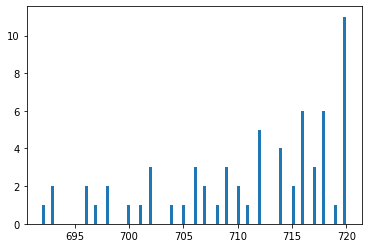

In [17]:
plt.hist([nnidx for nnidx, qidx_q_dist in found_idxs], bins=100)

## 2. Tot Distance from other keys

In [37]:
# find total distance of each key from all other keys
import torch

tot_dists = []
for i in range(game_data['key_support_size']):
    tot_dist = torch.sum(find_dotproduct(v=key_repr[i], Wv=key_repr))
    tot_dists.append(tot_dist.item())

In [20]:
decode_query_idx_to_key_properties(game_data['num_attributes'], game_data['num_attr_vals'], 10)

[array([0, 0, 0]), array([0, 2, 2])]

In [108]:
# for a query, find its closest key

print(('NNs:\n'))
nns, distances = find_nn_cos(v=query_repr[10], Wv=key_repr)
for nni, dist in zip(nns, distances):
    print(decode_key_idx(game_data['num_attributes'], game_data['num_attr_vals'], nni.item()), dist)

NNs:

torch.Size([32])
[0 0 1] tensor(0.4366, grad_fn=<UnbindBackward>)
[0 3 1] tensor(0.4296, grad_fn=<UnbindBackward>)
[0 2 2] tensor(0.4277, grad_fn=<UnbindBackward>)
[0 2 1] tensor(0.4263, grad_fn=<UnbindBackward>)
[0 0 2] tensor(0.4168, grad_fn=<UnbindBackward>)
[0 0 3] tensor(0.4166, grad_fn=<UnbindBackward>)
[0 1 1] tensor(0.4156, grad_fn=<UnbindBackward>)
[0 1 3] tensor(0.4141, grad_fn=<UnbindBackward>)
[0 3 2] tensor(0.4125, grad_fn=<UnbindBackward>)
[0 2 3] tensor(0.4031, grad_fn=<UnbindBackward>)
[0 1 2] tensor(0.3965, grad_fn=<UnbindBackward>)
[0 3 3] tensor(0.3921, grad_fn=<UnbindBackward>)
[0 0 0] tensor(0.3663, grad_fn=<UnbindBackward>)
[0 1 0] tensor(0.3535, grad_fn=<UnbindBackward>)
[0 3 0] tensor(0.3401, grad_fn=<UnbindBackward>)
[0 2 0] tensor(0.3394, grad_fn=<UnbindBackward>)
[] tensor(-0.0483, grad_fn=<UnbindBackward>)
[1 3 2] tensor(-0.0903, grad_fn=<UnbindBackward>)
[3 3 1] tensor(-0.1101, grad_fn=<UnbindBackward>)
[1 1 3] tensor(-0.1146, grad_fn=<UnbindBackward>

In [111]:
decode_query_idx_to_key_properties(game_data['num_attributes'], game_data['num_attr_vals'], 100)

[array([0, 0, 1]), array([2, 1, 0])]

In [113]:
# for a query, find its closest key

print(('NNs:\n'))
nns, distances = find_nn_cos(v=query_repr[100], Wv=key_repr)
for nni, dist in zip(nns, distances):
    print(decode_key_idx(game_data['num_attributes'], game_data['num_attr_vals'], nni.item()), dist)

NNs:

torch.Size([32])
[] tensor(0.5641, grad_fn=<UnbindBackward>)
[2 2 1] tensor(-0.2336, grad_fn=<UnbindBackward>)
[3 2 0] tensor(-0.2420, grad_fn=<UnbindBackward>)
[3 1 0] tensor(-0.2619, grad_fn=<UnbindBackward>)
[0 2 2] tensor(-0.2626, grad_fn=<UnbindBackward>)
[1 2 1] tensor(-0.2648, grad_fn=<UnbindBackward>)
[2 1 1] tensor(-0.2682, grad_fn=<UnbindBackward>)
[0 2 3] tensor(-0.2723, grad_fn=<UnbindBackward>)
[0 1 1] tensor(-0.2755, grad_fn=<UnbindBackward>)
[0 2 1] tensor(-0.2760, grad_fn=<UnbindBackward>)
[3 3 0] tensor(-0.2812, grad_fn=<UnbindBackward>)
[3 1 3] tensor(-0.2818, grad_fn=<UnbindBackward>)
[3 1 1] tensor(-0.2833, grad_fn=<UnbindBackward>)
[1 1 1] tensor(-0.2861, grad_fn=<UnbindBackward>)
[1 3 1] tensor(-0.2917, grad_fn=<UnbindBackward>)
[2 3 1] tensor(-0.2932, grad_fn=<UnbindBackward>)
[3 2 3] tensor(-0.2932, grad_fn=<UnbindBackward>)
[1 0 1] tensor(-0.2947, grad_fn=<UnbindBackward>)
[0 2 0] tensor(-0.2959, grad_fn=<UnbindBackward>)
[0 1 0] tensor(-0.3023, grad_fn=<

In [109]:
decode_query_idx_to_key_properties(game_data['num_attributes'], game_data['num_attr_vals'], 0)

[array([0, 0, 0]), array([0, 0, 0])]

In [110]:
# for a query, find its closest key

print(('NNs:\n'))
nns, distances = find_nn_cos(v=query_repr[0], Wv=key_repr)
for nni, dist in zip(nns, distances):
    print(decode_key_idx(game_data['num_attributes'], game_data['num_attr_vals'], nni.item()), dist)

NNs:

torch.Size([32])
[3 0 0] tensor(0.5009, grad_fn=<UnbindBackward>)
[0 0 1] tensor(0.4639, grad_fn=<UnbindBackward>)
[1 0 0] tensor(0.4517, grad_fn=<UnbindBackward>)
[2 0 0] tensor(0.4340, grad_fn=<UnbindBackward>)
[0 3 0] tensor(0.4205, grad_fn=<UnbindBackward>)
[0 3 1] tensor(0.4143, grad_fn=<UnbindBackward>)
[0 0 2] tensor(0.4071, grad_fn=<UnbindBackward>)
[3 1 0] tensor(0.4010, grad_fn=<UnbindBackward>)
[0 0 3] tensor(0.3993, grad_fn=<UnbindBackward>)
[2 0 3] tensor(0.3920, grad_fn=<UnbindBackward>)
[2 0 1] tensor(0.3874, grad_fn=<UnbindBackward>)
[0 2 1] tensor(0.3873, grad_fn=<UnbindBackward>)
[0 1 0] tensor(0.3853, grad_fn=<UnbindBackward>)
[0 2 0] tensor(0.3845, grad_fn=<UnbindBackward>)
[3 0 2] tensor(0.3838, grad_fn=<UnbindBackward>)
[0 3 2] tensor(0.3746, grad_fn=<UnbindBackward>)
[3 0 3] tensor(0.3704, grad_fn=<UnbindBackward>)
[0 1 2] tensor(0.3647, grad_fn=<UnbindBackward>)
[3 3 0] tensor(0.3554, grad_fn=<UnbindBackward>)
[0 3 3] tensor(0.3534, grad_fn=<UnbindBackward

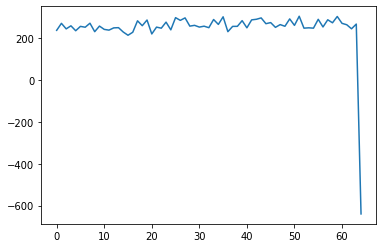

In [36]:
import matplotlib.pyplot as plt

plt.plot(tot_dists)

(array([ 1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,
         2.,  6.,  7., 15.,  9.,  7.,  4.,  7.,  6.]),
 array([-640.25964355, -630.7983197 , -621.33699585, -611.875672  ,
        -602.41434814, -592.95302429, -583.49170044, -574.03037659,
        -564.56905273, -555.10772888, -545.64640503, -536.18508118,
        -526.72375732, -517.26243347, -507.80110962, -498.33978577,
        -488.87846191, -479.41713806, -469.95581421, -460.49449036,
        -451.0331665 , -441.57184265, -432.1105188 , -422.64919495,
        -413.18787109, -40

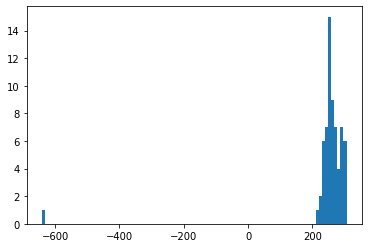

In [39]:
plt.hist(tot_dists, bins=100)

(array([ 2.,  4.,  4., 11., 13.,  7.,  7.,  3.,  7.,  6.]),
 array([214.88265991, 223.98166809, 233.08067627, 242.17968445,
        251.27869263, 260.37770081, 269.47670898, 278.57571716,
        287.67472534, 296.77373352, 305.8727417 ]),
 <BarContainer object of 10 artists>)

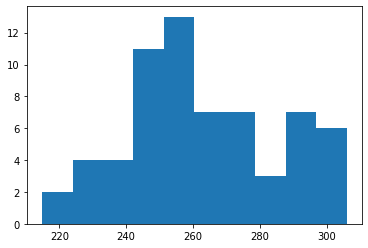

In [40]:
import numpy as np
tot_dists = np.array(tot_dists)
plt.hist(tot_dists[tot_dists > 0])

In [51]:
tot_dists

array([ 238.45913696,  271.87506104,  245.42993164,  260.02688599,
        236.49938965,  257.3888855 ,  253.29495239,  272.4972229 ,
        232.00389099,  258.79345703,  242.96878052,  239.41369629,
        250.20315552,  251.22129822,  230.32180786,  214.88265991,
        229.27253723,  284.0072937 ,  260.62112427,  287.86480713,
        221.17312622,  253.81794739,  248.79403687,  277.64880371,
        240.8290863 ,  299.15008545,  286.15914917,  297.97912598,
        258.57046509,  262.33178711,  253.95988464,  258.27462769,
        251.1204071 ,  290.22451782,  266.76916504,  303.19433594,
        231.92366028,  257.2947998 ,  257.57012939,  284.74032593,
        250.52096558,  288.45739746,  291.37405396,  297.83786011,
        270.21740723,  275.52062988,  252.66983032,  265.83908081,
        257.8770752 ,  293.08865356,  262.18978882,  305.8727417 ,
        248.84617615,  250.47850037,  248.86943054,  291.19659424,
        254.57719421,  288.9447937 ,  274.61428833,  304.68823

In [30]:
tot_dists[tot_dists > 0].shape

(64,)

In [46]:
import matplotlib.pyplot as plt

def visualize_pca_comps_heatmap(plot, comps):
    heatmap = plot.pcolor(comps, cmap=plt.cm.Blues)
    
    x_lab = [i for i in range(comps.shape[1])]
    y_lab = [i for i in (range(comps.shape[0]))]
    
    plot.set_xticks(np.arange(comps.shape[1])+0.5, minor=False)
    plot.set_yticks(np.arange(comps.shape[0])+0.5, minor=False)
    
    # want a more natural, table-like display
    plot.invert_yaxis()
    
    plot.set_xticklabels(x_lab, minor=False)
    plot.set_yticklabels(y_lab, minor=False)
    
    plt.title('Heatmap of PCA components Rows: components, Cols: Original dimensions')

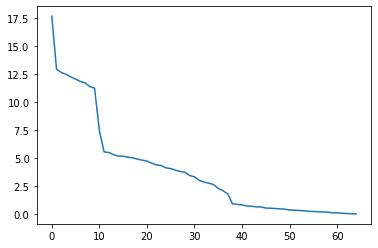

In [41]:
import matplotlib.pyplot as plt
# u,s,vh = np.linalg.svd(key_repr.detach().cpu().numpy())
u,s,vh = np.linalg.svd(key_repr.detach().cpu().numpy(), full_matrices=False)
plt.plot(s)

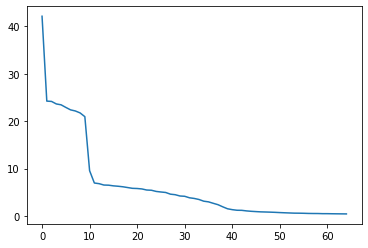

In [45]:
import matplotlib.pyplot as plt
# u,s,vh = np.linalg.svd(key_repr.detach().cpu().numpy())
u,s,vh = np.linalg.svd(query_repr.detach().cpu().numpy(), full_matrices=False)
plt.plot(s)

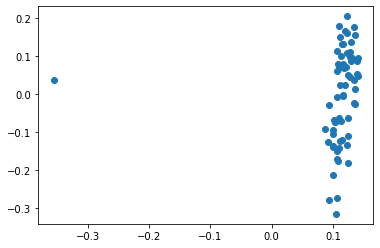

In [42]:
plt.scatter(x=u[:, :2][:, 0], y=u[:, :2][:, 1])

In [43]:
xy = np.array([(x,y) for x,y in u[:, :2] if x<0.20])
xy.shape

(65, 2)

In [57]:
u[:, :2][:, 1]

array([ 0.22078988,  0.10924666,  0.18563814,  0.12392186,  0.17197408,
        0.08582544,  0.16838823,  0.09597701,  0.09973629,  0.00745407,
        0.06210421, -0.00747301, -0.06136301, -0.15386724, -0.10807616,
       -0.15033679,  0.11044133,  0.03571075,  0.08019887,  0.04309823,
        0.0687487 ,  0.00962932,  0.03548064, -0.00456238, -0.01654907,
       -0.07242964,  0.00614518, -0.10309162, -0.14587203, -0.22545303,
       -0.16098557, -0.23124862,  0.20768031,  0.10364904,  0.21959265,
        0.1360126 ,  0.15325126,  0.07926022,  0.14984448,  0.09225575,
        0.0995938 ,  0.00360414,  0.09290974,  0.0260457 , -0.05980899,
       -0.15051258, -0.10430594, -0.13006645,  0.06876793, -0.01473717,
        0.06083595, -0.02204601,  0.01476268, -0.03479739,  0.00724397,
       -0.07851836, -0.03763692, -0.10722379, -0.0687897 , -0.10626837,
       -0.19388689, -0.28523833, -0.22238286, -0.27286613,  0.02506827],
      dtype=float32)

In [64]:
u[:, :2][:, 0]

array([-0.14596336, -0.12580568, -0.14233963, -0.1473367 , -0.13447145,
       -0.11224025, -0.1299864 , -0.13881007, -0.13671003, -0.11591635,
       -0.13570985, -0.13822246, -0.15158339, -0.12554002, -0.15583119,
       -0.15467916, -0.12931435, -0.13226219, -0.14141335, -0.13804713,
       -0.11762426, -0.10803563, -0.10958758, -0.11990121, -0.13224897,
       -0.12420168, -0.13593547, -0.13221227, -0.12786953, -0.1193848 ,
       -0.12600675, -0.1297892 , -0.11983646, -0.11408953, -0.13164744,
       -0.11886767, -0.10364595, -0.09228256, -0.11156393, -0.10423121,
       -0.11736221, -0.10516717, -0.12725008, -0.11251636, -0.12031835,
       -0.11271038, -0.12977995, -0.11988407, -0.10525286, -0.11637869,
       -0.11230299, -0.11030552, -0.09258732, -0.08778169, -0.10092937,
       -0.1014738 , -0.10981524, -0.10793624, -0.1180773 , -0.11863464,
       -0.10228605, -0.10290976, -0.11325268, -0.11218183,  0.20555463],
      dtype=float32)

In [50]:
s

array([18.257977 , 12.684859 , 12.65735  , 12.3478   , 12.181978 ,
       12.024184 , 11.731054 , 11.694291 , 11.60848  , 11.374902 ,
        8.124607 ,  5.8922873,  5.8123593,  5.673945 ,  5.4885406,
        5.3928204,  5.3252964,  5.233726 ,  5.190736 ,  5.0762115,
        5.019244 ,  4.816457 ,  4.758475 ,  4.6970215,  4.5080914,
        4.3722816,  4.2636857,  4.175525 ,  3.8675973,  3.8547313,
        3.5170536,  2.7323213], dtype=float32)

In [49]:
key_repr

tensor([[-1.1649, -0.0247,  1.9113,  ..., -0.0986,  0.3693,  0.0706],
        [-2.2030,  0.1206,  1.4701,  ...,  0.9043, -0.4772, -0.0922],
        [-0.6602, -0.4961, -0.5782,  ..., -0.4391, -0.0049, -0.4728],
        ...,
        [-0.3062, -1.4950, -0.3398,  ...,  0.1225,  1.8135, -0.4558],
        [-1.0387, -1.3608,  1.5917,  ..., -0.2459,  1.8752,  0.0055],
        [ 0.1480,  0.5214, -0.5180,  ...,  0.1075, -0.2655,  0.0189]],
       grad_fn=<SqueezeBackward1>)

In [23]:
from sklearn.decomposition import PCA

In [39]:
n_comp = 2
pca_mod = PCA(n_components = n_comp)
pca_mod.fit(key_repr.detach().cpu().numpy())

PCA(n_components=2)

In [41]:
key_repr.shape

torch.Size([65, 32])

In [28]:
p2 = plt.subplot(1, 1, 1)
visualize_pca_comps_heatmap(p2, pca_mod.components_)

NameError: name 'plt' is not defined

In [40]:
pca_mod.components_.shape

(2, 32)

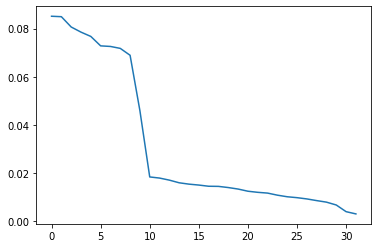

In [150]:
plt.plot(pca_mod.explained_variance_ratio_)

In [151]:
np.cumsum(pca_mod.explained_variance_ratio_)

array([0.08511802, 0.17005292, 0.25070417, 0.32922232, 0.40595284,
       0.4787677 , 0.5513392 , 0.62310666, 0.69201124, 0.7379008 ,
       0.75627124, 0.7741767 , 0.7912239 , 0.8071655 , 0.8225455 ,
       0.83754516, 0.8520529 , 0.8665054 , 0.8804722 , 0.8938138 ,
       0.90625435, 0.9182373 , 0.9299047 , 0.94071025, 0.9508547 ,
       0.9606198 , 0.9698621 , 0.97840995, 0.98631555, 0.993034  ,
       0.9969852 , 0.99999994], dtype=float32)

In [49]:
torch.tensor([1,2,3]).unsqueeze(-1).expand(3,3)

tensor([[1, 1, 1],
        [2, 2, 2],
        [3, 3, 3]])

In [50]:
torch.tensor([1,2,3]).unsqueeze(0).expand(3,3)

tensor([[1, 2, 3],
        [1, 2, 3],
        [1, 2, 3]])